In [1]:
import sys
# sys.path.insert(0,'/eos/home-a/antoniov/SWAN_projects/env/uproot4/lib/python3.7/site-packages')
# sys.path.insert(0,'/eos/home-a/antoniov/SWAN_projects/env/uproot/lib/python3.8/site-packages')
# sys.path.insert(0,'/eos/home-a/antoniov/SWAN_projects/env/uproot-py39/lib/python3.9/site-packages')
print ( sys.path )

import numpy as np
import pandas as pd
import h5py
import matplotlib as mpl
import matplotlib.pyplot as plt
import mplhep
from matplotlib.colors import LogNorm
from joblib import dump, load
plt.style.use(mplhep.style.CMS)
import matplotlib.font_manager
mpl.rcParams.update(
    {'font.size': 18,
     'font.family': 'sans-serif',
     'legend.fontsize': 14,
     'axes.labelsize': 18,
     'xtick.labelsize': 14,
     'ytick.labelsize': 14
    }
    )
# mpl.rcParams.update(
#     {'font.size': 18,
#      'font.family': 'sans-serif',
#      'font.sans-serif': ['Helvetica'],
#      'legend.fontsize': 14,
#      'axes.labelsize': 18,
#      'xtick.labelsize': 14,
#      'ytick.labelsize': 14
#     }
#     )
mpl.rcParams

['/cvmfs/sft.cern.ch/lcg/releases/condor/8.9.11-eadc8/x86_64-centos7-gcc11-opt/lib/python3', '/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/itk', '/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/python', '/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib', '', '/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages', '/srv/dask/lib', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc11-opt/lib/python39.zip', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc11-opt/lib/python3.9', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc11-opt/lib/python3.9/lib-dynload', '/eos/user/m/malvesga/.local/lib/python3.9/site-packages', '/cvmfs/sft.cern.ch/lcg/releases/Python/3.9.12-9a1bc/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages', '/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-op

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': ['-layers', 'OptimizePlus'],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': False,
          'axes.grid.axis': 'both',
   

In [164]:
# run_ranges_periods, df_run_ranges, fiducial_cuts, fiducial_cuts_all, aperture_period_map, aperture_parametrisation, check_aperture, get_data, process_data_protons_multiRP
from processing import *

# norm_to_1fb = True
norm_to_1fb = False

# lepton_type = 'muon'
lepton_type = 'electron'

# data_sample = '2017'
data_sample = '2018'

plot_separate_syst_uncertainties = False

save_figures = False

bkg_MC_mix_protons = False

# upper_mass_ratio_cut = True
upper_mass_ratio_cut = False

# run_tables = False

### Event selection

In [3]:
def tau21_ddt_calculation(df, lepton_type, label_jet=None):
    
    label_jet_ = "_nom"
    if label_jet is not None: label_jet_ = label_jet
        
    jet0_tau21_ = ( df.loc[ :, "jet0_tau2"] / df.loc[ :, "jet0_tau1"] )
    
    M_ = 0. ##M is the slope of the tau21 versus rhoprime1
    rhoprime1_ = np.log((((df.loc[ :, "jet0_corrmass" + label_jet_])**2)/(df.loc[ :, "jet0_pt" + label_jet_])))
    if lepton_type == 'muon':
        #M_ = -0.06549078537121121 
        M_ = -0.06985584011450555
    if lepton_type == 'electron':
        #M_ = -0.05984253738963618    
        M_ = -0.057877831836395534   
    jet0_tau21_ddt_ = jet0_tau21_ - (M_*rhoprime1_)
    
    return jet0_tau21_, rhoprime1_, jet0_tau21_ddt_

In [4]:
def select_events( df_events, lepton_type, max_num_tracks = 4, label_jet=None, label_muon=None, label_electron=None ):

    max_num_tracks_ = max_num_tracks
    
#     label_jet_ = "_nom"
#     label_muon_ = "_nom"
#     label_WLep_ = "_nom"
#     label_WW_ = "_nom"
    label_jet_ = "_nom"
    if label_jet is not None: label_jet_ = label_jet
        
    label_muon_ = "_nom"
    if label_muon is not None: label_muon_ = label_muon
        
    label_electron_ = "_nom"
    if label_electron is not None: label_electron_ = label_electron
        
    label_WLep_ = "_nom"
    if label_muon is not None:
        label_WLep_ = label_muon
    elif label_electron is not None:
        label_WLep_ = label_electron
        
    label_WW_ = "_nom"
    if label_jet is not None:
        label_WW_ = label_jet
    elif label_muon is not None:
        label_WW_ = label_muon
    elif label_electron is not None:
        label_WW_ = label_electron
        
    label_xiCMS_ = "_nom"
    if label_jet is not None:
        label_xiCMS_ = label_jet
    elif label_muon is not None:
        label_xiCMS_ = label_muon
    elif label_electron is not None:
        label_xiCMS_ = label_electron
    
    lepton_var_phi_ = ""
    lepton_var_eta_ = ""
    if lepton_type == 'muon':
        lepton_var_phi_ = "muon0_phi"
        lepton_var_eta_ = "muon0_eta"
    elif lepton_type == 'electron':
        lepton_var_phi_ = "electron0_phi"
        lepton_var_eta_ = "electron0_eta"
        
    deltaPhi_jet_lep_ = ( df_events.loc[ :, "jet0_phi"] - df_events.loc[ :, lepton_var_phi_ ] )
    msk_dphi_ = ( deltaPhi_jet_lep_ < -np.pi )
    deltaPhi_jet_lep_.loc[ msk_dphi_ ] = deltaPhi_jet_lep_.loc[ msk_dphi_ ] + 2*np.pi
    msk_dphi_ = ( deltaPhi_jet_lep_ >= np.pi )
    deltaPhi_jet_lep_.loc[ msk_dphi_ ] = deltaPhi_jet_lep_.loc[ msk_dphi_ ] - 2*np.pi
    
    deltaEta_jet_lep_ = ( df_events.loc[ :, "jet0_eta"] - df_events.loc[ :, lepton_var_eta_ ] )
    deltaR_jet_lep_ = np.sqrt( ( deltaPhi_jet_lep_ ) ** 2 + ( deltaEta_jet_lep_ ) ** 2 )
    
    deltaPhi_jet_met_ = ( df_events.loc[ :, "jet0_phi"] - df_events.loc[ :, "met_phi"] )
    msk_dphi_ = ( deltaPhi_jet_met_ < -np.pi )
    deltaPhi_jet_met_.loc[ msk_dphi_ ] = deltaPhi_jet_met_.loc[ msk_dphi_ ] + 2*np.pi
    msk_dphi_ = ( deltaPhi_jet_met_ >= np.pi )
    deltaPhi_jet_met_.loc[ msk_dphi_ ] = deltaPhi_jet_met_.loc[ msk_dphi_ ] - 2*np.pi
    
    deltaPhi_jet_Wlep_ = ( df_events.loc[ :, "jet0_phi"] - df_events.loc[ :, "WLeptonicPhi"] )
    msk_dphi_ = ( deltaPhi_jet_Wlep_ < -np.pi )
    deltaPhi_jet_Wlep_.loc[ msk_dphi_ ] = deltaPhi_jet_Wlep_.loc[ msk_dphi_ ] + 2*np.pi
    msk_dphi_ = ( deltaPhi_jet_Wlep_ >= np.pi )
    deltaPhi_jet_Wlep_.loc[ msk_dphi_ ] = deltaPhi_jet_Wlep_.loc[ msk_dphi_ ] - 2*np.pi
    
    jet0_tau21_, rhoprime1_, jet0_tau21_ddt_ = tau21_ddt_calculation( df_events, lepton_type )
    
    msk_All_ = np.full( df_events.shape[0], True, dtype=bool )
    
    msk_lep_ = None
    if lepton_type == 'muon':
        msk_lep_ = ( ( df_events.loc[ :, "muon0_pt" + label_muon_ ] >= 50.0 ) &
                     ( np.abs( df_events.loc[ :, "muon0_eta"] ) <= 2.4 ) & 
                     ( df_events.loc[ :, "muon0_iso"] <= 0.10 ) )
    elif lepton_type == 'electron':
        msk_lep_ = ( ( df_events.loc[ :, "electron0_pt" + label_electron_ ] >= 50.0 ) &
                     ( np.abs( df_events.loc[ :, "electron0_eta"] ) <= 2.4 ) )
        
#     msk_jet_ = ( ( df_events.loc[ :, "jet0_pt" + label_jet_] >= 200.0 ) &
#                  ( np.abs( df_events.loc[ :, "jet0_eta"] ) <= 2.4 ) )
    msk_jet_ = ( ( df_events.loc[ :, "jet0_pt" + label_jet_] >= 220.0 ) &
                 ( np.abs( df_events.loc[ :, "jet0_eta"] ) <= 2.4 ) )
    
    msk_jet_lep_ = ( deltaR_jet_lep_ >= np.pi/2 )
    
    if lepton_type == 'muon':
        msk_met_ = ( df_events.loc[ :, "met"] >= 40.0 )
    elif lepton_type == 'electron':
        msk_met_ = ( df_events.loc[ :, "met"] >= 100.0 )  
    
    msk_jet_met_ = ( np.abs( deltaPhi_jet_met_ ) >= 2.0 )

    msk_pruned_mass_ = ( ( df_events.loc[ :, "jet0_corrmass" + label_jet_] >= 50.0 ) &
                         ( df_events.loc[ :, "jet0_corrmass" + label_jet_] <= 110.0 ) )

    msk_tau21_       = ( jet0_tau21_ddt_ <= 0.7 )
#     msk_tau21_       = ( jet0_tau21_ <= 0.6 )
    
    
    msk_bjet_veto_   = ( df_events.loc[ :, "num_bjets_ak4"] == 0 )
    
#     msk_xiCMS_ = msk_All_.copy()
    msk_xiCMS_       = ( ( df_events.loc[ :, "xiCMS_45" + label_xiCMS_ ] <= 0.20 ) & ( df_events.loc[ :, "xiCMS_56" + label_xiCMS_ ] <= 0.20 ) ) #& 
                         #( df_events.loc[ :, "R_MWW_MX" + label_xiCMS_ ] >= 0.80 ) & ( np.abs( df_events.loc[ :, "Diff_YWW_YX" + label_xiCMS_ ] <= 0.60 ) ) )
    
    msk_Wlep_ = ( df_events.loc[ :, "WLeptonicPt" + label_WLep_ ] >= 200.0 )
    
    msk_jet_Wlep_ = ( np.abs( deltaPhi_jet_Wlep_ ) >= 2.5 )
    
#     msk_MWW_ = ( df_events.loc[ :, "recoMWW"] >= 500.0 )
    msk_MWW_ = ( df_events.loc[ :, "MWW" + label_WW_ ] >= 500.0 )
    
    msk_extra_tracks_ = ( df_events.loc[ :, "pfcand_nextracks" ] <= max_num_tracks_ )
#     msk_extra_tracks_ = ( df_events.loc[ :, "pfcand_nextracks" ] <= 999 )

    msk_nprotons_ = ( ( df_events.loc[ :, "nprotons_arm0" ] <= 3 ) & ( df_events.loc[ :, "nprotons_arm1" ] <= 3 ) )
    
    masks_ = [ msk_All_, msk_lep_, msk_jet_, msk_jet_lep_, msk_met_, msk_jet_met_,
               msk_pruned_mass_, msk_tau21_, msk_bjet_veto_, msk_xiCMS_,
               msk_Wlep_, msk_jet_Wlep_, msk_MWW_, msk_extra_tracks_, msk_nprotons_ ]
    
#     masks_ = [ msk_All_, msk_lep_, msk_jet_, msk_jet_lep_, msk_met_, msk_jet_met_,
#                msk_pruned_mass_, msk_bjet_veto_, msk_xiCMS_,
#                msk_Wlep_, msk_jet_Wlep_, msk_MWW_, msk_extra_tracks_, msk_nprotons_ ]
    
    lepton_sel_name_ = ""
    jet_lepton_sel_name_ = ""
    if lepton_type == 'muon':
        lepton_sel_name_ = "Muon"
        jet_lepton_sel_name_ = "Jet_Muon"
    elif lepton_type == 'electron':
        lepton_sel_name_ = "Electron"
        jet_lepton_sel_name_ = "Jet_Electron"
        
    selection_keys_ = [ "All", lepton_sel_name_, "Jet", jet_lepton_sel_name_, "MET", "Jet_MET",
                        "PrunedMass", "Tau21", "BJet_Veto", "Xi_CMS",
                        "WLeptonic", "Jet_WLeptonic", "MWW", "ExtraTracks", "NProtons" ]
    
#     selection_keys_ = [ "All", lepton_sel_name_, "Jet", jet_lepton_sel_name_, "MET", "Jet_MET",
#                         "PrunedMass", "BJet_Veto", "Xi_CMS",
#                         "WLeptonic", "Jet_WLeptonic", "MWW", "ExtraTracks", "NProtons" ]
    
    selections_ = {}
    msk_ = masks_[ 0 ].copy()
    for idx_, key_ in enumerate( selection_keys_ ):
        msk_ = msk_ & masks_[ idx_ ]
        selections_[ key_ ] = np.sum( msk_ )
        
    df_events = df_events.loc[ msk_ ]
    
    return df_events, selection_keys_, selections_

### Signal

In [5]:
load_signal = True

labels_signals = []
if data_sample == '2017':
    if lepton_type == 'muon':
        if alpha_type == 'a0w':
#             labels_signals = [ "GGToWW-AQGC-muon-A0W1e-6", "GGToWW-AQGC-muon-A0W2e-6", "GGToWW-AQGC-muon-A0W5e-6" ]
            labels_signals = [ "GGToWW-AQGC-2017-muon-A0W1e-6", "GGToWW-AQGC-2017-muon-A0W2e-6", "GGToWW-AQGC-2017-muon-A0W5e-6" ]
    elif lepton_type == 'electron':
        if alpha_type == 'a0w':
#            labels_signals = [ "GGToWW-AQGC-electron-A0W1e-6", "GGToWW-AQGC-electron-A0W2e-6", "GGToWW-AQGC-electron-A0W5e-6" ]
            labels_signals = [ "GGToWW-AQGC-2017-electron-A0W1e-6", "GGToWW-AQGC-2017-electron-A0W2e-6", "GGToWW-AQGC-2017-electron-A0W5e-6" ]
elif data_sample == '2018':
    if lepton_type == 'muon':
        labels_signals = [ "GGToWW-AQGC-2018-muon-A0W1e-7", "GGToWW-AQGC-2018-muon-A0W2e-7", 
                           "GGToWW-AQGC-2018-muon-A0W1e-6", "GGToWW-AQGC-2018-muon-A0W2e-6", "GGToWW-AQGC-2018-muon-A0W5e-6", 
                           "GGToWW-AQGC-2018-muon-ACW5e-7", "GGToWW-AQGC-2018-muon-ACW5e-6", "GGToWW-AQGC-2018-muon-ACW8e-6", "GGToWW-AQGC-2018-muon-ACW2e-5" ]
    elif lepton_type == 'electron':
        labels_signals = [ "GGToWW-AQGC-2018-electron-A0W1e-7", "GGToWW-AQGC-2018-electron-A0W2e-7", 
                           "GGToWW-AQGC-2018-electron-A0W1e-6", "GGToWW-AQGC-2018-electron-A0W2e-6", "GGToWW-AQGC-2018-electron-A0W5e-6", 
                           "GGToWW-AQGC-2018-electron-ACW5e-7", "GGToWW-AQGC-2018-electron-ACW5e-6", "GGToWW-AQGC-2018-electron-ACW8e-6", "GGToWW-AQGC-2018-electron-ACW2e-5" ]
        # labels_signals[:3] - a0w
        # labels_signals[3:] - aCw
            
    
    
df_counts_signals = {}
df_signals_protons_multiRP_index = {}
df_signals_protons_multiRP_events = {}
if load_signal:
#     base_path_ = "output"
    base_path_ = "output-final"
    #base_path_ = "output_new"
    for label_ in labels_signals:
        print ( label_ )
        file_path_ = "{}/data-store-{}.h5".format( base_path_, label_ )
        with pd.HDFStore( file_path_, 'r' ) as store_:
            print ( list( store_ ) )           
            df_counts_signals[ label_ ] = store_[ "counts" ]
            df_signals_protons_multiRP_index[ label_ ] = store_[ "protons_multiRP" ]
            df_signals_protons_multiRP_events[ label_ ] = store_[ "events_multiRP" ]

GGToWW-AQGC-2018-electron-A0W1e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-A0W2e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-A0W1e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-A0W2e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-A0W5e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-ACW5e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-ACW5e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-ACW8e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-2018-electron-ACW2e-5
['/counts', '/events_multiRP', '/protons_multiRP']


In [6]:
labels_signals[5:]

['GGToWW-AQGC-2018-electron-ACW5e-7',
 'GGToWW-AQGC-2018-electron-ACW5e-6',
 'GGToWW-AQGC-2018-electron-ACW8e-6',
 'GGToWW-AQGC-2018-electron-ACW2e-5']

In [7]:
# df_signals_protons_multiRP_events[ 'GGToWW-AQGC-2017-muon-A0W1e-6' ]
# df_signals_protons_multiRP_index[ 'GGToWW-AQGC-2018-muon-A0W1e-6' ].columns.values
# df_signals_protons_multiRP_index[ 'GGToWW-AQGC-2018-muon-A0W1e-6' ][ ['pileupWeight','xi','random','arm','ismultirp', 'eff_proton_all'] ]
# df_signals_protons_multiRP_events[ 'GGToWW-AQGC-2018-muon-A0W1e-6' ]
# df_signals_protons_multiRP_events[ 'GGToWW-AQGC-2018-electron-A0W5e-7' ]

label_ref_ = ""
if data_sample == '2017':
    if lepton_type == 'muon':
        label_ref_ = 'GGToWW-AQGC-2017-muon-A0W2e-6'
    elif lepton_type == 'electron':
        label_ref_ = 'GGToWW-AQGC-2017-electron-A0W2e-6'
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ref_ = 'GGToWW-AQGC-2018-muon-A0W1e-6'
    elif lepton_type == 'electron':
        label_ref_ = 'GGToWW-AQGC-2018-electron-A0W1e-6'
      
pd.set_option('display.max_columns', None)
df_signals_protons_multiRP_events[ label_ref_ ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   43        422   12931417489219426563 0              146.0       0.4   
    45        443   1804035302496181402  0              152.0       0.4   
    62        612   1815521296983520992  0              144.0       0.4   
    121       1201  17569436976769994127 0              154.0       0.4   
    131       1310  13385357435107877852 0              130.0       0.4   
...                                                       ...       ...   
    9905      99050 14426536541701204795 0              153.0       0.4   
    9952      99515 9563208485603652804  0              130.0       0.4   
    9959      99581 1096076079944316008  0              133.0       0.4   
    9981      99809 553739187845098945   0              143.0       0.4   
    9989      99888 14368869497932049563 0              149.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   43        422   12931417489219426563 0           0.0  331.759216   
    45        443   1804035302496181402  0           0.0  453.160858   
    62        612   1815521296983520992  0           0.0  432.893616   
    121       1201  17569436976769994127 0           0.0  422.261414   
    131       1310  13385357435107877852 0           0.0  612.153870   
...                                                  ...         ...   
    9905      99050 14426536541701204795 0           0.0  733.996826   
    9952      99515 9563208485603652804  0           0.0  208.636108   
    9959      99581 1096076079944316008  0           0.0  242.842361   
    9981      99809 553739187845098945   0           0.0  771.258972   
    9989      99888 14368869497932049563 0           0.0  801.617615   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   43        422   12931417489219426563 0     -0.023301 -1.644444   
    45        443   1804035302496181402  0      0.483170  3.117945   
    62        612   1815521296983520992  0     -0.922337  2.617586   
    121       1201  17569436976769994127 0     -0.599222  0.640295   
    131       1310  13385357435107877852 0     -0.083334 -1.668640   
...                                                  ...       ...   
    9905      99050 14426536541701204795 0     -0.542128  0.240823   
    9952      99515 9563208485603652804  0     -0.947725  0.177740   
    9959      99581 1096076079944316008  0      0.157315 -1.679264   
    9981      99809 553739187845098945   0     -0.497800 -3.032743   
    9989      99888 14368869497932049563 0      0.135004  0.459812   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   43        422   12931417489219426563 0       343.426422  66.870949   
    45        443   1804035302496181402  0       514.879700  68.750031   
    62        612   1815521296983520992  0       641.409912  75.817772   
    121       1201  17569436976769994127 0       514.642578  89.523491   
    131       1310  13385357435107877852 0       624.643494  12.394755   
...                                                     ...        ...   
    9905      99050 14426536541701204795 0       853.547974  71.958977   
    9952      99515 9563208485603652804  0       313.289459  10.169263   
    9959      99581 1096076079944316008  0       260.936096  82.348602   
    9981      99809 553739187845098945   0       878.513184  76.899773   
    9989      99888 14368869497932049563 0       818.769043  33.730419   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   43        422   12931417489219426563 0          71.621078   0.238285   
    45        443   1804035302496

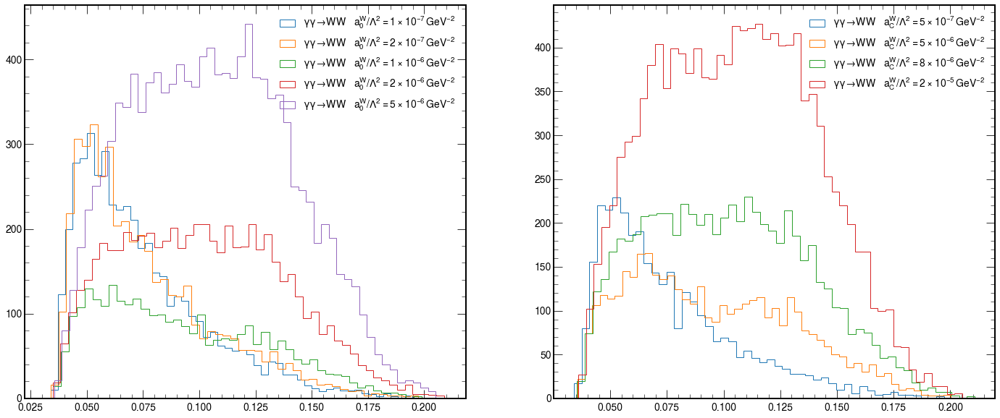

In [8]:
labels_samples = {
#     "GGToWW-AQGC-A0W5e-7": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 5 \times 10^{-7} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-A0W1e-7": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 1 \times 10^{-7} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-A0W2e-7": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 2 \times 10^{-7} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-A0W1e-6": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 1 \times 10^{-6} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-A0W2e-6": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 2 \times 10^{-6} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-A0W5e-6": r"$\gamma\gamma \to WW \quad a_0^W/\Lambda^2 = 5 \times 10^{-6} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-ACW5e-7": r"$\gamma\gamma \to WW \quad a_C^W/\Lambda^2 = 5 \times 10^{-7} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-ACW5e-6": r"$\gamma\gamma \to WW \quad a_C^W/\Lambda^2 = 5 \times 10^{-6} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-ACW8e-6": r"$\gamma\gamma \to WW \quad a_C^W/\Lambda^2 = 8 \times 10^{-6} \,\rm{GeV}^{-2}$",
    "GGToWW-AQGC-ACW2e-5": r"$\gamma\gamma \to WW \quad a_C^W/\Lambda^2 = 2 \times 10^{-5} \,\rm{GeV}^{-2}$"
}
labels_samples[ "GGToWW-AQGC-muon-A0W1e-7" ] = labels_samples[ "GGToWW-AQGC-A0W1e-7" ]
labels_samples[ "GGToWW-AQGC-muon-A0W2e-7" ] = labels_samples[ "GGToWW-AQGC-A0W2e-7" ]
labels_samples[ "GGToWW-AQGC-muon-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-muon-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-muon-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
labels_samples[ "GGToWW-AQGC-electron-A0W1e-7" ] = labels_samples[ "GGToWW-AQGC-A0W1e-7" ]
labels_samples[ "GGToWW-AQGC-electron-A0W2e-7" ] = labels_samples[ "GGToWW-AQGC-A0W2e-7" ]
labels_samples[ "GGToWW-AQGC-electron-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-electron-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-electron-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
labels_samples[ "GGToWW-AQGC-2017-muon-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-2017-muon-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-2017-muon-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
labels_samples[ "GGToWW-AQGC-2017-electron-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-2017-electron-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-2017-electron-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
# labels_samples[ "GGToWW-AQGC-2018-muon-A0W5e-7" ] = labels_samples[ "GGToWW-AQGC-A0W5e-7" ]
labels_samples[ "GGToWW-AQGC-2018-muon-A0W1e-7" ] = labels_samples[ "GGToWW-AQGC-A0W1e-7" ]
labels_samples[ "GGToWW-AQGC-2018-muon-A0W2e-7" ] = labels_samples[ "GGToWW-AQGC-A0W2e-7" ]
labels_samples[ "GGToWW-AQGC-2018-muon-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-2018-muon-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-2018-muon-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
# labels_samples[ "GGToWW-AQGC-2018-electron-A0W5e-7" ] = labels_samples[ "GGToWW-AQGC-A0W5e-7" ]
labels_samples[ "GGToWW-AQGC-2018-electron-A0W1e-7" ] = labels_samples[ "GGToWW-AQGC-A0W1e-7" ]
labels_samples[ "GGToWW-AQGC-2018-electron-A0W2e-7" ] = labels_samples[ "GGToWW-AQGC-A0W2e-7" ]
labels_samples[ "GGToWW-AQGC-2018-electron-A0W1e-6" ] = labels_samples[ "GGToWW-AQGC-A0W1e-6" ]
labels_samples[ "GGToWW-AQGC-2018-electron-A0W2e-6" ] = labels_samples[ "GGToWW-AQGC-A0W2e-6" ]
labels_samples[ "GGToWW-AQGC-2018-electron-A0W5e-6" ] = labels_samples[ "GGToWW-AQGC-A0W5e-6" ]
labels_samples[ "GGToWW-AQGC-muon-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-muon-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-muon-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-muon-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]
labels_samples[ "GGToWW-AQGC-electron-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-electron-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-electron-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-electron-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]
labels_samples[ "GGToWW-AQGC-2017-muon-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-2017-muon-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-2017-muon-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-2017-muon-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]
labels_samples[ "GGToWW-AQGC-2017-electron-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-2017-electron-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-2017-electron-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-2017-electron-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]
labels_samples[ "GGToWW-AQGC-2018-muon-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-2018-muon-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-2018-muon-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-2018-muon-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]
labels_samples[ "GGToWW-AQGC-2018-electron-ACW5e-7" ] = labels_samples[ "GGToWW-AQGC-ACW5e-7" ]
labels_samples[ "GGToWW-AQGC-2018-electron-ACW5e-6" ] = labels_samples[ "GGToWW-AQGC-ACW5e-6" ]
labels_samples[ "GGToWW-AQGC-2018-electron-ACW8e-6" ] = labels_samples[ "GGToWW-AQGC-ACW8e-6" ]
labels_samples[ "GGToWW-AQGC-2018-electron-ACW2e-5" ] = labels_samples[ "GGToWW-AQGC-ACW2e-5" ]

if load_signal:
    fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
    for label_ in labels_signals[:5]: 
        axes[0].hist( df_signals_protons_multiRP_index[ label_ ][ 'xi' ], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
    axes[0].legend( loc='best', fontsize=14 )
    
    for label_ in labels_signals[5:]: 
        axes[1].hist( df_signals_protons_multiRP_index[ label_ ][ 'xi' ], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
    axes[1].legend( loc='best', fontsize=14 )
    
#     fig = plt.figure( figsize=(12,10) )
#     for label_ in labels_signals[:3]: 
#         plt.hist( df_signals_protons_multiRP_index[ label_ ][ 'xi' ], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
#     plt.legend( loc='best', fontsize=14 )

In [9]:
for label_ in labels_signals:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_events[ label_ ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_events[ label_ ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_events[ label_ ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          97     17479515601574725755  0        0.551118
     2          102    9859977825456391346   0        0.288469
                131    12123688185258928671  0        0.663655
                151    3204937118058704277   0        0.756103
     1          96     6375901018328549561   0        0.484885
                                                        ...   
     2          147    12309760162567756755  0        0.385595
     1          35     15239520693515665070  0        0.622753
                71     8535638996173646641   0        0.368613
                90     18361125634605440667  0        0.492225
     2          121    8218993258104391022   0        0.441398
Length: 1426, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          15     9516453661323910009   0        0.613922
     2          128    11813875076318686014  0        0.274277
                137    14341460021450183943  0    

### Ouf of acceptance protons

### Signal with pileup/data protons

In [10]:
labels_signals_mix_protons = []
if data_sample == '2017':
    if lepton_type == 'muon':
#         labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-A0W1e-6", "GGToWW-AQGC-mix_protons-A0W2e-6", "GGToWW-AQGC-mix_protons-A0W5e-6" ]
#         labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-muon-A0W1e-6", "GGToWW-AQGC-mix_protons-muon-A0W2e-6", "GGToWW-AQGC-mix_protons-muon-A0W5e-6" ]
        labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-2017-muon-A0W1e-6", "GGToWW-AQGC-mix_protons-2017-muon-A0W2e-6", "GGToWW-AQGC-mix_protons-2017-muon-A0W5e-6" ]
    elif lepton_type == 'electron':
#         labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-electron-A0W1e-6", "GGToWW-AQGC-mix_protons-electron-A0W2e-6", "GGToWW-AQGC-mix_protons-electron-A0W5e-6" ]
        labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-2017-electron-A0W1e-6", "GGToWW-AQGC-mix_protons-2017-electron-A0W2e-6", "GGToWW-AQGC-mix_protons-2017-electron-A0W5e-6" ]
elif data_sample == '2018':
    if lepton_type == 'muon':
        labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-2018-muon-A0W1e-7", "GGToWW-AQGC-mix_protons-2018-muon-A0W2e-7", "GGToWW-AQGC-mix_protons-2018-muon-A0W1e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-muon-A0W2e-6", "GGToWW-AQGC-mix_protons-2018-muon-A0W5e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-muon-ACW5e-7", "GGToWW-AQGC-mix_protons-2018-muon-ACW5e-6", "GGToWW-AQGC-mix_protons-2018-muon-ACW8e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-muon-ACW2e-5" ]
    elif lepton_type == 'electron':
        labels_signals_mix_protons = [ "GGToWW-AQGC-mix_protons-2018-electron-A0W1e-7", "GGToWW-AQGC-mix_protons-2018-electron-A0W2e-7", "GGToWW-AQGC-mix_protons-2018-electron-A0W1e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-electron-A0W2e-6", "GGToWW-AQGC-mix_protons-2018-electron-A0W5e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-electron-ACW5e-7", "GGToWW-AQGC-mix_protons-2018-electron-ACW5e-6", "GGToWW-AQGC-mix_protons-2018-electron-ACW8e-6", 
                                       "GGToWW-AQGC-mix_protons-2018-electron-ACW2e-5" ]
df_counts_signals_mix_protons = {}
df_signals_protons_multiRP_mix_protons_index = {}
df_signals_protons_multiRP_mix_protons_events = {}
if load_signal:
#     base_path_ = "output"
    base_path_ = "output-final"
    #base_path_ = "output_new"
    for label_ in labels_signals_mix_protons:
        print ( label_ )
        file_path_ = "{}/data-store-{}.h5".format( base_path_, label_ )
        with pd.HDFStore( file_path_, 'r' ) as store_:
            print ( list( store_ ) )
            df_counts_signals_mix_protons[ label_ ] = store_[ "counts" ]
            df_signals_protons_multiRP_mix_protons_index[ label_ ] = store_[ "protons_multiRP" ]
            df_signals_protons_multiRP_mix_protons_events[ label_ ] = store_[ "events_multiRP" ]

GGToWW-AQGC-mix_protons-2018-electron-A0W1e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-A0W2e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-A0W1e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-A0W2e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-A0W5e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-ACW5e-7
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-ACW5e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-ACW8e-6
['/counts', '/events_multiRP', '/protons_multiRP']
GGToWW-AQGC-mix_protons-2018-electron-ACW2e-5
['/counts', '/events_multiRP', '/protons_multiRP']


In [11]:
# df_signals_protons_multiRP_mix_protons_events[ 'GGToWW-AQGC-mix_protons-2017-muon-A0W1e-6' ]
# df_signals_protons_multiRP_mix_protons_index[ 'GGToWW-AQGC-mix_protons-2018-muon-A0W1e-6' ]
# df_signals_protons_multiRP_mix_protons_events[ 'GGToWW-AQGC-mix_protons-2018-muon-A0W1e-6' ]
# df_signals_protons_multiRP_mix_protons_events[ 'GGToWW-AQGC-mix_protons-2018-electron-A0W5e-7' ]
label_ref_ = ""
if data_sample == '2017':
    if lepton_type == 'muon':
        label_ref_ = 'GGToWW-AQGC-mix_protons-2017-muon-A0W2e-6'
    elif lepton_type == 'electron':
        label_ref_ = 'GGToWW-AQGC-mix_protons-2017-electron-A0W2e-6'
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ref_ = 'GGToWW-AQGC-mix_protons-2018-muon-ACW5e-6'
#         label_ref_ = 'GGToWW-AQGC-mix_protons-2018-muon-A0W1e-6'
    elif lepton_type == 'electron':
        label_ref_ = 'GGToWW-AQGC-mix_protons-2018-electron-ACW5e-6'
#         label_ref_ = 'GGToWW-AQGC-mix_protons-2018-electron-A0W1e-6'
df_signals_protons_multiRP_mix_protons_events[ label_ref_ ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   90        897   5038207888297854712  0              131.0       0.4   
    111       1105  17746804006098502276 0              136.0       0.4   
    1253      12526 5759305128402479037  0              130.0       0.4   
    1389      13884 12078792987763648085 0              138.0       0.4   
    1468      14677 1000068772509546849  0              138.0       0.4   
...                                                       ...       ...   
    9614      96139 8617029739128159976  0              153.0       0.4   
    9788      97872 84132064576832975    0              151.0       0.4   
    9801      98002 3375528485942436065  0              152.0       0.4   
    9902      99015 123449956813332558   0              152.0       0.4   
    9978      99775 4788061453695180434  0              153.0       0.4   

                                                instLumi      jet0_pt  \
run lumiblock event hash_id              slice                          
1   90        897   5038207888297854712  0           0.0   878.724915   
    111       1105  17746804006098502276 0           0.0   406.814697   
    1253      12526 5759305128402479037  0           0.0   847.818054   
    1389      13884 12078792987763648085 0           0.0   837.604980   
    1468      14677 1000068772509546849  0           0.0   268.448517   
...                                                  ...          ...   
    9614      96139 8617029739128159976  0           0.0   560.221191   
    9788      97872 84132064576832975    0           0.0   677.293884   
    9801      98002 3375528485942436065  0           0.0   516.124451   
    9902      99015 123449956813332558   0           0.0  1187.408691   
    9978      99775 4788061453695180434  0           0.0   580.490112   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   90        897   5038207888297854712  0      0.615320 -1.175012   
    111       1105  17746804006098502276 0      0.290254  2.162067   
    1253      12526 5759305128402479037  0     -0.449527  0.642809   
    1389      13884 12078792987763648085 0      0.348575 -2.055491   
    1468      14677 1000068772509546849  0     -0.174892  0.510652   
...                                                  ...       ...   
    9614      96139 8617029739128159976  0      0.623558 -3.134527   
    9788      97872 84132064576832975    0      0.427169 -2.244329   
    9801      98002 3375528485942436065  0      1.075673 -0.974215   
    9902      99015 123449956813332558   0     -0.448877 -2.137628   
    9978      99775 4788061453695180434  0      0.071493  2.221674   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   90        897   5038207888297854712  0      1056.432617  78.419571   
    111       1105  17746804006098502276 0       434.987396  67.657249   
    1253      12526 5759305128402479037  0       940.982422  70.033546   
    1389      13884 12078792987763648085 0       896.072266  78.825333   
    1468      14677 1000068772509546849  0       277.901581   6.012397   
...                                                     ...        ...   
    9614      96139 8617029739128159976  0       682.834717  77.871590   
    9788      97872 84132064576832975    0       747.983337  62.940510   
    9801      98002 3375528485942436065  0       851.482910  68.351341   
    9902      99015 123449956813332558   0      1315.319946  20.741829   
    9978      99775 4788061453695180434  0       592.955261  79.022385   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   90        897   5038207888297854712  0          83.428986   0.132648   
    111       1105  

In [12]:
for label_ in labels_signals_mix_protons:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_mix_protons_events[ label_ ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_mix_protons_events[ label_ ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_mix_protons_events[ label_ ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          91     10099808825060534881  0        0.733096
                97     12943700295404014936  0        0.680954
     2          173    13046298744323900453  0        0.822482
                162    13255838449663261931  0        0.275354
     1          17     12819002379019328854  0        0.840296
                                                        ...   
     2          161    1317947423223522101   0        0.292915
                160    8250958834630358826   0        0.929025
                189    12402932095448997254  0        0.243226
                140    17194969272311026623  0        0.798623
                162    5124941229548952482   0        0.548664
Length: 772, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          15     9516453661323910009   0        0.613922
                45     5355196331115773876   0        0.401326
                94     17687210916238126479  0     

### Signal with event mixing (signal and pileup protons)

In [13]:
df_signals_protons_multiRP_sig_plus_mix_2protons_events = {}
df_signals_protons_multiRP_sig_plus_mix_events_categories = {}
# base_path_ = "output"
base_path_ = "output-final"
#base_path_ = "output_new"
for label_ in labels_signals:
    print ( label_ )
    file_path_ = "{}/data-store-signal-plus-mix-events-{}.h5".format( base_path_, label_ )
    with pd.HDFStore( file_path_, 'r' ) as store_:
        df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ] = store_[ "/events_multiRP/all" ]
        df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ] = {}
        for key_ in [ '2protons_sig', '1proton_sig_Arm0', '1proton_sig_Arm1', '2protons_mix' ]:
            print ( key_ )
            df_protons_multiRP_events__ = store_[ "events_multiRP/{}".format( key_ ) ]
            df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ key_ ] = df_protons_multiRP_events__

GGToWW-AQGC-2018-electron-A0W1e-7
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-A0W2e-7
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-A0W1e-6
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-A0W2e-6
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-A0W5e-6
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-ACW5e-7
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-ACW5e-6
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-ACW8e-6
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix
GGToWW-AQGC-2018-electron-ACW2e-5
2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix


In [14]:
label_ = ""
coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
# columns__ = df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ].columns.values
# columns_electron__ = columns__[ [ key_.find( "electron" ) >= 0 for key_ in columns__ ] ]
# df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ][ columns_electron__ ]
df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   3         26    5295551105785649803  0              156.0       0.4   
    4         31    4444280190647120594  0              153.0       0.4   
    9         90    16261225848548686295 0              138.0       0.4   
    15        148   13518345543892601911 0              131.0       0.4   
    39        389   3504033555923613818  0              141.0       0.4   
...                                                       ...       ...   
    9977      99762 2539753704851254662  0              130.0       0.4   
    9978      99776 1704577044421806703  0              153.0       0.4   
    9981      99809 553739187845098945   0              143.0       0.4   
    9985      99849 10789223939298318063 0              150.0       0.4   
    9989      99888 14368869497932049563 0              149.0       0.4   

                                                instLumi      jet0_pt  \
run lumiblock event hash_id              slice                          
1   3         26    5295551105785649803  0           0.0   267.685486   
    4         31    4444280190647120594  0           0.0   373.997894   
    9         90    16261225848548686295 0           0.0   234.997055   
    15        148   13518345543892601911 0           0.0   890.773987   
    39        389   3504033555923613818  0           0.0   844.864685   
...                                                  ...          ...   
    9977      99762 2539753704851254662  0           0.0   203.891418   
    9978      99776 1704577044421806703  0           0.0  1016.179443   
    9981      99809 553739187845098945   0           0.0   771.258972   
    9985      99849 10789223939298318063 0           0.0   457.058655   
    9989      99888 14368869497932049563 0           0.0   801.617615   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   3         26    5295551105785649803  0      1.305726 -2.016188   
    4         31    4444280190647120594  0      1.823478  2.057920   
    9         90    16261225848548686295 0     -1.318465 -2.278204   
    15        148   13518345543892601911 0     -0.444707 -1.166298   
    39        389   3504033555923613818  0      0.166990 -0.320796   
...                                                  ...       ...   
    9977      99762 2539753704851254662  0     -1.701996 -0.245177   
    9978      99776 1704577044421806703  0     -0.184600  2.913810   
    9981      99809 553739187845098945   0     -0.497800 -3.032743   
    9985      99849 10789223939298318063 0      0.164953 -2.242678   
    9989      99888 14368869497932049563 0      0.135004  0.459812   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   3         26    5295551105785649803  0       536.319763  37.740273   
    4         31    4444280190647120594  0      1192.937134  75.115562   
    9         90    16261225848548686295 0       478.472778  77.258057   
    15        148   13518345543892601911 0       990.301147  76.589851   
    39        389   3504033555923613818  0       865.143799  77.467377   
...                                                     ...        ...   
    9977      99762 2539753704851254662  0       579.933289  26.373701   
    9978      99776 1704577044421806703  0      1042.272217  70.615547   
    9981      99809 553739187845098945   0       878.513184  76.899773   
    9985      99849 10789223939298318063 0       474.612213  83.305984   
    9989      99888 14368869497932049563 0       818.769043  33.730419   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   3         26    5295551105785649803  0          42.664261   0.263533   
    4         31    

In [15]:
for label_ in labels_signals:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          1      1061846086193566925   0        0.424073
                       5476240700940389445   0        0.318430
                       5596267071880997714   0        0.728145
                       12465908442340849666  0        0.748287
                       15711332690064458564  0        0.520148
                                                        ...   
     3          235    4881679509683412975   0        0.317118
                       13231534278945644493  0        0.904610
                236    7215492072602195952   0        0.590818
                       11694006265754320328  0        0.497518
                       12768489098376469478  0        0.432646
Length: 1948, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          1      2315912202342920882   0        0.556645
                       2732887127287119276   0        0.406471
                       5500510640250552248   0    

In [16]:
for label_ in labels_signals:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_sig' ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_sig' ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_sig' ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          1      5596267071880997714   0        0.728145
                       12465908442340849666  0        0.748287
                       15711332690064458564  0        0.520148
                2      2997175456485453802   0        0.432009
                       4343815400272896403   0        0.572300
                                                        ...   
     3          234    8520006197368396244   0        0.489524
                       16858628562041651327  0        0.821244
                235    4881679509683412975   0        0.317118
                       13231534278945644493  0        0.904610
                236    11694006265754320328  0        0.497518
Length: 929, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          1      2315912202342920882   0        0.556645
                       6805789949274217725   0        0.427756
                       14636501947716831861  0     

In [17]:
df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_sig' ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   6         55    15367153175347676948 0              135.0       0.4   
              57    2498961064633226100  0              135.0       0.4   
    11        108   4581829849096314939  0              136.0       0.4   
    30        300   13573933539580841793 0              130.0       0.4   
    37        362   17187848300455272225 0              148.0       0.4   
...                                                       ...       ...   
    9980      99798 10416621038505258968 0              148.0       0.4   
    9989      99883 14481349139263961723 0              158.0       0.4   
    9990      99893 6477572281101350437  0              130.0       0.4   
    9991      99907 13068688468499022672 0              130.0       0.4   
    9997      99968 7945346947425990805  0              152.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   6         55    15367153175347676948 0           0.0  474.052277   
              57    2498961064633226100  0           0.0  661.893982   
    11        108   4581829849096314939  0           0.0  345.031525   
    30        300   13573933539580841793 0           0.0  583.551575   
    37        362   17187848300455272225 0           0.0  451.154236   
...                                                  ...         ...   
    9980      99798 10416621038505258968 0           0.0  761.349304   
    9989      99883 14481349139263961723 0           0.0  235.876205   
    9990      99893 6477572281101350437  0           0.0  278.004578   
    9991      99907 13068688468499022672 0           0.0  468.685913   
    9997      99968 7945346947425990805  0           0.0  355.994293   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   6         55    15367153175347676948 0     -1.317090  2.534670   
              57    2498961064633226100  0     -0.363552  1.665266   
    11        108   4581829849096314939  0      0.481115  0.418560   
    30        300   13573933539580841793 0     -0.345617  0.685024   
    37        362   17187848300455272225 0      0.153344 -0.552540   
...                                                  ...       ...   
    9980      99798 10416621038505258968 0     -0.607524  2.398993   
    9989      99883 14481349139263961723 0      0.969713  1.620992   
    9990      99893 6477572281101350437  0      1.184414 -0.529623   
    9991      99907 13068688468499022672 0     -0.316082 -2.898776   
    9997      99968 7945346947425990805  0      0.378774 -0.082986   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   6         55    15367153175347676948 0       953.831055  70.357239   
              57    2498961064633226100  0       714.730408  13.185953   
    11        108   4581829849096314939  0       398.713074  96.054359   
    30        300   13573933539580841793 0       626.276184  70.320793   
    37        362   17187848300455272225 0       469.421021  84.980858   
...                                                     ...        ...   
    9980      99798 10416621038505258968 0       913.041992  61.432053   
    9989      99883 14481349139263961723 0       367.714050  69.745132   
    9990      99893 6477572281101350437  0       506.528229  82.604553   
    9991      99907 13068688468499022672 0       505.676971  76.244751   
    9997      99968 7945346947425990805  0       390.082214  14.289976   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   6         55    15367153175347676948 0          79.086884   0.185537   
              57    2498961064633

In [18]:
for label_ in labels_signals:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '1proton_sig_Arm0' ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '1proton_sig_Arm0' ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '1proton_sig_Arm0' ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          1      1061846086193566925   0        0.424073
                       15778935082947705477  0        0.367666
                2      1331212519835603427   0        0.386906
                       17421102738273248698  0        0.349097
                4      1221625328510812400   0        0.298916
                                                        ...   
     3          226    16406283501180735675  0        0.206608
                229    7205225536778726197   0        0.814432
                231    9641705791847807764   0        0.326443
                236    7215492072602195952   0        0.590818
                       12768489098376469478  0        0.432646
Length: 408, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          1      5500510640250552248   0        0.674530
                       10423583334559411285  0        0.405148
                       10775070044933023493  0     

In [19]:
df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '1proton_sig_Arm0' ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   2         17    12020326242457344212 0              152.0       0.4   
              20    15639222329894936199 0              152.0       0.4   
    3         29    4019830519632298978  0              156.0       0.4   
    9         90    17755089926066527443 0              138.0       0.4   
    18        178   11325313320395119117 0              131.0       0.4   
...                                                       ...       ...   
    9957      99563 12658534930264722713 0              144.0       0.4   
    9973      99723 4200164746889366973  0              130.0       0.4   
    9974      99733 16417873123682033969 0              130.0       0.4   
    9992      99911 7640023138966819325  0              142.0       0.4   
    9997      99969 9397720669843895082  0              152.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   2         17    12020326242457344212 0           0.0  451.618317   
              20    15639222329894936199 0           0.0  850.688416   
    3         29    4019830519632298978  0           0.0  223.055771   
    9         90    17755089926066527443 0           0.0  507.775055   
    18        178   11325313320395119117 0           0.0  347.091278   
...                                                  ...         ...   
    9957      99563 12658534930264722713 0           0.0  469.875305   
    9973      99723 4200164746889366973  0           0.0  880.039490   
    9974      99733 16417873123682033969 0           0.0  590.451416   
    9992      99911 7640023138966819325  0           0.0  565.716919   
    9997      99969 9397720669843895082  0           0.0  560.159302   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   2         17    12020326242457344212 0     -1.345199  0.690232   
              20    15639222329894936199 0      0.005423 -3.003112   
    3         29    4019830519632298978  0     -2.285729 -1.268031   
    9         90    17755089926066527443 0      1.032652 -0.007555   
    18        178   11325313320395119117 0     -0.115753  1.798997   
...                                                  ...       ...   
    9957      99563 12658534930264722713 0     -0.550238 -2.170146   
    9973      99723 4200164746889366973  0     -0.893195  2.936273   
    9974      99733 16417873123682033969 0     -1.128964  1.109486   
    9992      99911 7640023138966819325  0      0.305169  0.623262   
    9997      99969 9397720669843895082  0     -0.484972  1.982308   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   2         17    12020326242457344212 0       932.384033  69.023430   
              20    15639222329894936199 0       861.167297  80.445923   
    3         29    4019830519632298978  0      1109.456543   6.429068   
    9         90    17755089926066527443 0       812.745911  76.892982   
    18        178   11325313320395119117 0       362.075439  72.092773   
...                                                     ...        ...   
    9957      99563 12658534930264722713 0       554.215332  93.554634   
    9973      99723 4200164746889366973  0      1258.937500  15.405299   
    9974      99733 16417873123682033969 0      1014.703796  34.417732   
    9992      99911 7640023138966819325  0       605.908264  50.289902   
    9997      99969 9397720669843895082  0       636.136292  16.489346   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   2         17    12020326242457344212 0          77.622925   0.161286   
              20    1563922232989

In [20]:
df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '1proton_sig_Arm1' ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   2         16    14101489936415265305 0              152.0       0.4   
    5         44    8799150405981121628  0              130.0       0.4   
    13        129   15182683151036457208 0              148.0       0.4   
    16        152   11807392722897536886 0              148.0       0.4   
              154   5675288630112345918  0              148.0       0.4   
...                                                       ...       ...   
    9962      99613 5610636758689444560  0              144.0       0.4   
    9966      99657 17408987615363899193 0              138.0       0.4   
    9975      99741 4294273673216290392  0              153.0       0.4   
    9980      99794 11364213157555101033 0              148.0       0.4   
    9982      99820 14181733189508189573 0              150.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   2         16    14101489936415265305 0           0.0  910.412415   
    5         44    8799150405981121628  0           0.0  711.962952   
    13        129   15182683151036457208 0           0.0  609.905518   
    16        152   11807392722897536886 0           0.0  972.997070   
              154   5675288630112345918  0           0.0  772.164551   
...                                                  ...         ...   
    9962      99613 5610636758689444560  0           0.0  476.405243   
    9966      99657 17408987615363899193 0           0.0  837.454041   
    9975      99741 4294273673216290392  0           0.0  895.953064   
    9980      99794 11364213157555101033 0           0.0  802.402283   
    9982      99820 14181733189508189573 0           0.0  659.818298   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   2         16    14101489936415265305 0      0.930748 -2.325594   
    5         44    8799150405981121628  0      0.940146 -0.685340   
    13        129   15182683151036457208 0      1.460933  1.306602   
    16        152   11807392722897536886 0      0.405160 -1.115854   
              154   5675288630112345918  0      0.221623  3.093819   
...                                                  ...       ...   
    9962      99613 5610636758689444560  0      0.414201  3.010822   
    9966      99657 17408987615363899193 0      0.253765 -1.445699   
    9975      99741 4294273673216290392  0      0.061679 -1.341179   
    9980      99794 11364213157555101033 0      0.579125 -2.534649   
    9982      99820 14181733189508189573 0      0.738229 -1.708685   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   2         16    14101489936415265305 0      1341.470093  79.722801   
    5         44    8799150405981121628  0      1059.818726  92.094536   
    13        129   15182683151036457208 0      1390.801758  76.275429   
    16        152   11807392722897536886 0      1064.207153  71.347786   
              154   5675288630112345918  0       801.219238  14.644235   
...                                                     ...        ...   
    9962      99613 5610636758689444560  0       527.021790  10.388255   
    9966      99657 17408987615363899193 0       873.586670  76.591766   
    9975      99741 4294273673216290392  0       907.399963  19.786594   
    9980      99794 11364213157555101033 0       951.149353  74.983513   
    9982      99820 14181733189508189573 0       858.351868  71.801392   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   2         16    14101489936415265305 0          86.035889   0.122565   
    5         44    8799150405981

In [21]:
for label_ in labels_signals:
    jet0_tau21, rhoprime1, jet0_tau21_ddt = tau21_ddt_calculation(df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ], lepton_type)
    print(jet0_tau21)
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ][ "jet0_tau21" ] = jet0_tau21
    df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ][ "jet0_tau21_ddt" ] = jet0_tau21_ddt

run  lumiblock  event  hash_id               slice
1    1          1      5476240700940389445   0        0.318430
                3      185422920713823115    0        0.309109
                       7381473949872608792   0        0.372843
                       8190044986577608693   0        0.740843
                5      14212709488993128205  0        0.834035
                                                        ...   
     3          219    12379396428916023222  0        0.589251
                220    7902840039615639660   0        0.455084
                224    11876136736335703480  0        0.247035
                227    5597838742029814199   0        0.472329
                228    58497731470926769     0        0.508690
Length: 235, dtype: float32
run  lumiblock  event  hash_id               slice
1    1          2      16636543566334931251  0        0.543710
                3      387351211842859975    0        0.466691
                4      1354916023937907504   0     

In [22]:
df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   8         75    1077254149901980222  0              130.0       0.4   
    10        97    5412835130487364087  0              130.0       0.4   
    14        132   8740278853250694150  0              153.0       0.4   
              139   1199301852817518669  0              153.0       0.4   
    18        171   2161978226340937455  0              131.0       0.4   
...                                                       ...       ...   
    9981      99802 3126139687844784113  0              130.0       0.4   
    9985      99842 10211619100997664001 0              149.0       0.4   
              99847 11303113316633621290 0              149.0       0.4   
    9988      99877 11797372670700145920 0              131.0       0.4   
    10000     99991 5689853365831924014  0              157.0       0.4   

                                                instLumi      jet0_pt  \
run lumiblock event hash_id              slice                          
1   8         75    1077254149901980222  0           0.0   897.504944   
    10        97    5412835130487364087  0           0.0  1038.793091   
    14        132   8740278853250694150  0           0.0   375.142151   
              139   1199301852817518669  0           0.0   940.225769   
    18        171   2161978226340937455  0           0.0   795.161743   
...                                                  ...          ...   
    9981      99802 3126139687844784113  0           0.0   605.838318   
    9985      99842 10211619100997664001 0           0.0  1211.812012   
              99847 11303113316633621290 0           0.0   826.212463   
    9988      99877 11797372670700145920 0           0.0   827.777161   
    10000     99991 5689853365831924014  0           0.0   762.760986   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   8         75    1077254149901980222  0     -0.101533  1.831265   
    10        97    5412835130487364087  0      0.641206 -0.964877   
    14        132   8740278853250694150  0      1.858923  0.519336   
              139   1199301852817518669  0     -0.833901 -1.078945   
    18        171   2161978226340937455  0      0.483992  0.584271   
...                                                  ...       ...   
    9981      99802 3126139687844784113  0      0.296987 -1.388156   
    9985      99842 10211619100997664001 0     -0.109753 -1.504685   
              99847 11303113316633621290 0      0.440985  2.931540   
    9988      99877 11797372670700145920 0      0.637618 -2.327368   
    10000     99991 5689853365831924014  0      0.032565  0.286969   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   8         75    1077254149901980222  0       909.547119  47.131844   
    10        97    5412835130487364087  0      1268.809448  72.784622   
    14        132   8740278853250694150  0      1237.465942  80.934708   
              139   1199301852817518669  0      1294.697510  49.661339   
    18        171   2161978226340937455  0       898.725464  87.981598   
...                                                     ...        ...   
    9981      99802 3126139687844784113  0       644.244263  74.149483   
    9985      99842 10211619100997664001 0      1226.702759  72.852684   
              99847 11303113316633621290 0       913.718628  67.437309   
    9988      99877 11797372670700145920 0      1008.395691  65.425934   
    10000     99991 5689853365831924014  0       770.913269  72.826485   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   8         75    1077254149901980222  0          50.083866   0.089513   
    10        97    

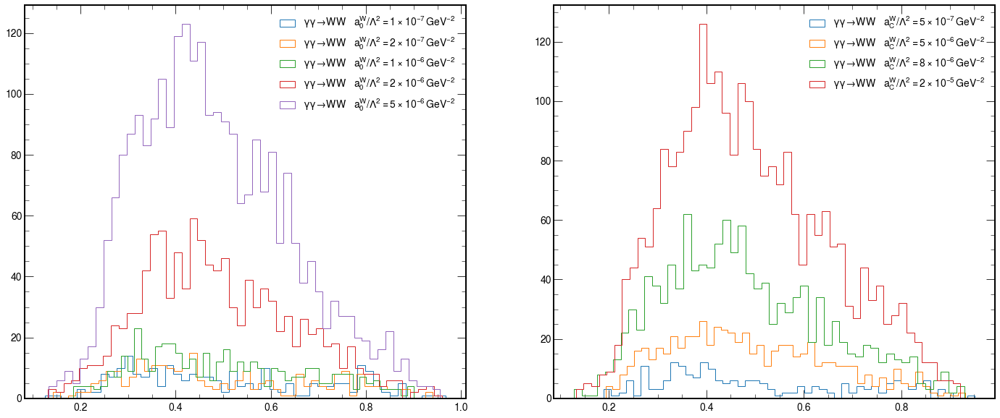

In [23]:
fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
for label_ in labels_signals[:5]: 
    axes[0].hist( df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ]["jet0_tau21"], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
axes[0].legend( loc='best', fontsize=14 )
    
for label_ in labels_signals[5:]: 
    axes[1].hist( df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ]["jet0_tau21"], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
axes[1].legend( loc='best', fontsize=14 )

# fig = plt.figure( figsize=(12,10) )
# for label_ in labels_signals:
#     plt.plt.hist( df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ '2protons_mix' ]["jet0_tau21"], histtype='step', density=False, bins=50, label=labels_samples[ label_ ] )
# plt.legend( loc='best', fontsize=14 )

### Select events (signal)

In [24]:
df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events = {}
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories = {}

variations_ = { "jet": [ "_jes_up", "_jes_dw", "_jer_up", "_jer_dw" ] }
for label_ in labels_signals:
    print ( label_ )
    df_events__ = df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ]
    print ( df_events__.shape[0] )
#     df_selected_events__, selection_keys__, selections__  = select_events( df_events__ )
    df_selected_events__, selection_keys__, selections__  = select_events( df_events__, lepton_type )
    print ( df_selected_events__.shape[0] )
    print ( selection_keys__ )
    print ( selections__ )
    df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ] = {}
    df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "_nom" ] = df_selected_events__
    for var_label__ in variations_:
        print ( var_label__ )
        for variation__ in variations_[ var_label__ ]:
            opt__ = { "label_" + var_label__ : variation__ }
            print ( opt__ )
            df_selected_events__, selection_keys__, selections__  = select_events( df_events__, lepton_type, **opt__ )
            print ( df_selected_events__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ )
            df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ variation__ ] = df_selected_events__
            
    df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ] = {}
    for cat__ in df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ]:
        print ( cat__ )
        df_events__ = df_signals_protons_multiRP_sig_plus_mix_events_categories[ label_ ][ cat__ ]
        print ( df_events__.shape[0] )
        df_selected_events__, selection_keys__, selections__  = select_events( df_events__, lepton_type )
        print ( df_selected_events__.shape[0] )
        print ( selection_keys__ )
        print ( selections__ )
        df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ] = {}
        df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ "_nom" ] = df_selected_events__
        for var_label__ in variations_:
            print ( var_label__ )
            for variation__ in variations_[ var_label__ ]:
                opt__ = { "label_" + var_label__ : variation__ }
                print ( opt__ )
                df_selected_events__, selection_keys__, selections__  = select_events( df_events__, lepton_type, **opt__ )
                print ( df_selected_events__.shape[0] )
                print ( selection_keys__ )
                print ( selections__ )
                df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ variation__ ] = df_selected_events__

GGToWW-AQGC-2018-electron-A0W1e-7
1948
343
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1948, 'Electron': 1948, 'Jet': 1593, 'Jet_Electron': 1593, 'MET': 889, 'Jet_MET': 888, 'PrunedMass': 649, 'Tau21': 550, 'BJet_Veto': 549, 'Xi_CMS': 543, 'WLeptonic': 516, 'Jet_WLeptonic': 516, 'MWW': 499, 'ExtraTracks': 356, 'NProtons': 343}
jet
{'label_jet': '_jes_up'}
343
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1948, 'Electron': 1948, 'Jet': 1634, 'Jet_Electron': 1634, 'MET': 902, 'Jet_MET': 901, 'PrunedMass': 653, 'Tau21': 553, 'BJet_Veto': 552, 'Xi_CMS': 544, 'WLeptonic': 515, 'Jet_WLeptonic': 515, 'MWW': 498, 'ExtraTracks': 356, 'NProtons': 343}
{'label_jet': '_jes_dw'}
343
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Je

47
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 235, 'Electron': 235, 'Jet': 204, 'Jet_Electron': 204, 'MET': 122, 'Jet_MET': 121, 'PrunedMass': 89, 'Tau21': 70, 'BJet_Veto': 70, 'Xi_CMS': 68, 'WLeptonic': 66, 'Jet_WLeptonic': 66, 'MWW': 66, 'ExtraTracks': 48, 'NProtons': 47}
jet
{'label_jet': '_jes_up'}
46
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 235, 'Electron': 235, 'Jet': 208, 'Jet_Electron': 208, 'MET': 122, 'Jet_MET': 121, 'PrunedMass': 87, 'Tau21': 68, 'BJet_Veto': 68, 'Xi_CMS': 65, 'WLeptonic': 63, 'Jet_WLeptonic': 63, 'MWW': 63, 'ExtraTracks': 47, 'NProtons': 46}
{'label_jet': '_jes_dw'}
49
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', '

82
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 397, 'Electron': 397, 'Jet': 309, 'Jet_Electron': 309, 'MET': 180, 'Jet_MET': 179, 'PrunedMass': 129, 'Tau21': 110, 'BJet_Veto': 110, 'Xi_CMS': 110, 'WLeptonic': 107, 'Jet_WLeptonic': 107, 'MWW': 105, 'ExtraTracks': 83, 'NProtons': 82}
{'label_jet': '_jer_up'}
83
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 397, 'Electron': 397, 'Jet': 325, 'Jet_Electron': 325, 'MET': 186, 'Jet_MET': 185, 'PrunedMass': 132, 'Tau21': 112, 'BJet_Veto': 112, 'Xi_CMS': 112, 'WLeptonic': 109, 'Jet_WLeptonic': 109, 'MWW': 106, 'ExtraTracks': 84, 'NProtons': 83}
{'label_jet': '_jer_dw'}
83
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLe

156
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 409, 'Electron': 409, 'Jet': 385, 'Jet_Electron': 385, 'MET': 280, 'Jet_MET': 277, 'PrunedMass': 226, 'Tau21': 208, 'BJet_Veto': 208, 'Xi_CMS': 198, 'WLeptonic': 198, 'Jet_WLeptonic': 198, 'MWW': 198, 'ExtraTracks': 157, 'NProtons': 156}
2protons_mix
434
136
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 434, 'Electron': 434, 'Jet': 411, 'Jet_Electron': 411, 'MET': 335, 'Jet_MET': 333, 'PrunedMass': 242, 'Tau21': 211, 'BJet_Veto': 211, 'Xi_CMS': 180, 'WLeptonic': 179, 'Jet_WLeptonic': 179, 'MWW': 179, 'ExtraTracks': 139, 'NProtons': 136}
jet
{'label_jet': '_jes_up'}
137
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', '

390
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1117, 'Electron': 1117, 'Jet': 1096, 'Jet_Electron': 1096, 'MET': 922, 'Jet_MET': 913, 'PrunedMass': 716, 'Tau21': 616, 'BJet_Veto': 616, 'Xi_CMS': 537, 'WLeptonic': 537, 'Jet_WLeptonic': 537, 'MWW': 537, 'ExtraTracks': 398, 'NProtons': 390}
{'label_jet': '_jer_up'}
387
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1117, 'Electron': 1117, 'Jet': 1099, 'Jet_Electron': 1099, 'MET': 923, 'Jet_MET': 914, 'PrunedMass': 717, 'Tau21': 616, 'BJet_Veto': 616, 'Xi_CMS': 533, 'WLeptonic': 533, 'Jet_WLeptonic': 533, 'MWW': 533, 'ExtraTracks': 395, 'NProtons': 387}
{'label_jet': '_jer_dw'}
387
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto',

949
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2563, 'Electron': 2563, 'Jet': 2546, 'Jet_Electron': 2546, 'MET': 2170, 'Jet_MET': 2140, 'PrunedMass': 1708, 'Tau21': 1495, 'BJet_Veto': 1495, 'Xi_CMS': 1272, 'WLeptonic': 1272, 'Jet_WLeptonic': 1272, 'MWW': 1271, 'ExtraTracks': 970, 'NProtons': 949}
jet
{'label_jet': '_jes_up'}
939
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2563, 'Electron': 2563, 'Jet': 2549, 'Jet_Electron': 2549, 'MET': 2170, 'Jet_MET': 2140, 'PrunedMass': 1707, 'Tau21': 1495, 'BJet_Veto': 1495, 'Xi_CMS': 1255, 'WLeptonic': 1255, 'Jet_WLeptonic': 1255, 'MWW': 1254, 'ExtraTracks': 960, 'NProtons': 939}
{'label_jet': '_jes_dw'}
959
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

39
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 213, 'Electron': 213, 'Jet': 177, 'Jet_Electron': 177, 'MET': 92, 'Jet_MET': 91, 'PrunedMass': 71, 'Tau21': 63, 'BJet_Veto': 63, 'Xi_CMS': 59, 'WLeptonic': 55, 'Jet_WLeptonic': 55, 'MWW': 55, 'ExtraTracks': 40, 'NProtons': 39}
{'label_jet': '_jes_dw'}
40
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 213, 'Electron': 213, 'Jet': 169, 'Jet_Electron': 169, 'MET': 89, 'Jet_MET': 88, 'PrunedMass': 70, 'Tau21': 62, 'BJet_Veto': 62, 'Xi_CMS': 60, 'WLeptonic': 56, 'Jet_WLeptonic': 56, 'MWW': 56, 'ExtraTracks': 41, 'NProtons': 40}
{'label_jet': '_jer_up'}
40
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLep

241
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 617, 'Electron': 617, 'Jet': 600, 'Jet_Electron': 600, 'MET': 513, 'Jet_MET': 509, 'PrunedMass': 387, 'Tau21': 339, 'BJet_Veto': 338, 'Xi_CMS': 307, 'WLeptonic': 306, 'Jet_WLeptonic': 306, 'MWW': 306, 'ExtraTracks': 245, 'NProtons': 241}
{'label_jet': '_jer_dw'}
241
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 617, 'Electron': 617, 'Jet': 600, 'Jet_Electron': 600, 'MET': 512, 'Jet_MET': 508, 'PrunedMass': 386, 'Tau21': 338, 'BJet_Veto': 337, 'Xi_CMS': 306, 'WLeptonic': 306, 'Jet_WLeptonic': 306, 'MWW': 306, 'ExtraTracks': 245, 'NProtons': 241}
GGToWW-AQGC-2018-electron-ACW8e-6
3671
1326
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet

379
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1012, 'Electron': 1012, 'Jet': 994, 'Jet_Electron': 994, 'MET': 801, 'Jet_MET': 791, 'PrunedMass': 627, 'Tau21': 563, 'BJet_Veto': 563, 'Xi_CMS': 519, 'WLeptonic': 519, 'Jet_WLeptonic': 519, 'MWW': 519, 'ExtraTracks': 396, 'NProtons': 379}
{'label_jet': '_jer_dw'}
379
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1012, 'Electron': 1012, 'Jet': 994, 'Jet_Electron': 994, 'MET': 801, 'Jet_MET': 791, 'PrunedMass': 629, 'Tau21': 564, 'BJet_Veto': 564, 'Xi_CMS': 521, 'WLeptonic': 521, 'Jet_WLeptonic': 521, 'MWW': 521, 'ExtraTracks': 396, 'NProtons': 379}
2protons_mix
1267
489
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 

518
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1374, 'Electron': 1374, 'Jet': 1350, 'Jet_Electron': 1350, 'MET': 1067, 'Jet_MET': 1059, 'PrunedMass': 865, 'Tau21': 763, 'BJet_Veto': 763, 'Xi_CMS': 715, 'WLeptonic': 714, 'Jet_WLeptonic': 714, 'MWW': 714, 'ExtraTracks': 547, 'NProtons': 518}
1proton_sig_Arm1
2134
848
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2134, 'Electron': 2134, 'Jet': 2109, 'Jet_Electron': 2109, 'MET': 1725, 'Jet_MET': 1707, 'PrunedMass': 1384, 'Tau21': 1203, 'BJet_Veto': 1203, 'Xi_CMS': 1137, 'WLeptonic': 1137, 'Jet_WLeptonic': 1137, 'MWW': 1137, 'ExtraTracks': 874, 'NProtons': 848}
jet
{'label_jet': '_jes_up'}
841
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 

In [25]:
import json
samples_info = None
if data_sample == '2017':
    samples_info = json.load( open( 'samples_info_2017.json' ) )
elif data_sample == '2018':
#     samples_info = json.load( open( 'samples_info_2018.json' ) )
#     samples_info = json.load( open( 'samples_info_UL.json' ) )
    samples_info = json.load( open( 'samples_info_UL18_XSDB.json' ) )
samples_info

{'FPMC_WW_bSM_13tev_a0w_1e-7_aCw_0_semi_pt0': [376140.0, 0.040469115, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_2e-7_aCw_0_semi_pt0': [344209.0, 0.040615825, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_1e-6_aCw_0_semi_pt0': [100000.0, 0.045393, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_2e-6_aCw_0_semi_pt0': [100000.0, 0.058313, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_5e-6_aCw_0_semi_pt0': [100000.0, 0.148122, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_0_aCw_2e-5_semi_pt0': [99000.0, 0.16477, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_0_aCw_5e-6_semi_pt0': [100000.0, 0.049199, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_0_aCw_8e-6_semi_pt0': [100000.0, 0.061404, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_0_aCw_5e-7_semi_pt0': [262166.0, 0.040550411, 1.0, 6],
 'FPMC_WW_bSM_13tev_a0w_0_aCw_0_semi_pt0': [262999.0, 0.0409705, 1.0, 6],
 'TTJets_TuneCP5_13TeV-amcatnloFXFX-pythia8': [306142140.0, 831.76, 1.0, 800],
 'WW_TuneCP5_13TeV-pythia8': [15679000.0, 75.95, 1.0, 800],
 'WZ_TuneCP5_13TeV-pythia8': [7940000.0, 27.59, 1.0, 800],
 'ZZ_TuneCP5_13TeV-pythia8': [3526000

In [26]:
lumi_periods = None
if data_sample == '2017':
    if lepton_type == 'muon':
        lumi_periods = lumi_periods_2017[ 'muon' ]
    elif lepton_type == 'electron':
        lumi_periods = lumi_periods_2017[ 'electron' ]
elif data_sample == '2018':
    if lepton_type == 'muon':
        lumi_periods = lumi_periods_2018[ 'muon' ]
    elif lepton_type == 'electron':
        lumi_periods = lumi_periods_2018[ 'electron' ]
    
lumi = np.sum( list( lumi_periods.values() ) )
print ( lumi )

#labels_signals = [ "GGToWW-AQGC-test-A0W1e-6", "GGToWW-AQGC-test-A0W2e-6", "GGToWW-AQGC-test-A0W5e-6" ]
sample_names = {}
if data_sample == '2017':
#     sample_names[ "GGToWW-AQGC-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-muon-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-muon-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-muon-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-electron-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-electron-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6"
#     sample_names[ "GGToWW-AQGC-electron-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6"
    if lepton_type == 'muon':
        sample_names[ "GGToWW-AQGC-2017-muon-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6"
        sample_names[ "GGToWW-AQGC-2017-muon-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6"
        sample_names[ "GGToWW-AQGC-2017-muon-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6"
    if lepton_type == 'electron':
        sample_names[ "GGToWW-AQGC-2017-electron-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6"
        sample_names[ "GGToWW-AQGC-2017-electron-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6"
        sample_names[ "GGToWW-AQGC-2017-electron-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6"
elif data_sample == '2018':
#     sample_names[ "GGToWW-AQGC-2018-muon-A0W5e-7" ] = "GGToWW_bSM-A0W5e-7_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-muon-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-muon-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-muon-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-electron-A0W5e-7" ] = "GGToWW_bSM-A0W5e-7_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-electron-A0W1e-6" ] = "GGToWW_bSM-A0W1e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-electron-A0W2e-6" ] = "GGToWW_bSM-A0W2e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-electron-A0W5e-6" ] = "GGToWW_bSM-A0W5e-6_13TeV-fpmc-herwig6-2018"
#     sample_names[ "GGToWW-AQGC-2018-muon-A0W5e-7" ] = ""
    if lepton_type == 'muon':
        sample_names[ "GGToWW-AQGC-2018-muon-A0W1e-7" ] = "FPMC_WW_bSM_13tev_a0w_1e-7_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-A0W2e-7" ] = "FPMC_WW_bSM_13tev_a0w_2e-7_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-A0W1e-6" ] = "FPMC_WW_bSM_13tev_a0w_1e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-A0W2e-6" ] = "FPMC_WW_bSM_13tev_a0w_2e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-A0W5e-6" ] = "FPMC_WW_bSM_13tev_a0w_5e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-ACW5e-7" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_5e-7_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-ACW5e-6" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_5e-6_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-ACW8e-6" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_8e-6_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-muon-ACW2e-5" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_2e-5_semi_pt0"
    if lepton_type == 'electron':
        sample_names[ "GGToWW-AQGC-2018-electron-A0W1e-7" ] = "FPMC_WW_bSM_13tev_a0w_1e-7_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-A0W2e-7" ] = "FPMC_WW_bSM_13tev_a0w_2e-7_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-A0W1e-6" ] = "FPMC_WW_bSM_13tev_a0w_1e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-A0W2e-6" ] = "FPMC_WW_bSM_13tev_a0w_2e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-A0W5e-6" ] = "FPMC_WW_bSM_13tev_a0w_5e-6_aCw_0_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-ACW5e-7" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_5e-7_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-ACW5e-6" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_5e-6_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-ACW8e-6" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_8e-6_semi_pt0"
        sample_names[ "GGToWW-AQGC-2018-electron-ACW2e-5" ] = "FPMC_WW_bSM_13tev_a0w_0_aCw_2e-5_semi_pt0"
    
norm_factors = {}
for label_ in labels_signals:
    print ( label_ )
    print ( samples_info[ sample_names[ label_ ] ] )
    sample_nevents_, sample_cross_section_, sel_eff_, _ = samples_info[ sample_names[ label_ ] ]
    sample_cross_section_ = sample_cross_section_ * sel_eff_
    if norm_to_1fb:
        sample_cross_section_ = 1.e-03
#     if data_sample == '2018':
#         sample_cross_section_ *= ( 0.14271*(1.174) )
    print ( sample_cross_section_ )
    norm_factors[ label_ ] = np.array( [ lumi / ( sample_nevents_ ), sample_cross_section_*1000, 1.0 ] )
    print ( norm_factors[ label_ ] )
    norm_factors_product_ = np.product( norm_factors[ label_ ] )
#     df_signals_protons_multiRP_events[ label_ ].loc[ :, "norm" ] = norm_factors_product_
    df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "_nom" ].loc[ :, "norm" ] = norm_factors_product_
    for variation__ in df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ]:
        print ( variation__ )
        df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ variation__ ].loc[ :, "norm" ] = norm_factors_product_
    for cat__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
        print ( cat__ )
#     for cat__ in df_signals_protons_multiRP_out_acceptance_misreconstructed_selected_events[ label_ ]:
#         print ( cat__ )
#         df_signals_protons_multiRP_out_acceptance_misreconstructed_selected_events[ label_ ][ cat__ ].loc[ :, "norm" ] = norm_factors_product_
        for variation__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ]:
            print ( variation__ )
            df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ variation__ ].loc[ :, "norm" ] = norm_factors_product_

55.702914022
GGToWW-AQGC-2018-electron-A0W1e-7
[376140.0, 0.040469115, 1.0, 6]
0.040469115
[1.48090908e-04 4.04691150e+01 1.00000000e+00]
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
2protons_sig
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
1proton_sig_Arm0
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
1proton_sig_Arm1
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
2protons_mix
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
GGToWW-AQGC-2018-electron-A0W2e-7
[344209.0, 0.040615825, 1.0, 6]
0.040615825
[1.61828755e-04 4.06158250e+01 1.00000000e+00]
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
2protons_sig
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
1proton_sig_Arm0
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
1proton_sig_Arm1
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
2protons_mix
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
GGToWW-AQGC-2018-electron-A0W1e-6
[100000.0, 0.045393, 1.0, 6]
0.045393
[5.5702914e-04 4.5393000e+01 1.0000000e+00]
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
2protons_sig
_nom
_jes_up
_jes_dw
_jer_up
_jer_dw
1proton_sig_Arm0
_nom
_jes_up
_jes_dw
_jer_u

/tmp/ipykernel_965/3203910832.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "_nom" ].loc[ :, "norm" ] = norm_factors_product_
/tmp/ipykernel_965/3203910832.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ variation__ ].loc[ :, "norm" ] = norm_factors_product_
/tmp/ipykernel_965/3203910832.py:85: SettingWithCopyWarning: 
A value is trying to be set

In [27]:
label_ = ""
coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
print ( df_signals_protons_multiRP_sig_plus_mix_2protons_events[ label_ ].columns.values )

['crossingAngle' 'betaStar' 'instLumi' 'jet0_pt' 'jet0_eta' 'jet0_phi'
 'jet0_energy' 'jet0_mass' 'jet0_corrmass' 'jet0_tau1' 'jet0_tau2'
 'jet0_vertexz' 'jet0_px' 'jet0_py' 'jet0_pz' 'calo_met' 'met' 'met_x'
 'met_y' 'met_phi' 'nVertices' 'num_bjets_ak8' 'num_bjets_ak4'
 'num_jets_ak4' 'pfcand_nextracks' 'pfcand_nextracks_noDRl' 'recoMWhad'
 'recoMWlep' 'recoMWlep_metJER_Up' 'recoMWlep_metJER_Down'
 'recoMWlep_metJES_Up' 'recoMWlep_metJES_Down' 'recoMWW'
 'recoMWW_metJER_Up' 'recoMWW_metJER_Down' 'recoMWW_metJES_Up'
 'recoMWW_metJES_Down' 'recoRapidityWW' 'dphiWW' 'WLeptonicPt'
 'WLeptonicPt_metJER_Up' 'WLeptonicPt_metJER_Down' 'WLeptonicPt_metJES_Up'
 'WLeptonicPt_metJES_Down' 'WLeptonicEta' 'WLeptonicPhi' 'electron0_pt'
 'electron0_eta' 'electron0_phi' 'electron0_energy' 'electron0_charge'
 'electron0_dxy' 'electron0_dz' 'electron0_corr'
 'electron0_ecalTrkEnPostCorr' 'electron0_ecalTrkEnErrPostCorr'
 'electron0_ecalTrkEnPreCorr' 'electron0_energyScaleValue'
 'electron0_energyScaleU

In [28]:
df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "_jes_up" ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   4         31    4444280190647120594  0              153.0       0.4   
    9         90    16261225848548686295 0              138.0       0.4   
    39        389   3504033555923613818  0              141.0       0.4   
    62        612   1815521296983520992  0              144.0       0.4   
    134       1333  5215443731372031985  0              130.0       0.4   
...                                                       ...       ...   
    9843      98427 18312296815386887108 0              155.0       0.4   
    9871      98703 15756370243530585391 0              140.0       0.4   
    9959      99581 1096076079944316008  0              133.0       0.4   
    9972      99718 8954984753730219108  0              130.0       0.4   
    9985      99849 10789223939298318063 0              150.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   4         31    4444280190647120594  0           0.0  373.997894   
    9         90    16261225848548686295 0           0.0  234.997055   
    39        389   3504033555923613818  0           0.0  844.864685   
    62        612   1815521296983520992  0           0.0  432.893616   
    134       1333  5215443731372031985  0           0.0  374.195557   
...                                                  ...         ...   
    9843      98427 18312296815386887108 0           0.0  249.879089   
    9871      98703 15756370243530585391 0           0.0  246.564453   
    9959      99581 1096076079944316008  0           0.0  242.842361   
    9972      99718 8954984753730219108  0           0.0  934.568054   
    9985      99849 10789223939298318063 0           0.0  457.058655   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   4         31    4444280190647120594  0      1.823478  2.057920   
    9         90    16261225848548686295 0     -1.318465 -2.278204   
    39        389   3504033555923613818  0      0.166990 -0.320796   
    62        612   1815521296983520992  0     -0.922337  2.617586   
    134       1333  5215443731372031985  0     -0.470367  1.268563   
...                                                  ...       ...   
    9843      98427 18312296815386887108 0      1.967211  2.260902   
    9871      98703 15756370243530585391 0     -2.027603 -0.412840   
    9959      99581 1096076079944316008  0      0.157315 -1.679264   
    9972      99718 8954984753730219108  0     -0.687242  2.186441   
    9985      99849 10789223939298318063 0      0.164953 -2.242678   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   4         31    4444280190647120594  0      1192.937134  75.115562   
    9         90    16261225848548686295 0       478.472778  77.258057   
    39        389   3504033555923613818  0       865.143799  77.467377   
    62        612   1815521296983520992  0       641.409912  75.817772   
    134       1333  5215443731372031985  0       422.786041  61.290283   
...                                                     ...        ...   
    9843      98427 18312296815386887108 0       915.468994  77.304878   
    9871      98703 15756370243530585391 0       956.248596  69.472725   
    9959      99581 1096076079944316008  0       260.936096  82.348602   
    9972      99718 8954984753730219108  0      1169.461060  72.752686   
    9985      99849 10789223939298318063 0       474.612213  83.305984   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   4         31    4444280190647120594  0          81.449829   0.265953   
    9         90    1626122584854

In [29]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ '2protons_sig' ][ "_nom" ][ [ 'pileupWeight' ] ]

pileupWeight
run lumiblock event hash_id              slice              
1   62        612   1815521296983520992  0          1.071088
    207       2065  8703686341981162628  0          1.028187
    265       2650  11288904111778694218 0          1.142475
    272       2717  14925725205010378826 0          1.197225
    305       3047  4295491141654660533  0          0.992863
...                                                      ...
    9197      91966 175647913890823758   0          1.005129
    9317      93161 9629342551095971782  0          1.016032
    9453      94528 17157101253256680454 0          1.109821
    9736      97360 8816305026492762740  0          1.005129
    9959      99581 1096076079944316008  0          0.966407

[109 rows x 1 columns]

In [30]:
var_name__ = ""
if lepton_type == 'muon':
    var_name__ = "sf_muon_id"
elif lepton_type == 'electron':
    var_name__ = "sf_electron_id"
var_name_unc__ = var_name__ + "_unc"
var_name_up__ = var_name__ + "_up"
var_name_dw__ = var_name__ + "_dw"

df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ '2protons_sig' ][ "_nom" ][ [ var_name__, var_name_unc__, var_name_up__, var_name_dw__ ] ]

sf_electron_id  \
run lumiblock event hash_id              slice                   
1   62        612   1815521296983520992  0            1.014558   
    207       2065  8703686341981162628  0            1.000000   
    265       2650  11288904111778694218 0            1.014558   
    272       2717  14925725205010378826 0            0.951777   
    305       3047  4295491141654660533  0            1.014558   
...                                                        ...   
    9197      91966 175647913890823758   0            1.007168   
    9317      93161 9629342551095971782  0            1.014558   
    9453      94528 17157101253256680454 0            0.983927   
    9736      97360 8816305026492762740  0            1.008899   
    9959      99581 1096076079944316008  0            0.962287   

                                                sf_electron_id_unc  \
run lumiblock event hash_id              slice                       
1   62        612   1815521296983520992  0                0.017355   
    207       2065  8703686341981162628  0                0.013321   
    265       2650  11288904111778694218 0                0.017355   
    272       2717  14925725205010378826 0                0.003941   
    305       3047  4295491141654660533  0                0.017355   
...                                                            ...   
    9197      91966 175647913890823758   0                0.013379   
    9317      93161 9629342551095971782  0                0.017355   
    9453      94528 17157101253256680454 0                0.013237   
    9736      97360 8816305026492762740  0                0.017200   
    9959      99581 1096076079944316008  0                0.011779   

                                                sf_electron_id_up  \
run lumiblock event hash_id              slice                      
1   62        612   1815521296983520992  0               1.031913   
    207       2065  8703686341981162628  0               1.013321   
    265       2650  11288904111778694218 0               1.031913   
    272       2717  14925725205010378826 0               0.955718   
    305       3047  4295491141654660533  0               1.031913   
...                                                           ...   
    9197      91966 175647913890823758   0               1.020547   
    9317      93161 9629342551095971782  0               1.031913   
    9453      94528 17157101253256680454 0               0.997163   
    9736      97360 8816305026492762740  0               1.026099   
    9959      99581 1096076079944316008  0               0.974066   

                                                sf_electron_id_dw  
run lumiblock event hash_id              slice                     
1   62        612   1815521296983520992  0               0.997202  
    207       2065  8703686341981162628  0               0.986679  
    265       2650  11288904111778694218 0               0.997202  
    272       2717  14925725205010378826 0               0.947835  
    305       3047  4295491141654660533  0               0.997202  
...                                                           ...  
    9197      91966 175647913890823758   0               0.993790  
    9317      93161 9629342551095971782  0               0.997202  
    9453      94528 17157101253256680454 0               0.970690  
    9736      97360 8816305026492762740  0               0.991699  
    9959      99581 1096076079944316008  0               0.950508  

[109 rows x 4 columns]

In [31]:
var_name__ = ""
if lepton_type == 'muon':
    var_name__ = "sf_muon_trigger"
elif lepton_type == 'electron':
    var_name__ = "sf_electron_trigger"
var_name_unc__ = var_name__ + "_unc"
var_name_up__ = var_name__ + "_up"
var_name_dw__ = var_name__ + "_dw"

df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ '2protons_sig' ][ "_nom" ][ [ var_name__, var_name_unc__, var_name_up__, var_name_dw__ ] ]

sf_electron_trigger  \
run lumiblock event hash_id              slice                        
1   62        612   1815521296983520992  0                      1.0   
    207       2065  8703686341981162628  0                      1.0   
    265       2650  11288904111778694218 0                      1.0   
    272       2717  14925725205010378826 0                      1.0   
    305       3047  4295491141654660533  0                      1.0   
...                                                             ...   
    9197      91966 175647913890823758   0                      1.0   
    9317      93161 9629342551095971782  0                      1.0   
    9453      94528 17157101253256680454 0                      1.0   
    9736      97360 8816305026492762740  0                      1.0   
    9959      99581 1096076079944316008  0                      1.0   

                                                sf_electron_trigger_unc  \
run lumiblock event hash_id              slice                            
1   62        612   1815521296983520992  0                     0.001414   
    207       2065  8703686341981162628  0                     0.001414   
    265       2650  11288904111778694218 0                     0.001414   
    272       2717  14925725205010378826 0                     0.001414   
    305       3047  4295491141654660533  0                     0.001414   
...                                                                 ...   
    9197      91966 175647913890823758   0                     0.001414   
    9317      93161 9629342551095971782  0                     0.001414   
    9453      94528 17157101253256680454 0                     0.001414   
    9736      97360 8816305026492762740  0                     0.001414   
    9959      99581 1096076079944316008  0                     0.001414   

                                                sf_electron_trigger_up  \
run lumiblock event hash_id              slice                           
1   62        612   1815521296983520992  0                    1.001414   
    207       2065  8703686341981162628  0                    1.001414   
    265       2650  11288904111778694218 0                    1.001414   
    272       2717  14925725205010378826 0                    1.001414   
    305       3047  4295491141654660533  0                    1.001414   
...                                                                ...   
    9197      91966 175647913890823758   0                    1.001414   
    9317      93161 9629342551095971782  0                    1.001414   
    9453      94528 17157101253256680454 0                    1.001414   
    9736      97360 8816305026492762740  0                    1.001414   
    9959      99581 1096076079944316008  0                    1.001414   

                                                sf_electron_trigger_dw  
run lumiblock event hash_id              slice                          
1   62        612   1815521296983520992  0                    0.998586  
    207       2065  8703686341981162628  0                    0.998586  
    265       2650  11288904111778694218 0                    0.998586  
    272       2717  14925725205010378826 0                    0.998586  
    305       3047  4295491141654660533  0                    0.998586  
...                                                                ...  
    9197      91966 175647913890823758   0                    0.998586  
    9317      93161 9629342551095971782  0                    0.998586  
    9453      94528 17157101253256680454 0                    0.998586  
    9736      97360 8816305026492762740  0                    0.998586  
    9959      99581 1096076079944316008  0                    0.998586  

[109 rows x 4 columns]

In [32]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ '2protons_sig' ][ "_nom" ][ [ 'eff_proton_var_up', 'eff_proton_var_dw' ] ]

eff_proton_var_up  \
run lumiblock event hash_id              slice                      
1   62        612   1815521296983520992  0               1.020600   
    207       2065  8703686341981162628  0               1.030212   
    265       2650  11288904111778694218 0               1.030212   
    272       2717  14925725205010378826 0               1.030212   
    305       3047  4295491141654660533  0               1.022100   
...                                                           ...   
    9197      91966 175647913890823758   0               1.030212   
    9317      93161 9629342551095971782  0               1.030212   
    9453      94528 17157101253256680454 0               1.030212   
    9736      97360 8816305026492762740  0               1.030212   
    9959      99581 1096076079944316008  0               1.030212   

                                                eff_proton_var_dw  
run lumiblock event hash_id              slice                     
1   62        612   1815521296983520992  0               0.979400  
    207       2065  8703686341981162628  0               0.969788  
    265       2650  11288904111778694218 0               0.969788  
    272       2717  14925725205010378826 0               0.969788  
    305       3047  4295491141654660533  0               0.977900  
...                                                           ...  
    9197      91966 175647913890823758   0               0.969788  
    9317      93161 9629342551095971782  0               0.969788  
    9453      94528 17157101253256680454 0               0.969788  
    9736      97360 8816305026492762740  0               0.969788  
    9959      99581 1096076079944316008  0               0.969788  

[109 rows x 2 columns]

In [33]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ '2protons_sig' ][ "_nom" ][ [ 'prefiring_weight', 'prefiring_weight_up', 'prefiring_weight_down' ] ]

prefiring_weight  \
run lumiblock event hash_id              slice                     
1   62        612   1815521296983520992  0                   1.0   
    207       2065  8703686341981162628  0                   1.0   
    265       2650  11288904111778694218 0                   1.0   
    272       2717  14925725205010378826 0                   1.0   
    305       3047  4295491141654660533  0                   1.0   
...                                                          ...   
    9197      91966 175647913890823758   0                   1.0   
    9317      93161 9629342551095971782  0                   1.0   
    9453      94528 17157101253256680454 0                   1.0   
    9736      97360 8816305026492762740  0                   1.0   
    9959      99581 1096076079944316008  0                   1.0   

                                                prefiring_weight_up  \
run lumiblock event hash_id              slice                        
1   62        612   1815521296983520992  0                      1.0   
    207       2065  8703686341981162628  0                      1.0   
    265       2650  11288904111778694218 0                      1.0   
    272       2717  14925725205010378826 0                      1.0   
    305       3047  4295491141654660533  0                      1.0   
...                                                             ...   
    9197      91966 175647913890823758   0                      1.0   
    9317      93161 9629342551095971782  0                      1.0   
    9453      94528 17157101253256680454 0                      1.0   
    9736      97360 8816305026492762740  0                      1.0   
    9959      99581 1096076079944316008  0                      1.0   

                                                prefiring_weight_down  
run lumiblock event hash_id              slice                         
1   62        612   1815521296983520992  0                        1.0  
    207       2065  8703686341981162628  0                        1.0  
    265       2650  11288904111778694218 0                        1.0  
    272       2717  14925725205010378826 0                        1.0  
    305       3047  4295491141654660533  0                        1.0  
...                                                               ...  
    9197      91966 175647913890823758   0                        1.0  
    9317      93161 9629342551095971782  0                        1.0  
    9453      94528 17157101253256680454 0                        1.0  
    9736      97360 8816305026492762740  0                        1.0  
    9959      99581 1096076079944316008  0                        1.0  

[109 rows x 3 columns]

In [34]:
variations_weights_ = [ "nom" ]

if lepton_type == 'muon':
    variations_weights_sf_muon_id_ = [ "sf_muon_id_up", "sf_muon_id_dw" ]
    variations_weights_.extend( variations_weights_sf_muon_id_ )
    variations_weights_sf_muon_trigger_ = [ "sf_muon_trigger_up", "sf_muon_trigger_dw" ]
    variations_weights_.extend( variations_weights_sf_muon_trigger_ )
elif lepton_type == 'electron':
    variations_weights_sf_electron_id_ = [ "sf_electron_id_up", "sf_electron_id_dw" ]
    variations_weights_.extend( variations_weights_sf_electron_id_ )
    variations_weights_sf_electron_trigger_ = [ "sf_electron_trigger_up", "sf_electron_trigger_dw" ]
    variations_weights_.extend( variations_weights_sf_electron_trigger_ )

variations_weights_sf_prefiring_ = [ "sf_prefiring_up", "sf_prefiring_dw" ]
variations_weights_.extend( variations_weights_sf_prefiring_ )

variations_weights_proton_eff_ = [ "proton_eff_up", "proton_eff_dw" ]
variations_weights_.extend( variations_weights_proton_eff_ )

var_names_sf_lepton_id__ = {}
if lepton_type == 'muon':
    for key_ in [ "nom", 
                  "proton_eff_up", "proton_eff_dw",
                  "sf_prefiring_up", "sf_prefiring_dw",
                  "sf_muon_trigger_up", "sf_muon_trigger_dw" ]:
        var_names_sf_lepton_id__[ key_ ] = "sf_muon_id"
        
    var_names_sf_lepton_id__[ "sf_muon_id_up" ] = "sf_muon_id_up"
    var_names_sf_lepton_id__[ "sf_muon_id_dw" ] = "sf_muon_id_dw"
elif lepton_type == 'electron':
    for key_ in [ "nom",
                  "proton_eff_up", "proton_eff_dw",
                  "sf_prefiring_up", "sf_prefiring_dw",
                  "sf_electron_trigger_up", "sf_electron_trigger_dw" ]:
        var_names_sf_lepton_id__[ key_ ] = "sf_electron_id"
        
    var_names_sf_lepton_id__[ "sf_electron_id_up" ] = "sf_electron_id_up"
    var_names_sf_lepton_id__[ "sf_electron_id_dw" ] = "sf_electron_id_dw"

var_names_sf_trigger__ = {}
if lepton_type == 'muon':
    for key_ in [ "nom",
                  "proton_eff_up", "proton_eff_dw",
                  "sf_prefiring_up", "sf_prefiring_dw",
                  "sf_muon_id_up", "sf_muon_id_dw" ]:
        var_names_sf_trigger__[ key_ ] = "sf_muon_trigger"
        
    var_names_sf_trigger__[ "sf_muon_trigger_up" ] = "sf_muon_trigger_up"
    var_names_sf_trigger__[ "sf_muon_trigger_dw" ] = "sf_muon_trigger_dw"
elif lepton_type == 'electron':
    for key_ in [ "nom",
                  "proton_eff_up", "proton_eff_dw",
                  "sf_prefiring_up", "sf_prefiring_dw",
                  "sf_electron_id_up", "sf_electron_id_dw" ]:
        var_names_sf_trigger__[ key_ ] = "sf_electron_trigger"
        
    var_names_sf_trigger__[ "sf_electron_trigger_up" ] = "sf_electron_trigger_up"
    var_names_sf_trigger__[ "sf_electron_trigger_dw" ] = "sf_electron_trigger_dw"

var_names_sf_prefiring__ = {}
if lepton_type == 'muon':
    for key_ in [ "nom",
                  "proton_eff_up", "proton_eff_dw",
                  "sf_muon_id_up", "sf_muon_id_dw",
                  "sf_muon_trigger_up", "sf_muon_trigger_dw" ]:
        var_names_sf_prefiring__[ key_ ] = "prefiring_weight"
elif lepton_type == 'electron':
    for key_ in [ "nom",
                  "proton_eff_up", "proton_eff_dw",
                  "sf_electron_id_up", "sf_electron_id_dw",
                  "sf_electron_trigger_up", "sf_electron_trigger_dw" ]:
        var_names_sf_prefiring__[ key_ ] = "prefiring_weight"
var_names_sf_prefiring__[ "sf_prefiring_up" ] = "prefiring_weight_up"
var_names_sf_prefiring__[ "sf_prefiring_dw" ] = "prefiring_weight_down"

var_names_proton_eff__ = {}
var_names_proton_eff__[ "proton_eff_up" ] = "eff_proton_var_up"
var_names_proton_eff__[ "proton_eff_dw" ] = "eff_proton_var_dw"

print ( variations_weights_ )
print ( var_names_sf_lepton_id__ )
print ( var_names_sf_trigger__ )
print ( var_names_sf_prefiring__ )
print ( var_names_proton_eff__)

weights_mc = {}
weights_sig_plus_mix_2protons = {}
weights_sig_plus_mix_categories = {}
# weights_out_acceptance_misreconstructed = {}
for label_ in labels_signals:
    print ( label_ )
    weights_mc[ label_ ] = {}
    weights_sig_plus_mix_2protons[ label_ ] = {}
    weights_sig_plus_mix_categories[ label_ ] = {}
    
    for var_weights_ in variations_weights_:
#         weights_mc[ label_ ][ var_weights_ ] = ( df_signals_protons_multiRP_events[ label_ ][ "norm" ] * 
#                                                  df_signals_protons_multiRP_events[ label_ ][ "pileupWeight" ] *
#                                                  df_signals_protons_multiRP_events[ label_ ][ var_names_sf_muon_id__[ var_weights_ ] ] *
#                                                  df_signals_protons_multiRP_events[ label_ ][ "eff_proton_all" ] *
#                                                  ( 1. if var_weights_ not in [ "proton_eff_up", "proton_eff_dw" ] else df_signals_protons_multiRP_events[ label_ ][ var_names_proton_eff__[ var_weights_ ] ] ) *
#                                                  df_signals_protons_multiRP_events[ label_ ][ "eff_multitrack" ] )

    #     weights_sig_plus_mix_2protons[ label_ ] = ( df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "norm" ] * 
    #                                                 df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "pileupWeight" ] *
    #                                                 df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "sf_muon_id" ] *
    #                                                 df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "eff_proton_all" ] *
    #                                                 df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "eff_strictzero" ] )
        weights_sig_plus_mix_2protons[ label_ ][ var_weights_ ] = {}
        for variation__ in df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ]:
            df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ variation__ ]
#             weights_sig_plus_mix_2protons[ label_ ][ var_weights_ ][ variation__ ] = ( df_selected_events__[ "norm" ] * 
#                                                                                        df_selected_events__[ "pileupWeight" ] *
#                                                                                        df_selected_events__[ var_names_sf_lepton_id__[ var_weights_ ] ] *
#                                                                                        ( 1. if var_weights_ not in [ "proton_eff_up", "proton_eff_dw" ] else df_selected_events__[ var_names_proton_eff__[ var_weights_ ] ] ) *
#                                                                                        df_selected_events__[ "eff_strictzero" ] )
            weights_sig_plus_mix_2protons[ label_ ][ var_weights_ ][ variation__ ] = ( df_selected_events__[ "norm" ] * 
                                                                                       df_selected_events__[ "pileupWeight" ] *
                                                                                       df_selected_events__[ var_names_sf_lepton_id__[ var_weights_ ] ] *
                                                                                       df_selected_events__[ var_names_sf_trigger__[ var_weights_ ] ] *
                                                                                       df_selected_events__[ var_names_sf_prefiring__[ var_weights_ ] ] *
                                                                                       ( 1. if var_weights_ not in [ "proton_eff_up", "proton_eff_dw" ] else df_selected_events__[ var_names_proton_eff__[ var_weights_ ] ] ) )
            if data_sample == '2017':
                weights_sig_plus_mix_2protons[ label_ ][ var_weights_ ][ variation__ ] = ( weights_sig_plus_mix_2protons[ label_ ][ var_weights_ ][ variation__ ] *
                                                                                           df_selected_events__[ "eff_strictzero" ] )


        weights_sig_plus_mix_categories[ label_ ][ var_weights_ ] = {}
        for cat__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
            print ( cat__ )
    #         weights_sig_plus_mix_categories[ label_ ][ cat__ ] = ( df_selected_events__[ "norm" ] * 
    #                                                               df_selected_events__[ "pileupWeight" ] *
    #                                                               df_selected_events__[ "sf_muon_id" ] *
    #                                                               df_selected_events__[ "eff_proton_all" ] *
    #                                                               df_selected_events__[ "eff_strictzero" ] )
            weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ] = {}
            for variation__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ]:
                df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ variation__ ]
#                 weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ] = ( df_selected_events__[ "norm" ] * 
#                                                                                                       df_selected_events__[ "pileupWeight" ] *
#                                                                                                       df_selected_events__[ var_names_sf_lepton_id__[ var_weights_ ] ] *
#                                                                                                       ( 1. if var_weights_ not in [ "proton_eff_up", "proton_eff_dw" ] else df_selected_events__[ var_names_proton_eff__[ var_weights_ ] ] ) *
#                                                                                                       df_selected_events__[ "eff_strictzero" ] )
                weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ] = ( df_selected_events__[ "norm" ] * 
                                                                                                      df_selected_events__[ "pileupWeight" ] *
                                                                                                      df_selected_events__[ var_names_sf_lepton_id__[ var_weights_ ] ] *
                                                                                                      df_selected_events__[ var_names_sf_trigger__[ var_weights_ ] ] *
                                                                                                      df_selected_events__[ var_names_sf_prefiring__[ var_weights_ ] ] *
                                                                                                      ( 1. if var_weights_ not in [ "proton_eff_up", "proton_eff_dw" ] else df_selected_events__[ var_names_proton_eff__[ var_weights_ ] ] ) )
                if data_sample == '2017':
                    weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ] = ( weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ] *
                                                                                                          df_selected_events__[ "eff_strictzero" ] )

    #     weights_out_acceptance_misreconstructed[ label_ ] = {}
    #     for cat__ in df_signals_protons_multiRP_out_acceptance_misreconstructed_selected_events[ label_ ]:
    #         print ( cat__ )
    #         df_selected_events__ = df_signals_protons_multiRP_out_acceptance_misreconstructed_selected_events[ label_ ][ cat__ ]
    #         weights_out_acceptance_misreconstructed[ label_ ][ cat__ ] = ( df_selected_events__[ "norm" ] * 
    #                                                                       df_selected_events__[ "pileupWeight" ] *
    #                                                                       df_selected_events__[ "sf_muon_id" ] *
    #                                                                       df_selected_events__[ "eff_proton_all" ] *
    #                                                                       df_selected_events__[ "eff_multitrack" ] )
        
print ( weights_mc )
print ( weights_sig_plus_mix_2protons )
print ( weights_sig_plus_mix_categories )
# print ( weights_out_acceptance_misreconstructed )

['nom', 'sf_electron_id_up', 'sf_electron_id_dw', 'sf_electron_trigger_up', 'sf_electron_trigger_dw', 'sf_prefiring_up', 'sf_prefiring_dw', 'proton_eff_up', 'proton_eff_dw']
{'nom': 'sf_electron_id', 'proton_eff_up': 'sf_electron_id', 'proton_eff_dw': 'sf_electron_id', 'sf_prefiring_up': 'sf_electron_id', 'sf_prefiring_dw': 'sf_electron_id', 'sf_electron_trigger_up': 'sf_electron_id', 'sf_electron_trigger_dw': 'sf_electron_id', 'sf_electron_id_up': 'sf_electron_id_up', 'sf_electron_id_dw': 'sf_electron_id_dw'}
{'nom': 'sf_electron_trigger', 'proton_eff_up': 'sf_electron_trigger', 'proton_eff_dw': 'sf_electron_trigger', 'sf_prefiring_up': 'sf_electron_trigger', 'sf_prefiring_dw': 'sf_electron_trigger', 'sf_electron_id_up': 'sf_electron_trigger', 'sf_electron_id_dw': 'sf_electron_trigger', 'sf_electron_trigger_up': 'sf_electron_trigger_up', 'sf_electron_trigger_dw': 'sf_electron_trigger_dw'}
{'nom': 'prefiring_weight', 'proton_eff_up': 'prefiring_weight', 'proton_eff_dw': 'prefiring_weig

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'nom': {'2protons_sig': {'_nom': run  lumiblock  event  hash_id               slice
1    1          6      9365557031559669965   0        0.006039
                7      1525280315741708395   0        0.005910
                9      9435892723779566285   0        0.005818
                10     12944808161971022786  0        0.005916
                       16482349449294917954  0        0.006076
                                                        ...   
     3          222    7285877365237101477   0        0.005803
                       17532575656570749195  0        0.005860
                226    6139800643480869341   0        0.006046
                230    13453835748377977626  0        0.005949
                235    4881679509683412975   0        0.005914
Length: 165, dtype: float64, '_jes_up': run  lumiblock  event  hash_id               slice
1    1          6      9365557031559669965   0        0.006039
                7      1525280

In [35]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat = {}
weights_sig_plus_mix_categories_concat = {}
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig = {}
weights_sig_plus_mix_categories_concat_skip_sig = {}
for label_ in labels_signals:
    print ( label_ )
    df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ] = {}
    df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ] = {}
    weights_sig_plus_mix_categories_concat[ label_ ] = {}
    weights_sig_plus_mix_categories_concat_skip_sig[ label_ ] = {}
    for var_weights_ in variations_weights_:
        weights_sig_plus_mix_categories_concat[ label_ ][ var_weights_ ] = {}
        weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights_ ] = {}
        
    df_signals_protons_multiRP_sig_plus_mix_selected_events_categories__ = {}
    df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_skip_sig__ = {}
    weights_sig_plus_mix_categories__ = {}
    weights_sig_plus_mix_categories_skip_sig__ = {}
    for var_weights_ in variations_weights_:
        weights_sig_plus_mix_categories__[ var_weights_ ] = {}
        weights_sig_plus_mix_categories_skip_sig__[ var_weights_ ] = {}
    idx_cat__ = 0
    for cat__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
        for variation__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ]:
            if idx_cat__ == 0:
                df_signals_protons_multiRP_sig_plus_mix_selected_events_categories__[ variation__ ] = {}
                df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_skip_sig__[ variation__ ] = {}
                for var_weights_ in variations_weights_:
                    weights_sig_plus_mix_categories__[ var_weights_ ][ variation__ ] = {}
                    weights_sig_plus_mix_categories_skip_sig__[ var_weights_ ][ variation__ ] = {}
            df_signals_protons_multiRP_sig_plus_mix_selected_events_categories__[ variation__ ][ cat__ ] = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ variation__ ]
            for var_weights_ in variations_weights_:
                weights_sig_plus_mix_categories__[ var_weights_ ][ variation__ ][ cat__ ] = weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ]
            if cat__ != '2protons_sig':
                df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_skip_sig__[ variation__ ][ cat__ ] = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ cat__ ][ variation__ ]
                for var_weights_ in variations_weights_:
                    weights_sig_plus_mix_categories_skip_sig__[ var_weights_ ][ variation__ ][ cat__ ] = weights_sig_plus_mix_categories[ label_ ][ var_weights_ ][ cat__ ][ variation__ ]
        idx_cat__ += 1

    for variation__ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories__:
        df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ] = pd.concat( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories__[ variation__ ] )
        df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ variation__ ] = pd.concat( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_skip_sig__[ variation__ ] )
        for var_weights_ in variations_weights_:
            weights_sig_plus_mix_categories_concat[ label_ ][ var_weights_ ][ variation__ ] = pd.concat( weights_sig_plus_mix_categories__[ var_weights_ ][ variation__ ] )
            weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights_ ][ variation__ ] = pd.concat( weights_sig_plus_mix_categories_skip_sig__[ var_weights_ ][ variation__ ] )
    
    print ( weights_sig_plus_mix_categories_concat[ label_ ] )
    print ( weights_sig_plus_mix_categories_concat_skip_sig[ label_ ] )

GGToWW-AQGC-2018-electron-A0W1e-7
{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    1          6      9365557031559669965   0        0.006039
                              7      1525280315741708395   0        0.005910
                              9      9435892723779566285   0        0.005818
                              10     12944808161971022786  0        0.005916
                                     16482349449294917954  0        0.006076
                                                                      ...   
2protons_mix  1    2          186    7387514788384398859   0        0.006563
                              197    17173113334155298057  0        0.006046
                   3          210    18078351494369100241  0        0.006389
                              215    11720868070156834608  0        0.006247
                              224    11876136736335703480  0        0.005458
Length: 343, dtype: float64, '_jes_up

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    1          1      14636501947716831861  0        0.006450
                              3      1833973554898232731   0        0.006502
                              4      12351721611925315026  0        0.006649
                              5      4316213958172972579   0        0.006229
                                     4401787069673245646   0        0.005629
                                                                      ...   
2protons_mix  1    2          195    4031960912620356835   0        0.006419
                              200    6936602695158139900   0        0.006480
                   3          204    3398058914893439903   0        0.007111
                              208    16637752576246996767  0        0.006365
                              220    7991469734800340982   0        0.006509
Length: 360, dtype: float64, '_jes_up':               run  lumiblock  e

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    62         612    1815521296983520992   0        0.027477
                   207        2065   8703686341981162628   0        0.025998
                   265        2650   11288904111778694218  0        0.029308
                   272        2717   14925725205010378826  0        0.028812
                   305        3047   4295491141654660533   0        0.025470
                                                                      ...   
2protons_mix  1    9730       97299  3232510825795392766   0        0.026607
                   9820       98192  15054796663780593469  0        0.030820
                   9843       98427  18312296815386887108  0        0.024289
                   9871       98703  15756370243530585391  0        0.022303
                   9972       99718  8954984753730219108   0        0.025004
Length: 487, dtype: float64, '_jes_up':               run  lumiblock  e

{'nom': {'_nom':                   run  lumiblock  event  hash_id               slice
1proton_sig_Arm0  1    134        1333   5215443731372031985   0        0.021409
                       275        2743   10495597684496138227  0        0.024695
                       427        4261   8481918679671227713   0        0.025169
                       488        4876   38473463947155308     0        0.023849
                       659        6588   16741778852310706966  0        0.027753
                                                                          ...   
2protons_mix      1    9730       97299  3232510825795392766   0        0.026607
                       9820       98192  15054796663780593469  0        0.030820
                       9843       98427  18312296815386887108  0        0.024289
                       9871       98703  15756370243530585391  0        0.022303
                       9972       99718  8954984753730219108   0        0.025004
Length: 378, dtype: flo

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    12         120    9653490315610025904   0        0.033153
                   13         125    5266736828546207707   0        0.031825
                   47         468    8572620678969581702   0        0.039164
                   250        2494   2136427765167110357   0        0.032586
                   257        2568   2888773395063348748   0        0.033394
                                                                      ...   
2protons_mix  1    9801       98004  2468703975057439151   0        0.039384
                   9864       98640  15456467125888745812  0        0.034507
                   9875       98746  10337018411193470867  0        0.028796
                   9925       99249  8248940029592129103   0        0.032471
                   9987       99864  13163352110397909327  0        0.032890
Length: 1130, dtype: float64, '_jes_up':               run  lumiblock  

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    62         620    2425553385905207647   0        0.082140
                   94         931    6833287463621001402   0        0.084264
                   96         951    17919924115147274515  0        0.082612
                   121        1209   17580052132465403375  0        0.089160
                   155        1546   11980251562007068364  0        0.083978
                                                                      ...   
2protons_mix  1    9928       99275  12012183253905800717  0        0.086069
                   9938       99377  7151510073133866274   0        0.083650
                   9948       99476  3504012232627027813   0        0.089660
                   9952       99519  6144953921900618748   0        0.095102
                   9981       99802  7017561536227598503   0        0.082480
Length: 2623, dtype: float64, '_jes_up':               run  lumiblock  

{'nom': {'_nom':                   run  lumiblock  event  hash_id               slice
1proton_sig_Arm0  1    40         400    12473212106369429653  0        0.081038
                       47         467    12589132863858527277  0        0.074583
                       59         583    1863891895736469753   0        0.081635
                       68         676    10435366008771342480  0        0.083237
                       79         790    197875189683882192    0        0.080439
                                                                          ...   
2protons_mix      1    9928       99275  12012183253905800717  0        0.086069
                       9938       99377  7151510073133866274   0        0.083650
                       9948       99476  3504012232627027813   0        0.089660
                       9952       99519  6144953921900618748   0        0.095102
                       9981       99802  7017561536227598503   0        0.082480
Length: 2232, dtype: fl

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    1          2      801949022260293686    0        0.008622
                                     16031703100762178623  0        0.008697
                              3      15913547843381884640  0        0.010193
                              9      5875176091812149296   0        0.007849
                              13     16446050734987634345  0        0.007545
                                                                      ...   
2protons_mix  1    1          230    10967682975599266917  0        0.008388
                              243    3469149667925572646   0        0.009408
                              247    5685080646474243600   0        0.008535
                              250    14890751947000225303  0        0.008452
                              291    13215654435442226237  0        0.008326
Length: 272, dtype: float64, '_jes_up':               run  lumiblock  e

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    13         127    6107842698601488156   0        0.026893
                   62         620    17433686697697362971  0        0.028838
                   169        1688   11430925623110629744  0        0.030686
                   201        2006   9114852187695003736   0        0.031557
                   283        2823   6128971088968668808   0        0.023812
                                                                      ...   
2protons_mix  1    9788       97880  17949701956859099409  0        0.027626
                   9800       97996  16630054064758576944  0        0.027452
                   9824       98239  16764883127481832982  0        0.027755
                   9923       99229  13380053639026866497  0        0.032283
                   9986       99853  4489619259232714194   0        0.027743
Length: 692, dtype: float64, '_jes_up':               run  lumiblock  e

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    13         122    15483432680356053472  0        0.036635
                   17         167    7494733100654836303   0        0.030238
                   28         277    17373923704985444012  0        0.035791
                   50         491    3163373067591630858   0        0.035310
                              495    16229594327585164461  0        0.034819
                                                                      ...   
2protons_mix  1    9901       99008  8933903142526609461   0        0.035481
                   9910       99095  14140604546336552793  0        0.040534
                   9938       99379  1472606881882392785   0        0.034013
                   9958       99572  16349688477803539862  0        0.041397
                   9981       99807  3984534020420463072   0        0.035158
Length: 1326, dtype: float64, '_jes_up':               run  lumiblock  

{'nom': {'_nom':               run  lumiblock  event  hash_id               slice
2protons_sig  1    6          55     15367153175347676948  0        0.091784
                   11         108    4581829849096314939   0        0.104033
                   40         396    14063328149680273450  0        0.092681
                   61         606    6663173362978491595   0        0.089576
                   70         700    8229263036758397507   0        0.097555
                                                                      ...   
2protons_mix  1    9965       99643  220155066378149001    0        0.080464
                   9979       99788  15193705605282118505  0        0.094541
                   9985       99842  10211619100997664001  0        0.098490
                              99847  11303113316633621290  0        0.085930
                   9988       99877  11797372670700145920  0        0.094997
Length: 2745, dtype: float64, '_jes_up':               run  lumiblock  

{'nom': {'_nom':                   run  lumiblock  event  hash_id               slice
1proton_sig_Arm0  1    2          20     15639222329894936199  0        0.095155
                       9          90     17755089926066527443  0        0.106690
                       18         178    11325313320395119117  0        0.093023
                       88         879    3211944725743185704   0        0.086488
                       112        1116   4170250163923236613   0        0.095566
                                                                          ...   
2protons_mix      1    9965       99643  220155066378149001    0        0.080464
                       9979       99788  15193705605282118505  0        0.094541
                       9985       99842  10211619100997664001  0        0.098490
                                  99847  11303113316633621290  0        0.085930
                       9988       99877  11797372670700145920  0        0.094997
Length: 2327, dtype: fl

In [36]:
label_ = ""
coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
        
df_signals_protons_multiRP_sig_plus_mix_2protons_selected_events[ label_ ][ "_nom" ]

crossingAngle  betaStar  \
run lumiblock event hash_id              slice                            
1   4         31    4444280190647120594  0              153.0       0.4   
    9         90    16261225848548686295 0              138.0       0.4   
    39        389   3504033555923613818  0              141.0       0.4   
    62        612   1815521296983520992  0              144.0       0.4   
    134       1333  5215443731372031985  0              130.0       0.4   
...                                                       ...       ...   
    9843      98427 18312296815386887108 0              155.0       0.4   
    9871      98703 15756370243530585391 0              140.0       0.4   
    9959      99581 1096076079944316008  0              133.0       0.4   
    9972      99718 8954984753730219108  0              130.0       0.4   
    9985      99849 10789223939298318063 0              150.0       0.4   

                                                instLumi     jet0_pt  \
run lumiblock event hash_id              slice                         
1   4         31    4444280190647120594  0           0.0  373.997894   
    9         90    16261225848548686295 0           0.0  234.997055   
    39        389   3504033555923613818  0           0.0  844.864685   
    62        612   1815521296983520992  0           0.0  432.893616   
    134       1333  5215443731372031985  0           0.0  374.195557   
...                                                  ...         ...   
    9843      98427 18312296815386887108 0           0.0  249.879089   
    9871      98703 15756370243530585391 0           0.0  246.564453   
    9959      99581 1096076079944316008  0           0.0  242.842361   
    9972      99718 8954984753730219108  0           0.0  934.568054   
    9985      99849 10789223939298318063 0           0.0  457.058655   

                                                jet0_eta  jet0_phi  \
run lumiblock event hash_id              slice                       
1   4         31    4444280190647120594  0      1.823478  2.057920   
    9         90    16261225848548686295 0     -1.318465 -2.278204   
    39        389   3504033555923613818  0      0.166990 -0.320796   
    62        612   1815521296983520992  0     -0.922337  2.617586   
    134       1333  5215443731372031985  0     -0.470367  1.268563   
...                                                  ...       ...   
    9843      98427 18312296815386887108 0      1.967211  2.260902   
    9871      98703 15756370243530585391 0     -2.027603 -0.412840   
    9959      99581 1096076079944316008  0      0.157315 -1.679264   
    9972      99718 8954984753730219108  0     -0.687242  2.186441   
    9985      99849 10789223939298318063 0      0.164953 -2.242678   

                                                jet0_energy  jet0_mass  \
run lumiblock event hash_id              slice                           
1   4         31    4444280190647120594  0      1192.937134  75.115562   
    9         90    16261225848548686295 0       478.472778  77.258057   
    39        389   3504033555923613818  0       865.143799  77.467377   
    62        612   1815521296983520992  0       641.409912  75.817772   
    134       1333  5215443731372031985  0       422.786041  61.290283   
...                                                     ...        ...   
    9843      98427 18312296815386887108 0       915.468994  77.304878   
    9871      98703 15756370243530585391 0       956.248596  69.472725   
    9959      99581 1096076079944316008  0       260.936096  82.348602   
    9972      99718 8954984753730219108  0      1169.461060  72.752686   
    9985      99849 10789223939298318063 0       474.612213  83.305984   

                                                jet0_corrmass  jet0_tau1  \
run lumiblock event hash_id              slice                             
1   4         31    4444280190647120594  0          81.449829   0.265953   
    9         90    1626122584854

In [37]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ "_nom" ]

crossingAngle  \
             run lumiblock event hash_id              slice                  
2protons_sig 1   62        612   1815521296983520992  0              144.0   
                 207       2065  8703686341981162628  0              140.0   
                 265       2650  11288904111778694218 0              133.0   
                 272       2717  14925725205010378826 0              144.0   
                 305       3047  4295491141654660533  0              130.0   
...                                                                    ...   
2protons_mix 1   9730      97299 3232510825795392766  0              130.0   
                 9820      98192 15054796663780593469 0              140.0   
                 9843      98427 18312296815386887108 0              155.0   
                 9871      98703 15756370243530585391 0              140.0   
                 9972      99718 8954984753730219108  0              130.0   

                                                             betaStar  \
             run lumiblock event hash_id              slice             
2protons_sig 1   62        612   1815521296983520992  0           0.4   
                 207       2065  8703686341981162628  0           0.4   
                 265       2650  11288904111778694218 0           0.4   
                 272       2717  14925725205010378826 0           0.4   
                 305       3047  4295491141654660533  0           0.4   
...                                                               ...   
2protons_mix 1   9730      97299 3232510825795392766  0           0.4   
                 9820      98192 15054796663780593469 0           0.4   
                 9843      98427 18312296815386887108 0           0.4   
                 9871      98703 15756370243530585391 0           0.4   
                 9972      99718 8954984753730219108  0           0.4   

                                                             instLumi  \
             run lumiblock event hash_id              slice             
2protons_sig 1   62        612   1815521296983520992  0           0.0   
                 207       2065  8703686341981162628  0           0.0   
                 265       2650  11288904111778694218 0           0.0   
                 272       2717  14925725205010378826 0           0.0   
                 305       3047  4295491141654660533  0           0.0   
...                                                               ...   
2protons_mix 1   9730      97299 3232510825795392766  0           0.0   
                 9820      98192 15054796663780593469 0           0.0   
                 9843      98427 18312296815386887108 0           0.0   
                 9871      98703 15756370243530585391 0           0.0   
                 9972      99718 8954984753730219108  0           0.0   

                                                                jet0_pt  \
             run lumiblock event hash_id              slice               
2protons_sig 1   62        612   1815521296983520992  0      432.893616   
                 207       2065  8703686341981162628  0      291.281006   
                 265       2650  11288904111778694218 0      508.046814   
                 272       2717  14925725205010378826 0      468.683807   
                 305       3047  4295491141654660533  0      570.267334   
...                                                                 ...   
2protons_mix 1   9730      97299 3232510825795392766  0      755.051392   
                 9820      98192 15054796663780593469 0      837.092102   
                 9843      98427 18312296815386887108 0      249.879089   
                 9871      98703 15756370243530585391 0      246.564453   
                 9972      99718 8954984753730219108  0      934.568054   

                                                             jet0_eta  \
             run lumiblock event hash_id              slice             
2protons_sig 1   62     

In [38]:
df__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ "_nom" ]
msk_columns_R_MWW_MX_ = [ key_.find( 'R_MWW_MX' ) >= 0 for key_ in df__.columns ]
columns_R_MWW_MX_ = df__.columns[ msk_columns_R_MWW_MX_ ]
columns_ = [ "period" ]
columns_.extend( columns_R_MWW_MX_ )
df__[ columns_ ]

period  \
             run lumiblock event hash_id              slice           
2protons_sig 1   62        612   1815521296983520992  0      2018D1   
                 207       2065  8703686341981162628  0      2018D1   
                 265       2650  11288904111778694218 0      2018D1   
                 272       2717  14925725205010378826 0      2018D2   
                 305       3047  4295491141654660533  0      2018D1   
...                                                             ...   
2protons_mix 1   9730      97299 3232510825795392766  0      2018D2   
                 9820      98192 15054796663780593469 0      2018D1   
                 9843      98427 18312296815386887108 0      2018D1   
                 9871      98703 15756370243530585391 0       2018A   
                 9972      99718 8954984753730219108  0      2018B1   

                                                             R_MWW_MX_nom  \
             run lumiblock event hash_id              slice                 
2protons_sig 1   62        612   1815521296983520992  0          0.883384   
                 207       2065  8703686341981162628  0          0.715747   
                 265       2650  11288904111778694218 0          0.884454   
                 272       2717  14925725205010378826 0          0.919807   
                 305       3047  4295491141654660533  0          0.748048   
...                                                                   ...   
2protons_mix 1   9730      97299 3232510825795392766  0          1.378462   
                 9820      98192 15054796663780593469 0          2.131779   
                 9843      98427 18312296815386887108 0          0.502704   
                 9871      98703 15756370243530585391 0          0.623211   
                 9972      99718 8954984753730219108  0          1.316316   

                                                             R_MWW_MX_jes_up  \
             run lumiblock event hash_id              slice                    
2protons_sig 1   62        612   1815521296983520992  0             0.883245   
                 207       2065  8703686341981162628  0             0.715725   
                 265       2650  11288904111778694218 0             0.884388   
                 272       2717  14925725205010378826 0             0.919663   
                 305       3047  4295491141654660533  0             0.748038   
...                                                                      ...   
2protons_mix 1   9730      97299 3232510825795392766  0             1.378472   
                 9820      98192 15054796663780593469 0             2.131789   
                 9843      98427 18312296815386887108 0             0.502571   
                 9871      98703 15756370243530585391 0             0.622958   
                 9972      99718 8954984753730219108  0             1.316265   

                                                             R_MWW_MX_jes_dw  \
             run lumiblock event hash_id              slice                    
2protons_sig 1   62        612   1815521296983520992  0             0.883514   
                 207       2065  8703686341981162628  0             0.715763   
                 265       2650  11288904111778694218 0             0.884515   
                 272       2717  14925725205010378826 0             0.919945   
                 305       3047  4295491141654660533  0             0.748055   
...                                                                      ...   
2protons_mix 1   9730      97299 3232510825795392766  0             1.378445   
                 9820      98192 15054796663780593469 0             2.131760   
                 9843      98427 18312296815386887108 0             0.502805   
                 9871      98703 15756370243530585391 0             0.623418   
                 9972      99718 8954984753730219108  0             1.316360   

                                                     

In [39]:
df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ "_nom" ]

crossingAngle  \
                 run lumiblock event hash_id              slice                  
1proton_sig_Arm0 1   134       1333  5215443731372031985  0              130.0   
                     275       2743  10495597684496138227 0              148.0   
                     427       4261  8481918679671227713  0              152.0   
                     488       4876  38473463947155308    0              141.0   
                     659       6588  16741778852310706966 0              133.0   
...                                                                        ...   
2protons_mix     1   9730      97299 3232510825795392766  0              130.0   
                     9820      98192 15054796663780593469 0              140.0   
                     9843      98427 18312296815386887108 0              155.0   
                     9871      98703 15756370243530585391 0              140.0   
                     9972      99718 8954984753730219108  0              130.0   

                                                                 betaStar  \
                 run lumiblock event hash_id              slice             
1proton_sig_Arm0 1   134       1333  5215443731372031985  0           0.4   
                     275       2743  10495597684496138227 0           0.4   
                     427       4261  8481918679671227713  0           0.4   
                     488       4876  38473463947155308    0           0.4   
                     659       6588  16741778852310706966 0           0.4   
...                                                                   ...   
2protons_mix     1   9730      97299 3232510825795392766  0           0.4   
                     9820      98192 15054796663780593469 0           0.4   
                     9843      98427 18312296815386887108 0           0.4   
                     9871      98703 15756370243530585391 0           0.4   
                     9972      99718 8954984753730219108  0           0.4   

                                                                 instLumi  \
                 run lumiblock event hash_id              slice             
1proton_sig_Arm0 1   134       1333  5215443731372031985  0           0.0   
                     275       2743  10495597684496138227 0           0.0   
                     427       4261  8481918679671227713  0           0.0   
                     488       4876  38473463947155308    0           0.0   
                     659       6588  16741778852310706966 0           0.0   
...                                                                   ...   
2protons_mix     1   9730      97299 3232510825795392766  0           0.0   
                     9820      98192 15054796663780593469 0           0.0   
                     9843      98427 18312296815386887108 0           0.0   
                     9871      98703 15756370243530585391 0           0.0   
                     9972      99718 8954984753730219108  0           0.0   

                                                                    jet0_pt  \
                 run lumiblock event hash_id              slice               
1proton_sig_Arm0 1   134       1333  5215443731372031985  0      374.195557   
                     275       2743  10495597684496138227 0      417.346954   
                     427       4261  8481918679671227713  0      266.222717   
                     488       4876  38473463947155308    0      888.917847   
                     659       6588  16741778852310706966 0      495.120850   
...                                                                     ...   
2protons_mix     1   9730      97299 3232510825795392766  0      755.051392   
                     9820      98192 15054796663780593469 0      837.092102   
                     9843      98427 18312296815386887108 0      249.879089   
                     9871      98703 15756370243530585391 0      246.564453   
                     9972      99718 895498475

### Plot signal

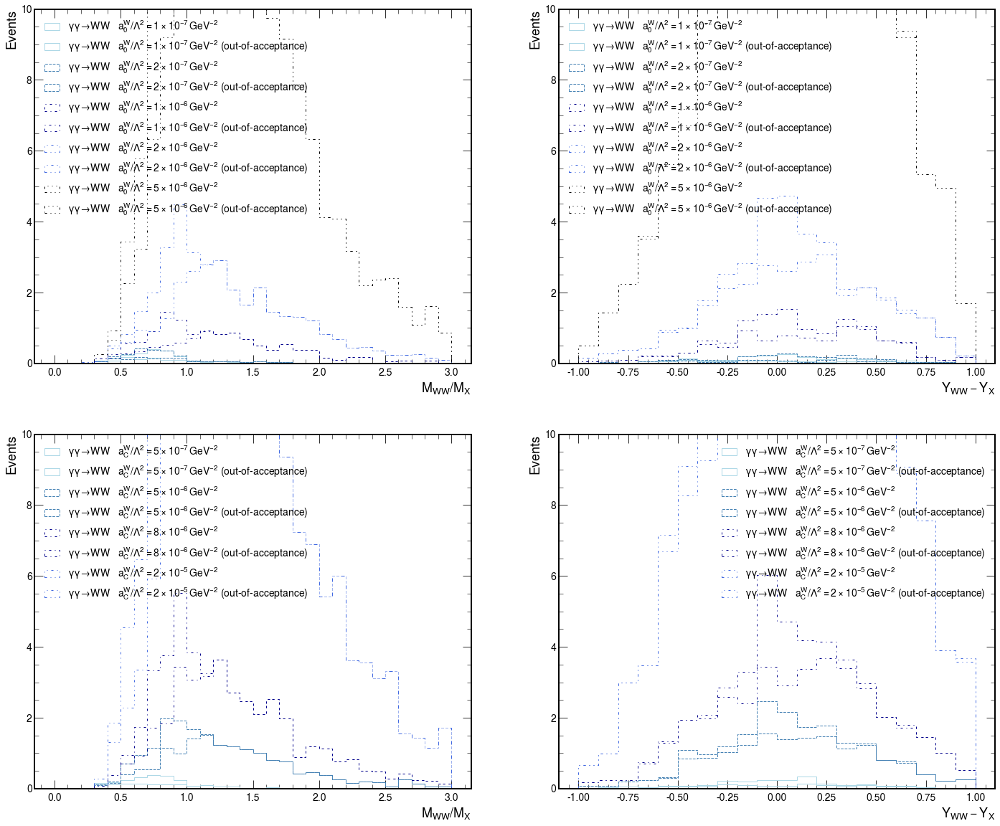

In [40]:
variation__ = "_nom"
var_str__ = {}
# var_str__[ "_nom" ] = "_nom_nom"
var_str__[ "_nom" ] = "_nom"
var_weights__ = "nom"

fig, axes = plt.subplots( 2, 2, figsize=(2*12,2*10) )

colors_ = [ "lightblue", "steelblue", "darkblue", "royalblue", "black" ]

linestyles_ = [ "solid", "dashed", (0, (3, 5, 1, 5)), (0, (3, 5, 1, 5, 1, 5)), (0, (3, 5, 1, 5, 1, 5, 1, 5)) ]

for idx_, label_ in enumerate( labels_signals[:5] ):
    axes[0,0].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ][ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=labels_samples[ label_ ],
              bins=30, range=(0.,3.) )
    axes[0,0].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ variation__ ][ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=( labels_samples[ label_ ] + " (out-of-acceptance)" ),
              bins=30, range=(0.,3.) )
    axes[0,1].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ][ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=labels_samples[ label_ ],
              bins=20, range=(-1.,1.) )
    axes[0,1].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ variation__ ][ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=( labels_samples[ label_ ] + " (out-of-acceptance)" ),
              bins=20, range=(-1.,1.) )
for idx_, label_ in enumerate( labels_signals[5:] ):
    axes[1,0].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ][ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=labels_samples[ label_ ],
              bins=30, range=(0.,3.) )
    axes[1,0].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ variation__ ][ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=( labels_samples[ label_ ] + " (out-of-acceptance)" ),
              bins=30, range=(0.,3.) )
    axes[1,1].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ][ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=labels_samples[ label_ ],
              bins=20, range=(-1.,1.) )
    axes[1,1].hist( df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat_skip_sig[ label_ ][ variation__ ][ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories_concat_skip_sig[ label_ ][ var_weights__ ][ variation__ ],
              histtype='step', color=colors_[ idx_ ], linestyle=linestyles_[ idx_ ], label=( labels_samples[ label_ ] + " (out-of-acceptance)" ),
              bins=20, range=(-1.,1.) )
    
axes[0,0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[0,0].set_ylabel( "Events", fontsize=18 )
axes[0,0].legend( loc='best', fontsize=14 )
axes[0,1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[0,1].set_ylabel( "Events", fontsize=18 )
axes[0,1].legend( loc='best', fontsize=14 )
axes[1,0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[1,0].set_ylabel( "Events", fontsize=18 )
axes[1,0].legend( loc='best', fontsize=14 )
axes[1,1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[1,1].set_ylabel( "Events", fontsize=18 )
axes[1,1].legend( loc='best', fontsize=14 )
    
axes[0,0].set_ylim( (0.,10.) )
axes[0,1].set_ylim( (0.,10.) )
axes[1,0].set_ylim( (0.,10.) )
axes[1,1].set_ylim( (0.,10.) )


if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Electron_2018.png", bbox_inches='tight' )

2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix


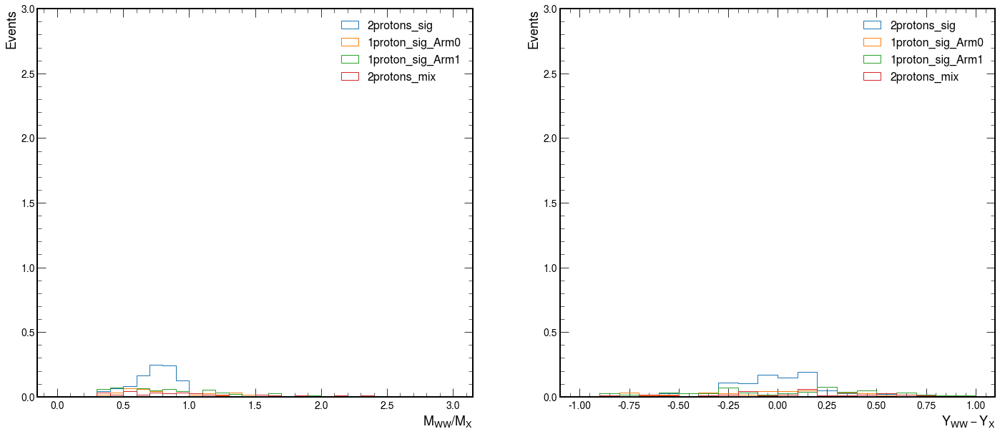

In [41]:
label_ = ""
coupling_str_ = "ACW5e-7"
# coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
for key_ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
    print ( key_ )
    df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ key_ ][ variation__ ]
    axes[0].hist( df_selected_events__[ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=30, range=(0.,3.) )
    axes[1].hist( df_selected_events__[ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=20, range=(-1.,1.) )
axes[0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[0].set_ylabel( "Events", fontsize=18 )
axes[0].legend( loc='best', fontsize=16 )
axes[1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[1].set_ylabel( "Events", fontsize=18 )
axes[1].legend( loc='best', fontsize=16 )
# plt.ylim( 0., 0.3 )
# plt.ylim( 0., 0.5 )
# plt.ylim( 0., 3. )
axes[0].set_ylim( 0., 3. )
axes[1].set_ylim( 0., 3. )

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.png", bbox_inches='tight' )

2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix


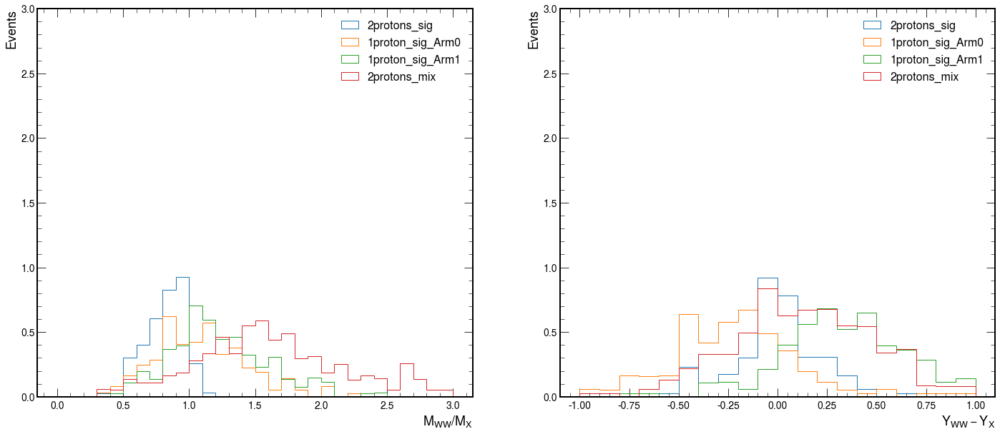

In [42]:
label_ = ""
coupling_str_ = "ACW5e-6"
# coupling_str_ = "A0W2e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
for key_ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
    print ( key_ )
    df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ key_ ][ variation__ ]
    axes[0].hist( df_selected_events__[ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=30, range=(0.,3.) )
    axes[1].hist( df_selected_events__[ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=20, range=(-1.,1.) )
axes[0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[0].set_ylabel( "Events", fontsize=18 )
axes[0].legend( loc='best', fontsize=16 )
axes[1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[1].set_ylabel( "Events", fontsize=18 )
axes[1].legend( loc='best', fontsize=16 )
# plt.ylim( 0., 0.3 )
# plt.ylim( 0., 0.5 )
# plt.ylim( 0., 3. )
axes[0].set_ylim( 0., 3. )
axes[1].set_ylim( 0., 3. )

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.png", bbox_inches='tight' )

2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix


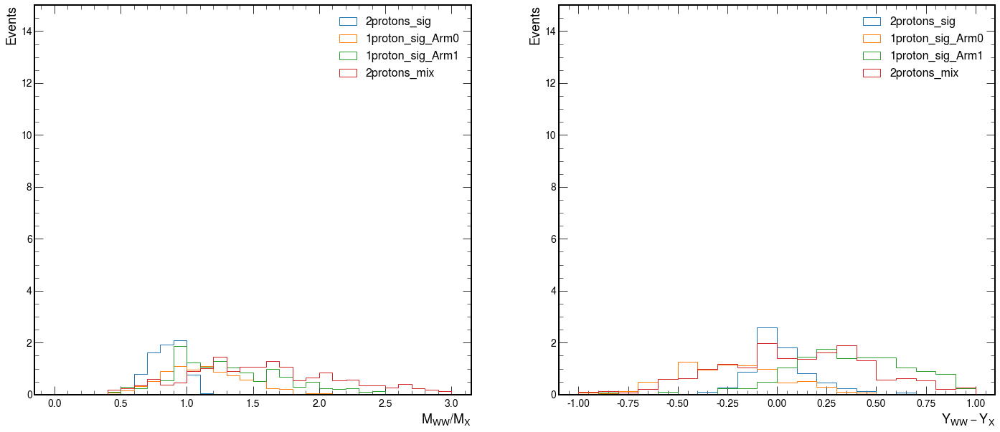

In [43]:
label_ = ""
coupling_str_ = "ACW8e-6"
# coupling_str_ = "A0W5e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
for key_ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
    print ( key_ )
    df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ key_ ][ variation__ ]
    axes[0].hist( df_selected_events__[ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=30, range=(0.,3.) )
    axes[1].hist( df_selected_events__[ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=20, range=(-1.,1.) )
axes[0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[0].set_ylabel( "Events", fontsize=18 )
axes[0].legend( loc='best', fontsize=16 )
axes[1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[1].set_ylabel( "Events", fontsize=18 )
axes[1].legend( loc='best', fontsize=16 )
# plt.ylim( 0., 0.3 )
# plt.ylim( 0., 0.5 )
# plt.ylim( 0., 3. )
axes[0].set_ylim( 0., 15. )
axes[1].set_ylim( 0., 15. )

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.png", bbox_inches='tight' )

2protons_sig
1proton_sig_Arm0
1proton_sig_Arm1
2protons_mix


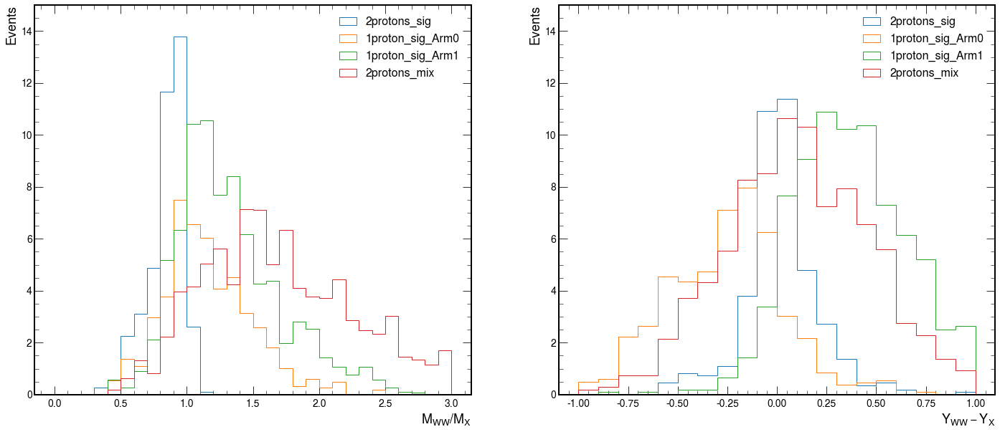

In [44]:
label_ = ""
coupling_str_ = "ACW2e-5"
# coupling_str_ = "A0W5e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
elif data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

fig, axes = plt.subplots( 1, 2, figsize=(2*12,10) )
for key_ in df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ]:
    print ( key_ )
    df_selected_events__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[ label_ ][ key_ ][ variation__ ]
    axes[0].hist( df_selected_events__[ "R_MWW_MX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=30, range=(0.,3.) )
    axes[1].hist( df_selected_events__[ "Diff_YWW_YX" + var_str__[ "_nom" ] ], weights=weights_sig_plus_mix_categories[ label_ ][ var_weights__ ][ key_ ][ variation__ ],
              histtype='step', label=key_,
              bins=20, range=(-1.,1.) )
axes[0].set_xlabel( r"$ M_{WW} / M_{X} $", fontsize=18 )
axes[0].set_ylabel( "Events", fontsize=18 )
axes[0].legend( loc='best', fontsize=16 )
axes[1].set_xlabel( r"$ Y_{WW} - Y_{X} $", fontsize=18 )
axes[1].set_ylabel( "Events", fontsize=18 )
axes[1].legend( loc='best', fontsize=16 )
# plt.ylim( 0., 0.3 )
# plt.ylim( 0., 0.5 )
# plt.ylim( 0., 3. )
axes[0].set_ylim( 0., 15. )
axes[1].set_ylim( 0., 15. )

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Mix-Categories-Electron_2018.png", bbox_inches='tight' )

In [45]:
if lepton_type == 'muon':
    row_labels = ["GGToWW-AQGC-2018-muon-A0W1e-7", "GGToWW-AQGC-2018-muon-A0W2e-7", "GGToWW-AQGC-2018-muon-A0W1e-6", "GGToWW-AQGC-2018-muon-A0W2e-6", "GGToWW-AQGC-2018-muon-A0W5e-6", 
                  "GGToWW-AQGC-2018-muon-ACW5e-7", "GGToWW-AQGC-2018-muon-ACW5e-6", "GGToWW-AQGC-2018-muon-ACW8e-6", "GGToWW-AQGC-2018-muon-ACW2e-5"]
elif lepton_type == 'electron':
    row_labels = ["GGToWW-AQGC-2018-electron-A0W1e-7", "GGToWW-AQGC-2018-electron-A0W2e-7", "GGToWW-AQGC-2018-electron-A0W1e-6", "GGToWW-AQGC-2018-electron-A0W2e-6", "GGToWW-AQGC-2018-electron-A0W5e-6", 
                  "GGToWW-AQGC-2018-electron-ACW5e-7", "GGToWW-AQGC-2018-electron-ACW5e-6", "GGToWW-AQGC-2018-electron-ACW8e-6", "GGToWW-AQGC-2018-electron-ACW2e-5"]

table = pd.DataFrame(index=row_labels, columns=['2protons_sig', '1proton_sig_Arm0', '1proton_sig_Arm1', '2protons_mix'])

for row_label in row_labels:
    #num_entries_df1 = len(df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[row_label]['2protons_sig']['_nom'][ "R_MWW_MX" + var_str__[ "_nom" ] ])
    #num_entries_df2 = len(df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[row_label]['1proton_sig_Arm0']['_nom'][ "R_MWW_MX" + var_str__[ "_nom" ] ])
    #num_entries_df3 = len(df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[row_label]['1proton_sig_Arm1']['_nom'][ "R_MWW_MX" + var_str__[ "_nom" ] ])
    #num_entries_df4 = len(df_signals_protons_multiRP_sig_plus_mix_selected_events_categories[row_label]['2protons_mix']['_nom'][ "R_MWW_MX" + var_str__[ "_nom" ] ])
    num_entries_df1 = np.sum(weights_sig_plus_mix_categories[row_label]['nom']['2protons_sig']['_nom'])
    num_entries_df2 = np.sum(weights_sig_plus_mix_categories[row_label]['nom']['1proton_sig_Arm0']['_nom'])
    num_entries_df3 = np.sum(weights_sig_plus_mix_categories[row_label]['nom']['1proton_sig_Arm1']['_nom'])
    num_entries_df4 = np.sum(weights_sig_plus_mix_categories[row_label]['nom']['2protons_mix']['_nom'])

    table.loc[row_label, '2protons_sig'] = num_entries_df1
    table.loc[row_label, '1proton_sig_Arm0'] = num_entries_df2
    table.loc[row_label, '1proton_sig_Arm1'] = num_entries_df3
    table.loc[row_label, '2protons_mix'] = num_entries_df4

pd.set_option('display.width', 1000)

print(table)

                                  2protons_sig 1proton_sig_Arm0 1proton_sig_Arm1 2protons_mix
GGToWW-AQGC-2018-electron-A0W1e-7     0.966592         0.406246         0.368661     0.277076
GGToWW-AQGC-2018-electron-A0W2e-7     1.027797         0.422125         0.532803     0.327878
GGToWW-AQGC-2018-electron-A0W1e-6     2.793134         2.185181         3.984402      3.51114
GGToWW-AQGC-2018-electron-A0W2e-6     6.700325         6.890116        10.808054     12.81657
GGToWW-AQGC-2018-electron-A0W5e-6    32.684249        41.924642        65.719702    79.896628
GGToWW-AQGC-2018-electron-ACW5e-7     0.986514         0.385716         0.571357     0.342024
GGToWW-AQGC-2018-electron-ACW5e-6      3.40776         4.322536           4.8373     6.682719
GGToWW-AQGC-2018-electron-ACW8e-6     7.478933         8.445271        13.198036    17.064619
GGToWW-AQGC-2018-electron-ACW2e-5    39.244204        48.939612         80.01707    91.074167


In [46]:
#stop[cell]

GGToWW-AQGC-2018-electron-A0W1e-7
Number of events: 2.0185749768157017 +/- 0.109183815513975
Number of events (A): 0.7446494405658787 +/- 0.06643063229955892
Number of events (B): 0.9030782478459448 +/- 0.07290664019877233
Number of events (C): 0.12521799400840067 +/- 0.027388071711938505
Number of events (D): 0.2456292943954779 +/- 0.03798146923565486
0 0
GGToWW-AQGC-2018-electron-A0W2e-7
Number of events: 2.3106042403561187 +/- 0.1220694936315502
Number of events (A): 0.8189687057107966 +/- 0.07312299354295132
Number of events (B): 1.1198585118678104 +/- 0.08461276222752634
Number of events (C): 0.1672942104202993 +/- 0.03289178240381342
Number of events (D): 0.20448281235721263 +/- 0.03623258491066927
0 1
GGToWW-AQGC-2018-electron-A0W1e-6
Number of events: 12.473856417627545 +/- 0.5667274627574473
Number of events (A): 8.684043866138154 +/- 0.47369404214916727
Number of events (B): 1.9039132316919865 +/- 0.2203794238214684
Number of events (C): 1.3481557932973482 +/- 0.1854331061759

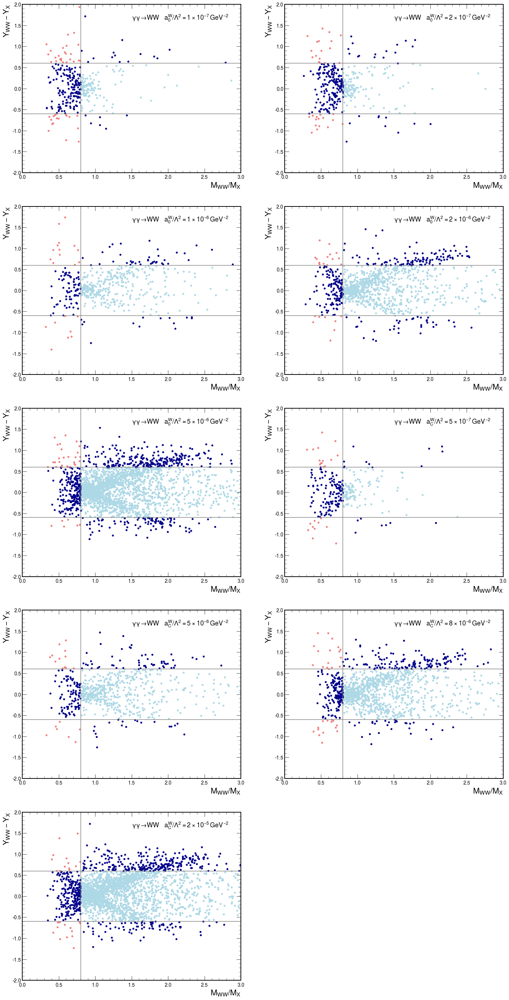

In [47]:
variation__ = "_nom"
var_weights__ = "nom"

nrows_ = ( int( len(labels_signals)/2 ) + 1 if ( len(labels_signals) % 2 ) > 0 else int( len(labels_signals)/2 ) )
fig, axes = plt.subplots( nrows_, 2, figsize=(2*12,nrows_*10) )

row_ = 0
col_ = 0
for label_ in labels_signals:
    print ( label_ )
    df__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ variation__ ]
    weights__ = weights_sig_plus_mix_categories_concat[ label_ ][ var_weights__ ][ variation__ ]
    var1__ = ( "R_MWW_MX" + var_str__[ "_nom" ] )
    var2__ = ( "Diff_YWW_YX" + var_str__[ "_nom" ] )
    
    msk_sig_cut1 = ( df__[ var1__ ] >= 0.80  )
    msk_sig_cut2 = ( np.abs( df__[ var2__ ] ) <= 0.60 )
    msk_sig_A =  msk_sig_cut1 &  msk_sig_cut2
    msk_sig_B = ~msk_sig_cut1 &  msk_sig_cut2
    msk_sig_C =  msk_sig_cut1 & ~msk_sig_cut2
    msk_sig_D = ~msk_sig_cut1 & ~msk_sig_cut2

    n_events_sig   = np.sum( weights__ )
    err_n_events_sig = np.sqrt( np.sum( weights__ ** 2 ) )
    n_events_sig_A = np.sum( weights__[ msk_sig_A ] )
    err_n_events_sig_A = np.sqrt( np.sum( weights__[ msk_sig_A ] ** 2 ) )
    n_events_sig_B = np.sum( weights__[ msk_sig_B ] )
    err_n_events_sig_B = np.sqrt( np.sum( weights__[ msk_sig_B ] ** 2 ) )
    n_events_sig_C = np.sum( weights__[ msk_sig_C ] )
    err_n_events_sig_C = np.sqrt( np.sum( weights__[ msk_sig_C ] ** 2 ) )
    n_events_sig_D = np.sum( weights__[ msk_sig_D ] )
    err_n_events_sig_D = np.sqrt( np.sum( weights__[ msk_sig_D ] ** 2 ) )

    print ( "Number of events: {} +/- {}".format( n_events_sig, err_n_events_sig ) )
    print ( "Number of events (A): {} +/- {}".format( n_events_sig_A, err_n_events_sig_A ) )
    print ( "Number of events (B): {} +/- {}".format( n_events_sig_B, err_n_events_sig_B ) )
    print ( "Number of events (C): {} +/- {}".format( n_events_sig_C, err_n_events_sig_C ) )
    print ( "Number of events (D): {} +/- {}".format( n_events_sig_D, err_n_events_sig_D ) )

    x_min =  0.
    x_max =  3.0
    y_min = -2.0
    y_max =  2.0
    x_cut = 0.80
    y_cut = 0.60

    print ( row_, col_ )
    axes[ row_, col_ ].plot( (x_min,x_max), (-y_cut,-y_cut), color='gray' )
    axes[ row_, col_ ].plot( (x_min,x_max), (y_cut,y_cut), color='gray' )
    axes[ row_, col_ ].plot( (x_cut,x_cut), (y_min,y_max), color='gray' )
    if np.sum( msk_sig_A ) > 0:
        df__[ msk_sig_A ].plot( var1__, var2__, 'scatter', ax=axes[ row_, col_ ], color='lightblue' )
    if np.sum( msk_sig_B ) > 0:
        df__[ msk_sig_B ].plot( var1__, var2__, 'scatter', ax=axes[ row_, col_ ], color='darkblue' )
    if np.sum( msk_sig_C ) > 0:
        df__[ msk_sig_C ].plot( var1__, var2__, 'scatter', ax=axes[ row_, col_ ], color='darkblue' )
    if np.sum( msk_sig_D ) > 0:
        df__[ msk_sig_D ].plot( var1__, var2__, 'scatter', ax=axes[ row_, col_ ], color='lightcoral' )
    title_str_ = labels_samples[ label_ ]
    axes[ row_, col_ ].text( 0.50, 0.92, title_str_, horizontalalignment='left', verticalalignment='center', transform=axes[ row_, col_ ].transAxes, fontsize=18 )
    axes[ row_, col_ ].set_xlim(x_min, x_max)
    axes[ row_, col_ ].set_ylim(y_min, y_max)
    axes[ row_, col_ ].set_xlabel( r"$M_{WW} / M_{X}$", fontsize=22 )
    axes[ row_, col_ ].set_ylabel( r"$Y_{WW} - Y_{X}$", fontsize=22 )
    col_ += 1
    if col_ >= 2:
        row_ += 1
        col_  = 0
if col_ == 1: axes[ row_, col_ ].axis('off')
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Signal-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Signal-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Signal-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Signal-Electron_2018.png", bbox_inches='tight' )  

### Calculate uncertainties from variations

In [48]:
from scipy.interpolate import make_interp_spline

relative_uncertainty_ = True

vars_ = {}
vars_[ "R_MWW_MX" ] = {}
# vars_[ "R_MWW_MX" ][ "bins" ]  = 30
# # vars_[ "R_MWW_MX" ][ "bins" ]  = 15
# vars_[ "R_MWW_MX" ][ "range" ] = (0.,3.)
# vars_[ "R_MWW_MX" ][ "xlim" ]  = (0.5,2.)
# vars_[ "R_MWW_MX" ][ "bins" ]  = 0.6 + 0.2 * np.arange( 8 )
vars_[ "R_MWW_MX" ][ "bins" ]  = 0.6 + 0.1 * np.arange( 6 )
vars_[ "R_MWW_MX" ][ "range" ] = None
# vars_[ "R_MWW_MX" ][ "xlim" ]  = ( 0.6, 2. )
vars_[ "R_MWW_MX" ][ "xlim" ]  = ( 0.6, 1.1 )
vars_[ "R_MWW_MX" ][ "xtitle" ]  = r"$M_{WW} / M_{X}$"
vars_[ "Diff_YWW_YX" ] = {}
# vars_[ "Diff_YWW_YX" ][ "bins" ]  = 20
# # vars_[ "Diff_YWW_YX" ][ "bins" ]  = 10
# vars_[ "Diff_YWW_YX" ][ "range" ] = (-1.,1.)
# vars_[ "Diff_YWW_YX" ][ "xlim" ]  = (-1.,1.)
# vars_[ "Diff_YWW_YX" ][ "bins" ]  = -1. + 0.2 * np.arange( 11 )
# vars_[ "Diff_YWW_YX" ][ "bins" ]  = -1. + 0.4 * np.arange( 6 )
vars_[ "Diff_YWW_YX" ][ "bins" ]  = -0.6 + 0.4 * np.arange( 4 )
vars_[ "Diff_YWW_YX" ][ "range" ] = None
# vars_[ "Diff_YWW_YX" ][ "xlim" ]  = ( -1., 1. )
vars_[ "Diff_YWW_YX" ][ "xlim" ]  = ( -0.60, 0.60 )
vars_[ "Diff_YWW_YX" ][ "xtitle" ]  = r"$Y_{WW} - Y_{X}$"

# ylim_ = (0.,0.2)
# ylim_ = (0.,0.5)
# ylim_ = (0.,1.)
ylim_ = (0.,3.)
# ylim_ = (0.,5.)

color_ = "darkblue"

def plot_uncertainties_variations(df_dict, weights_dict, variables, variations, selection_dict, scale_variation, label, var_info, ylim, ylim_ratio, color, relative_uncertainty):

    __df_dict = df_dict
    __weights_dict = weights_dict
    vars_ = variables
    __variations = variations
    sel_str__ = selection_dict
#     var_weights__ = var_weights
    scale_variation_=scale_variation
    label_ = label
    vars_ = var_info
    ylim_ = ylim
    color_ = color
    relative_uncertainty_ = relative_uncertainty

    max_ = {}
    min_ = {}
    spline_nom_ = {}
    spline_max_ = {}
    spline_min_ = {}
    spline_nom_arr_ = {}
    spline_max_arr_ = {}
    spline_min_arr_ = {}
    idx_row_ = 0
    idx_col_ = 0

    fig_, axes_ = plt.subplots( 2, 2, figsize=(2*10,2*8) )

    print ( label_ )
    for var__ in vars_:
        print ( var__ )
        max_[ var__ ] = None
        min_[ var__ ] = None
        for idx_, variation__ in enumerate( __variations ):
            __variation__ = variation__ if not scale_variation_ else "_nom"
            __sel_str__ = sel_str__[ __variation__ ] if not scale_variation_ else "_nom"
            __var_weights__ = variation__ if scale_variation_ else "nom"
            if variation__ != "_nom" and variation__ != "nom":
                print ( __variation__ )
                print ( __sel_str__ )
                print ( __var_weights__ )
                df__ = __df_dict[ label_ ][ __sel_str__ ]
                weights__ = __weights_dict[ label_ ][ __var_weights__ ][ __sel_str__ ]
                arr__ = df__[ var__ + __variation__ ]
                
                arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + __variation__ ]
                msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
                arr__ = arr__.loc[ msk__ ]
                weights__ = weights__.loc[ msk__ ]
                counts_, bins_ = np.histogram( arr__, weights=weights__, bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )

                if max_[ var__ ] is None: max_[ var__ ] = counts_.copy()
                if min_[ var__ ] is None: min_[ var__ ] = counts_.copy()
                msk__ = counts_ > max_[ var__ ]
                max_[ var__ ][ msk__ ] = counts_[ msk__ ]
                msk__ = counts_ < min_[ var__ ]
                min_[ var__ ][ msk__ ] = counts_[ msk__ ]

        print ( max_[ var__ ] )
        print ( min_[ var__ ] )
        idx_row_ = 0
        df__ = __df_dict[ label_ ][ "_nom" ]
        arr__ = df__[ var__ + "_nom" ]
        weights__ = __weights_dict[ label_ ][ "nom" ][ "_nom" ]
        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        counts_, bins_, _ = axes_[idx_row_,idx_col_].hist( arr__, 
                                                           weights=weights__,
                                                           histtype='step', color=color_, linestyle="-", label="_nom",
                                                           bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
        bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

        spline_nom_[ var__ ] = make_interp_spline( bin_centers_, counts_, k=2 )
        spline_max_[ var__ ] = make_interp_spline( bin_centers_, max_[ var__ ], k=2 )
        spline_min_[ var__ ] = make_interp_spline( bin_centers_, min_[ var__ ], k=2 )
        x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
        spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
        spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
        spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )

        axes_[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
        axes_[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
        axes_[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
        axes_[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
        axes_[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes_[idx_row_,idx_col_].set_ylim( ylim_ )

        idx_row_ = 1
        if relative_uncertainty_:
            ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_max_sel_ = pd.Series( ratio_max_ )
            ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            ratio_min_sel_ = pd.Series( ratio_min_ )
            ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            print ( ratio_max_sel_, ratio_max_sel_.mean() )
            print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
            axes_[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
            axes_[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
            axes_[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
        else:
            diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            axes_[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
            axes_[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
            axes_[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
        axes_[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        # axes_[idx_row_,idx_col_].set_ylim( -1., 1. )
        axes_[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
        idx_col_ += 1
        
    return ( max_, min_ )

In [49]:
def calculate_uncertainties_variations(df_dict, weights_dict, variations, selection_dict, scale_variation):
    
    __df_dict = df_dict
    __weights_dict = weights_dict
    variations_ = variations
    sel_str__ = selection_dict
    scale_variation_=scale_variation
    
    sum_weights_cut = {}
    sum_weights_squared_cut = {}
    sum_weights_cut_max = {}
    sum_weights_cut_min = {}
    for label_ in labels_signals:
        print ( label_ )
        sum_weights_cut_max_ = None
        sum_weights_cut_min_ = None
        for idx_, variation__ in enumerate( variations_ ):
            __variation__ = variation__ if not scale_variation_ else "_nom"
            __sel_str__ = sel_str__[ __variation__ ] if not scale_variation_ else "_nom"
            __var_weights__ = variation__ if scale_variation_ else "nom"
            if variation__ != "_nom" and variation__ != "nom":
                print ( __variation__ )
                print ( __sel_str__ )
                print ( __var_weights__ )
                df__ = __df_dict[ label_ ][ __sel_str__ ]
                weights__ = __weights_dict[ label_ ][ __var_weights__ ][ __sel_str__ ]
                arr_R_MWW_MX__ = df__.loc[ :, "R_MWW_MX" + __variation__ ]
                arr_Diff_YWW_YX__ = df__.loc[ :, "Diff_YWW_YX" + __variation__ ]
                msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) & ( arr_R_MWW_MX__ >= 0.80 ) )
                sum_weights_cut__ = np.sum( weights__.loc[ msk__ ] )
                if sum_weights_cut_max_ is None:
                    sum_weights_cut_max_ = sum_weights_cut__
                if sum_weights_cut_min_ is None:
                    sum_weights_cut_min_ = sum_weights_cut__
                if sum_weights_cut__ > sum_weights_cut_max_:
                    sum_weights_cut_max_ = sum_weights_cut__
                if sum_weights_cut__ < sum_weights_cut_min_:
                    sum_weights_cut_min_ = sum_weights_cut__

        df__ = __df_dict[ label_ ][ "_nom" ]
        weights__ = __weights_dict[ label_ ][ "nom" ][ "_nom" ]
        weights_squared__ = ( weights__ ** 2 )
        arr_R_MWW_MX__ = df__.loc[ :, "R_MWW_MX" + "_nom" ]
        arr_Diff_YWW_YX__ = df__.loc[ :, "Diff_YWW_YX" + "_nom" ]
        if not upper_mass_ratio_cut:
            msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) & ( arr_R_MWW_MX__ >= 0.80 ) )
        if upper_mass_ratio_cut:
            msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) & ( arr_R_MWW_MX__ >= 0.80 ) & ( arr_R_MWW_MX__ <= 1.1 ) )
        sum_weights_cut__ = np.sum( weights__.loc[ msk__ ] )
        sum_weights_squared_cut__ = np.sum( weights_squared__.loc[ msk__ ] )
        print ( "{} ± {}".format( sum_weights_cut__, np.sqrt( sum_weights_squared_cut__ ) ) )
        print ( sum_weights_cut_max_ )
        print ( sum_weights_cut_min_ )
        sum_weights_cut[ label_ ] = sum_weights_cut__
        sum_weights_squared_cut[ label_ ] = sum_weights_squared_cut__
        sum_weights_cut_max[ label_ ] = sum_weights_cut_max_
        sum_weights_cut_min[ label_ ] = sum_weights_cut_min_

    print ( sum_weights_cut )
    print ( sum_weights_squared_cut )
    print ( sum_weights_cut_max )
    print ( sum_weights_cut_min )
    
    return ( sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min )

In [50]:
label_ref_ = ""
coupling_str_ = "ACW5e-6"
# coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ref_ = "GGToWW-AQGC-A0W2e-6"
#         label_ref_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ref_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ref_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ref_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ref_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ref_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

#### JES

In [51]:
variations_ = [ "_nom", "_jes_up", "_jes_dw" ]

sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = key_

# var_weights__ = "nom"

In [52]:
if plot_separate_syst_uncertainties:

    relative_uncertainty_ = True

    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    ylim_ratio_ = (-0.10,0.10)

    color_ = "darkblue"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    print ( max_, min_ )

In [53]:
max_variations = {}
min_variations = {}
if plot_separate_syst_uncertainties:
    max_variations[ "jes" ] = max_
    min_variations[ "jes" ] = min_
    print ( max_variations )
    print ( min_variations )

In [54]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_,
    selection_dict=sel_str__,
    scale_variation=False
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
0.5832571553818872 ± 0.05869896003781442
0.7446494405658787
0.7385154439574029
GGToWW-AQGC-2018-electron-A0W2e-7
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
0.5877197647288073 ± 0.06173869279051326
0.8256468861168225
0.8124186606037793
GGToWW-AQGC-2018-electron-A0W1e-6
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
3.309024685000968 ± 0.29095240555178
8.714587034013352
8.684043866138154
GGToWW-AQGC-2018-electron-A0W2e-6
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
10.495084470226944 ± 0.589927387837607
27.555249412166063
27.283556340143214
GGToWW-AQGC-2018-electron-A0W5e-6
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
62.32672488327633 ± 2.2922938049685717
171.10354827083611
169.04284169916653
GGToWW-AQGC-2018-electron-ACW5e-7
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
0.6135202377945919 ± 0.07251829982396835
0.8895190037843553
0.8807215316700863
GGToWW-AQGC-2018-electron-ACW5e-6
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
5.094572505806859 

In [55]:
sum_weights = {}
for label_ in labels_signals:
    sum_weights[ label_ ] = {}
    sum_weights[ label_ ][ "central" ]        = sum_weights_cut[ label_ ]
    sum_weights[ label_ ][ "stat" ]           = np.sqrt( sum_weights_squared_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_up_jes" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_jes" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205}, 'GGToWW-AQGC-2018-electron-A0W1e-6': {'central': 3.309024685000968, 'stat': 0.29095240555178, 'syst_up_jes': 5.405562349012384, 'syst_dw_jes': 5.375019181137186}, 'GGToWW-AQGC-2018-electron-A0W2e-6': {'central': 10.495084470226944, 'stat': 0.589927387837607, 'syst_up_jes': 17.06016494193912, 'syst_dw_jes': 16.788471869916272}, 'GGToWW-AQGC-2018-electron-A0W5e-6': {'central': 62.32672488327633, 'stat': 2.2922938049685717, 'syst_up_jes': 108.77682338755979, 'syst_dw_jes': 106.7161168158902}, 'GGToWW-AQGC-2018-electron-ACW5e-7': {'central': 0.6135202377945919, 'stat': 0.07251829982396835, 'syst_up_jes': 0.2759987659897635, 'syst_dw_jes': 0.267201293875494

#### JER

In [56]:
variations_ = [ "_nom", "_jer_up", "_jer_dw" ]

sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = key_

In [57]:
if plot_separate_syst_uncertainties:
    
    relative_uncertainty_ = True

    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    ylim_ratio_ = (-0.10,0.10)

    color_ = "darkblue"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    print ( max_, min_ )

In [58]:
if plot_separate_syst_uncertainties:
    max_variations[ "jer" ] = max_
    min_variations[ "jer" ] = min_
    print ( max_variations )
    print ( min_variations )

In [59]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_,
    selection_dict=sel_str__,
    scale_variation=False
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
0.5832571553818872 ± 0.05869896003781442
0.7446494405658787
0.737776148927854
GGToWW-AQGC-2018-electron-A0W2e-7
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
0.5877197647288073 ± 0.06173869279051326
0.8266238001709754
0.8189687057107966
GGToWW-AQGC-2018-electron-A0W1e-6
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
3.309024685000968 ± 0.29095240555178
8.688128334737712
8.684043866138154
GGToWW-AQGC-2018-electron-A0W2e-6
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
10.495084470226944 ± 0.589927387837607
27.45576824360802
27.422370291929827
GGToWW-AQGC-2018-electron-A0W5e-6
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
62.32672488327633 ± 2.2922938049685717
170.06072020600772
169.9991765249384
GGToWW-AQGC-2018-electron-ACW5e-7
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
0.6135202377945919 ± 0.07251829982396835
0.8980710681067107
0.8895190037843553
GGToWW-AQGC-2018-electron-ACW5e-6
_jer_up
_jer_up
nom
_jer_dw
_jer_dw
nom
5.094572505806859 ± 0

In [60]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_jer" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_jer" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934}, 'GGToWW-AQGC-2018-electron-A0W1e-6': {'central': 3.309024685000968, 'stat': 0.29095240555178, 'syst_up_jes': 5.405562349012384, 'syst_dw_jes': 5.375019181137186, 'syst_up_jer': 5.379103649736744, 'syst_dw_jer': 5.375019181137186}, 'GGToWW-AQGC-2018-electron-A0W2e-6': {'central': 10.495084470226944, 'stat': 0.589927387837607, 'syst_up_jes': 17.06016494193912, 'syst_dw_jes': 16.788471869916272, 'syst_up_jer': 16.960683773381078, 'syst_dw_jer': 16.92728582170288}, 'GGToWW-AQGC-2018-electron-A0W5e-6': {'central': 62.

#### Lepton Id

In [61]:
variations_weights_ = []
if lepton_type == 'muon':
    variations_weights_ = [ "nom", "sf_muon_id_up", "sf_muon_id_dw" ]
elif lepton_type == 'electron':
    variations_weights_ = [ "nom", "sf_electron_id_up", "sf_electron_id_dw" ]

In [62]:
if plot_separate_syst_uncertainties:
    
    relative_uncertainty_ = True

    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    ylim_ratio_ = (-0.05,0.05)

    color_ = "darkblue"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    print ( max_, min_ )

In [63]:
if plot_separate_syst_uncertainties:
    if lepton_type == 'muon':
        max_variations[ "sf_muon_id" ] = max_
        min_variations[ "sf_muon_id" ] = min_
    elif lepton_type == 'electron':
        max_variations[ "sf_electron_id" ] = max_
        min_variations[ "sf_electron_id" ] = min_
    print ( max_variations )
    print ( min_variations )

In [64]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_weights_,
    selection_dict=None,
    scale_variation=True
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
0.5832571553818872 ± 0.05869896003781442
0.7724850079425769
0.7168138731891803
GGToWW-AQGC-2018-electron-A0W2e-7
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
0.5877197647288073 ± 0.06173869279051326
0.8562148688324397
0.7817225425891533
GGToWW-AQGC-2018-electron-A0W1e-6
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
3.309024685000968 ± 0.29095240555178
8.888411203233145
8.47967652904316
GGToWW-AQGC-2018-electron-A0W2e-6
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
10.495084470226944 ± 0.589927387837607
28.093733224089462
26.817803263126585
GGToWW-AQGC-2018-electron-A0W5e-6
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
62.32672488327633 ± 2.2922938049685717
174.56669925571873
165.59278237627404
GGToWW-AQGC-2018-electron-ACW5e-7
_nom
_nom
sf_electron_id_up
_nom
_nom
sf_electron_id_dw
0.6135202377945919 ± 0.07251829982396835
0.9281494923899374
0.85088851517877

In [65]:
for label_ in labels_signals:
    if lepton_type == 'muon':
        sum_weights[ label_ ][ "syst_up_sf_muon_id" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
        sum_weights[ label_ ][ "syst_dw_sf_muon_id" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
    elif lepton_type == 'electron':
        sum_weights[ label_ ][ "syst_up_sf_electron_id" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
        sum_weights[ label_ ][ "syst_dw_sf_electron_id" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934, 'syst_up_sf_electron_id': 0.2684951041036324, 'syst_dw_sf_electron_id': 0.19400277786034603}, 'GGToWW-AQGC-2018-electron-A0W1e-6': {'central': 3.309024685000968, 'stat': 0.29095240555178, 'syst_up_jes': 5.405562349012384, 'syst_dw_jes': 5.375019181137186, 'syst_up_jer': 5.379103649736744, 'syst_dw_jer': 5.375019181137186, 'syst_up_sf_electron_id': 5.579386518232178, 'syst_dw_sf_electron_id': 5.170651844042193}, 'GGToWW-AQ

#### Trigger

In [66]:
variations_weights_ = []
if lepton_type == 'muon':
    variations_weights_ = [ "nom", "sf_muon_trigger_up", "sf_muon_trigger_dw" ]
elif lepton_type == 'electron':
    variations_weights_ = [ "nom", "sf_electron_trigger_up", "sf_electron_trigger_dw" ]

In [67]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_weights_,
    selection_dict=None,
    scale_variation=True
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
0.5832571553818872 ± 0.05869896003781442
0.7457025422112459
0.7435963389205112
GGToWW-AQGC-2018-electron-A0W2e-7
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
0.5877197647288073 ± 0.06173869279051326
0.8201269115880196
0.8178104998335733
GGToWW-AQGC-2018-electron-A0W1e-6
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
3.309024685000968 ± 0.29095240555178
8.696325030170572
8.671762702105735
GGToWW-AQGC-2018-electron-A0W2e-6
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
10.495084470226944 ± 0.589927387837607
27.494596804399638
27.416939682816405
GGToWW-AQGC-2018-electron-A0W5e-6
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
62.32672488327633 ± 2.2922938049685717
170.32027072632252
169.83921090567029
GGToWW-AQGC-2018-electron-ACW5e-7
_nom
_nom
sf_electron_trigger_up
_nom
_nom
sf_electron_trigger_dw
0.6135202377945

In [68]:
for label_ in labels_signals:
    if lepton_type == 'muon':
        sum_weights[ label_ ][ "syst_up_sf_muon_trigger" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
        sum_weights[ label_ ][ "syst_dw_sf_muon_trigger" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
    elif lepton_type == 'electron':
        sum_weights[ label_ ][ "syst_up_sf_electron_trigger" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
        sum_weights[ label_ ][ "syst_dw_sf_electron_trigger" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934, 'syst_up_sf_electron_id': 0.2684951041036324, 'syst_dw_sf_electron_id': 0.19400277786034603, 'syst_up_sf_electron_trigger': 0.23240714685921238, 'syst_dw_sf_electron_trigger': 0.23009073510476608}, 'GGToWW-AQGC-2018-electron-A0W1e-6': {'central': 3.309024685000968, 'stat': 0.29095240555178, 'syst_up_jes': 5.405562349012

#### Prefiring

In [69]:
variations_weights_ = []
variations_weights_ = [ "nom", "sf_prefiring_up", "sf_prefiring_dw" ]

In [70]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_weights_,
    selection_dict=None,
    scale_variation=True
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
0.5832571553818872 ± 0.05869896003781442
0.7446494405658787
0.7446494405658787
GGToWW-AQGC-2018-electron-A0W2e-7
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
0.5877197647288073 ± 0.06173869279051326
0.8189687057107966
0.8189687057107966
GGToWW-AQGC-2018-electron-A0W1e-6
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
3.309024685000968 ± 0.29095240555178
8.684043866138154
8.684043866138154
GGToWW-AQGC-2018-electron-A0W2e-6
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
10.495084470226944 ± 0.589927387837607
27.45576824360802
27.45576824360802
GGToWW-AQGC-2018-electron-A0W5e-6
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
62.32672488327633 ± 2.2922938049685717
170.0797408159964
170.0797408159964
GGToWW-AQGC-2018-electron-ACW5e-7
_nom
_nom
sf_prefiring_up
_nom
_nom
sf_prefiring_dw
0.6135202377945919 ± 0.07251829982396835
0.8895190037843553
0.8895190037843553
GGToWW-AQGC-2018-electro

In [71]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_sf_prefiring" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_sf_prefiring" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.1613922851839915}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934, 'syst_up_sf_electron_id': 0.2684951041036324, 'syst_dw_sf_electron_id': 0.19400277786034603, 'syst_up_sf_electron_trigger': 0.23240714685921238, 'syst_dw_sf_electron_trigger': 0.23009073510476608, 'syst_up_sf_prefiring': 0.2312489409

#### Proton momentum scale

In [72]:
labels_xi_ = [ "_nom", "_p100", "_m100" ]
variations_ = []
for label0_ in labels_xi_:
    for label1_ in [ "_nom" ]:
        variations_.append( label0_ + label1_ )

sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = "_nom"
    
if plot_separate_syst_uncertainties:
    
    # vars_ = {}
    # vars_[ "R_MWW_MX" ] = {}
    # vars_[ "R_MWW_MX" ][ "bins" ]  = 30
    # vars_[ "R_MWW_MX" ][ "range" ] = (0.,3.)
    # vars_[ "R_MWW_MX" ][ "xlim" ]  = (0.5,2.)
    # # vars_[ "R_MWW_MX" ][ "bins" ]  = 0.5 + 0.2 * np.arange( 9 )
    # # vars_[ "R_MWW_MX" ][ "range" ] = None
    # # vars_[ "R_MWW_MX" ][ "xlim" ]  = ( 0.5, 2.1 )
    # vars_[ "Diff_YWW_YX" ] = {}
    # vars_[ "Diff_YWW_YX" ][ "bins" ]  = 20
    # vars_[ "Diff_YWW_YX" ][ "range" ] = (-1.,1.)
    # vars_[ "Diff_YWW_YX" ][ "xlim" ]  = (-1.,1.)
    # # vars_[ "Diff_YWW_YX" ][ "bins" ]  = -1.1 + 0.2 * np.arange( 12 )
    # # vars_[ "Diff_YWW_YX" ][ "range" ] = None
    # # vars_[ "Diff_YWW_YX" ][ "xlim" ]  = ( -1.1, 1.1 )

    # ylim_ = (0.,0.2)
    # ylim_ = (0.,0.5)
    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    # ylim_ = (0.,3.)
    # ylim_ = (0.,5.)
    ylim_ratio_ = (-0.50,0.50)

    color_ = "darkblue"

    relative_uncertainty_ = True

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    max_var_xi_ = {}
    min_var_xi_ = {}
    max_var_xi_["arm0"] = max_
    min_var_xi_["arm0"] = min_

In [73]:
if plot_separate_syst_uncertainties:
    max_variations[ "proton_scale_arm0" ] = max_
    min_variations[ "proton_scale_arm0" ] = min_
    print ( max_variations )
    print ( min_variations )

In [74]:
variations_ = []

for label0_ in [ "_nom" ]:
    for label1_ in labels_xi_:
        variations_.append( label0_ + label1_ )

sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = "_nom"
    
if plot_separate_syst_uncertainties:
    
    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    max_var_xi_["arm1"] = max_
    min_var_xi_["arm1"] = min_

In [75]:
if plot_separate_syst_uncertainties:
    max_variations[ "proton_scale_arm1" ] = max_
    min_variations[ "proton_scale_arm1" ] = min_
    print ( max_variations )
    print ( min_variations )

In [76]:
if plot_separate_syst_uncertainties:
    spline_nom_ = {}
    spline_max_ = {}
    spline_min_ = {}
    spline_nom_arr_ = {}
    spline_max_arr_ = {}
    spline_min_arr_ = {}

    idx_row_ = 0
    idx_col_ = 0

    fig, axes = plt.subplots( 2, 2, figsize=(2*10,2*8) )

    label_ = label_ref_
    print ( label_ )
    for var__ in vars_:
        print ( var__ )
        idx_row_ = 0
        df__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ "_nom" ]
        weights__ = weights_sig_plus_mix_categories_concat[ label_ ][ "nom" ][ "_nom" ]
        arr__ = df__[ var__ + "_nom" ]

        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        counts_, bins_, _ = axes[idx_row_,idx_col_].hist( arr__,
                                                          weights=weights__,
                                                          histtype='step', color=color_, linestyle="-", label="_nom",
                                                          bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
        __max__ = ( counts_ +
                    np.sqrt( ( max_var_xi_[ "arm0" ][ var__ ] - counts_ ) ** 2 +
                             ( max_var_xi_[ "arm1" ][ var__ ] - counts_ ) ** 2 ) )
        __min__ = ( counts_ -
                    np.sqrt( ( counts_ - min_var_xi_[ "arm0" ][ var__ ] ) ** 2 +
                             ( counts_ - min_var_xi_[ "arm1" ][ var__ ] ) ** 2 ) )
        print ( __max__ )
        print ( __min__ )

        bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

        spline_nom_[ var__ ] = make_interp_spline( bin_centers_, counts_, k=2 )
        spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
        spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
        x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
        spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
        spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
        spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )

        axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ )

        idx_row_ = 1
        if relative_uncertainty_:
            ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_max_sel_ = pd.Series( ratio_max_ )
            ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            ratio_min_sel_ = pd.Series( ratio_min_ )
            ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            print ( ratio_max_sel_, ratio_max_sel_.mean() )
            print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
        else:
            diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
    #     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
        idx_col_ += 1

In [77]:
variations_ = []
for label0_ in labels_xi_:
    for label1_ in [ "_nom" ]:
        variations_.append( label0_ + label1_ )
sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = "_nom"

print ( variations_ )
print ( sel_str__ )

sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_,
    selection_dict=sel_str__,
    scale_variation=False
    )

['_nom_nom', '_p100_nom', '_m100_nom']
{'_nom_nom': '_nom', '_p100_nom': '_nom', '_m100_nom': '_nom'}
GGToWW-AQGC-2018-electron-A0W1e-7
_nom_nom
_nom
nom
_p100_nom
_nom
nom
_m100_nom
_nom
nom
0.5832571553818872 ± 0.05869896003781442
0.8289684125093519
0.6757394579292539
GGToWW-AQGC-2018-electron-A0W2e-7
_nom_nom
_nom
nom
_p100_nom
_nom
nom
_m100_nom
_nom
nom
0.5877197647288073 ± 0.06173869279051326
0.9136104541694734
0.7155218716960015
GGToWW-AQGC-2018-electron-A0W1e-6
_nom_nom
_nom
nom
_p100_nom
_nom
nom
_m100_nom
_nom
nom
3.309024685000968 ± 0.29095240555178
8.786473483939549
8.33589998370936
GGToWW-AQGC-2018-electron-A0W2e-6
_nom_nom
_nom
nom
_p100_nom
_nom
nom
_m100_nom
_nom
nom
10.495084470226944 ± 0.589927387837607
27.839617376011418
27.019046230160598
GGToWW-AQGC-2018-electron-A0W5e-6
_nom_nom
_nom
nom
_p100_nom
_nom
nom
_m100_nom
_nom
nom
62.32672488327633 ± 2.2922938049685717
173.03565430110623
166.59422589932342
GGToWW-AQGC-2018-electron-ACW5e-7
_nom_nom
_nom
nom
_p100_nom
_n

In [78]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_proton_scale_arm0" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_proton_scale_arm0" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.1613922851839915, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934, 'syst_up_sf_electron_id': 0.2684951041036324, 'syst_dw_sf_electron_id': 0.19400277786034603, 'syst_up_sf_electron_trigger': 0.2324071

In [79]:
variations_ = []
for label0_ in [ "_nom" ]:
    for label1_ in labels_xi_:
        variations_.append( label0_ + label1_ )
sel_str__ = {}
for key_ in variations_:
    sel_str__[ key_ ] = "_nom"

print ( variations_ )
print ( sel_str__ )

sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_,
    selection_dict=sel_str__,
    scale_variation=False
    )

['_nom_nom', '_nom_p100', '_nom_m100']
{'_nom_nom': '_nom', '_nom_p100': '_nom', '_nom_m100': '_nom'}
GGToWW-AQGC-2018-electron-A0W1e-7
_nom_nom
_nom
nom
_nom_p100
_nom
nom
_nom_m100
_nom
nom
0.5832571553818872 ± 0.05869896003781442
0.8049123092037948
0.6557585121422285
GGToWW-AQGC-2018-electron-A0W2e-7
_nom_nom
_nom
nom
_nom_p100
_nom
nom
_nom_m100
_nom
nom
0.5877197647288073 ± 0.06173869279051326
0.9209845319577111
0.7410667292049951
GGToWW-AQGC-2018-electron-A0W1e-6
_nom_nom
_nom
nom
_nom_p100
_nom
nom
_nom_m100
_nom
nom
3.309024685000968 ± 0.29095240555178
8.83416801414746
8.38409760367136
GGToWW-AQGC-2018-electron-A0W2e-6
_nom_nom
_nom
nom
_nom_p100
_nom
nom
_nom_m100
_nom
nom
10.495084470226944 ± 0.589927387837607
28.36400722355487
26.64848390504119
GGToWW-AQGC-2018-electron-A0W5e-6
_nom_nom
_nom
nom
_nom_p100
_nom
nom
_nom_m100
_nom
nom
62.32672488327633 ± 2.2922938049685717
173.42258583017207
165.82471406091042
GGToWW-AQGC-2018-electron-ACW5e-7
_nom_nom
_nom
nom
_nom_p100
_nom


In [80]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_proton_scale_arm1" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_proton_scale_arm1" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.1613922851839915, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678, 'syst_up_proton_scale_arm1': 0.2216551538219076, 'syst_dw_proton_scale_arm1': 0.0725013567603413}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0.2389040354421681, 'syst_dw_jer': 0.23124894098198934, 'syst_up_sf_electron_id': 0.2684951

In [81]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_proton_scale" ]    =  np.sqrt( sum_weights[ label_ ][ "syst_up_proton_scale_arm0" ] ** 2 +
                                                                   sum_weights[ label_ ][ "syst_up_proton_scale_arm1" ] ** 2 )
    sum_weights[ label_ ][ "syst_dw_proton_scale" ]    = -np.sqrt( sum_weights[ label_ ][ "syst_dw_proton_scale_arm0" ] ** 2 +
                                                                   sum_weights[ label_ ][ "syst_dw_proton_scale_arm1" ] ** 2 )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.1613922851839915, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678, 'syst_up_proton_scale_arm1': 0.2216551538219076, 'syst_dw_proton_scale_arm1': 0.0725013567603413, 'syst_up_proton_scale': 0.3309154410041523, 'syst_dw_proton_scale': -0.11751350142240241}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.2379271213880152, 'syst_dw_jes': 0.22469889587497205, 'syst_up_jer': 0

#### Proton efficiency

In [82]:
variations_weights_ = [ "nom", "proton_eff_up", "proton_eff_dw" ]

In [83]:
if plot_separate_syst_uncertainties:
    
    relative_uncertainty_ = True

    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    ylim_ratio_ = (-0.05,0.05)

    color_ = "darkblue"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_ref_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    print ( max_, min_ )

In [84]:
if plot_separate_syst_uncertainties:
    max_variations[ "proton_eff" ] = max_
    min_variations[ "proton_eff" ] = min_
    print ( max_variations )
    print ( min_variations )

In [85]:
sum_weights_cut, sum_weights_squared_cut, sum_weights_cut_max, sum_weights_cut_min = calculate_uncertainties_variations(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    variations=variations_weights_,
    selection_dict=None,
    scale_variation=True
    )

GGToWW-AQGC-2018-electron-A0W1e-7
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
0.5832571553818872 ± 0.05869896003781442
0.7607916889764452
0.7285071921553121
GGToWW-AQGC-2018-electron-A0W2e-7
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
0.5877197647288073 ± 0.06173869279051326
0.8350460245575237
0.8028913868640692
GGToWW-AQGC-2018-electron-A0W1e-6
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
3.309024685000968 ± 0.29095240555178
8.809947077171792
8.558140655104513
GGToWW-AQGC-2018-electron-A0W2e-6
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
10.495084470226944 ± 0.589927387837607
27.81534286985228
27.096193617363763
GGToWW-AQGC-2018-electron-A0W5e-6
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
62.32672488327633 ± 2.2922938049685717
172.26542330019683
167.89405833179597
GGToWW-AQGC-2018-electron-ACW5e-7
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
0.6135202377945919 ± 0.07251829982396835
0.9077055887076841
0.8713324188610265
GGToWW-AQGC-2018-electron-ACW5e-6
_nom
_nom
p

In [86]:
for label_ in labels_signals:
    sum_weights[ label_ ][ "syst_up_proton_eff" ]    = ( sum_weights_cut_max[ label_ ] - sum_weights_cut[ label_ ] )
    sum_weights[ label_ ][ "syst_dw_proton_eff" ]    = ( sum_weights_cut_min[ label_ ] - sum_weights_cut[ label_ ] )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.1552582885755157, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.15451899354596688, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.13355671780729317, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.16033918353862409, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.1613922851839915, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678, 'syst_up_proton_scale_arm1': 0.2216551538219076, 'syst_dw_proton_scale_arm1': 0.0725013567603413, 'syst_up_proton_scale': 0.3309154410041523, 'syst_dw_proton_scale': -0.11751350142240241, 'syst_up_proton_eff': 0.17753453359455806, 'syst_dw_proton_eff': 0.14525003677342496}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, '

In [87]:
if plot_separate_syst_uncertainties:
    color_ = "darkblue"

    relative_uncertainty_ = True

    # ylim_ = (0.,1.)
    ylim_ = (0.,60.)
    ylim_ratio_ = (-0.50,0.50)

    spline_nom_ = {}
    spline_max_ = {}
    spline_min_ = {}
    spline_max_err_ = {}
    spline_min_err_ = {}
    spline_nom_arr_ = {}
    spline_max_arr_ = {}
    spline_min_arr_ = {}
    spline_max_err_arr_ = {}
    spline_min_err_arr_ = {}

    idx_row_ = 0
    idx_col_ = 0

    fig, axes = plt.subplots( 2, 2, figsize=(2*10,2*8) )

    variation_name_lepton_id_ = ""
    if lepton_type == 'muon': variation_name_lepton_id_ =  "sf_muon_id"
    elif lepton_type == 'electron': variation_name_lepton_id_ =  "sf_electron_id"

    label_ = label_ref_
    print ( label_ )
    for var__ in vars_:
        print ( var__ )
        idx_row_ = 0
        df__ = df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat[ label_ ][ "_nom" ]
        weights__ = weights_sig_plus_mix_categories_concat[ label_ ][ "nom" ][ "_nom" ]
        arr__ = df__[ var__ + "_nom" ]

        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        sum_w_, bins_ = np.histogram( arr__, weights=weights__, bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
        sum_w2_, __ = np.histogram( arr__, weights=( weights__ ** 2 ), bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )

        __max_err__ = ( sum_w_ + np.sqrt( sum_w2_ ) )
        __min_err__ = ( sum_w_ - np.sqrt( sum_w2_ ) )

        __max__ = ( sum_w_ +
                    np.sqrt(
                        ( max_variations[ "jes" ][ var__ ] - sum_w_ ) ** 2 +
                        ( max_variations[ "jer" ][ var__ ] - sum_w_ ) ** 2 +
                        ( max_variations[ variation_name_lepton_id_ ][ var__ ] - sum_w_ ) ** 2 +
                        ( max_variations[ "proton_scale_arm0" ][ var__ ] - sum_w_ ) ** 2 +
                        ( max_variations[ "proton_scale_arm1" ][ var__ ] - sum_w_ ) ** 2 +
                        ( max_variations[ "proton_eff" ][ var__ ] - sum_w_ ) ** 2 +
                        sum_w2_
                        ) )
        __min__ = ( sum_w_ -
                    np.sqrt(
                        ( sum_w_ - min_variations[ "jes" ][ var__ ] ) ** 2 +
                        ( sum_w_ - min_variations[ "jer" ][ var__ ] ) ** 2 +
                        ( sum_w_ - min_variations[ variation_name_lepton_id_ ][ var__ ] ) ** 2 +
                        ( sum_w_ - min_variations[ "proton_scale_arm0" ][ var__ ] ) ** 2 +
                        ( sum_w_ - min_variations[ "proton_scale_arm1" ][ var__ ] ) ** 2 +
                        ( sum_w_ - min_variations[ "proton_eff" ][ var__ ] ) ** 2 +
                        sum_w2_
                        ) )
        print ( sum_w_ )
        print ( __max_err__ )
        print ( __min_err__ )
        print ( __max__ )
        print ( __min__ )

        bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

        axes[idx_row_,idx_col_].hist( bin_centers_, weights=sum_w_,
                                      histtype='step', color=color_, linestyle="-", label="_nom",
                                      bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
    #     axes[idx_row_,idx_col_].errorbar( bin_centers_, sum_w_, yerr=np.sqrt( sum_w2_ ),
    #                                       color=color_, fmt='o', label="_nom" )

        spline_nom_[ var__ ] = make_interp_spline( bin_centers_, sum_w_, k=2 )
        spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
        spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
        spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
        spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
        x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
    #     x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 100 )
        spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
        spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
        spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
        spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
        spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

        axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
    #     axes[idx_row_,idx_col_].plot( x_plot__, spline_max_err_arr_[ var__ ], color=color_, linestyle="--" )
    #     axes[idx_row_,idx_col_].plot( x_plot__, spline_min_err_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
        axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90 )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ )

        idx_row_ = 1
        if relative_uncertainty_:
            ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_max_sel_ = pd.Series( ratio_max_ )
            ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            ratio_min_sel_ = pd.Series( ratio_min_ )
            ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            print ( ratio_max_sel_, ratio_max_sel_.mean() )
            print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
        else:
            diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
    #     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
        idx_col_ += 1

### Total uncertainties

In [88]:
def plot_total_systematic( df_dict, weights_dict, lepton_type, label, ylim, ylim_ratio, color ):

    lepton_type_ = lepton_type
    label_ = label
    ylim_ = ylim
    ylim_ratio_ = ylim_ratio
    color_ = color
    
    # JES
    variations_ = [ "_nom", "_jes_up", "_jes_dw" ]

    sel_str__ = {}
    for key_ in variations_:
        sel_str__[ key_ ] = key_

    relative_uncertainty_ = True

    __max_variations = {}
    __min_variations = {}
    
    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)
    
    __max_variations[ "jes" ] = max_
    __min_variations[ "jes" ] = min_
    
    # JER
    variations_ = [ "_nom", "_jer_up", "_jer_dw" ]

    sel_str__ = {}
    for key_ in variations_:
        sel_str__[ key_ ] = key_

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    __max_variations[ "jer" ] = max_
    __min_variations[ "jer" ] = min_
    
    # Lepton Id
    variations_weights_ = []
    if lepton_type_ == 'muon':
        variations_weights_ = [ "nom", "sf_muon_id_up", "sf_muon_id_dw" ]
    elif lepton_type_ == 'electron':
        variations_weights_ = [ "nom", "sf_electron_id_up", "sf_electron_id_dw" ]

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    variation_name_lepton_id_ = ""
    if lepton_type == 'muon': variation_name_lepton_id_ =  "sf_muon_id"
    elif lepton_type == 'electron': variation_name_lepton_id_ =  "sf_electron_id"

    __max_variations[ variation_name_lepton_id_ ] = max_
    __min_variations[ variation_name_lepton_id_ ] = min_

    # Trigger
    variations_weights_ = []
    if lepton_type_ == 'muon':
        variations_weights_ = [ "nom", "sf_muon_trigger_up", "sf_muon_trigger_dw" ]
    elif lepton_type_ == 'electron':
        variations_weights_ = [ "nom", "sf_electron_trigger_up", "sf_electron_trigger_dw" ]

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    variation_name_trigger_ = ""
    if lepton_type == 'muon': variation_name_trigger_ =  "sf_muon_trigger"
    elif lepton_type == 'electron': variation_name_trigger_ =  "sf_electron_trigger"

    __max_variations[ variation_name_trigger_ ] = max_
    __min_variations[ variation_name_trigger_ ] = min_
    
    # Prefiring
    variations_weights_ = [ "nom", "sf_prefiring_up", "sf_prefiring_dw" ]
    
    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    __max_variations[ "sf_prefiring" ] = max_
    __min_variations[ "sf_prefiring" ] = min_

    # Proton momentum scale
    labels_xi_ = [ "_nom", "_p100", "_m100" ]
    variations_ = []
    for label0_ in labels_xi_:
        for label1_ in [ "_nom" ]:
            variations_.append( label0_ + label1_ )

    sel_str__ = {}
    for key_ in variations_:
        sel_str__[ key_ ] = "_nom"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    __max_variations[ "proton_scale_arm0" ] = max_
    __min_variations[ "proton_scale_arm0" ] = min_

    variations_ = []
    for label0_ in [ "_nom" ]:
        for label1_ in labels_xi_:
            variations_.append( label0_ + label1_ )

    sel_str__ = {}
    for key_ in variations_:
        sel_str__[ key_ ] = "_nom"

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_,
        selection_dict=sel_str__,
        scale_variation=False,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    __max_variations[ "proton_scale_arm1" ] = max_
    __min_variations[ "proton_scale_arm1" ] = min_

    # Proton efficiency
    variations_weights_ = [ "nom", "proton_eff_up", "proton_eff_dw" ]

    max_, min_ = plot_uncertainties_variations(
        df_dict=df_dict,
        weights_dict=weights_dict,
        variables=vars_,
        variations=variations_weights_,
        selection_dict=None,
        scale_variation=True,
        label=label_,
        var_info=vars_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_,
        relative_uncertainty=relative_uncertainty_)

    __max_variations[ "proton_eff" ] = max_
    __min_variations[ "proton_eff" ] = min_

    print ( __max_variations )
    print ( __min_variations )
    
    # Total uncertainties
    
    spline_nom_ = {}
    spline_max_ = {}
    spline_min_ = {}
    spline_max_err_ = {}
    spline_min_err_ = {}
    spline_nom_arr_ = {}
    spline_max_arr_ = {}
    spline_min_arr_ = {}
    spline_max_err_arr_ = {}
    spline_min_err_arr_ = {}

    idx_row_ = 0
    idx_col_ = 0

    fig, axes = plt.subplots( 2, 2, figsize=(2*10,2*8) )

    print ( label_ )
    counts__ = {}
    err__ = {}
    bins__ = {}
    max_variations_total__ = {}
    min_variations_total__ = {}
    for var__ in vars_:
        print ( var__ )
        idx_row_ = 0
        df__ = df_dict[ label_ ][ "_nom" ]
        weights__ = weights_dict[ label_ ][ "nom" ][ "_nom" ]
        arr__ = df__[ var__ + "_nom" ]

        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        sum_w_, bins_ = np.histogram( arr__, weights=weights__,
                                      bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
        sum_w2_, __ = np.histogram( arr__, weights=( weights__ ** 2 ),
                                    bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )

        __max_err__ = ( sum_w_ + np.sqrt( sum_w2_ ) )
        __min_err__ = ( sum_w_ - np.sqrt( sum_w2_ ) )

        __max__ = ( sum_w_ +
                    np.sqrt(
                        ( __max_variations[ "jes" ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ "jer" ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ variation_name_lepton_id_ ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ variation_name_trigger_ ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ "sf_prefiring" ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ "proton_scale_arm0" ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ "proton_scale_arm1" ][ var__ ] - sum_w_ ) ** 2 +
                        ( __max_variations[ "proton_eff" ][ var__ ] - sum_w_ ) ** 2 +
                        sum_w2_
                        ) )
        __min__ = ( sum_w_ -
                    np.sqrt(
                        ( sum_w_ - __min_variations[ "jes" ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ "jer" ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ variation_name_lepton_id_ ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ variation_name_trigger_ ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ "sf_prefiring" ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ "proton_scale_arm0" ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ "proton_scale_arm1" ][ var__ ] ) ** 2 +
                        ( sum_w_ - __min_variations[ "proton_eff" ][ var__ ] ) ** 2 +
                        sum_w2_
                        ) )
        print ( sum_w_ )
        print ( __max_err__ )
        print ( __min_err__ )
        print ( __max__ )
        print ( __min__ )
        counts__[ var__ ] = sum_w_
        err__[ var__ ] = np.sqrt( sum_w2_ )
        bins__[ var__ ] = bins_
        max_variations_total__[ var__ ] = __max__
        min_variations_total__[ var__ ] = __min__
        
        bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

        axes[idx_row_,idx_col_].hist( bin_centers_, weights=sum_w_,
                                      histtype='step', color=color_, linestyle="-", label="_nom",
                                      bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
        
        spline_nom_[ var__ ] = make_interp_spline( bin_centers_, sum_w_, k=2 )
        spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
        spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
        spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
        spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
        x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
        spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
        spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
        spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
        spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
        spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

        axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
        axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90 )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ )

        idx_row_ = 1
        if relative_uncertainty_:
            ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
            ratio_max_sel_ = pd.Series( ratio_max_ )
            ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            ratio_min_sel_ = pd.Series( ratio_min_ )
            ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
            print ( ratio_max_sel_, ratio_max_sel_.mean() )
            print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
        else:
            diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
    #     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
        axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
        axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
        idx_col_ += 1
        
    return ( counts__, err__, bins__, max_variations_total__, min_variations_total__ )

In [89]:
counts = {}
err = {}
bins = {}
max_variations_total = {}
min_variations_total = {}

GGToWW-AQGC-2018-electron-A0W1e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.55326098 0.77083667 1.35288817 1.17417712 0.7819594 ]
[0.53242321 0.7253971  1.35288817 1.17417712 0.7604888 ]
0      0.039138
1      0.037943
2      0.036749
3      0.035557
4      0.034368
         ...   
195   -0.000027
196   -0.000021
197   -0.000014
198   -0.000007
199    0.000000
Length: 200, dtype: float64 0.0036558873562976824
0      0.000000
1     -0.003846
2     -0.007610
3     -0.011287
4     -0.014873
         ...   
195   -0.023565
196   -0.024495
197   -0.025453
198   -0.026440
199   -0.027457
Length: 200, dtype: float64 -0.02124120996261431
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[1.76454102 5.14167083 3.75849103]
[1.73808232 5.09546821 3.70870692]
0      1.522293e-02
1      1.507823e-02
2      1.494223e-02
3      1.481403e-02
4      1.469289e-02
           ...     
195    8.844266e-04
196    6.722765e-04
197    4.543214e-04
198    2.303158e-04
199   -4.726250e-16
Length: 20

GGToWW-AQGC-2018-electron-A0W1e-6
R_MWW_MX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.54316911 0.78757703 1.38290265 1.20104226 0.79721749]
[0.52167731 0.75409631 1.32287368 1.14731198 0.7667013 ]
0      0.020183
1      0.020218
2      0.020254
3      0.020291
4      0.020327
         ...   
195    0.020114
196    0.019972
197    0.019825
198    0.019672
199    0.019513
Length: 200, dtype: float64 0.021844309298752345
0     -0.020183
1     -0.020218
2     -0.020254
3     -0.020291
4     -0.020327
         ...   
195   -0.020114
196   -0.019972
197   -0.019825
198   -0.019672
199   -0.019513
Length: 200, dtype: float64 -0.021844309298752994
Diff_YWW_YX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[1.76111503 5.18003656 3.80867758]
[1.71504962 5.00273092 3.70830448]
0      0.013252
1      0.013487
2      0.013705
3      0.013908
4      0.014098
         ...   
195    0.013771
196    0.013671
197    0.013568
198    0.013462
199    0.013353
Length: 200, dtype: float64 0.01639699

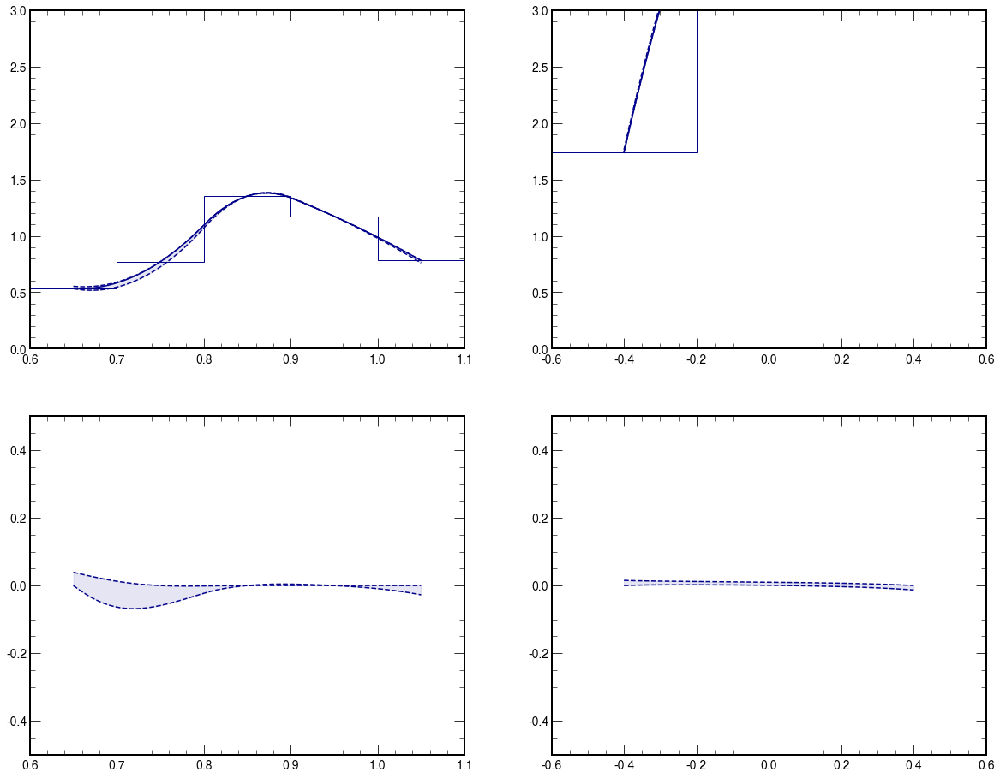

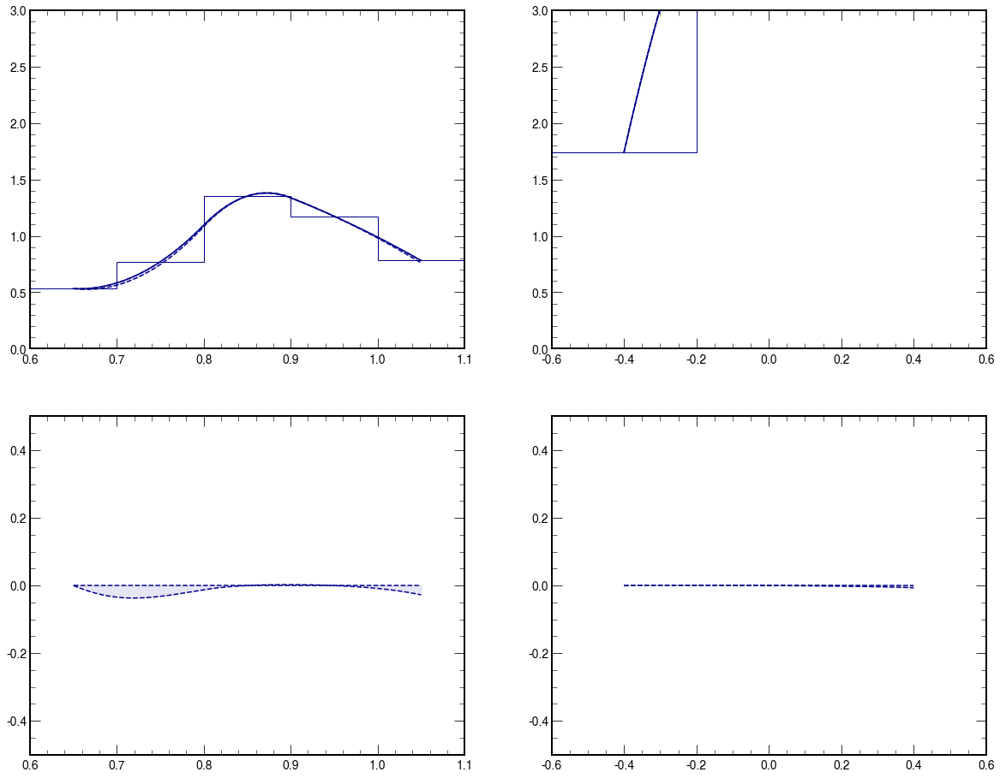

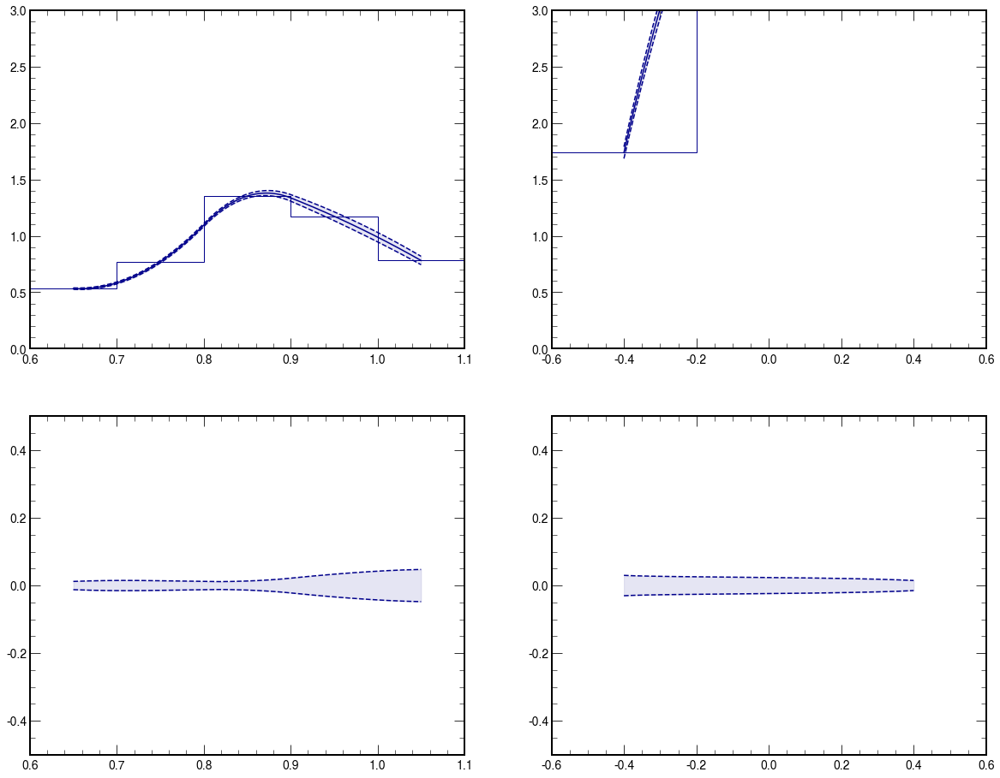

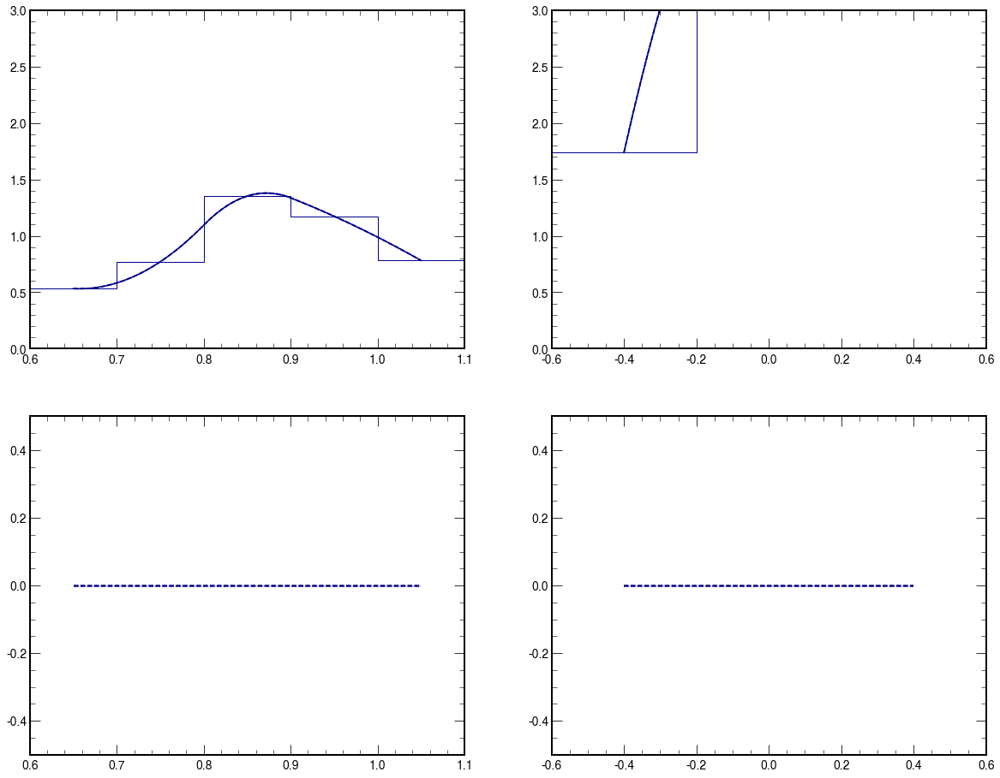

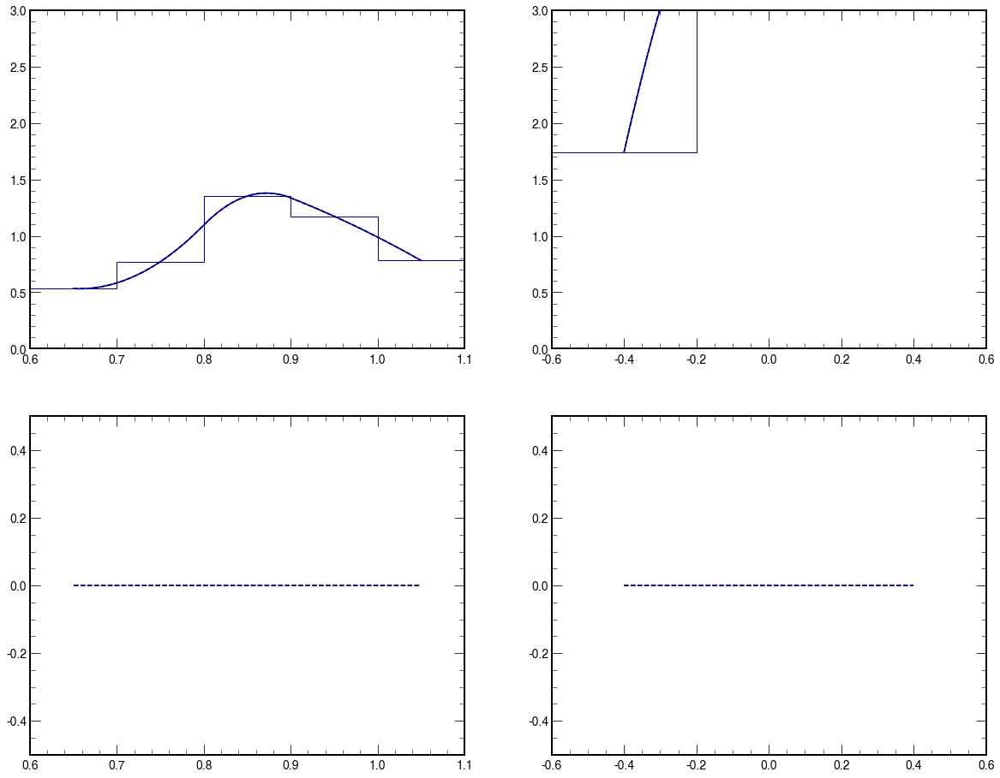

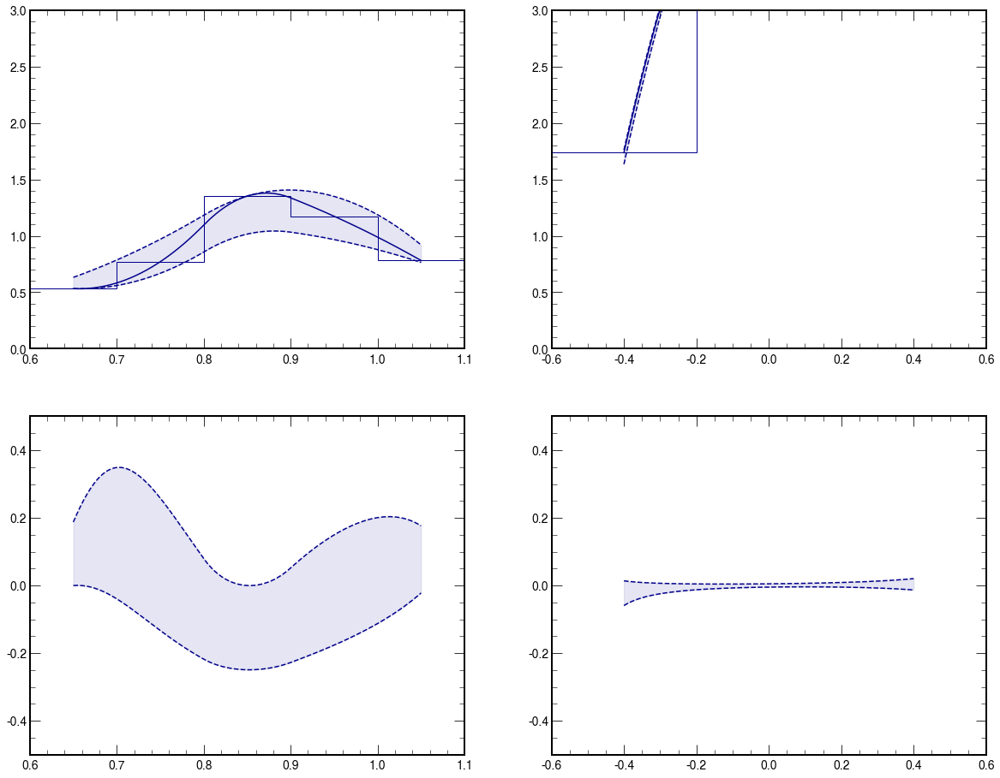

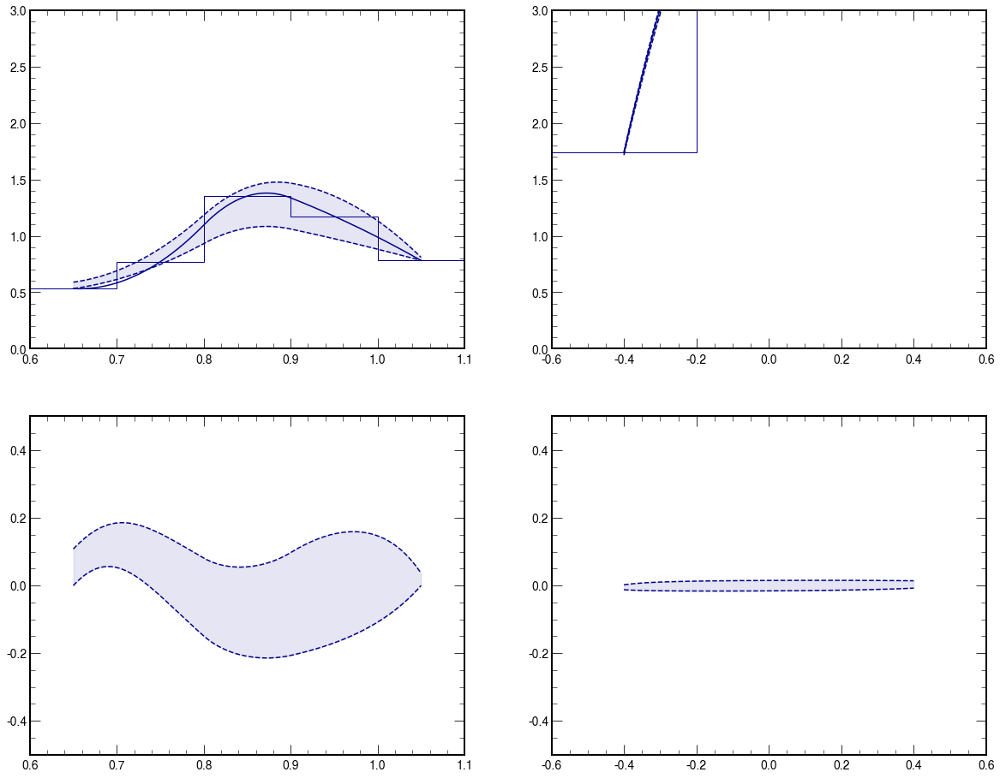

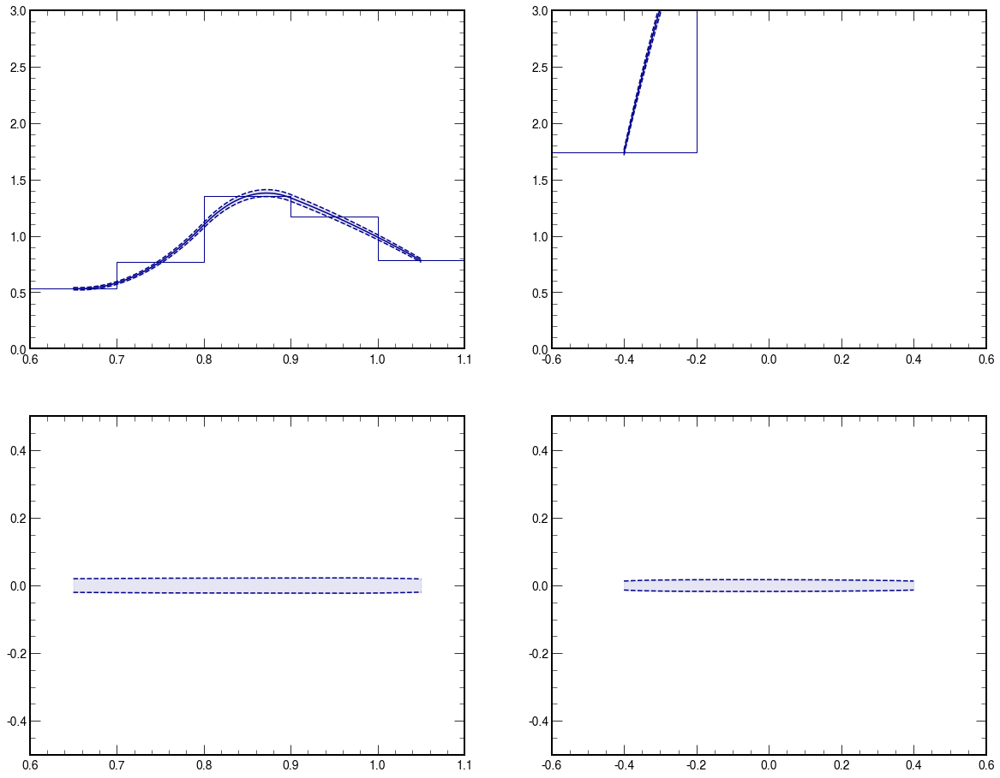

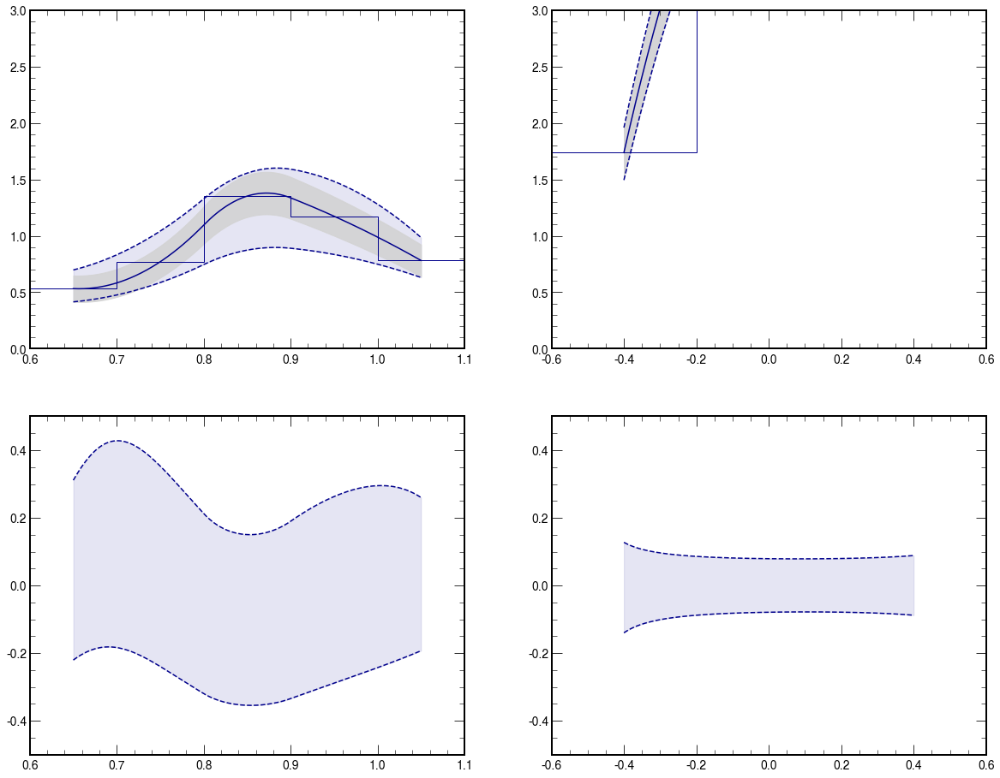

In [90]:
if data_sample == '2018':
    # ylim_ = (0.,0.3)
    ylim_ = (0.,3.)
    ylim_ratio_ = (-0.50,0.50)
    color_ = "darkblue"

    counts = {}
    err = {}
    bins = {}
    max_variations_total = {}
    min_variations_total = {}

    label_ = ""
    coupling_str_ = "A0W1e-6"
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

    counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
        df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
        weights_dict=weights_sig_plus_mix_categories_concat,
        lepton_type=lepton_type,
        label=label_,
        ylim=ylim_,
        ylim_ratio=ylim_ratio_,
        color=color_
        )

GGToWW-AQGC-2018-electron-A0W1e-7
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.24425635 0.3382311  0.34041578 0.1912661  0.05781655]
[0.23853042 0.33212465 0.33417451 0.17937199 0.05781655]
0      0.024005
1      0.022557
2      0.021174
3      0.019854
4      0.018593
         ...   
195   -0.005582
196   -0.004435
197   -0.003134
198   -0.001662
199    0.000000
Length: 200, dtype: float64 0.005039792978652875
0     -4.654430e-16
1     -1.266425e-03
2     -2.472190e-03
3     -3.619972e-03
4     -4.712274e-03
           ...     
195   -3.172414e-02
196   -2.496094e-02
197   -1.747425e-02
198   -9.184417e-03
199    0.000000e+00
Length: 200, dtype: float64 -0.028568649766819155
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.37383902 0.8413264  0.43855226]
[0.36818633 0.84061773 0.43783444]
0     -0.003254
1     -0.003169
2     -0.003087
3     -0.003009
4     -0.002933
         ...   
195    0.013061
196    0.013452
197    0.013860
198    0.014287
199    0.014735
Length: 20

GGToWW-AQGC-2018-electron-A0W1e-7
R_MWW_MX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.24298449 0.34568802 0.3425137  0.1958672  0.05909455]
[0.23407635 0.33077418 0.32583532 0.186665   0.05653854]
0      0.018673
1      0.018760
2      0.018845
3      0.018929
4      0.019011
         ...   
195    0.022245
196    0.022208
197    0.022173
198    0.022138
199    0.022104
Length: 200, dtype: float64 0.02297858388024091
0     -0.018673
1     -0.018760
2     -0.018845
3     -0.018929
4     -0.019011
         ...   
195   -0.022245
196   -0.022208
197   -0.022173
198   -0.022138
199   -0.022104
Length: 200, dtype: float64 -0.02297858388024069
Diff_YWW_YX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.3806772  0.85929497 0.43980211]
[0.36944204 0.82167328 0.42456577]
0      0.014978
1      0.015287
2      0.015579
3      0.015856
4      0.016118
         ...   
195    0.018345
196    0.018178
197    0.018003
198    0.017820
199    0.017627
Length: 200, dtype: float64 0.0208959197

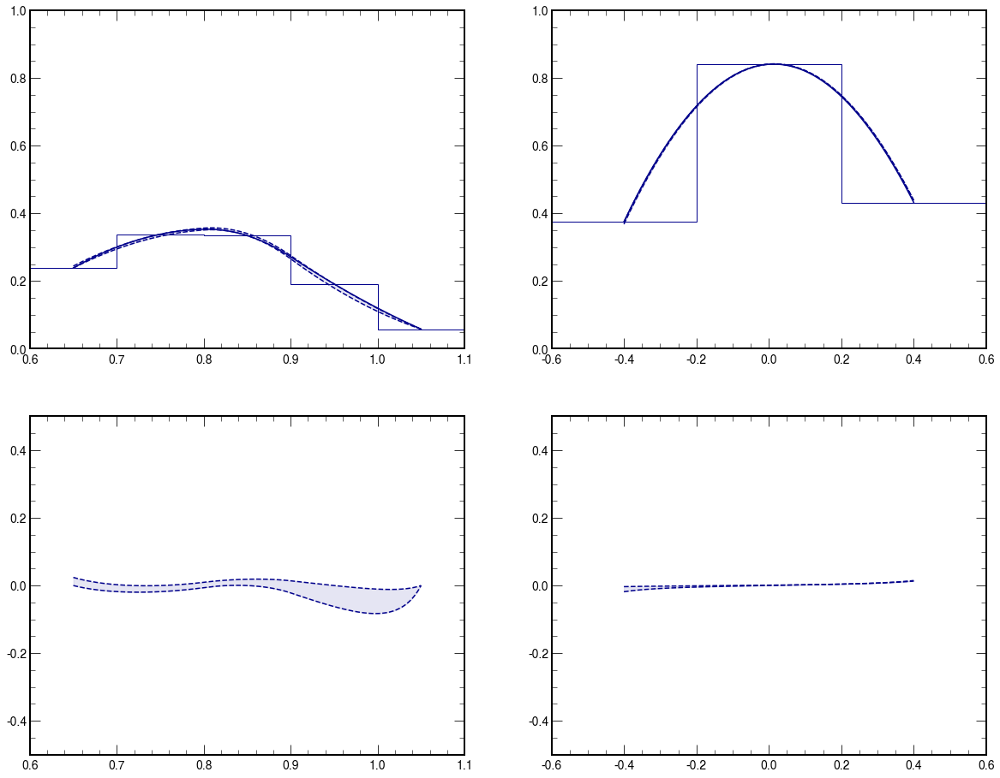

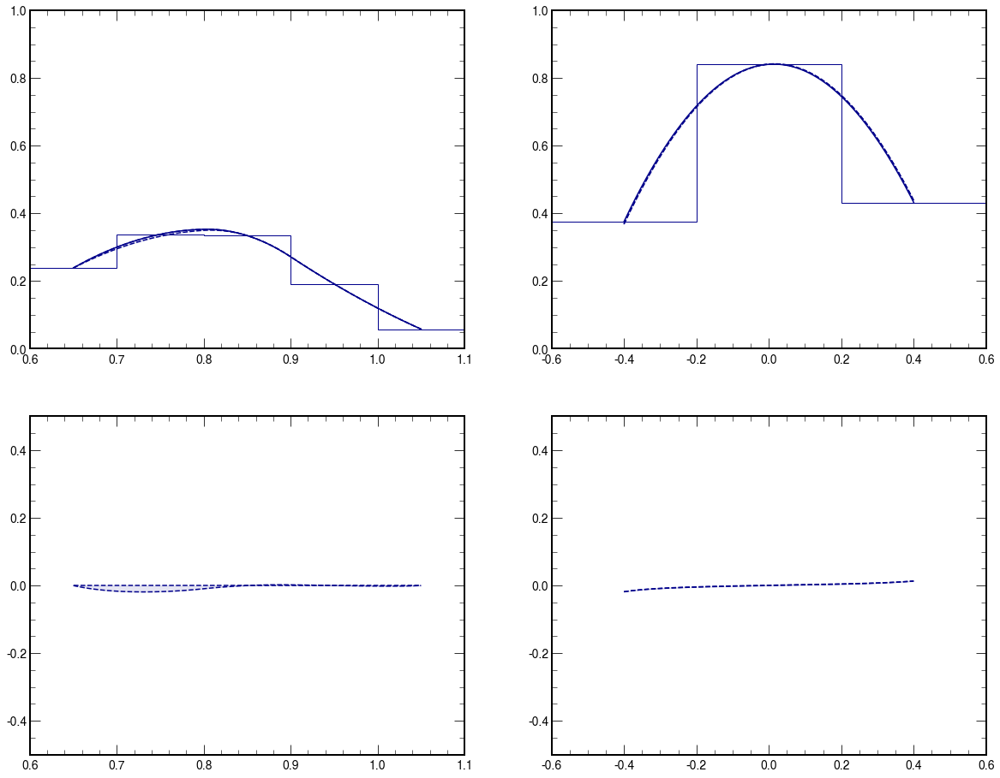

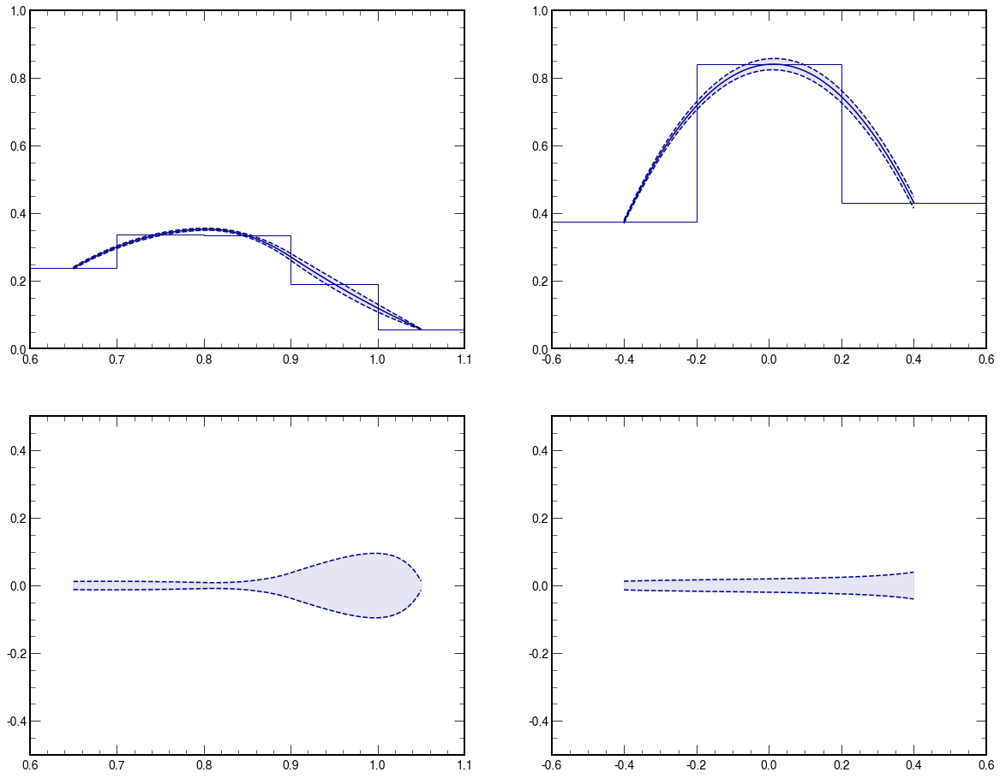

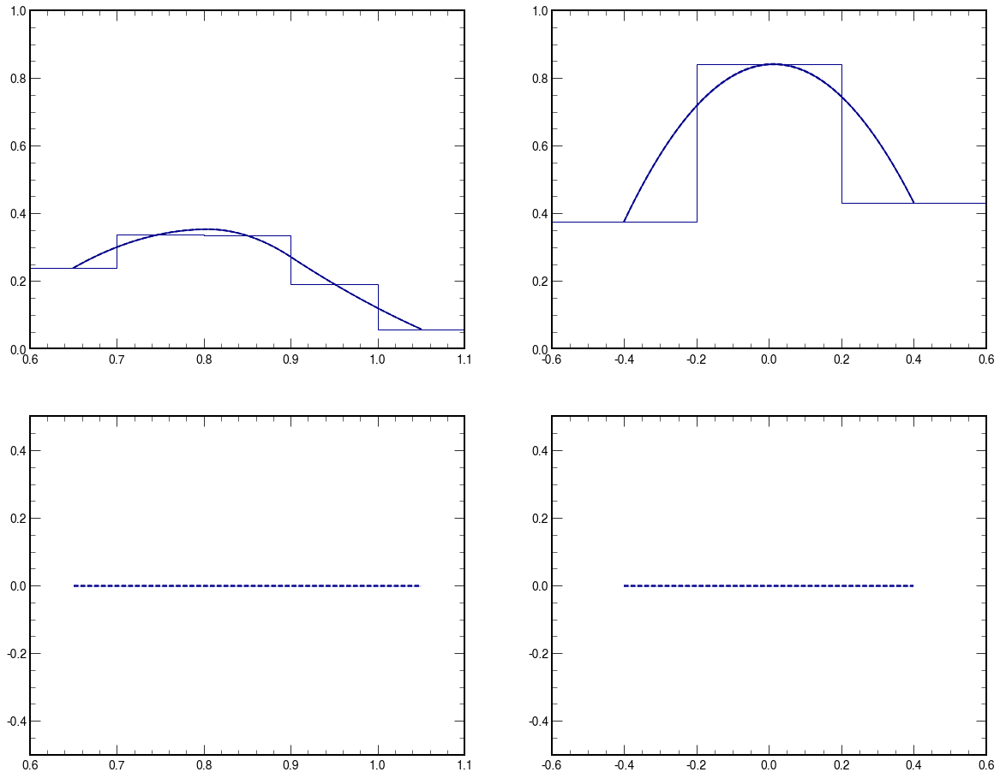

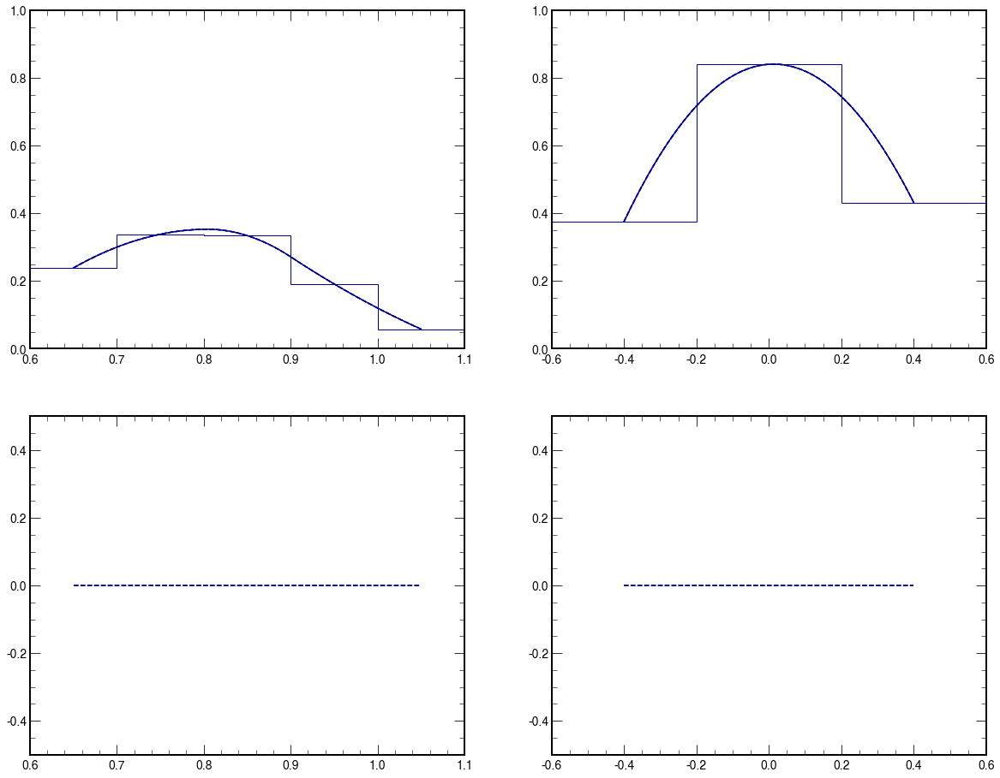

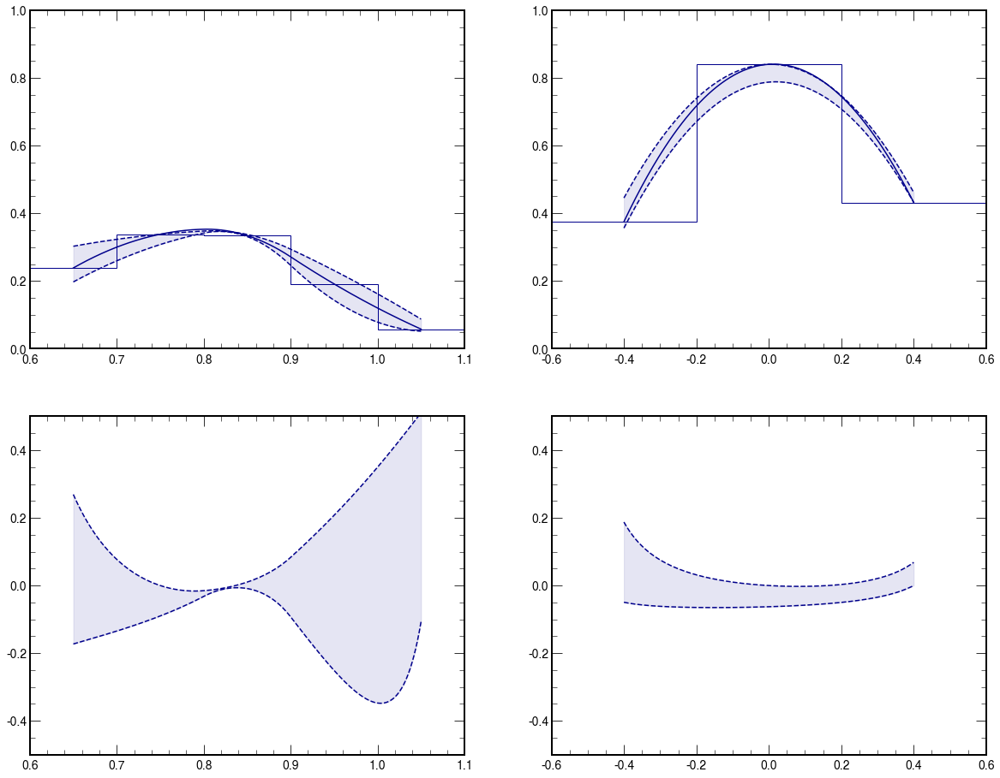

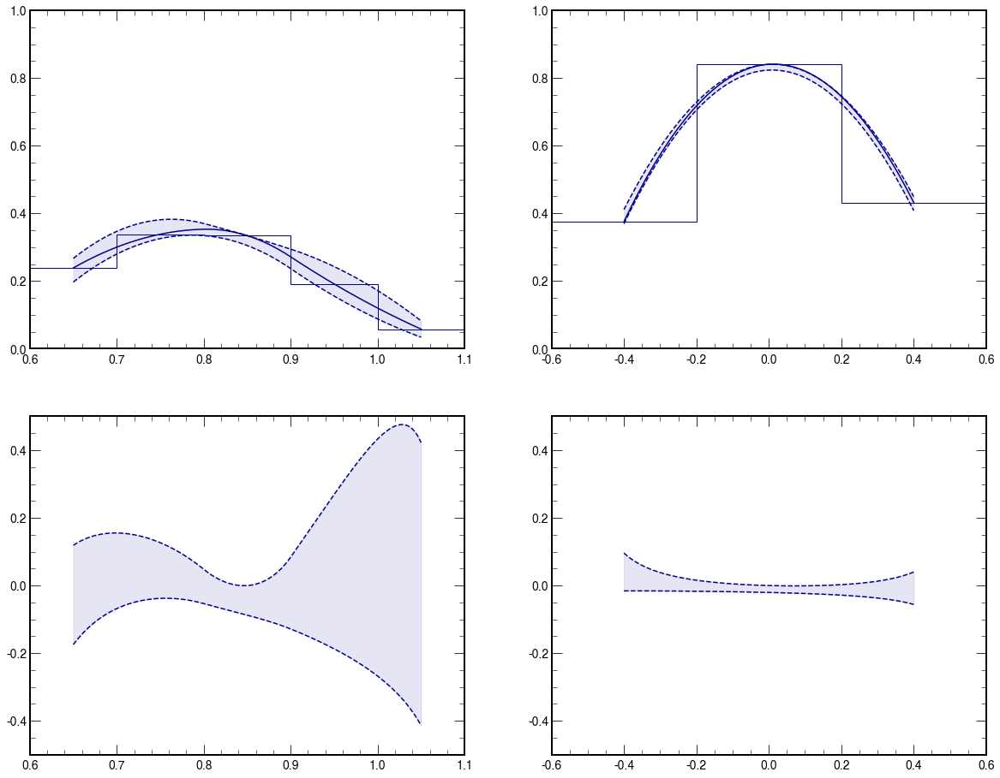

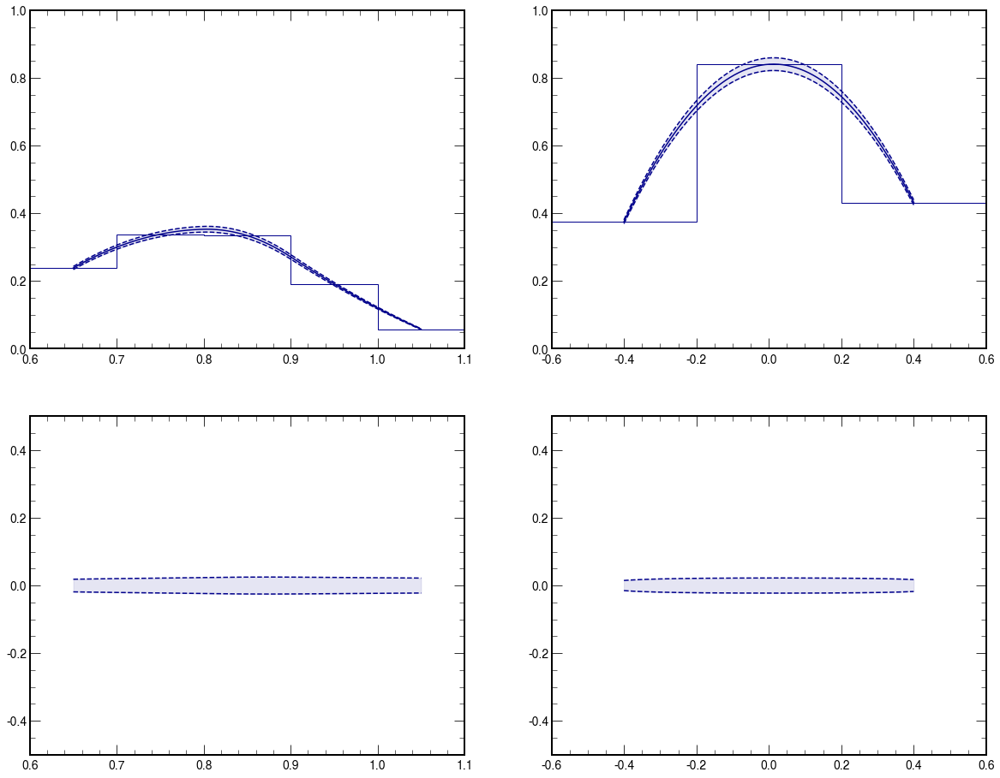

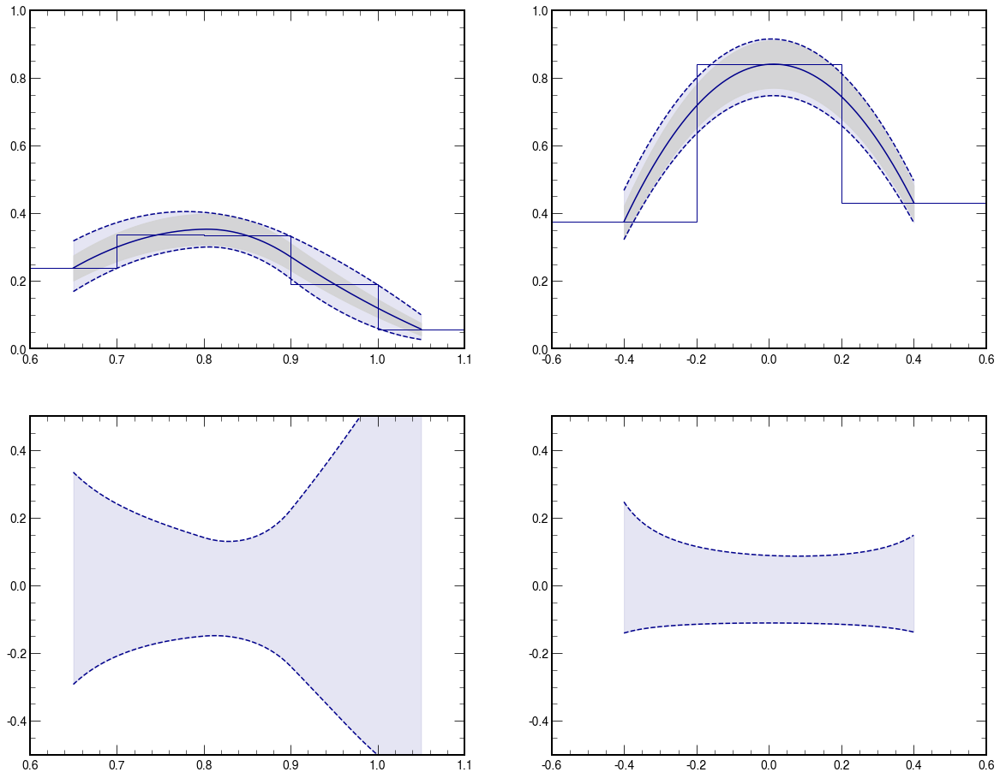

In [91]:
# ylim_ = (0.,0.3)
ylim_ = (0.,1.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "A0W1e-7"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-7-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-7-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-7-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-7-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-A0W2e-7
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.37835051 0.35041215 0.32934462 0.20661251 0.05176264]
[0.37727851 0.34411508 0.32934462 0.20661251 0.05176264]
0     -0.014079
1     -0.013670
2     -0.013264
3     -0.012863
4     -0.012465
         ...   
195    0.000088
196    0.000071
197    0.000051
198    0.000028
199    0.000000
Length: 200, dtype: float64 -0.001342748263435552
0     -0.016873
1     -0.017125
2     -0.017368
3     -0.017603
4     -0.017830
         ...   
195   -0.000818
196   -0.000660
197   -0.000474
198   -0.000257
199    0.000000
Length: 200, dtype: float64 -0.007026232341435527
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.38426439 0.89641352 0.64650974]
[0.3839509  0.89011646 0.64557985]
0      0.000816
1      0.000937
2      0.001050
3      0.001156
4      0.001254
         ...   
195   -0.016480
196   -0.016882
197   -0.017294
198   -0.017718
199   -0.018153
Length: 200, dtype: float64 -0.0023964755295393775
0 

GGToWW-AQGC-2018-electron-A0W2e-7
R_MWW_MX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.39128512 0.35841561 0.33669423 0.21080673 0.05285921]
[0.37622192 0.34240869 0.32199501 0.20241828 0.05066607]
0      0.019626
1      0.019723
2      0.019820
3      0.019915
4      0.020009
         ...   
195    0.020448
196    0.020594
197    0.020763
198    0.020958
199    0.021185
Length: 200, dtype: float64 0.02140434699973553
0     -0.019626
1     -0.019723
2     -0.019820
3     -0.019915
4     -0.020009
         ...   
195   -0.020448
196   -0.020594
197   -0.020763
198   -0.020958
199   -0.021185
Length: 200, dtype: float64 -0.021404346999732572
Diff_YWW_YX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.3910413  0.91592864 0.66855484]
[0.3768605  0.8768984  0.64837075]
0      0.018467
1      0.018644
2      0.018811
3      0.018969
4      0.019119
         ...   
195    0.015959
196    0.015808
197    0.015652
198    0.015491
199    0.015327
Length: 200, dtype: float64 0.020473678

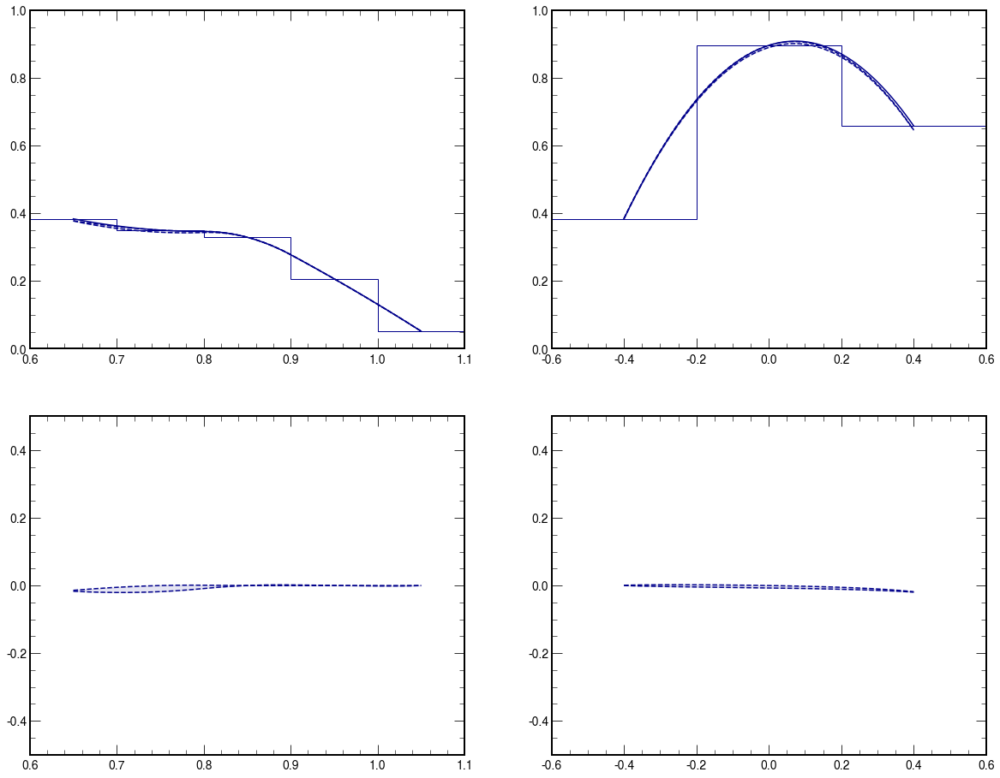

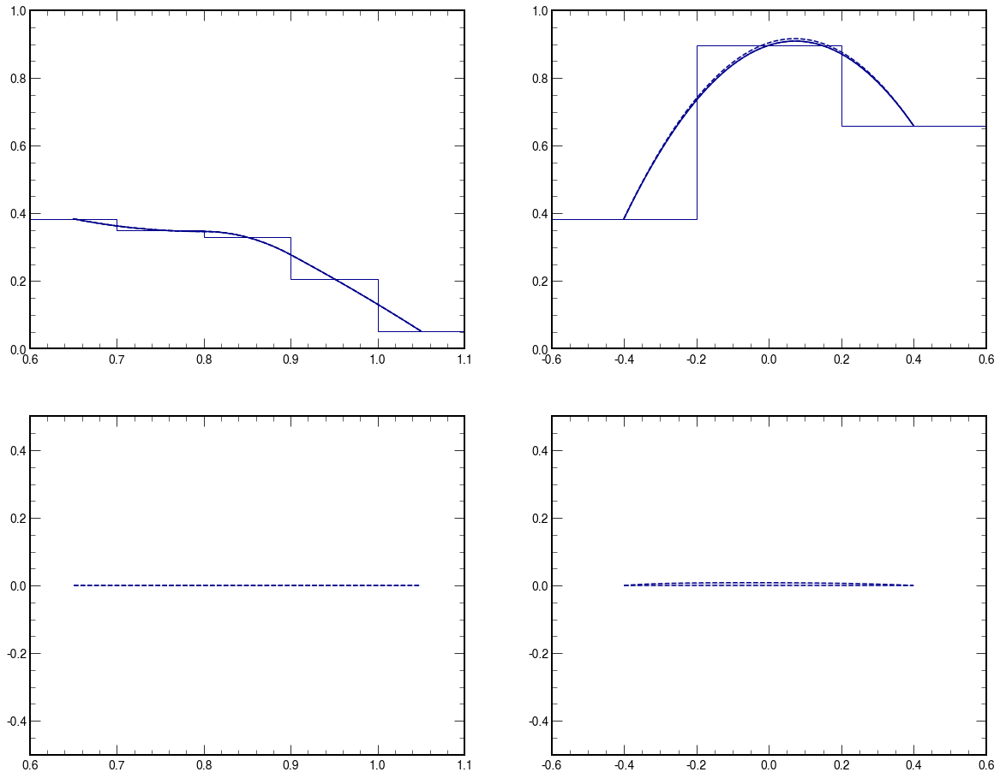

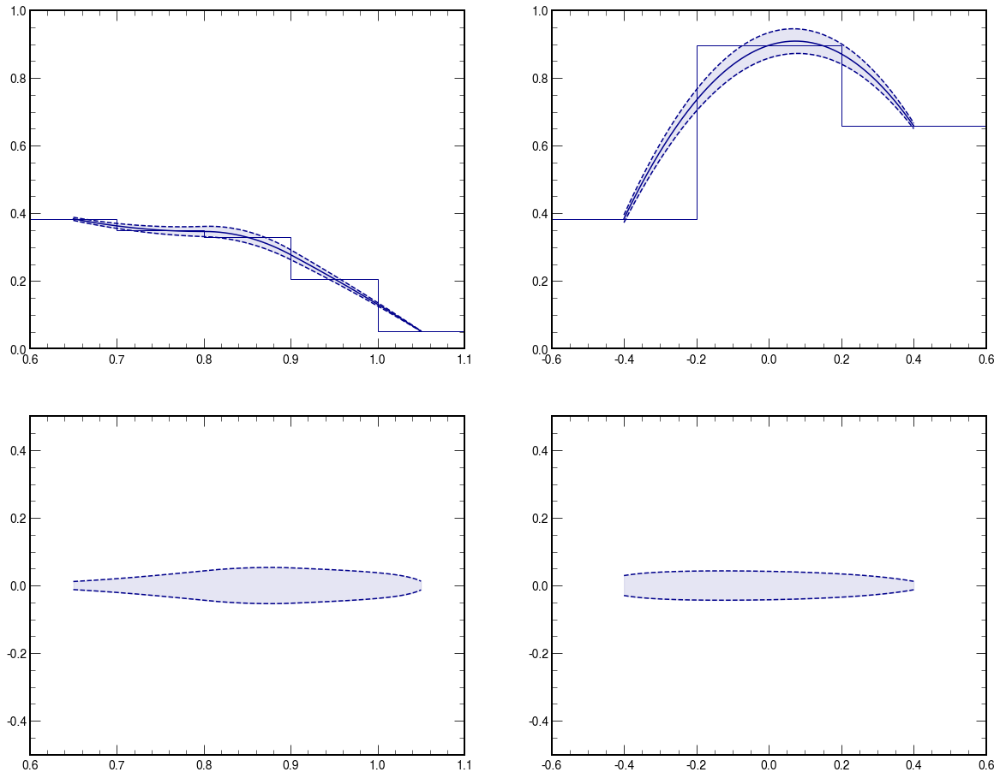

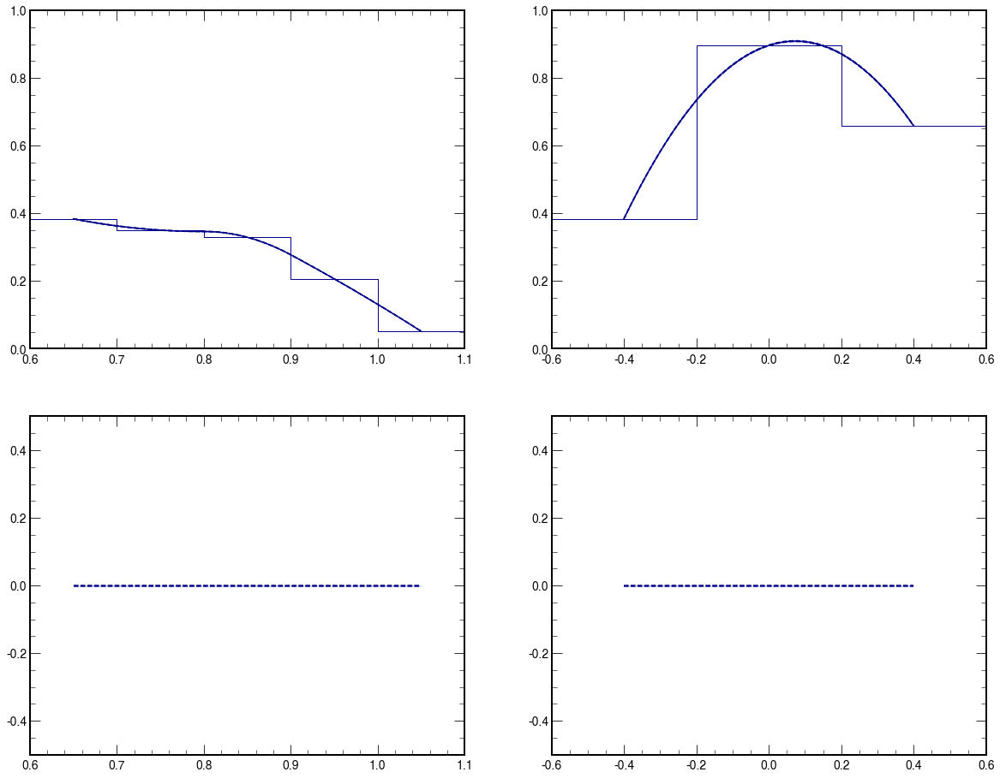

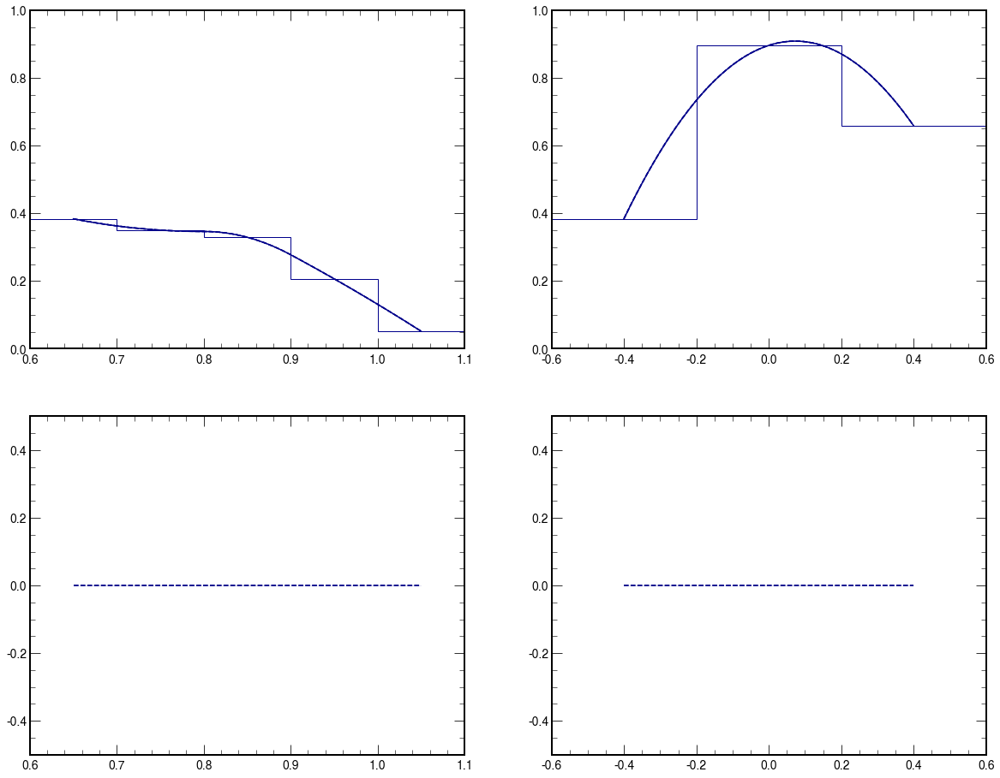

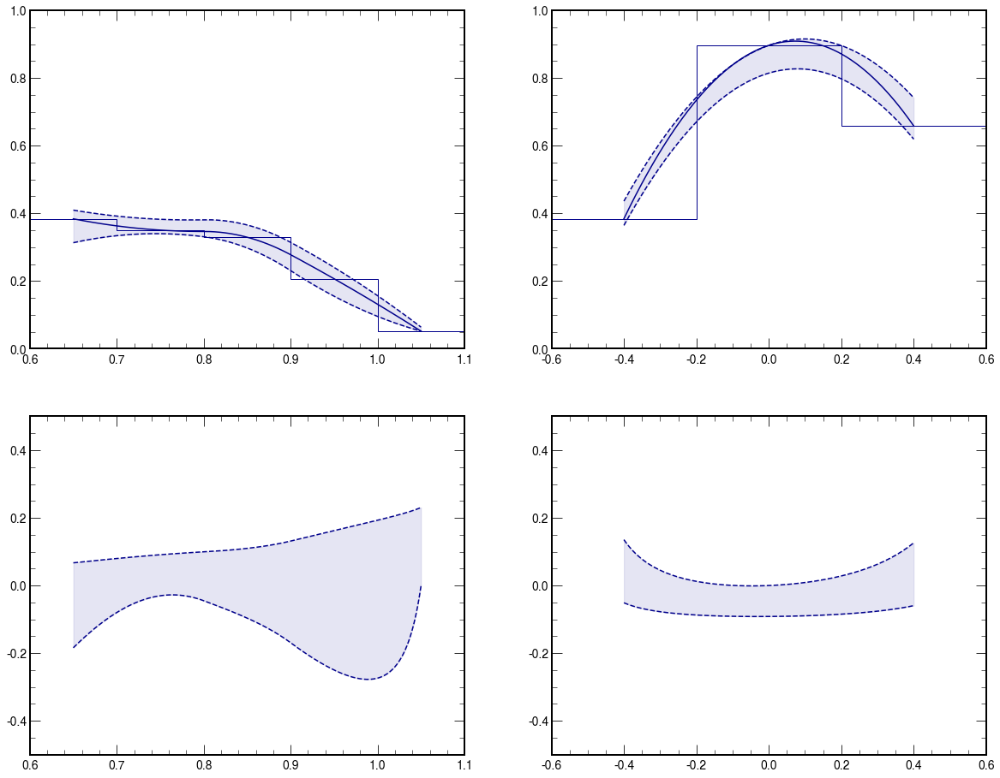

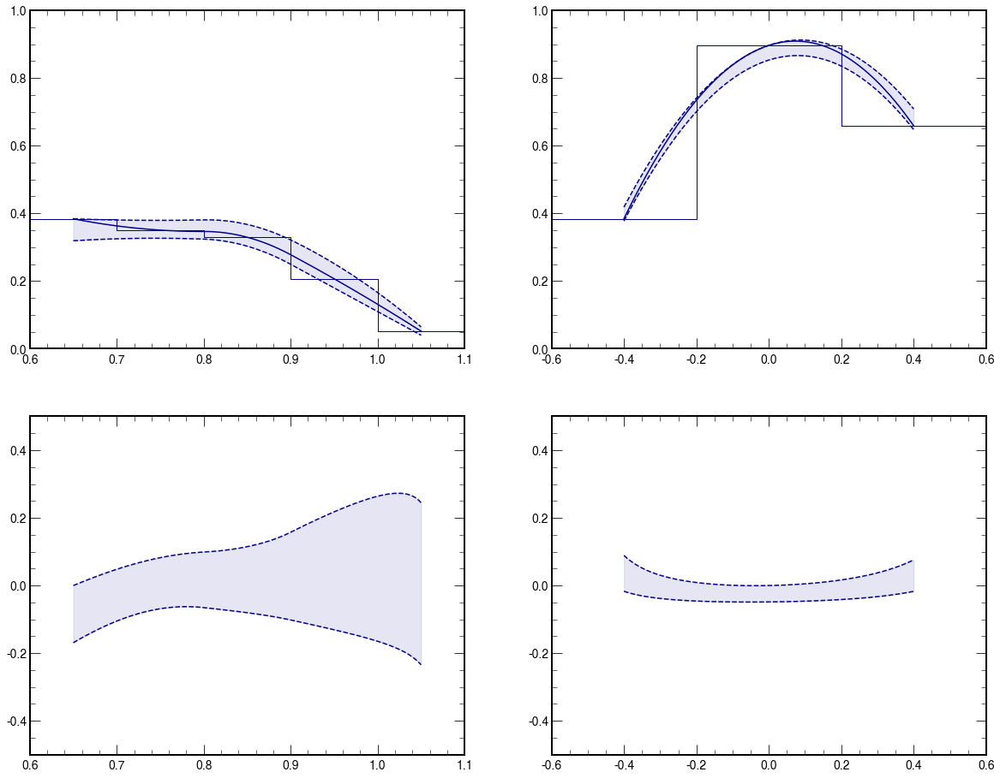

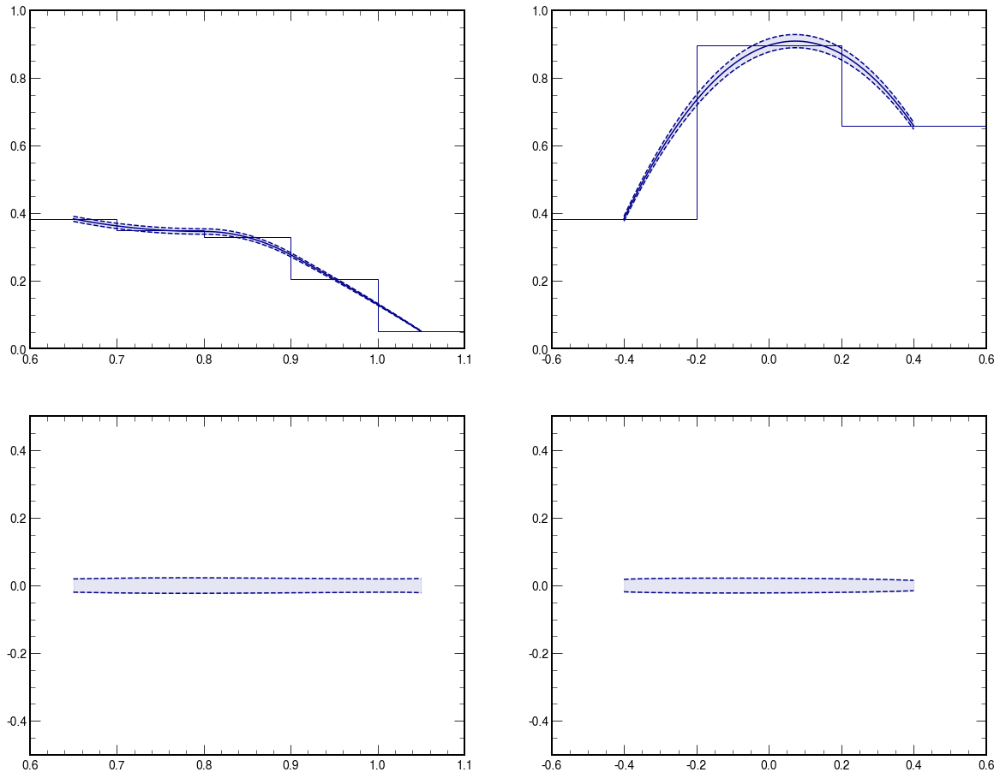

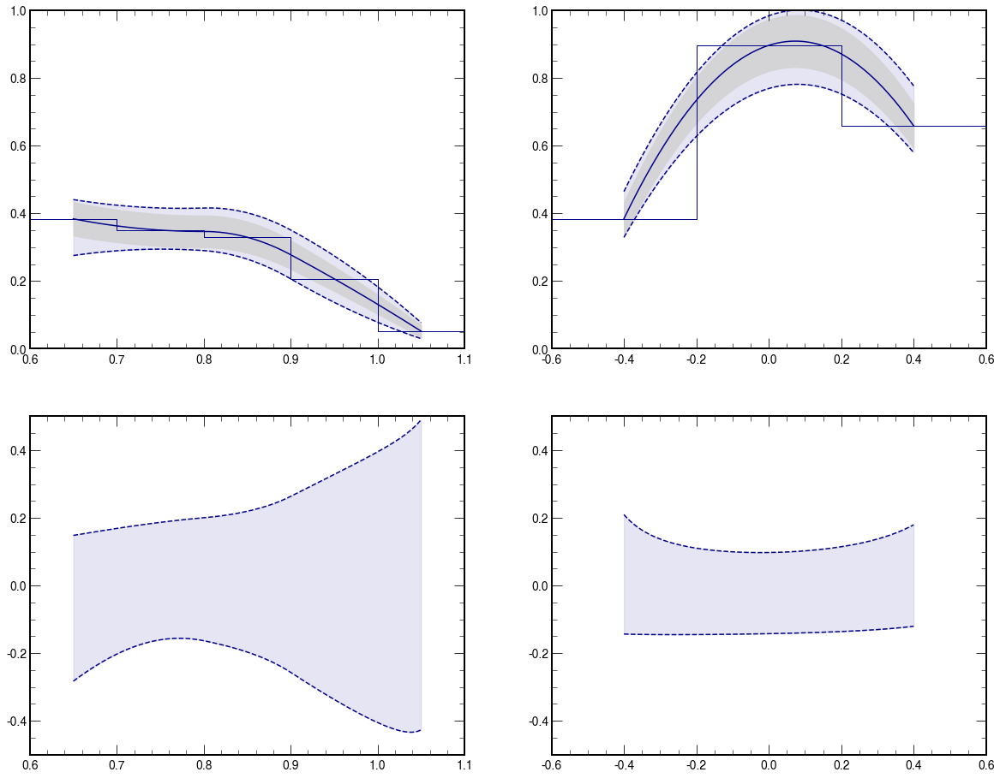

In [92]:
# ylim_ = (0.,0.3)
ylim_ = (0.,1.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "A0W2e-7"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-7-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-7-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-7-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-7-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-A0W1e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.55326098 0.77083667 1.35288817 1.17417712 0.7819594 ]
[0.53242321 0.7253971  1.35288817 1.17417712 0.7604888 ]
0      0.039138
1      0.037943
2      0.036749
3      0.035557
4      0.034368
         ...   
195   -0.000027
196   -0.000021
197   -0.000014
198   -0.000007
199    0.000000
Length: 200, dtype: float64 0.0036558873562976824
0      0.000000
1     -0.003846
2     -0.007610
3     -0.011287
4     -0.014873
         ...   
195   -0.023565
196   -0.024495
197   -0.025453
198   -0.026440
199   -0.027457
Length: 200, dtype: float64 -0.02124120996261431
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[1.76454102 5.14167083 3.75849103]
[1.73808232 5.09546821 3.70870692]
0      1.522293e-02
1      1.507823e-02
2      1.494223e-02
3      1.481403e-02
4      1.469289e-02
           ...     
195    8.844266e-04
196    6.722765e-04
197    4.543214e-04
198    2.303158e-04
199   -4.726250e-16
Length: 20

GGToWW-AQGC-2018-electron-A0W1e-6
R_MWW_MX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[0.54316911 0.78757703 1.38290265 1.20104226 0.79721749]
[0.52167731 0.75409631 1.32287368 1.14731198 0.7667013 ]
0      0.020183
1      0.020218
2      0.020254
3      0.020291
4      0.020327
         ...   
195    0.020114
196    0.019972
197    0.019825
198    0.019672
199    0.019513
Length: 200, dtype: float64 0.021844309298752345
0     -0.020183
1     -0.020218
2     -0.020254
3     -0.020291
4     -0.020327
         ...   
195   -0.020114
196   -0.019972
197   -0.019825
198   -0.019672
199   -0.019513
Length: 200, dtype: float64 -0.021844309298752994
Diff_YWW_YX
_nom
_nom
proton_eff_up
_nom
_nom
proton_eff_dw
[1.76111503 5.18003656 3.80867758]
[1.71504962 5.00273092 3.70830448]
0      0.013252
1      0.013487
2      0.013705
3      0.013908
4      0.014098
         ...   
195    0.013771
196    0.013671
197    0.013568
198    0.013462
199    0.013353
Length: 200, dtype: float64 0.01639699

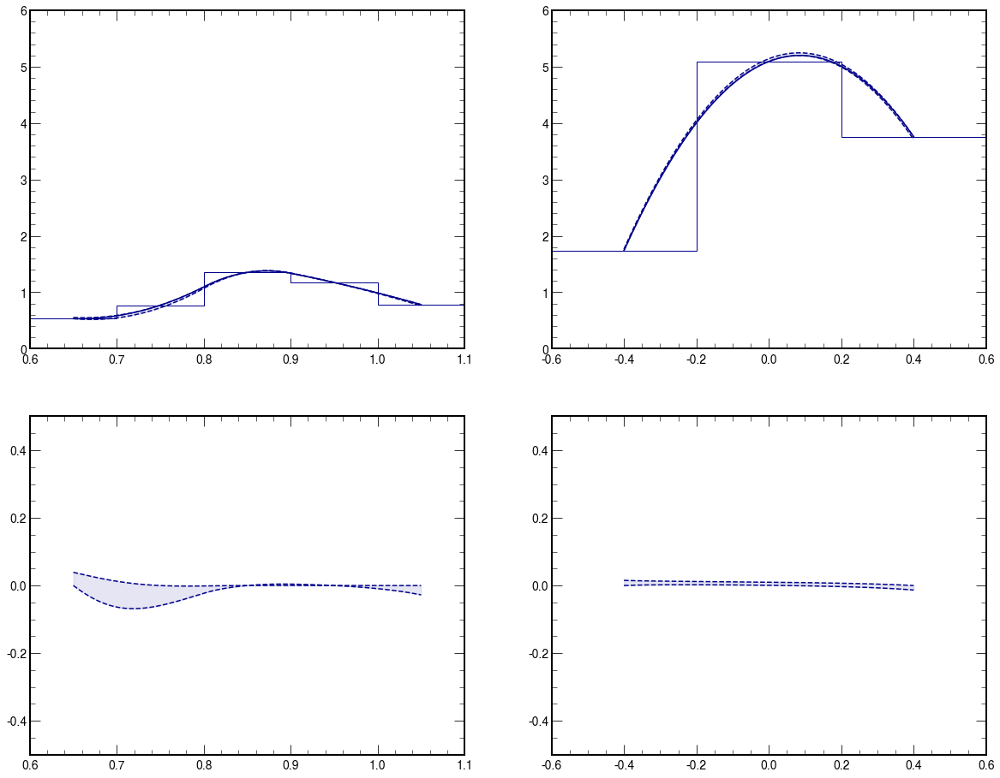

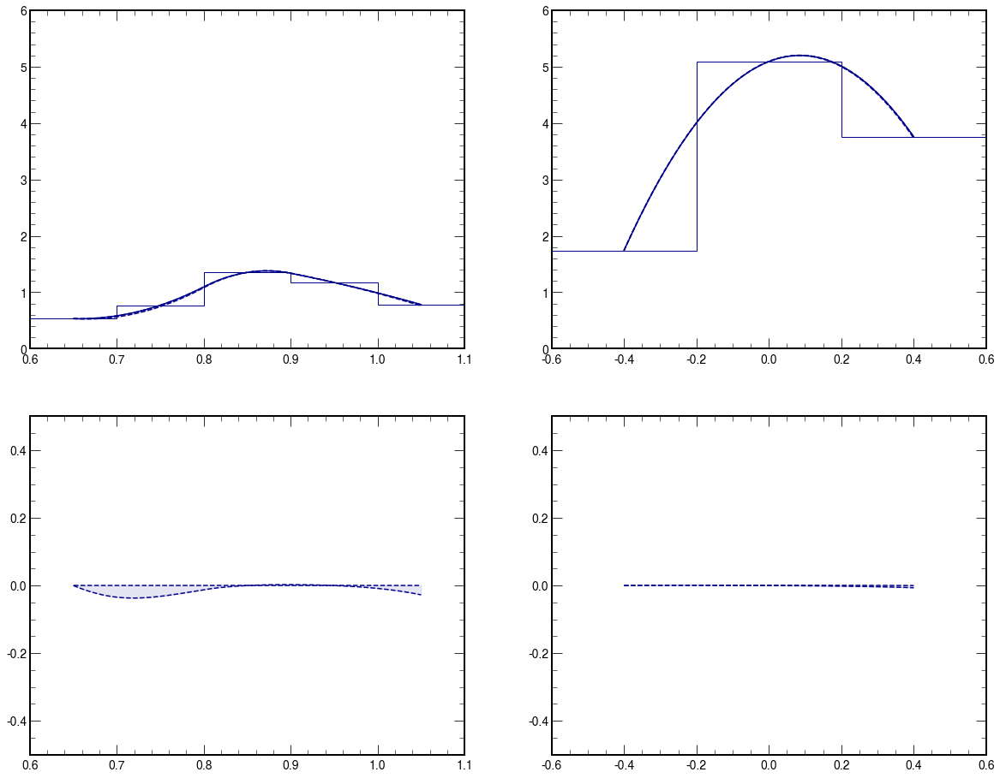

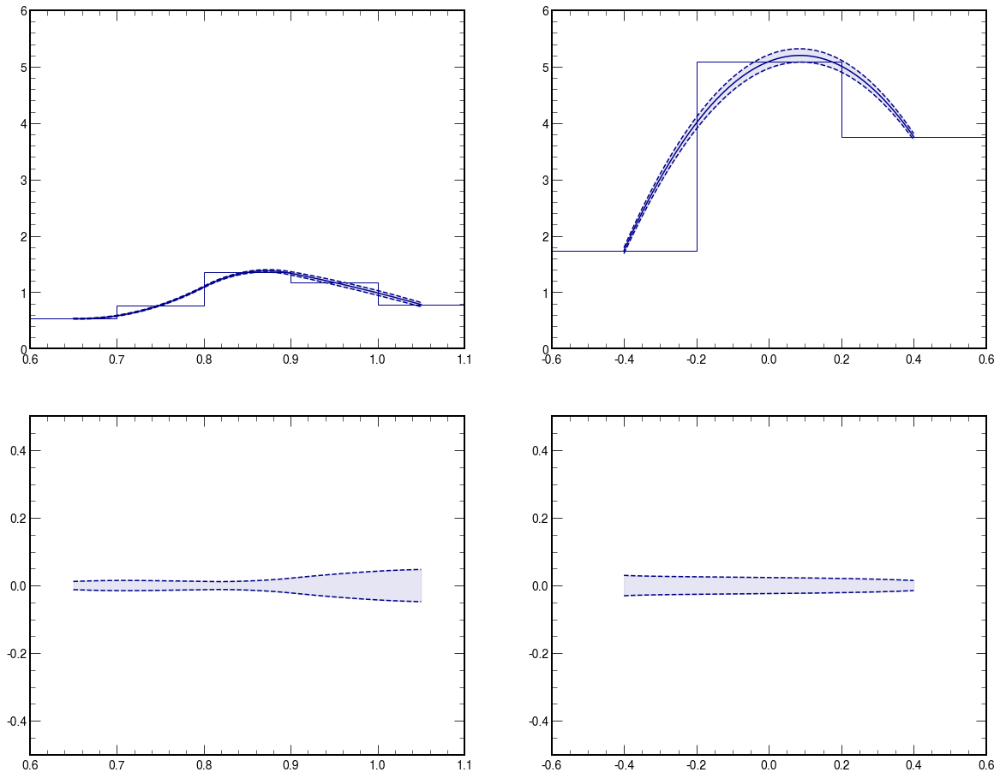

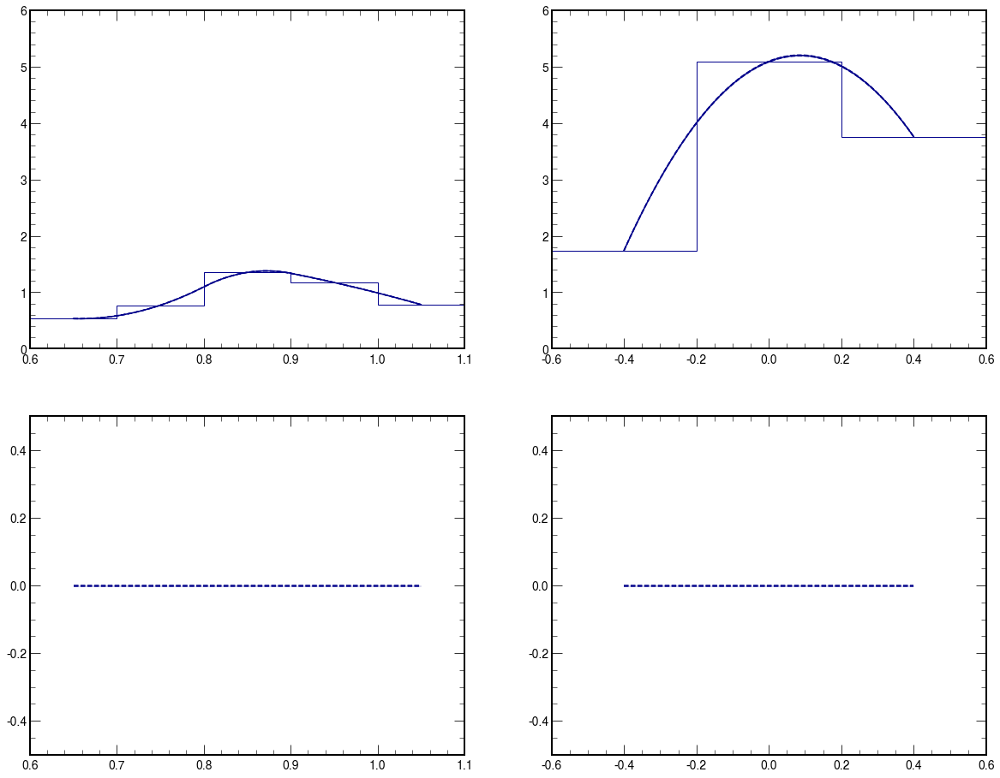

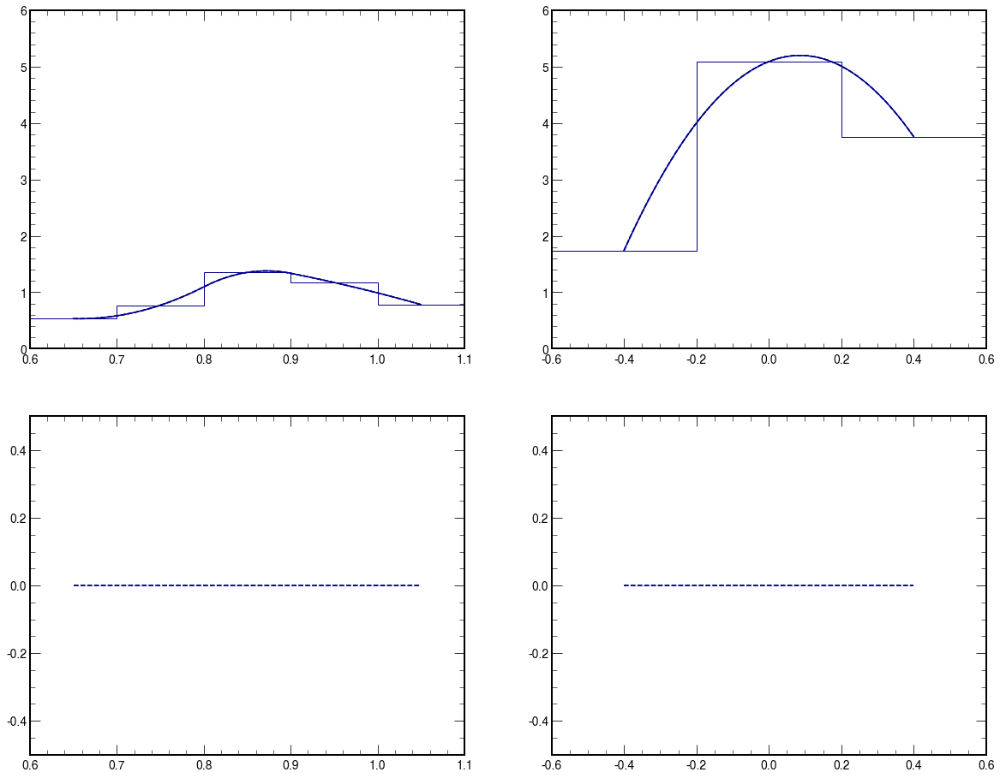

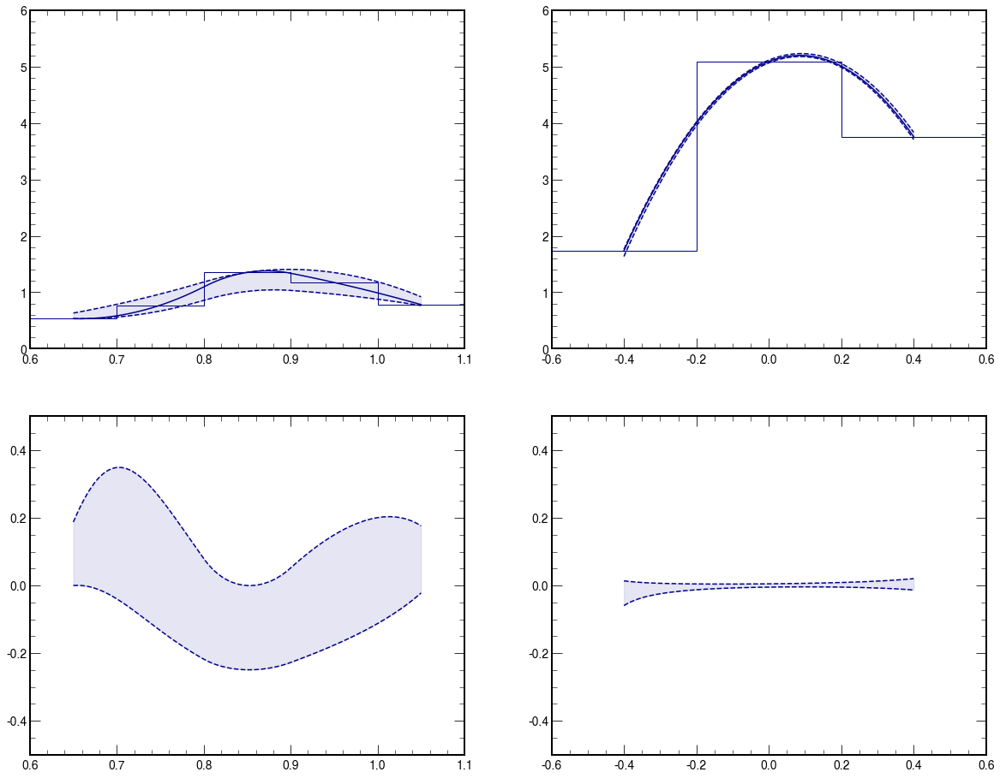

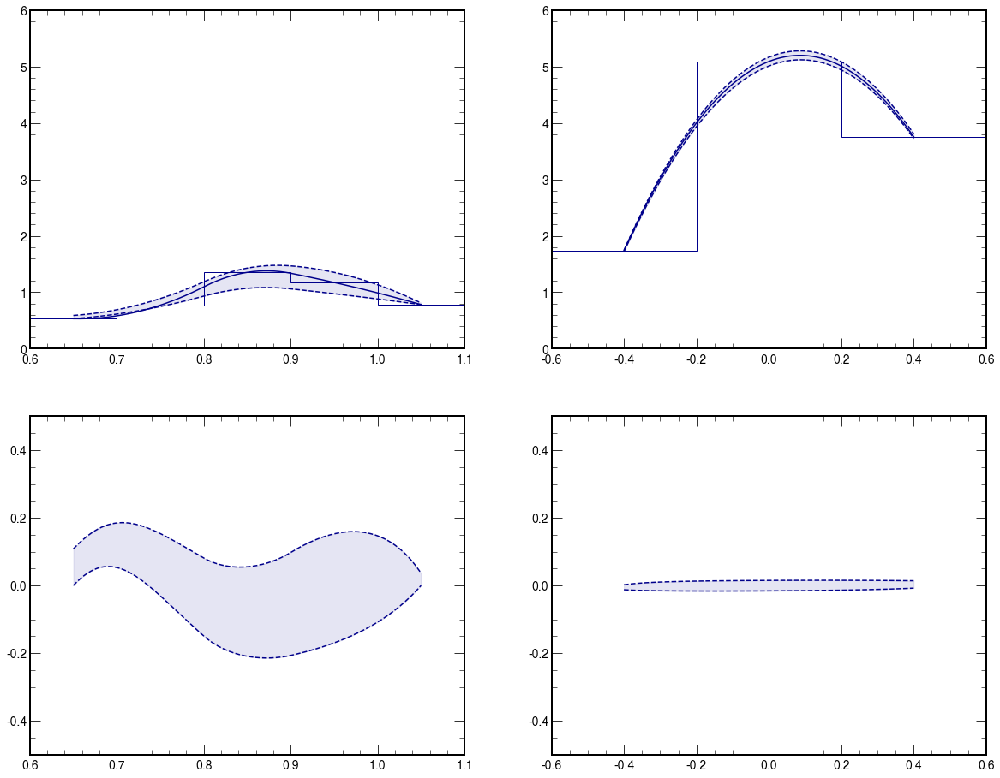

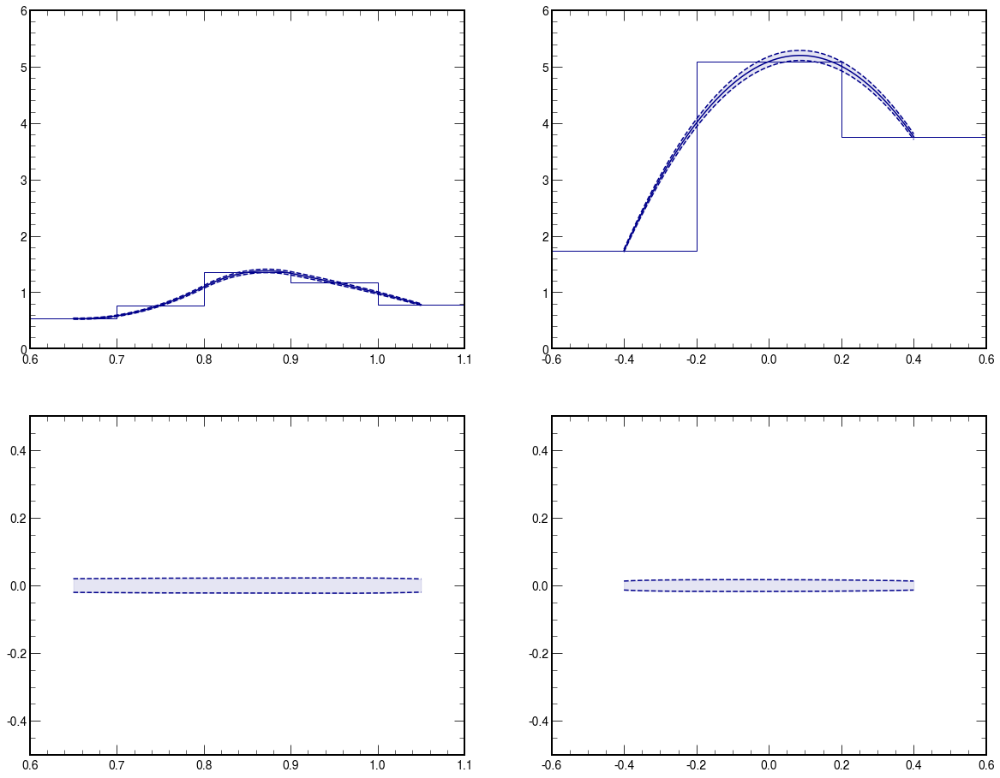

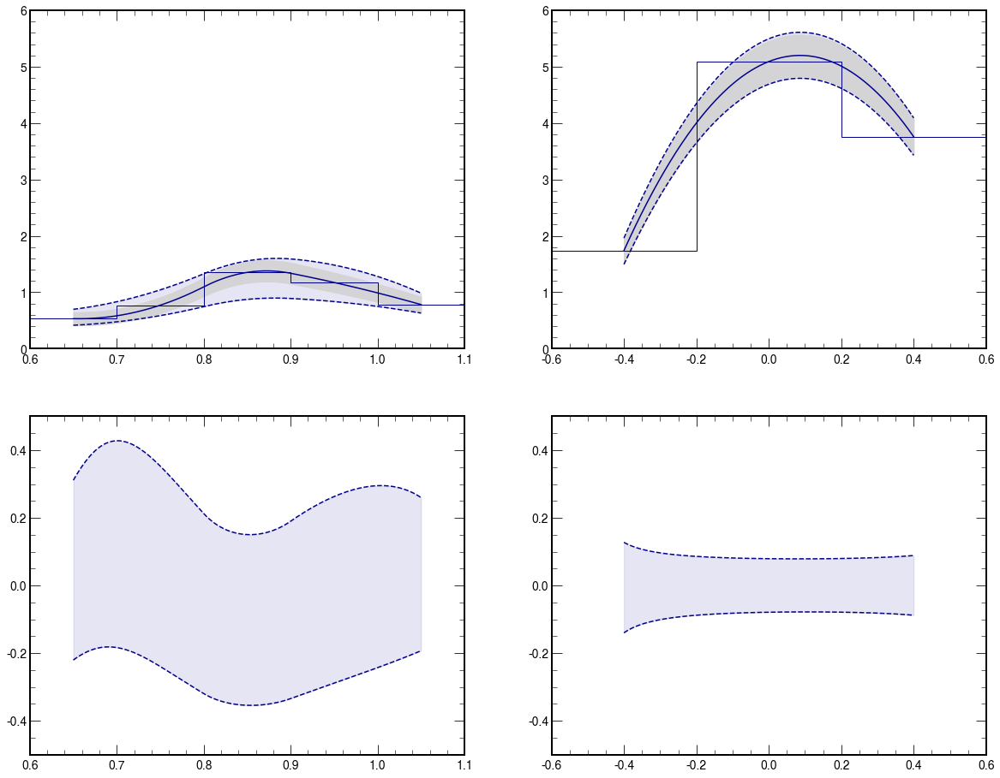

In [93]:
# ylim_ = (0.,0.3)
ylim_ = (0.,6.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-6-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-6-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-6-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W1e-6-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-A0W2e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[1.29192302 1.87992969 3.17175329 4.36150741 2.96385622]
[1.29192302 1.87992969 3.17175329 4.32699879 2.92668312]
0      0.000000
1      0.000004
2      0.000008
3      0.000011
4      0.000015
         ...   
195    0.000111
196    0.000086
197    0.000059
198    0.000030
199    0.000000
Length: 200, dtype: float64 0.00014860814739902273
0     -1.718714e-16
1     -5.538199e-05
2     -1.081138e-04
3     -1.581852e-04
4     -2.055900e-04
           ...     
195   -1.200045e-02
196   -1.212920e-02
197   -1.226213e-02
198   -1.239964e-02
199   -1.254214e-02
Length: 200, dtype: float64 -0.0033673332462474093
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[ 6.22332175 15.97261149  9.55019925]
[ 6.18726738 15.73448281  9.51582203]
0     -0.004871
1     -0.004369
2     -0.003898
3     -0.003454
4     -0.003037
         ...   
195    0.003480
196    0.003356
197    0.003226
198    0.003091
199    0.002950
L

GGToWW-AQGC-2018-electron-A0W2e-6
R_MWW_MX
[1.29192302 1.87992969 3.17175329 4.35947496 2.96385622]
[1.4965498  2.12948447 3.49623213 4.73972744 3.27712265]
[1.08729625 1.63037491 2.84727446 3.97922247 2.65058979]
[1.721315   2.23420838 3.93219547 4.77568774 3.32805583]
[1.07878505 1.38896694 2.4438046  3.50620113 2.61024913]
0      0.332367
1      0.324632
2      0.317096
3      0.309761
4      0.302632
         ...   
195    0.109737
196    0.112685
197    0.115847
198    0.119240
199    0.122880
Length: 200, dtype: float64 0.17651455483907136
0     -0.164977
1     -0.169078
2     -0.173097
3     -0.177032
4     -0.180882
         ...   
195   -0.131829
196   -0.128929
197   -0.125883
198   -0.122679
199   -0.119306
Length: 200, dtype: float64 -0.2142878018140398
Diff_YWW_YX
[ 6.25378319 15.86995086  9.52210444]
[ 6.7075427  16.59762597 10.08276444]
[ 5.80002368 15.14227575  8.96144443]
[ 6.86818132 16.88152908 10.23842479]
[ 5.6459519  14.85523753  8.86721068]
0      0.098244
1     

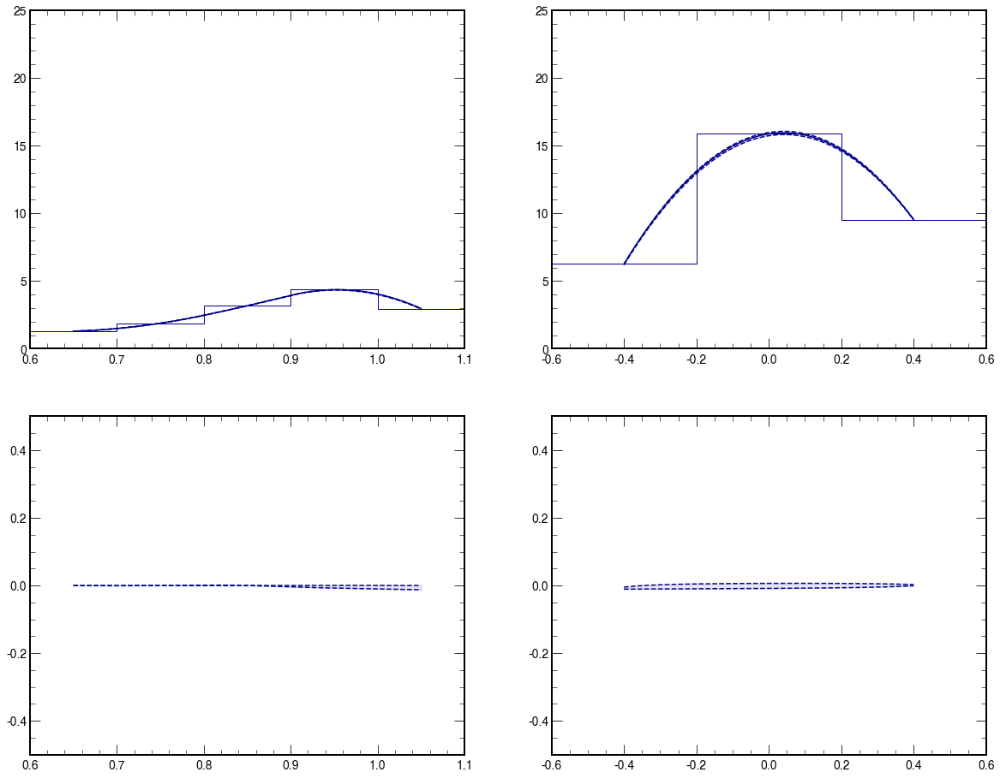

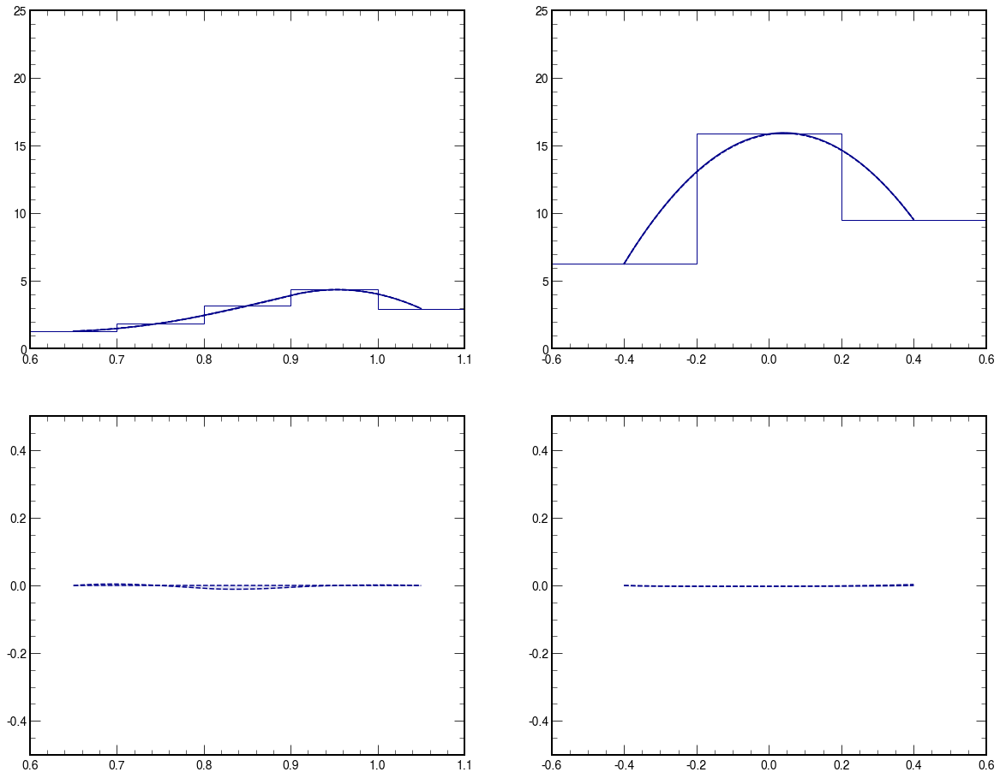

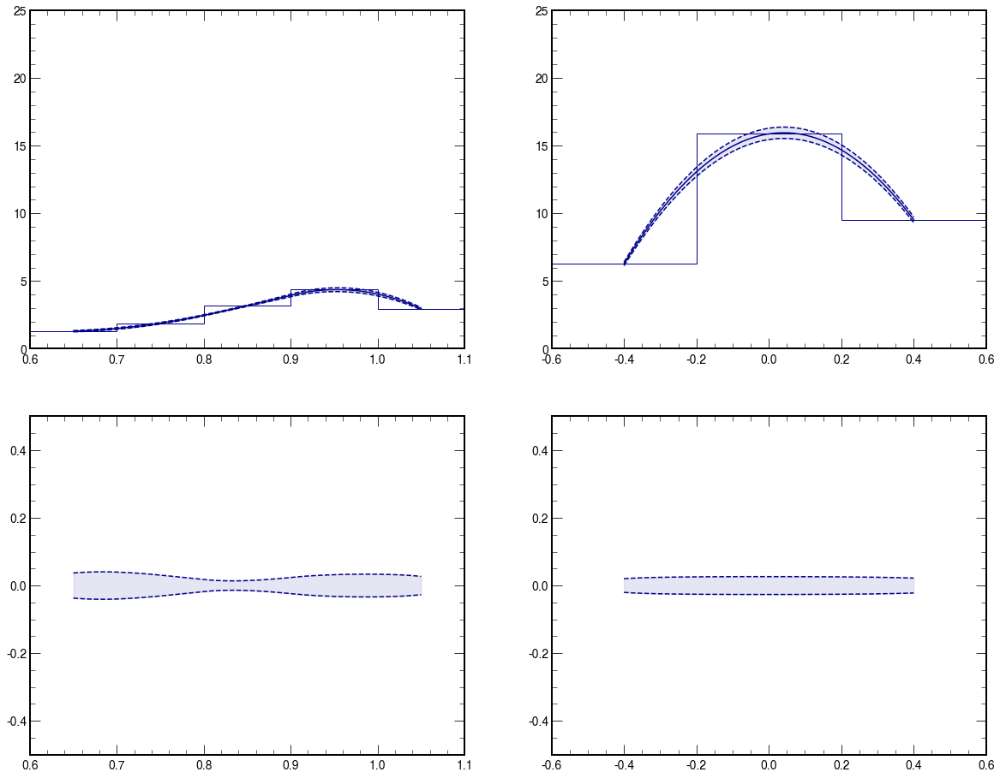

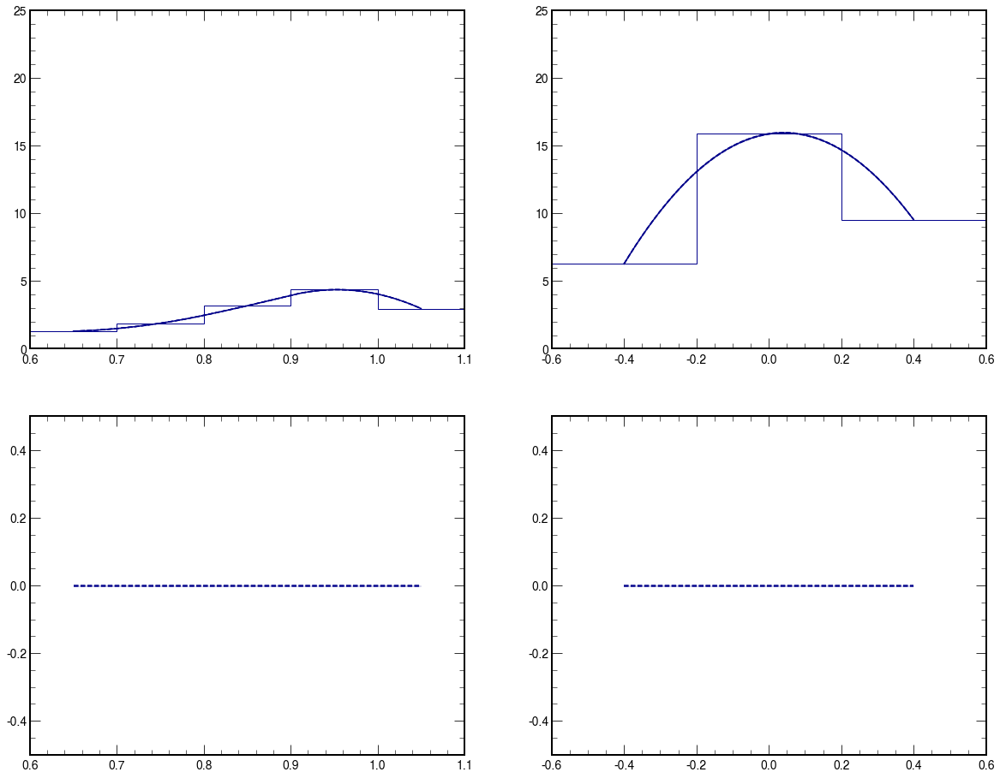

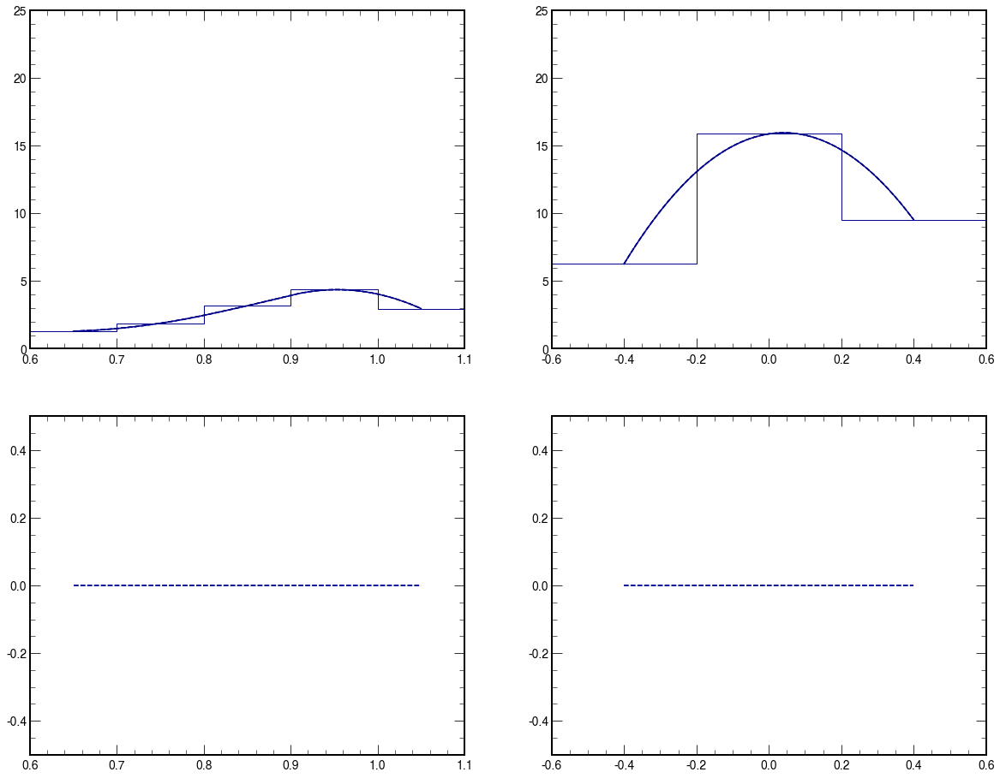

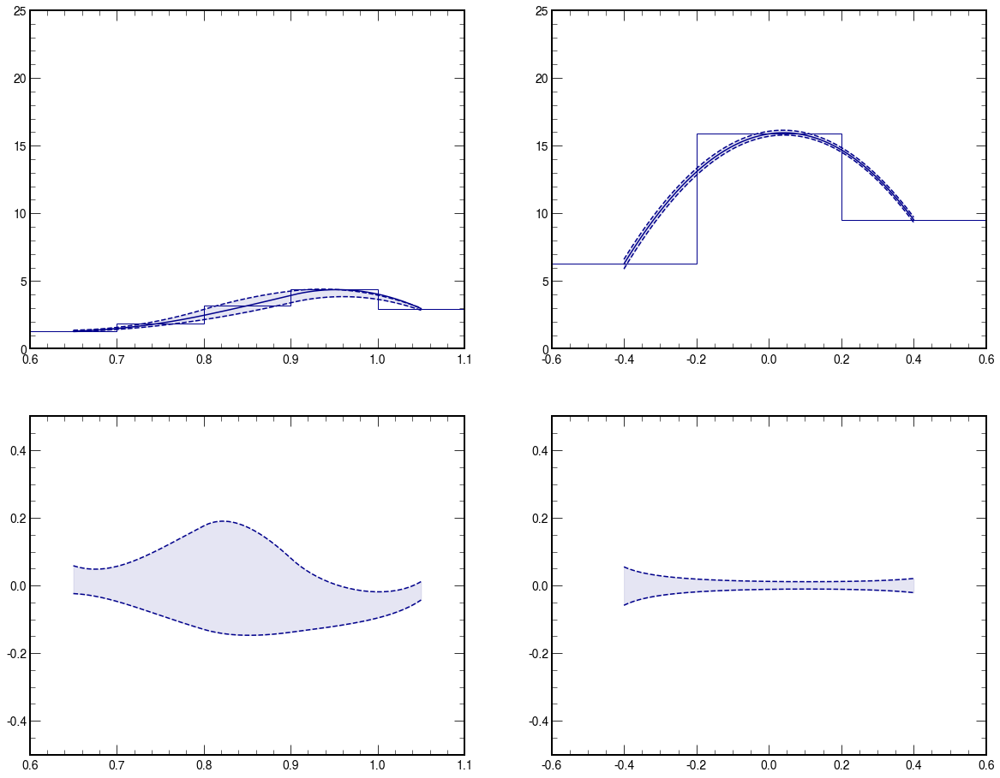

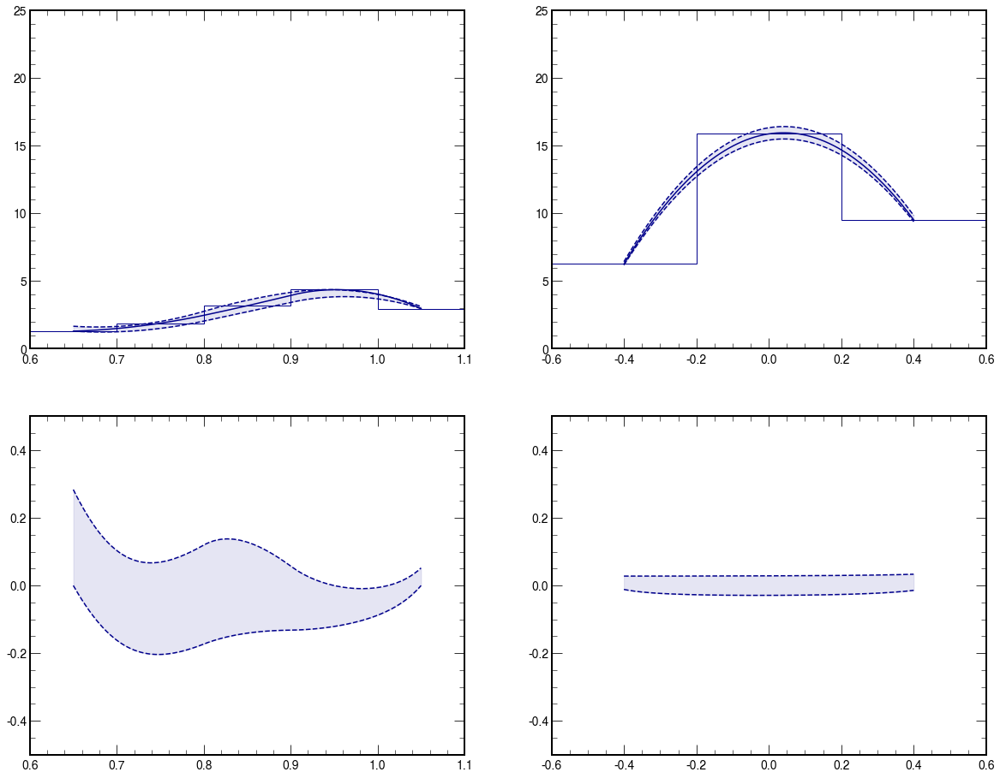

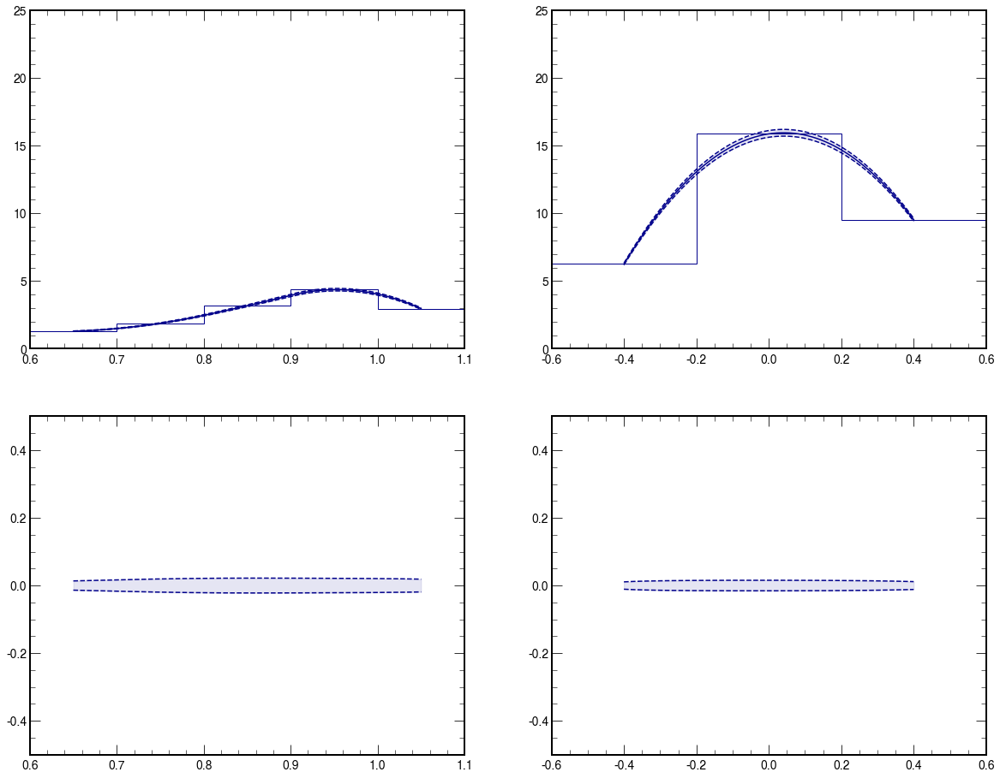

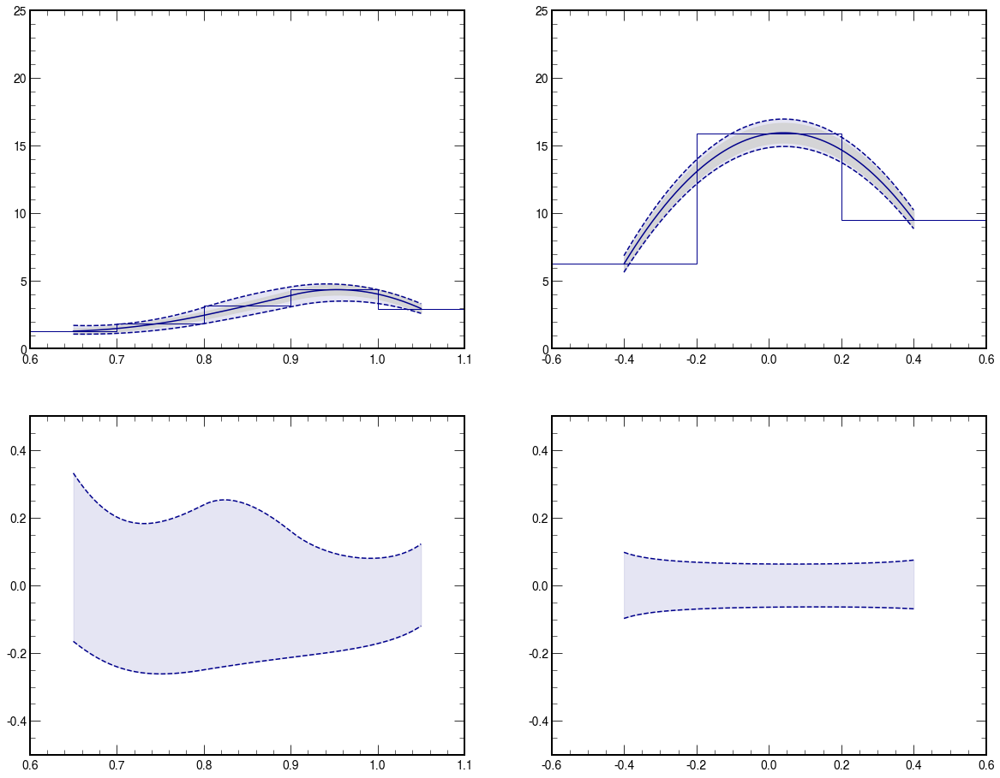

In [94]:
# ylim_ = (0.,0.3)
ylim_ = (0.,25.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "A0W2e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-6-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-6-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-6-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W2e-6-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-A0W5e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[ 5.27459681  9.24562117 18.20730417 24.91752939 19.28271176]
[ 5.27167946  9.16356894 18.12648373 24.91752939 19.28271176]
0     -1.534374e-02
1     -1.504001e-02
2     -1.472954e-02
3     -1.441282e-02
4     -1.409035e-02
           ...     
195   -2.317522e-04
196   -1.796906e-04
197   -1.238395e-04
198   -6.401081e-05
199    7.369739e-16
Length: 200, dtype: float64 -0.0005565915615825942
0     -1.588835e-02
1     -1.601749e-02
2     -1.613039e-02
3     -1.622708e-02
4     -1.630767e-02
           ...     
195   -3.407426e-05
196   -2.641970e-05
197   -1.820798e-05
198   -9.411434e-06
199    3.684869e-16
Length: 200, dtype: float64 -0.004353995787625115
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[37.50191064 88.21134717 63.18274562]
[37.434472   87.25314031 61.82982233]
0     -0.002317
1     -0.001881
2     -0.001468
3     -0.001076
4     -0.000703
         ...   
195    0.006004
196    0.005

GGToWW-AQGC-2018-electron-A0W5e-6
R_MWW_MX
[ 5.35679001  9.24562117 18.12648373 24.91752939 19.28271176]
[ 6.01783209 10.12490525 19.36311955 26.36734123 20.55683436]
[ 4.69574792  8.36633709 16.88984791 23.46771755 18.00858917]
[ 6.26122377 11.82493885 22.74964391 26.64341732 23.09431409]
[ 4.03796804  7.80573747 13.20738548 21.74433465 16.25538872]
0      0.168839
1      0.171611
2      0.174403
3      0.177210
4      0.180028
         ...   
195    0.167440
196    0.174442
197    0.181800
198    0.189536
199    0.197669
Length: 200, dtype: float64 0.1917614327540518
0     -0.246196
1     -0.236532
2     -0.227215
3     -0.218252
4     -0.209652
         ...   
195   -0.144549
196   -0.147394
197   -0.150411
198   -0.153609
199   -0.156997
Length: 200, dtype: float64 -0.17563960622481725
Diff_YWW_YX
[37.58901504 87.45184367 62.83155443]
[39.36523098 90.16785853 65.1387175 ]
[35.8127991  84.7358288  60.52439136]
[40.41223118 91.99861381 66.09242537]
[34.96854477 82.73245466 59.3509626

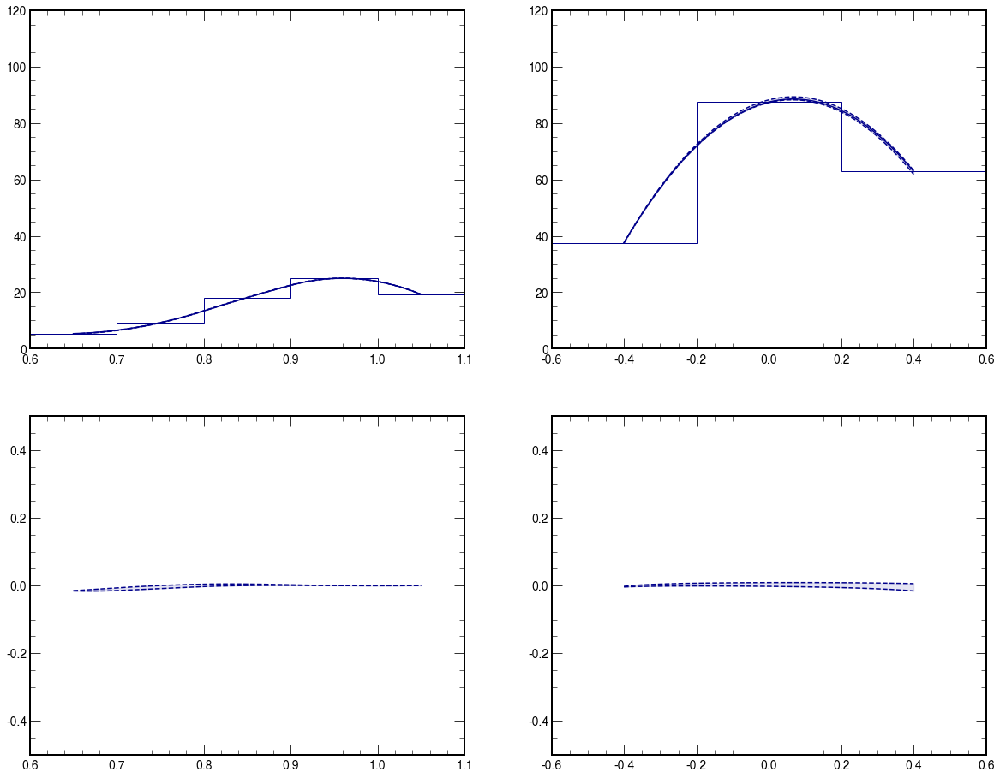

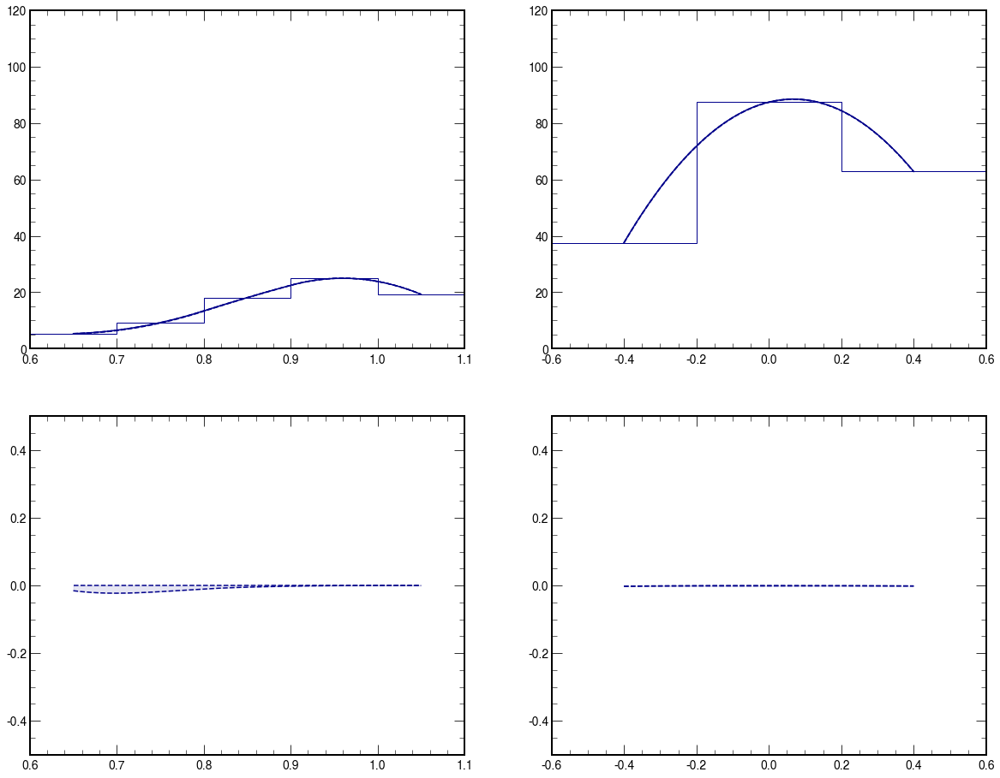

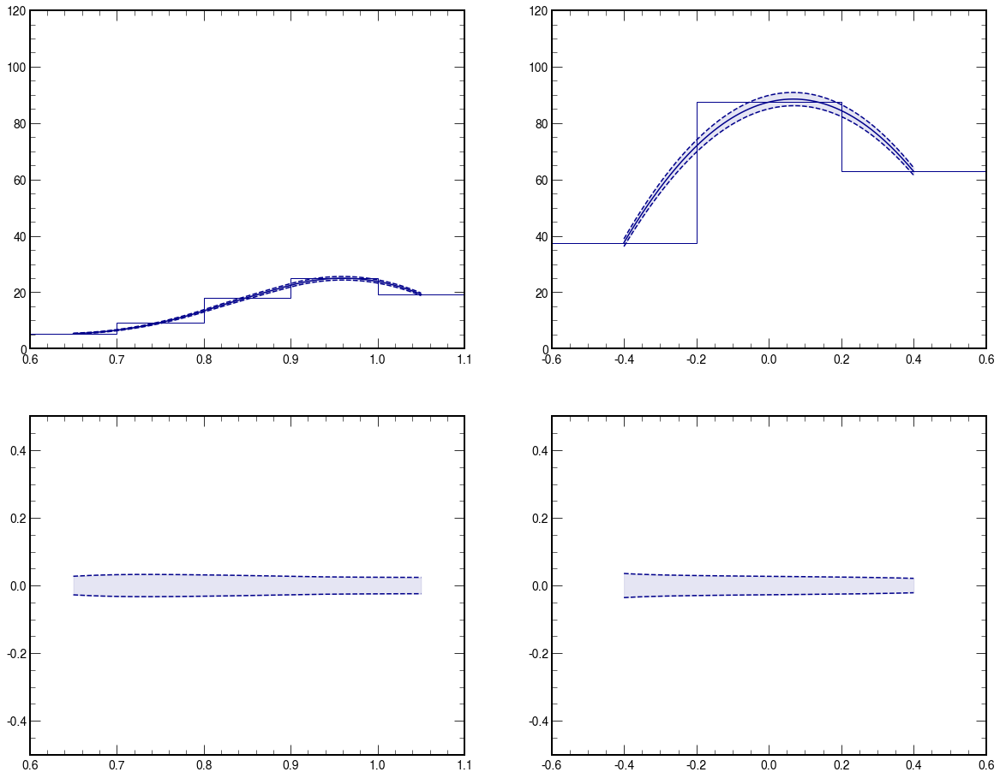

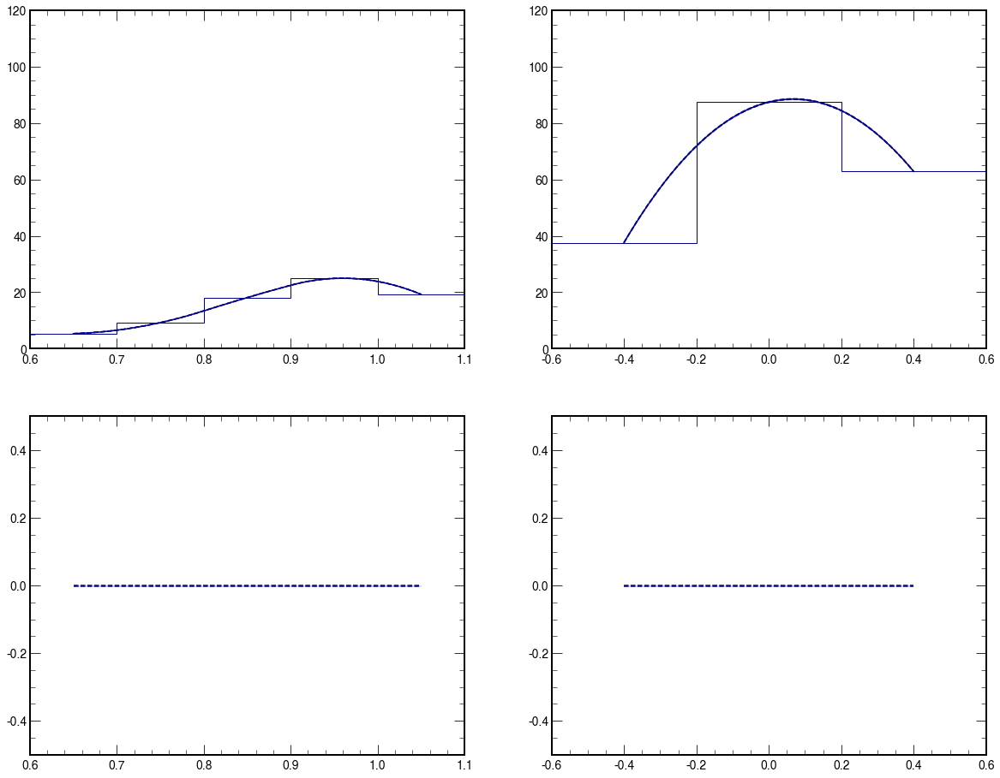

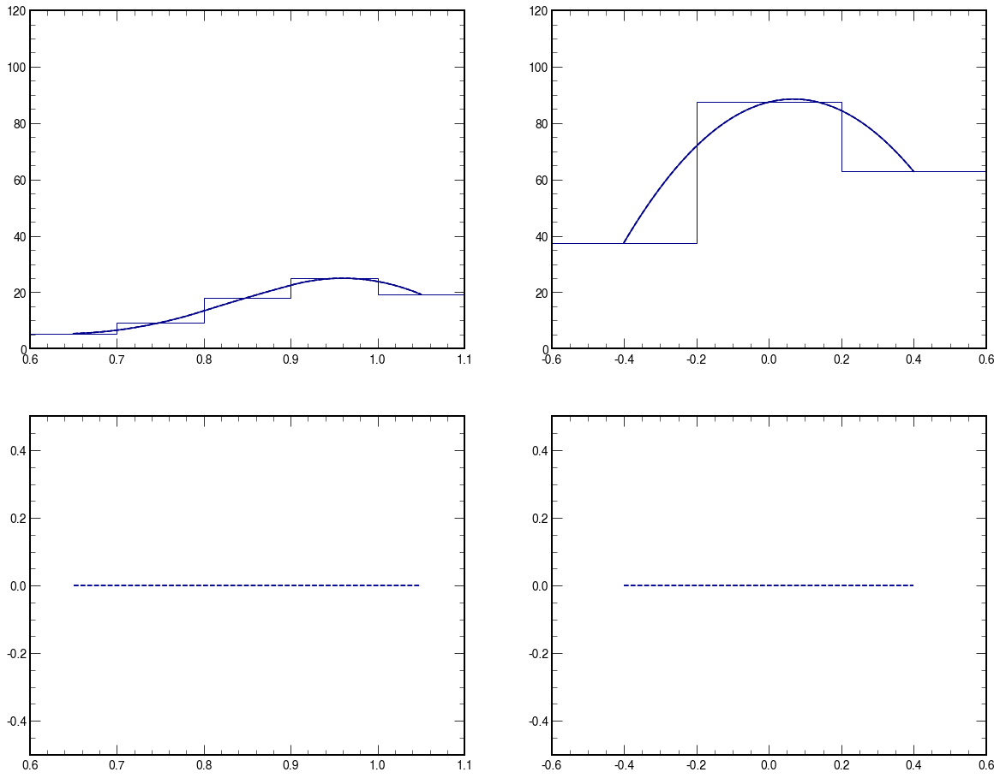

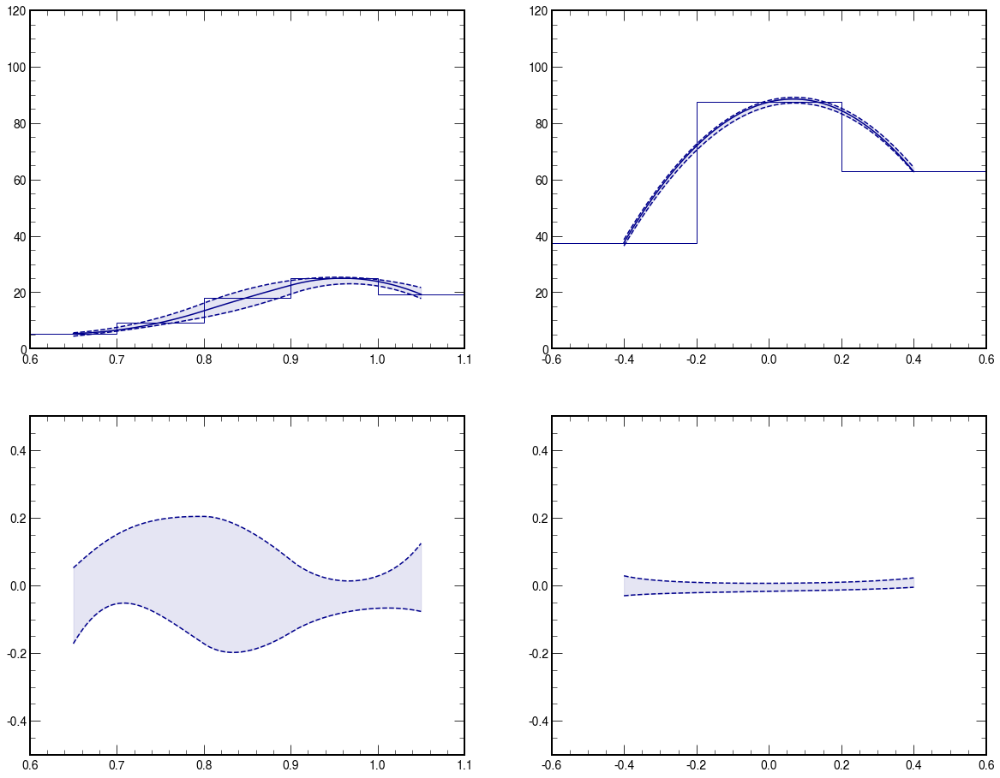

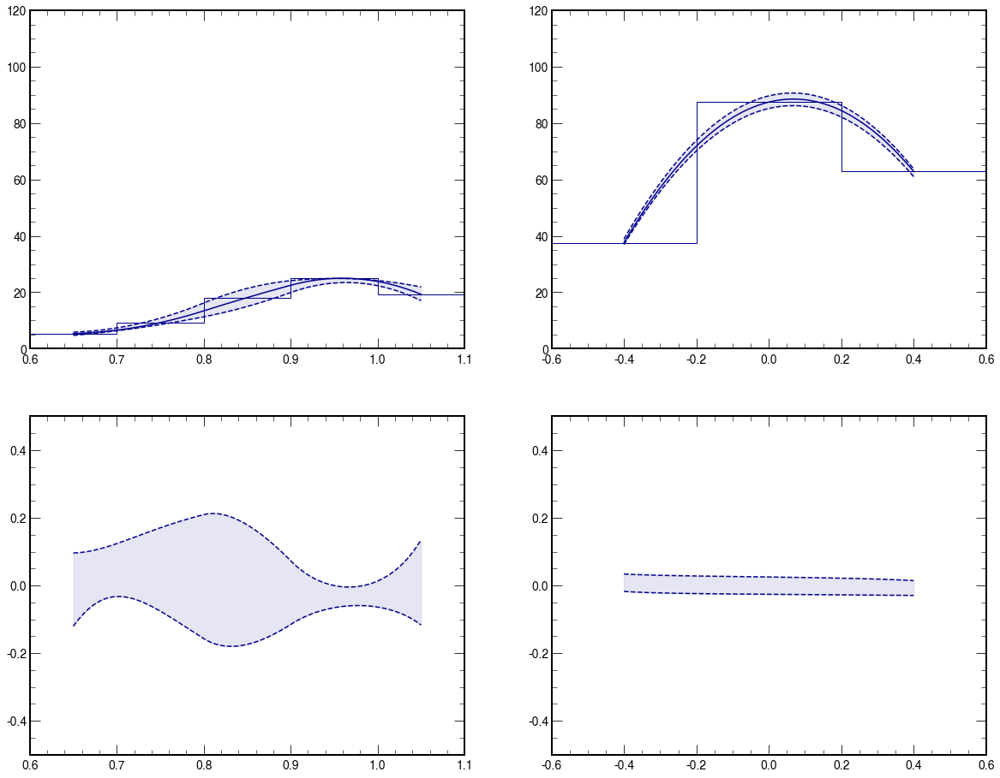

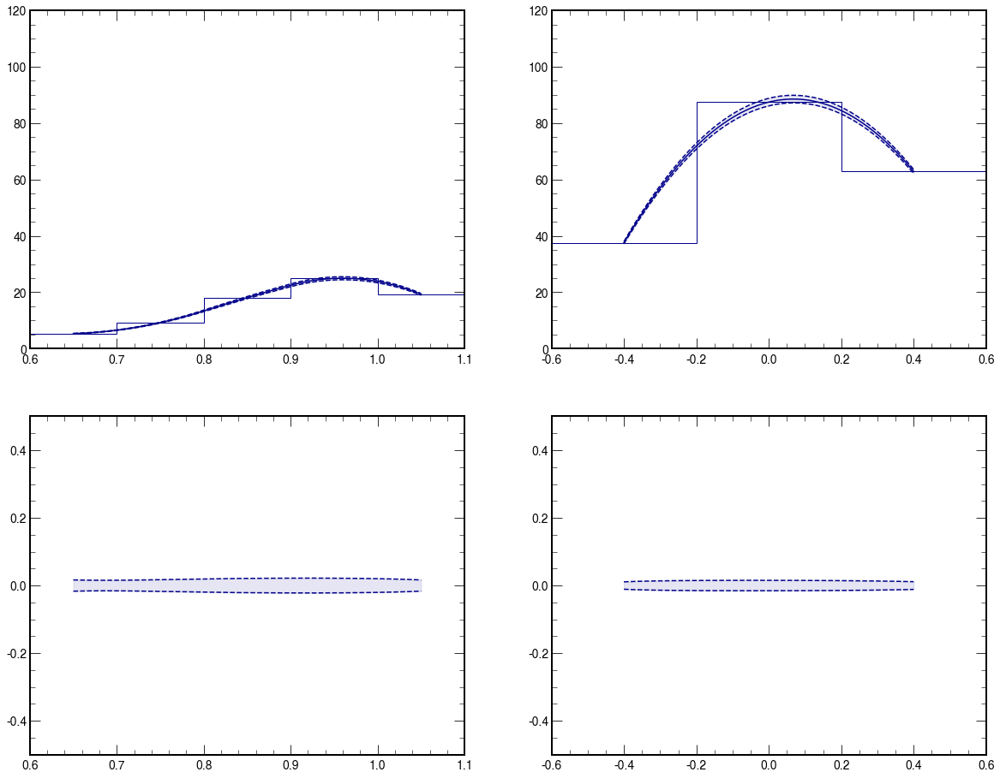

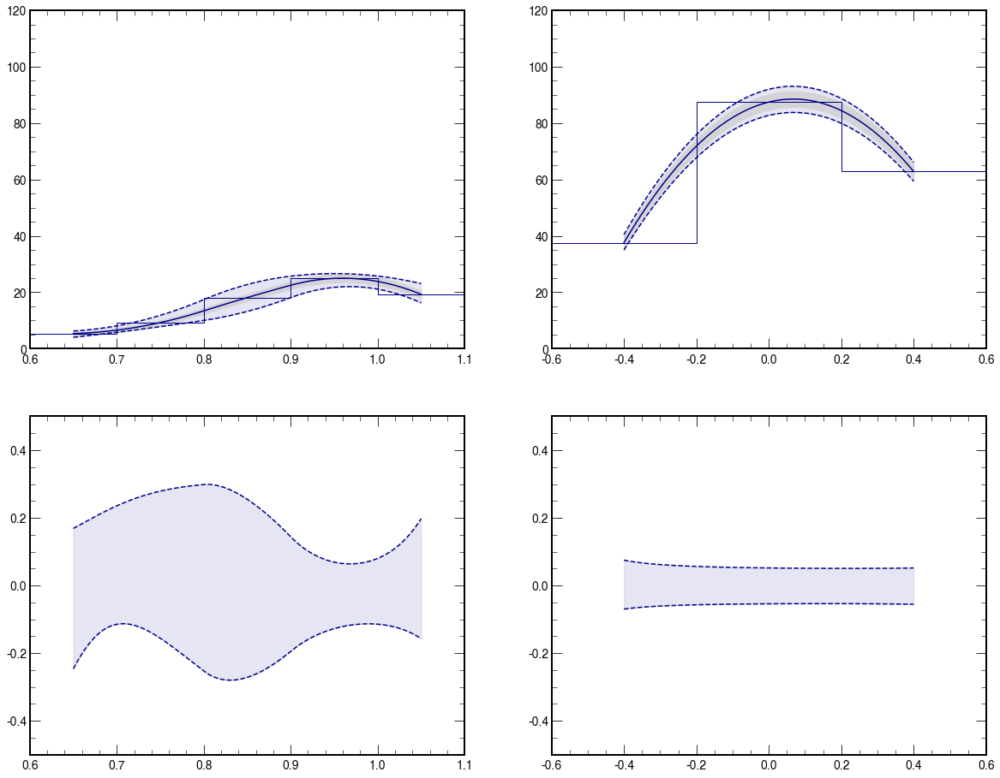

In [95]:
# ylim_ = (0.,0.3)
ylim_ = (0.,120.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "A0W5e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W5e-6-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W5e-6-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W5e-6-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-A0W5e-6-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW5e-7
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.2942096  0.35437325 0.32960602 0.21694384 0.06697037]
[0.27839953 0.34597354 0.32907811 0.21694384 0.06697037]
0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
195    0.0
196    0.0
197    0.0
198    0.0
199    0.0
Length: 200, dtype: float64 0.0
0     -0.053737
1     -0.052933
2     -0.052143
3     -0.051367
4     -0.050603
         ...   
195   -0.000399
196   -0.000318
197   -0.000227
198   -0.000121
199    0.000000
Length: 200, dtype: float64 -0.012375292794266232
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.49854138 0.99287128 0.46356364]
[0.46590725 0.97574999 0.44606923]
0      0.034128
1      0.032027
2      0.030036
3      0.028146
4      0.026350
         ...   
195    0.030130
196    0.032181
197    0.034350
198    0.036645
199    0.039078
Length: 200, dtype: float64 -0.003812877788509572
0     -0.033565
1     -0.033715
2     -0.033857
3     -0.033989
4     -0.034

GGToWW-AQGC-2018-electron-ACW5e-7
R_MWW_MX
[0.2942096  0.35437325 0.32960602 0.21694384 0.06697037]
[0.34410837 0.40912057 0.38319659 0.25965619 0.09068979]
[0.24431084 0.29962593 0.27601545 0.1742315  0.04325096]
[0.36020181 0.41991322 0.38906291 0.33258495 0.11195927]
[0.22027617 0.27764186 0.24799863 0.1473141  0.03710829]
0      0.224303
1      0.223492
2      0.222686
3      0.221885
4      0.221089
         ...   
195    0.707114
196    0.700524
197    0.692573
198    0.683068
199    0.671773
Length: 200, dtype: float64 0.3435352511475223
0     -0.251295
1     -0.249599
2     -0.247961
3     -0.246379
4     -0.244851
         ...   
195   -0.426253
196   -0.430669
197   -0.435384
198   -0.440443
199   -0.445900
Length: 200, dtype: float64 -0.27728311921366544
Diff_YWW_YX
[0.48208855 1.00963684 0.44612963]
[0.54562968 1.10242883 0.50755956]
[0.41854741 0.91684484 0.3846997 ]
[0.56686679 1.12186457 0.56124084]
[0.40327116 0.86407851 0.38191134]
0      0.175856
1      0.172835
2    

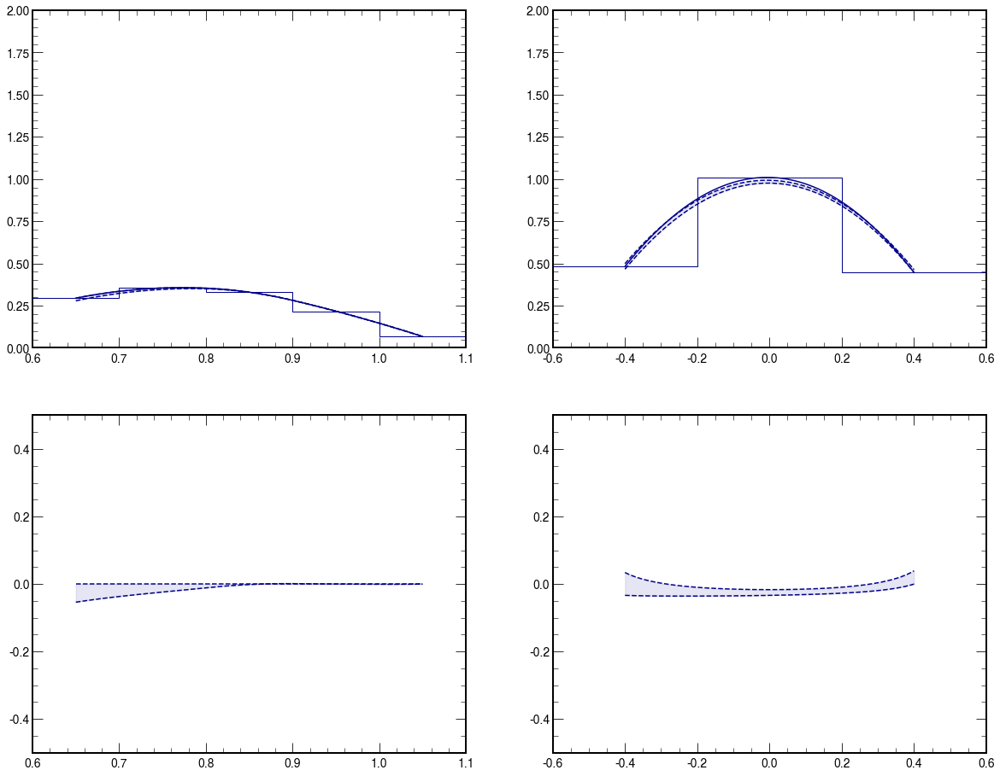

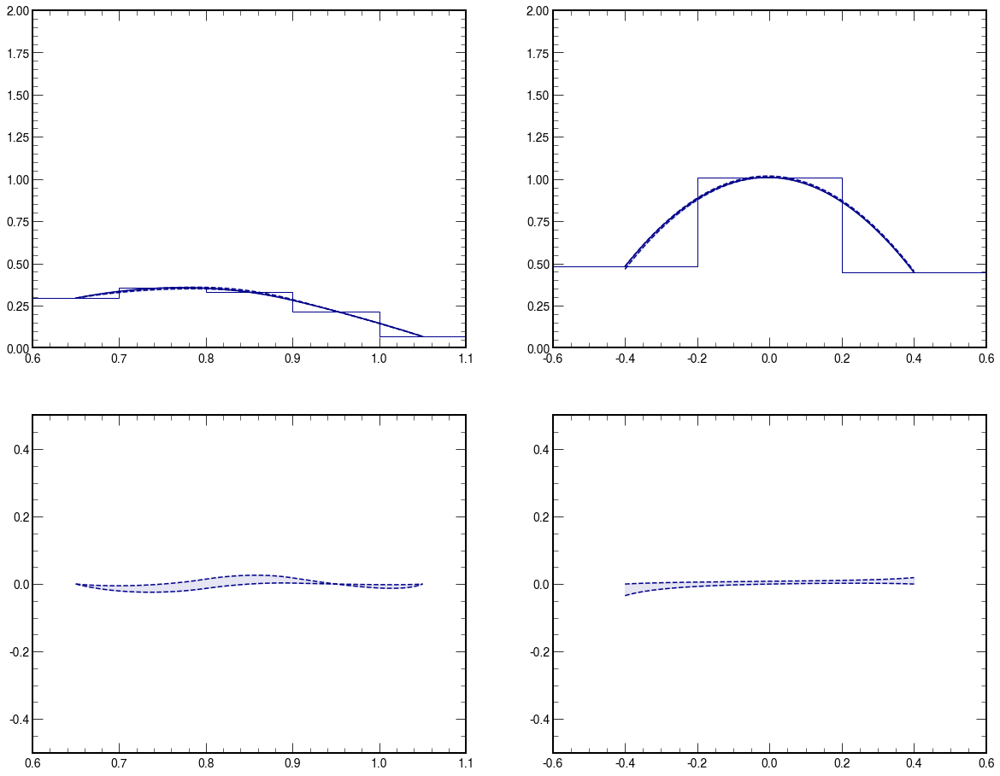

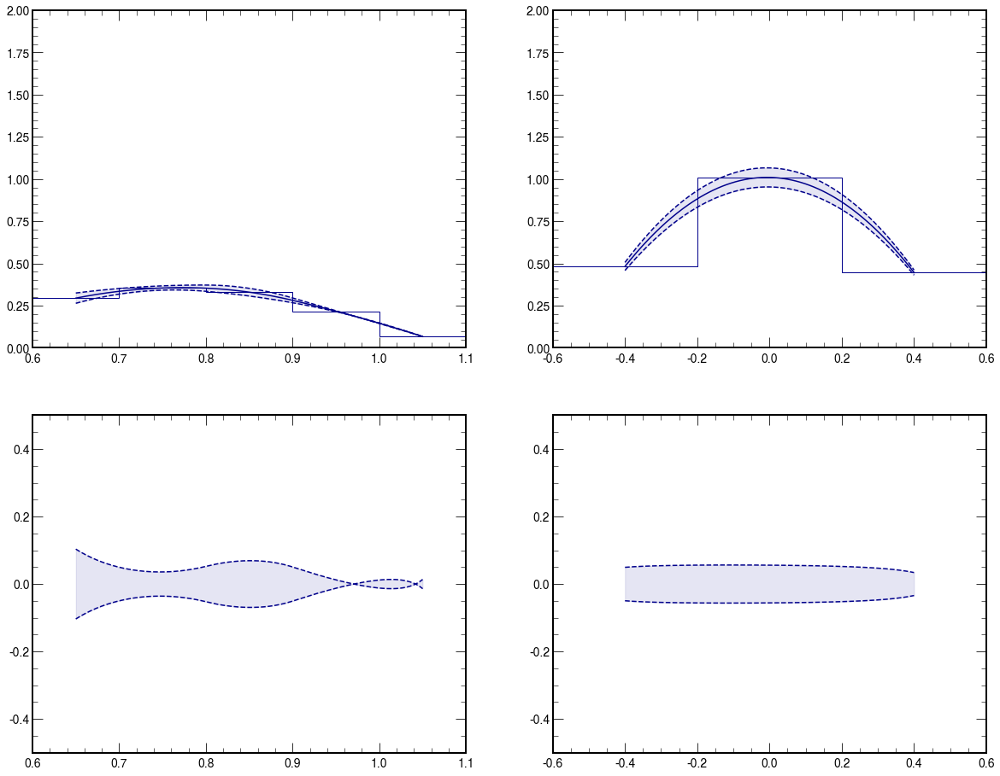

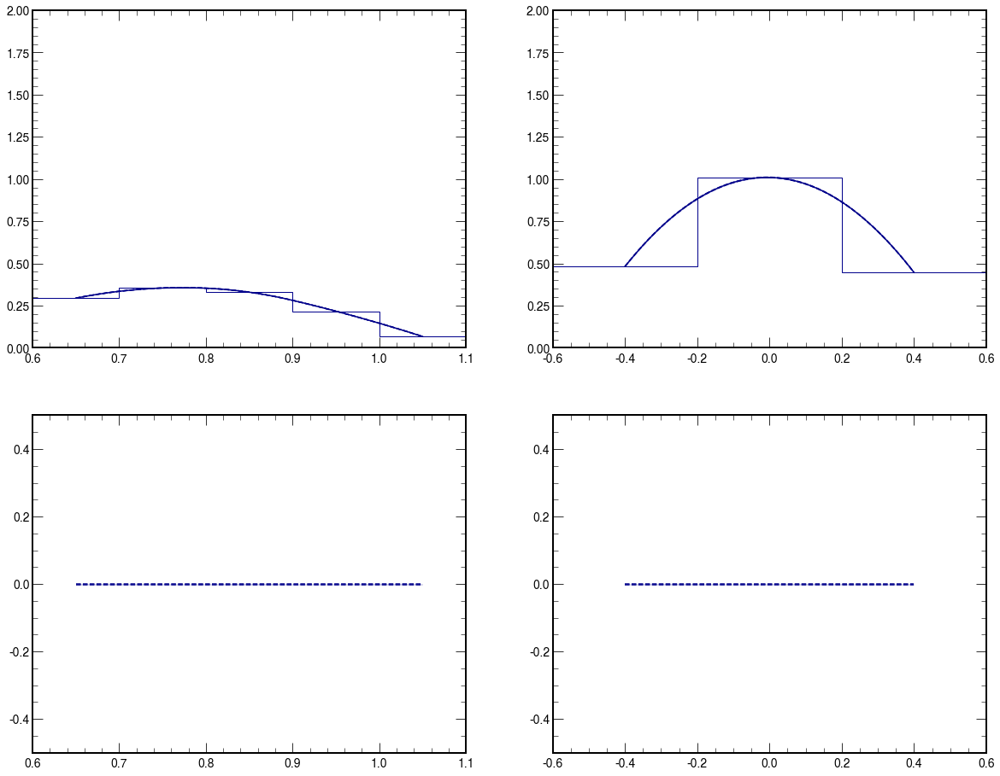

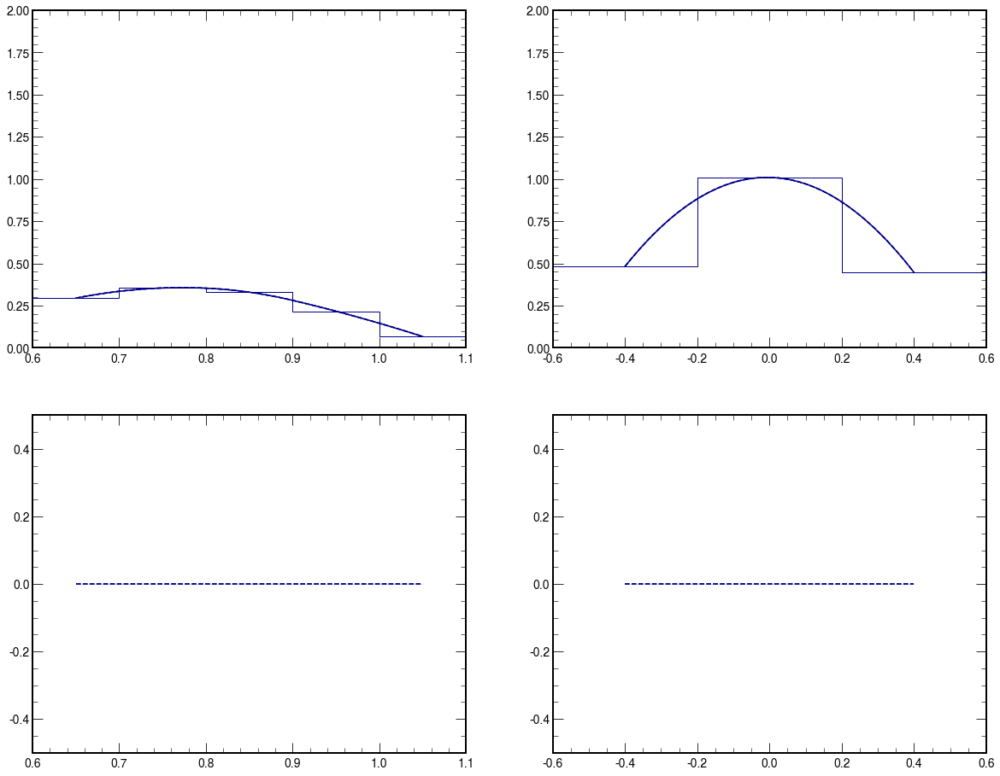

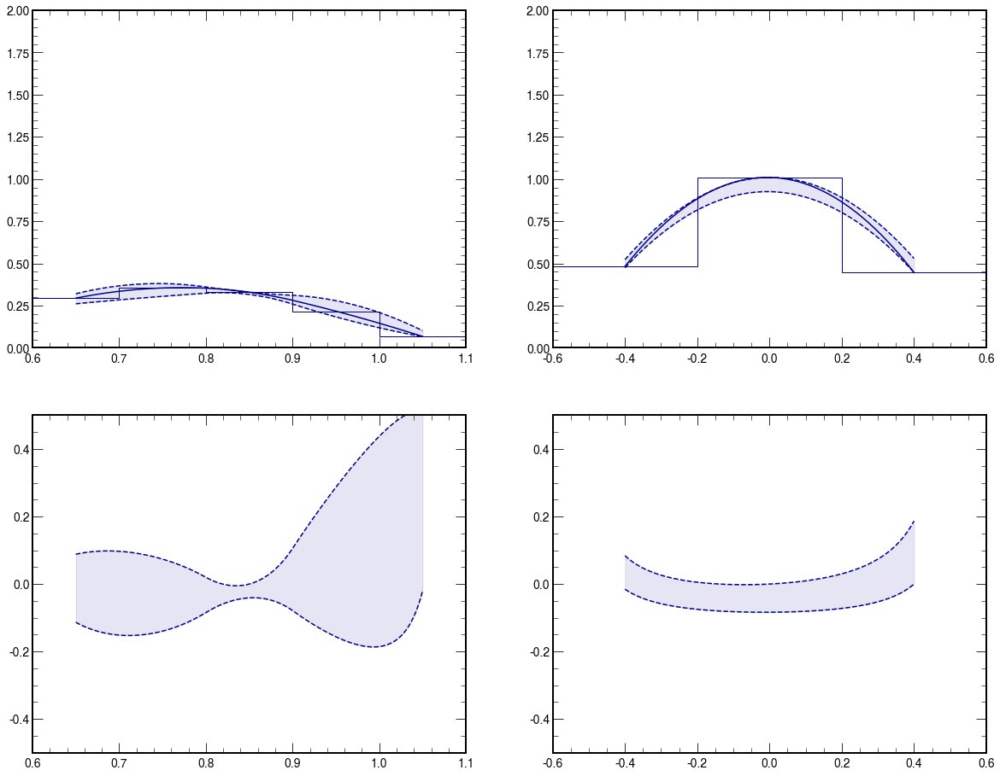

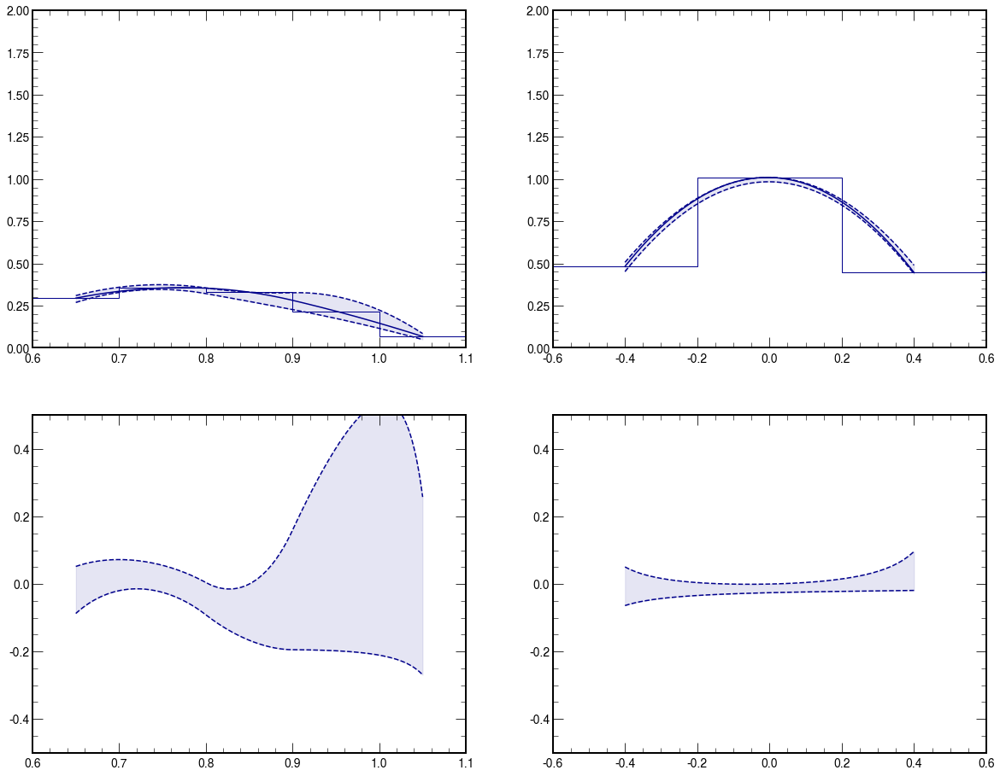

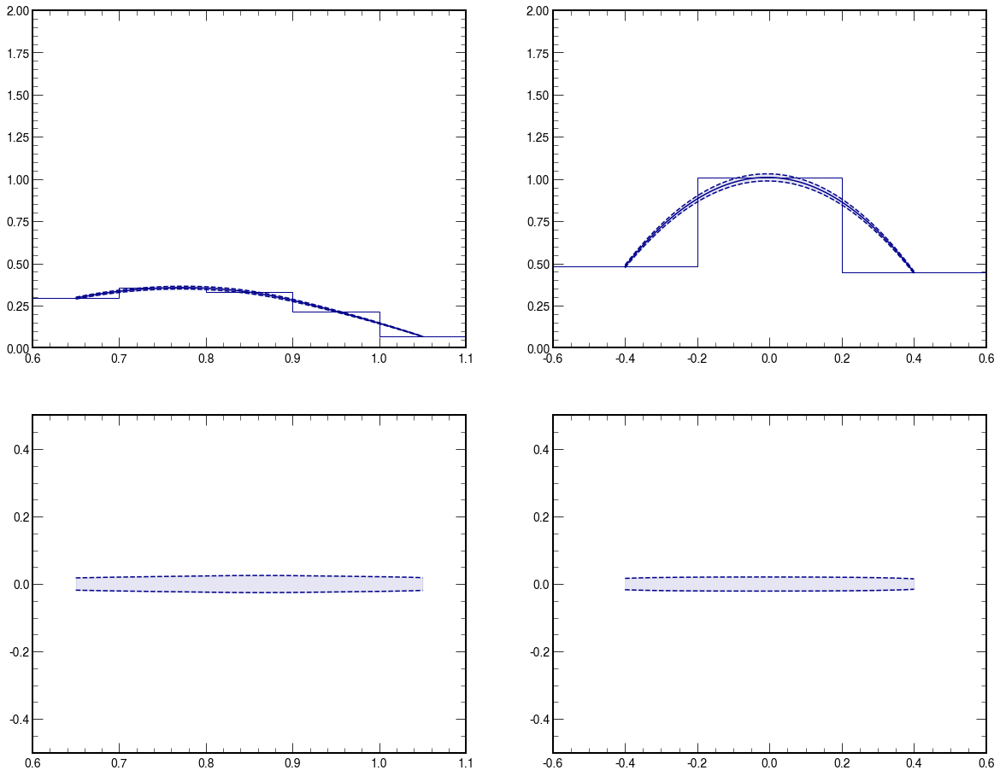

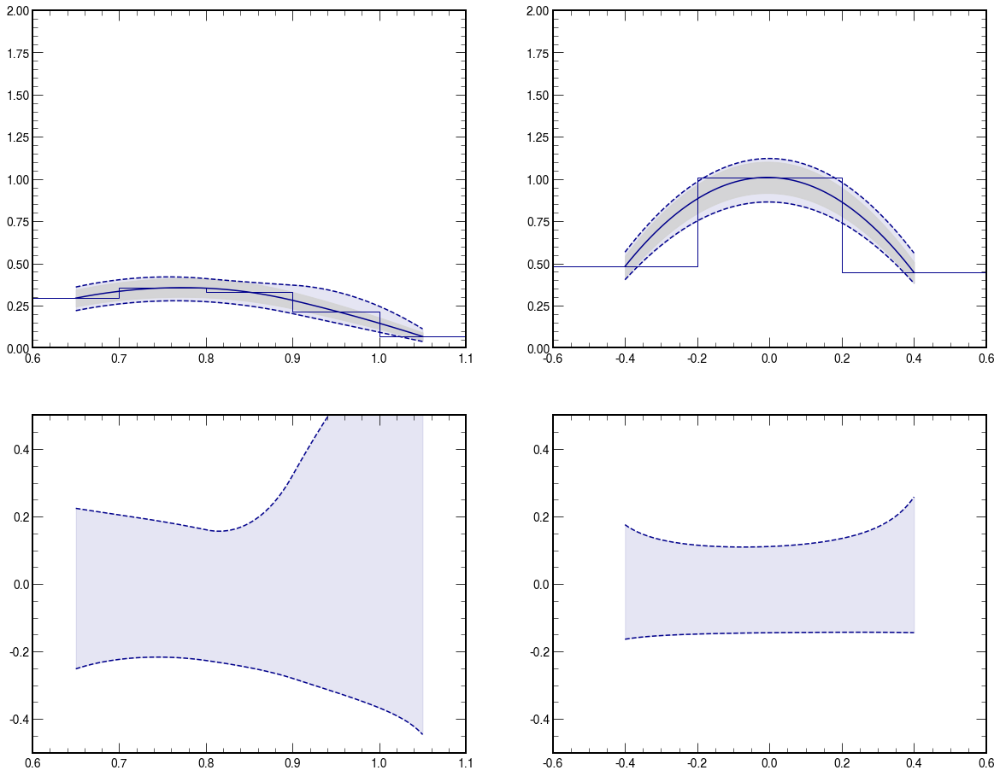

In [96]:
# ylim_ = (0.,0.3)
ylim_ = (0.,2.)
ylim_ratio_ = (-0.50,0.50)
color_ = "darkblue"

label_ = ""
coupling_str_ = "ACW5e-7"
# coupling_str_ = "A0W1e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W1e-6"
#         label_ = "GGToWW-AQGC-muon-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W1e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_
    
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-7-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-7-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-7-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-7-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW5e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[0.9260473  1.05829448 1.84679104 1.77882085 1.49713057]
[0.9260473  1.05829448 1.84679104 1.7506509  1.46896062]
0      0.000000
1     -0.000009
2     -0.000017
3     -0.000025
4     -0.000033
         ...   
195    0.016486
196    0.017135
197    0.017800
198    0.018480
199    0.019177
Length: 200, dtype: float64 0.0017136592721509333
0      0.000000
1     -0.000078
2     -0.000153
3     -0.000226
4     -0.000297
         ...   
195   -0.003281
196   -0.002502
197   -0.001695
198   -0.000862
199    0.000000
Length: 200, dtype: float64 -0.004877352923877853
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[3.60014831 7.91291885 5.124192  ]
[3.57254251 7.8587756  5.12392663]
0      0.007727
1      0.007483
2      0.007252
3      0.007030
4      0.006819
         ...   
195   -0.004861
196   -0.004967
197   -0.005077
198   -0.005190
199   -0.005306
Length: 200, dtype: float64 0.0002451375260427399
0  

GGToWW-AQGC-2018-electron-ACW5e-6
R_MWW_MX
[0.9260473  1.05829448 1.84679104 1.77882085 1.46896062]
[1.08762979 1.23036122 2.07476129 2.00161839 1.67329422]
[0.76446481 0.88622775 1.61882079 1.5560233  1.26462702]
[1.09324478 1.28186148 2.11171239 2.01417424 1.7550039 ]
[0.6939898  0.83707415 1.52221512 1.53320362 1.24601922]
0      0.180550
1      0.183076
2      0.185562
3      0.188003
4      0.190395
         ...   
195    0.185654
196    0.187838
197    0.190078
198    0.192373
199    0.194725
Length: 200, dtype: float64 0.1690993533800245
0     -0.250589
1     -0.250292
2     -0.249963
3     -0.249603
4     -0.249210
         ...   
195   -0.147502
196   -0.148505
197   -0.149550
198   -0.150637
199   -0.151768
Length: 200, dtype: float64 -0.1797144033511141
Diff_YWW_YX
[3.57254251 7.91297152 5.15152677]
[3.88915639 8.38284956 5.53132284]
[3.25592862 7.44309348 4.77173071]
[3.91447163 8.58102198 5.59819311]
[3.17153408 7.37685105 4.62493273]
0      0.095710
1      0.095284
2     

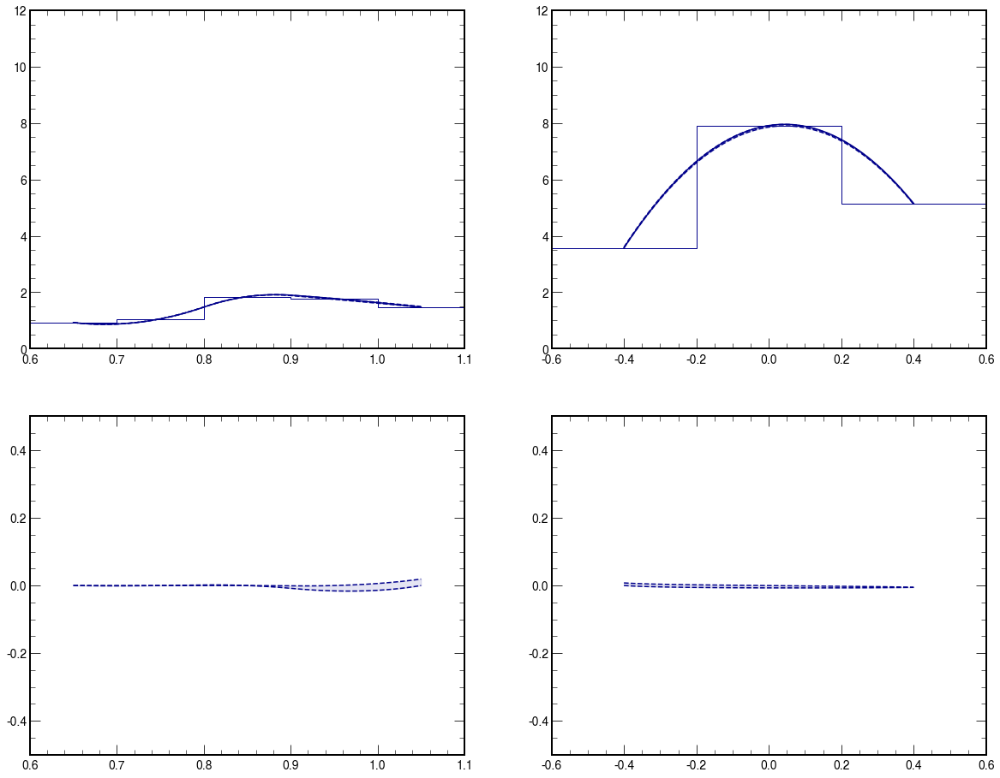

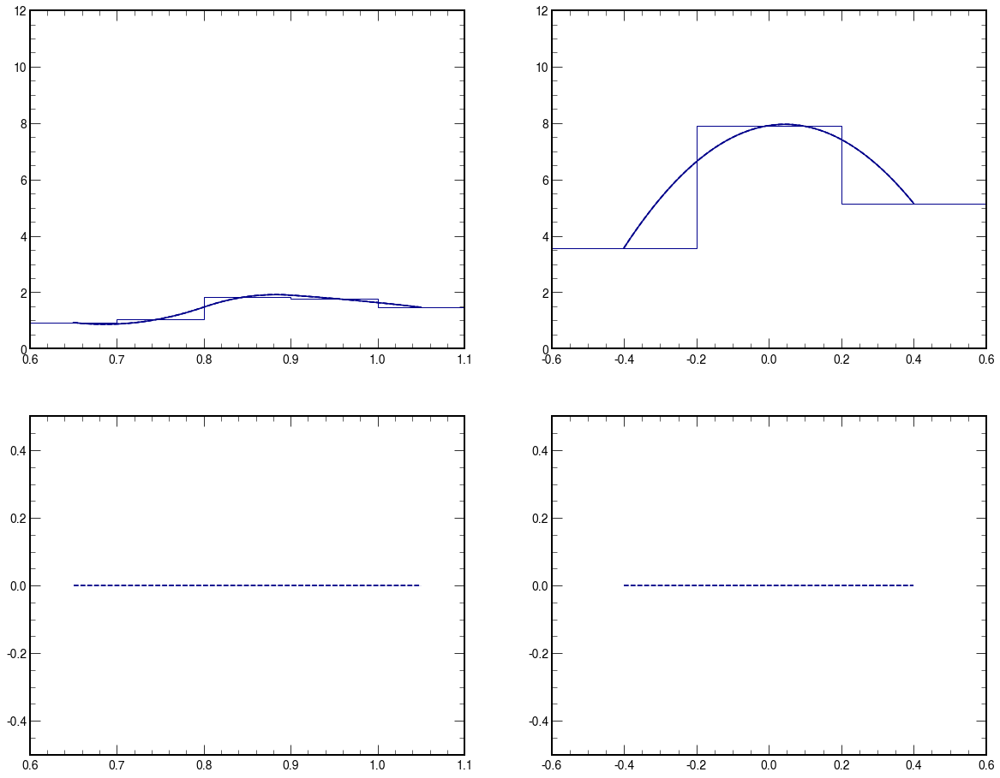

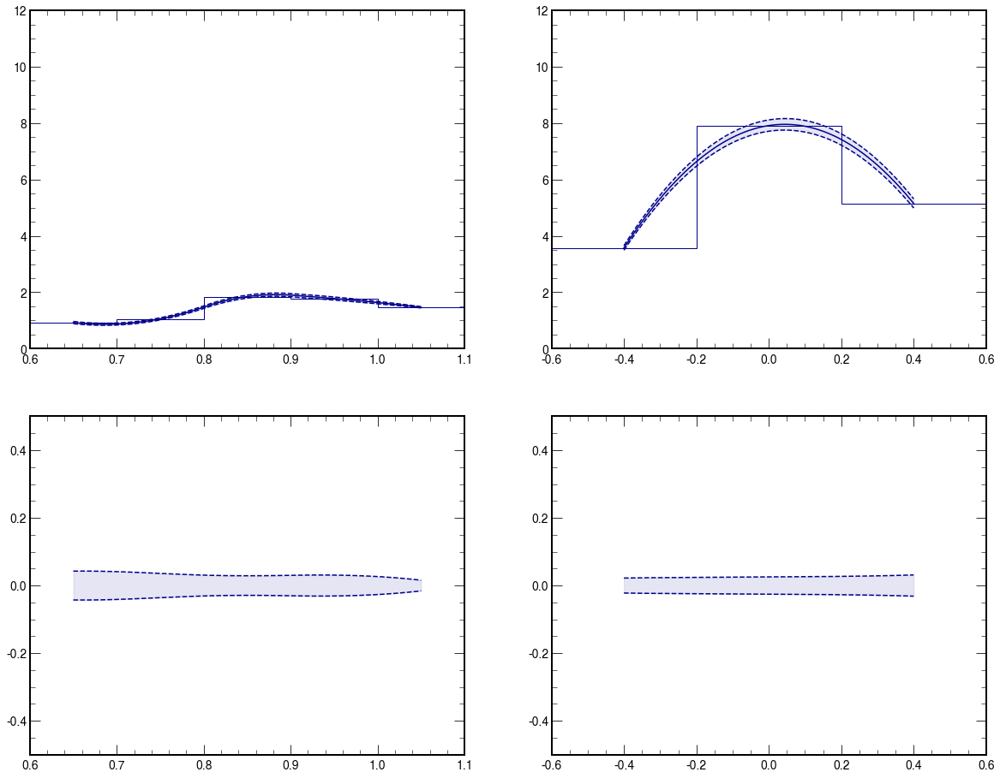

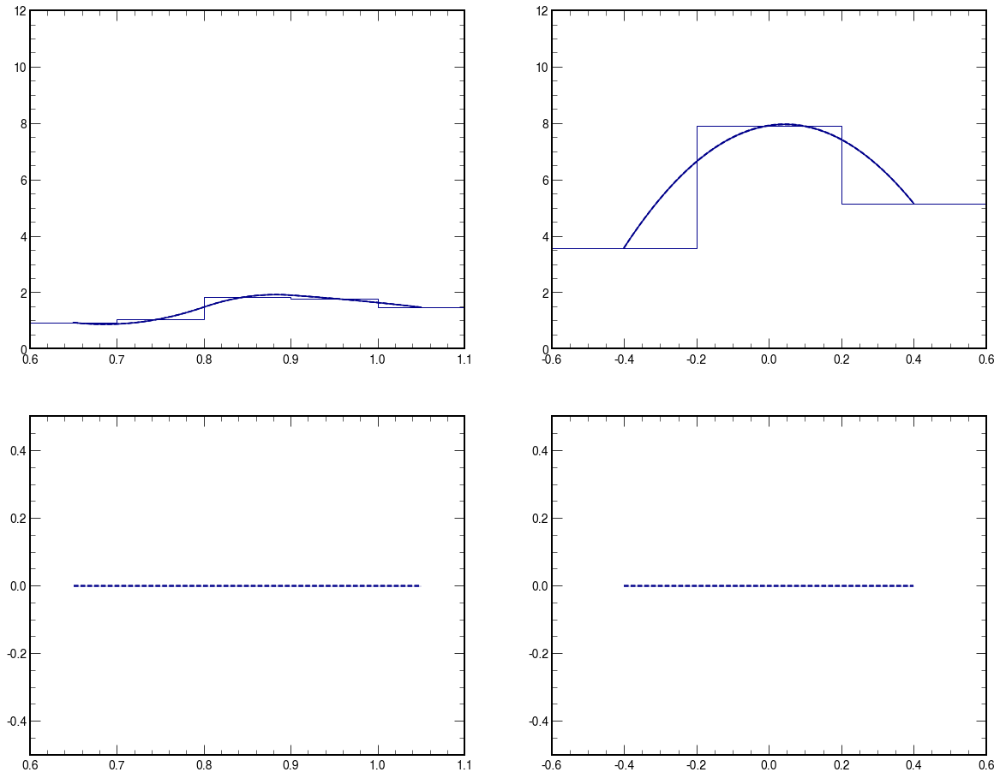

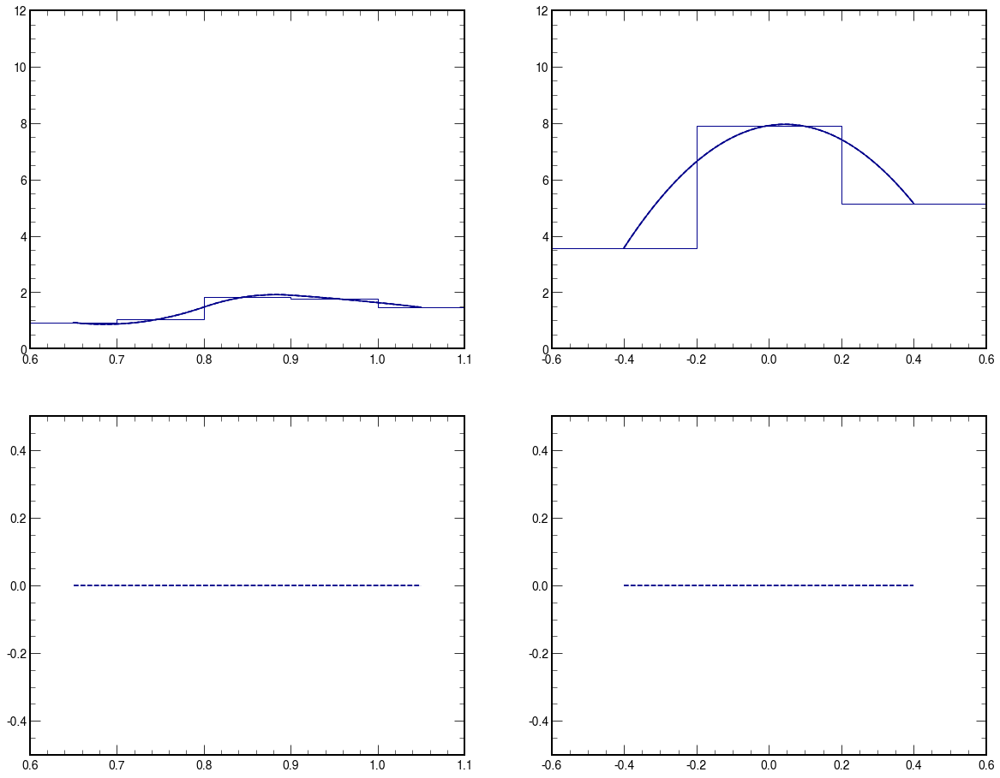

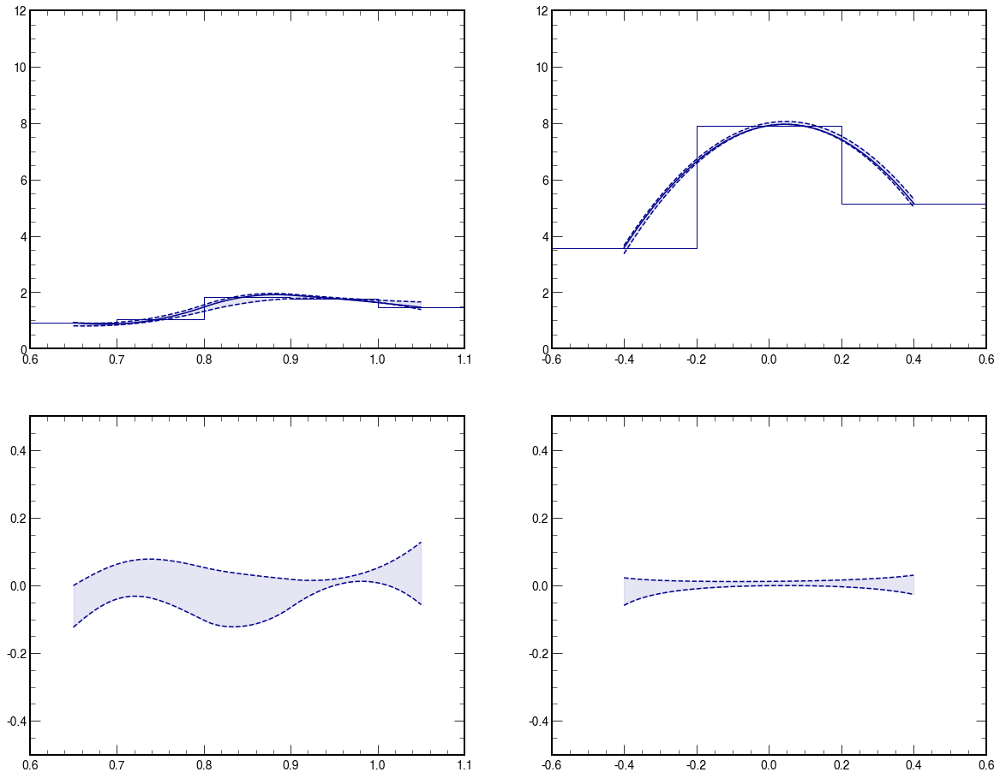

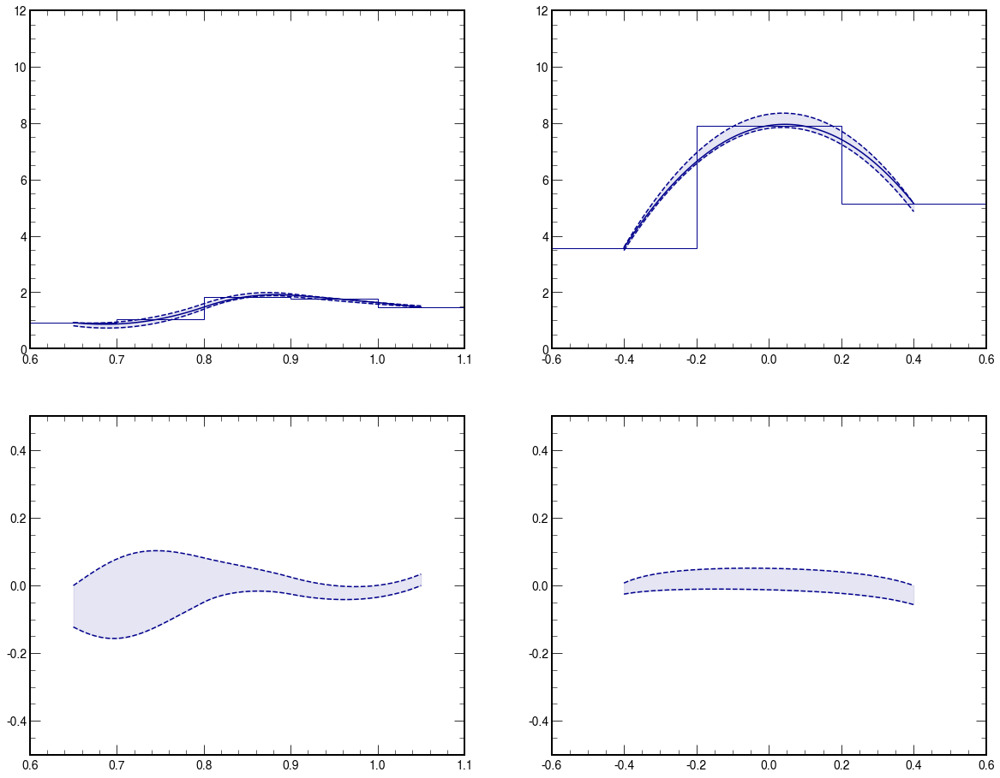

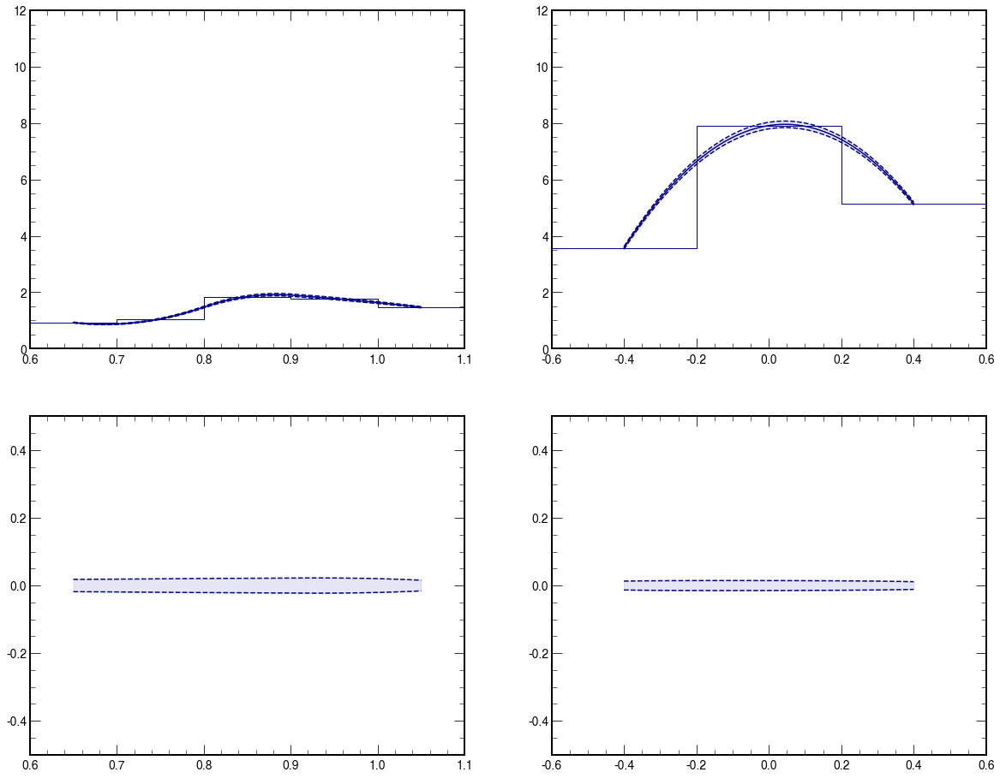

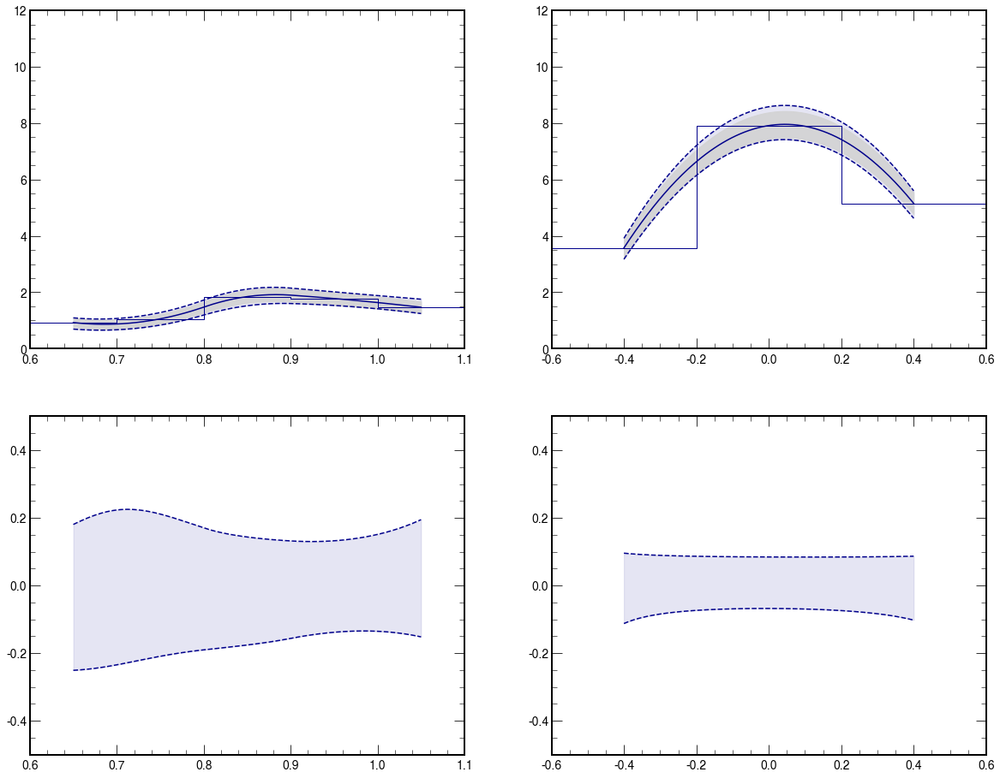

In [97]:
label_ = ""
coupling_str_ = "ACW5e-6"
# coupling_str_ = "A0W2e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W2e-6"
#         label_ = "GGToWW-AQGC-muon-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W2e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

# ylim_ = (0.,0.5)
# ylim_ = (0.,1.)
ylim_ = (0.,12.)
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )
    
if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-6-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-6-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-6-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW5e-6-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW8e-6
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[1.45041074 3.09493427 3.50805475 5.34342179 3.60376239]
[1.45041074 3.09493427 3.50805475 5.34342179 3.60376239]
0      0.000000e+00
1      0.000000e+00
2      0.000000e+00
3      0.000000e+00
4      0.000000e+00
           ...     
195    1.135699e-16
196    1.157575e-16
197    1.180881e-16
198    0.000000e+00
199    0.000000e+00
Length: 200, dtype: float64 1.6476643814684468e-16
0     -1.530908e-16
1     -1.478838e-16
2     -1.430875e-16
3     -1.386565e-16
4     -1.345519e-16
           ...     
195    0.000000e+00
196    0.000000e+00
197    0.000000e+00
198    0.000000e+00
199    0.000000e+00
Length: 200, dtype: float64 -1.9530638195787597e-17
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[ 8.2120295  18.29614156 12.80790402]
[ 8.10763797 18.13004964 12.56004206]
0     -0.000247
1     -0.000105
2      0.000030
3      0.000158
4      0.000281
         ...   
195    0.003532
196    0.003516
197 

GGToWW-AQGC-2018-electron-ACW8e-6
R_MWW_MX
[1.45041074 3.09493427 3.50805475 5.34342179 3.60376239]
[1.67485501 3.42405446 3.85619452 5.77796905 3.95962508]
[1.22596647 2.76581408 3.15991498 4.90887453 3.24789969]
[1.8782708  3.57773315 4.22795268 5.80664266 4.56306655]
[1.07180882 2.60964793 2.71428352 4.55250837 2.91024819]
0      0.294992
1      0.283506
2      0.272992
3      0.263344
4      0.254472
         ...   
195    0.225809
196    0.234977
197    0.244729
198    0.255116
199    0.266195
Length: 200, dtype: float64 0.16205960469961356
0     -0.261031
1     -0.251639
2     -0.243059
3     -0.235200
4     -0.227988
         ...   
195   -0.179764
196   -0.182620
197   -0.185673
198   -0.188941
199   -0.192442
Length: 200, dtype: float64 -0.1779800387725173
Diff_YWW_YX
[ 8.21405958 18.229326   12.76366916]
[ 8.74897866 19.02940226 13.43364182]
[ 7.6791405  17.42924974 12.0936965 ]
[ 8.97172428 19.26079796 13.63983946]
[ 7.42976234 17.18636794 11.88497104]
0      0.092240
1     

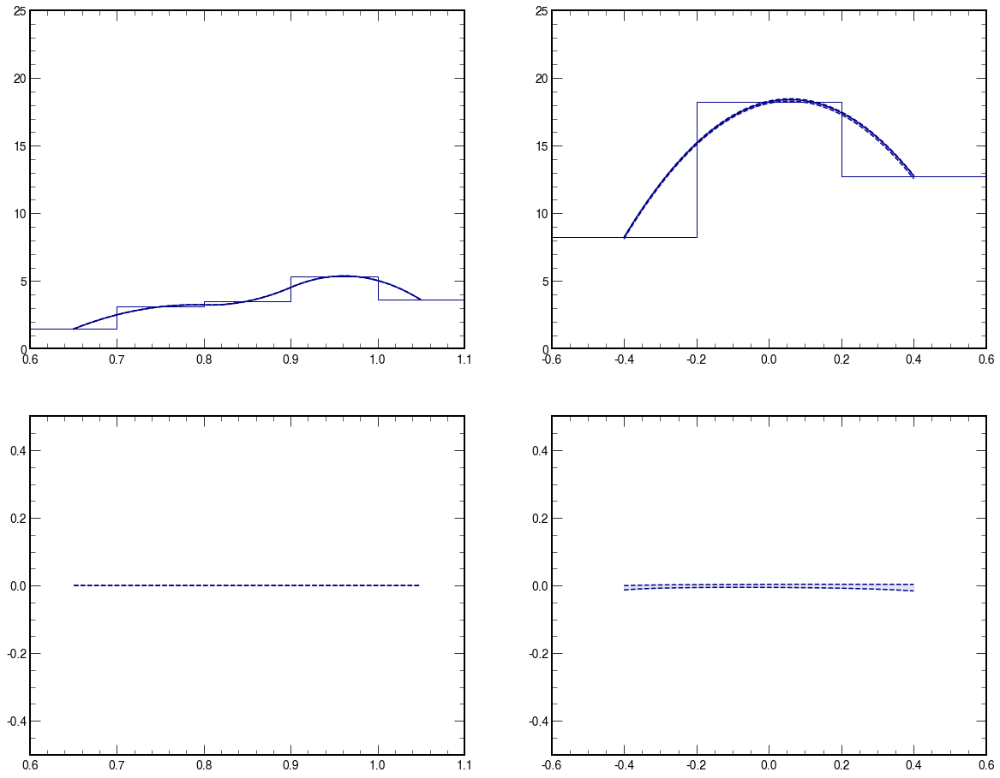

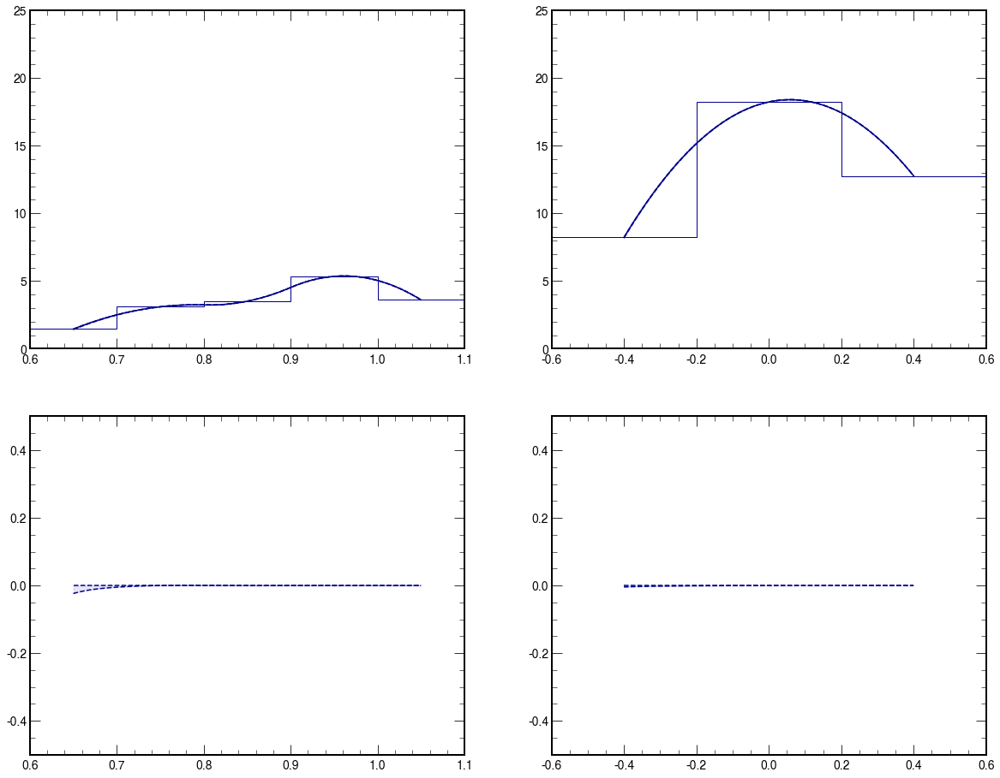

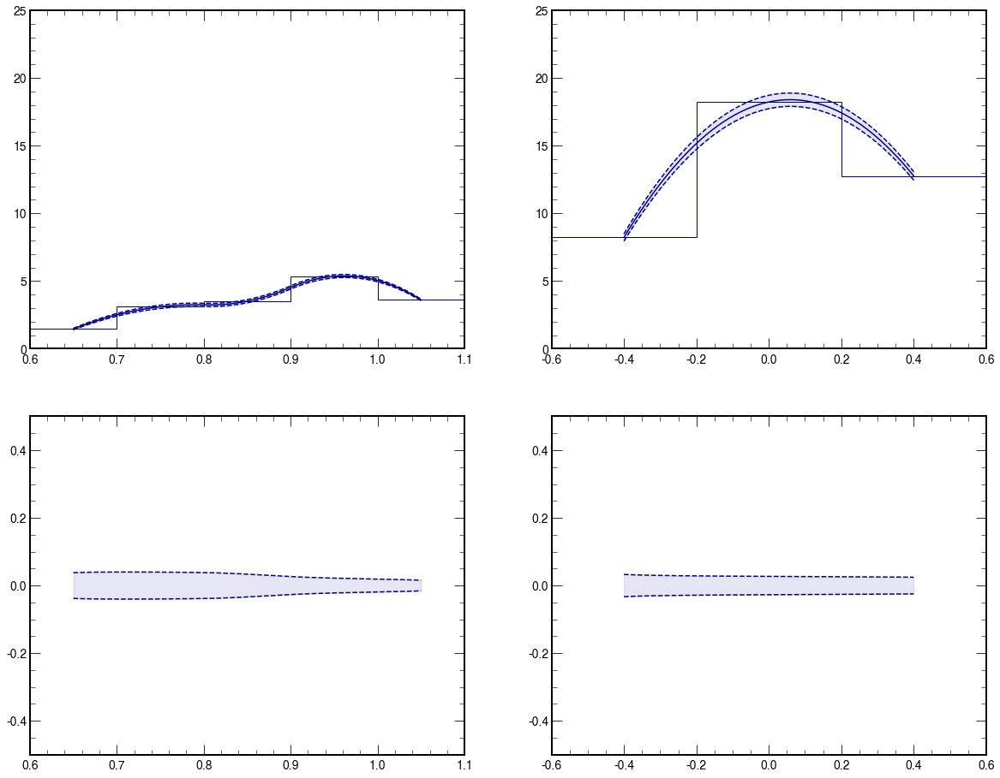

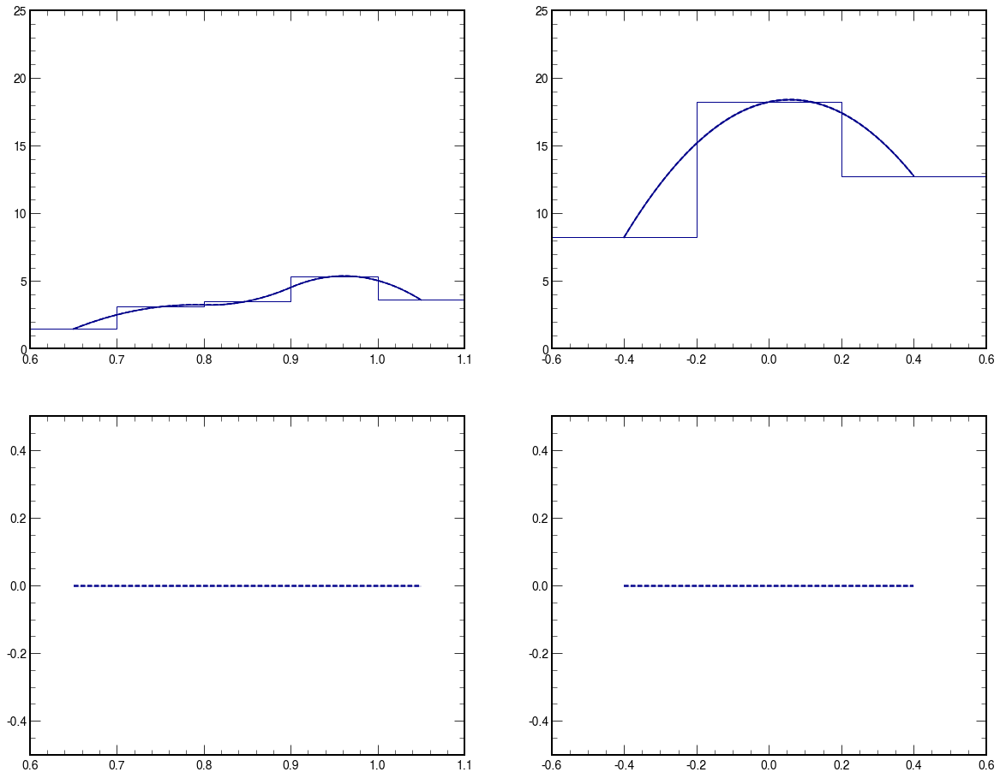

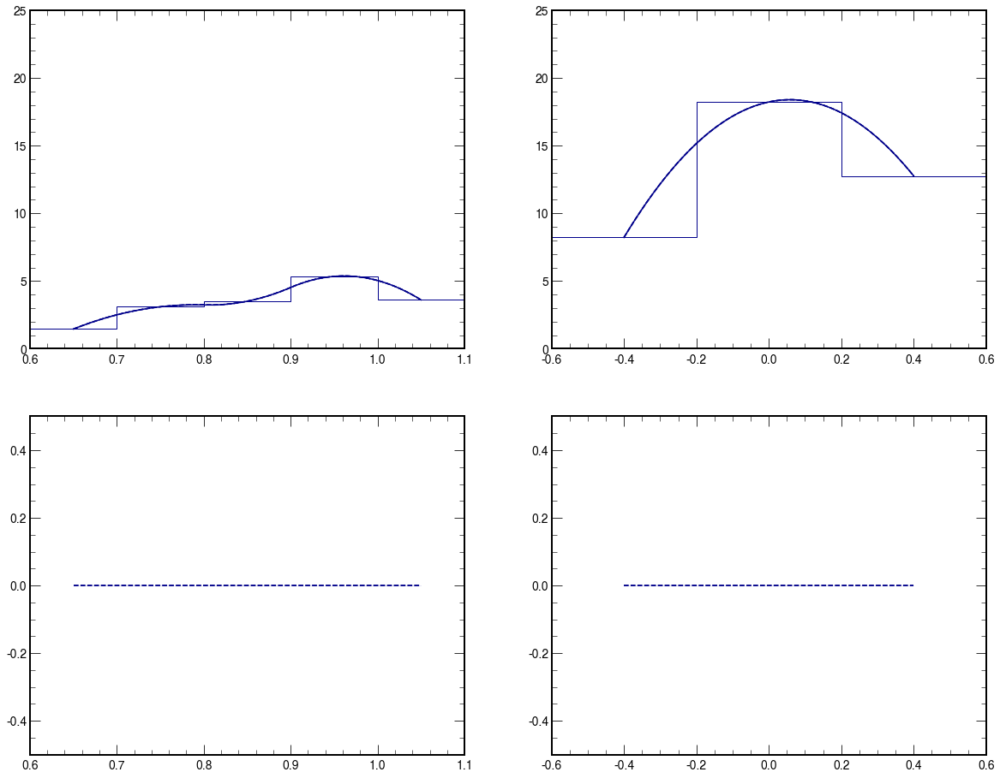

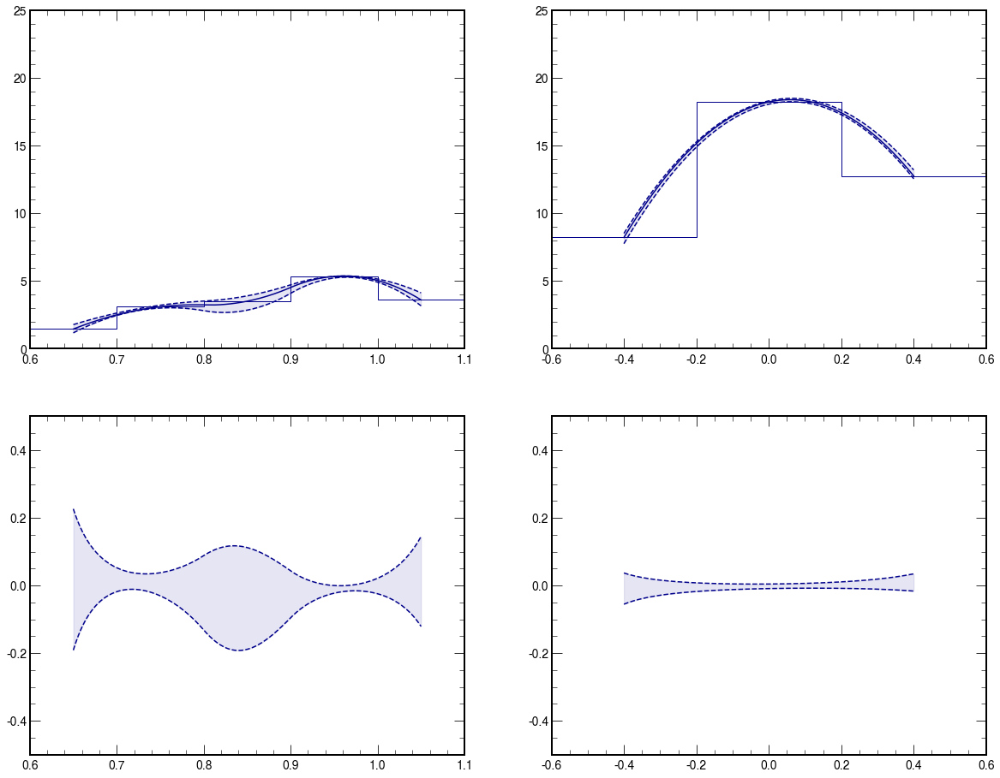

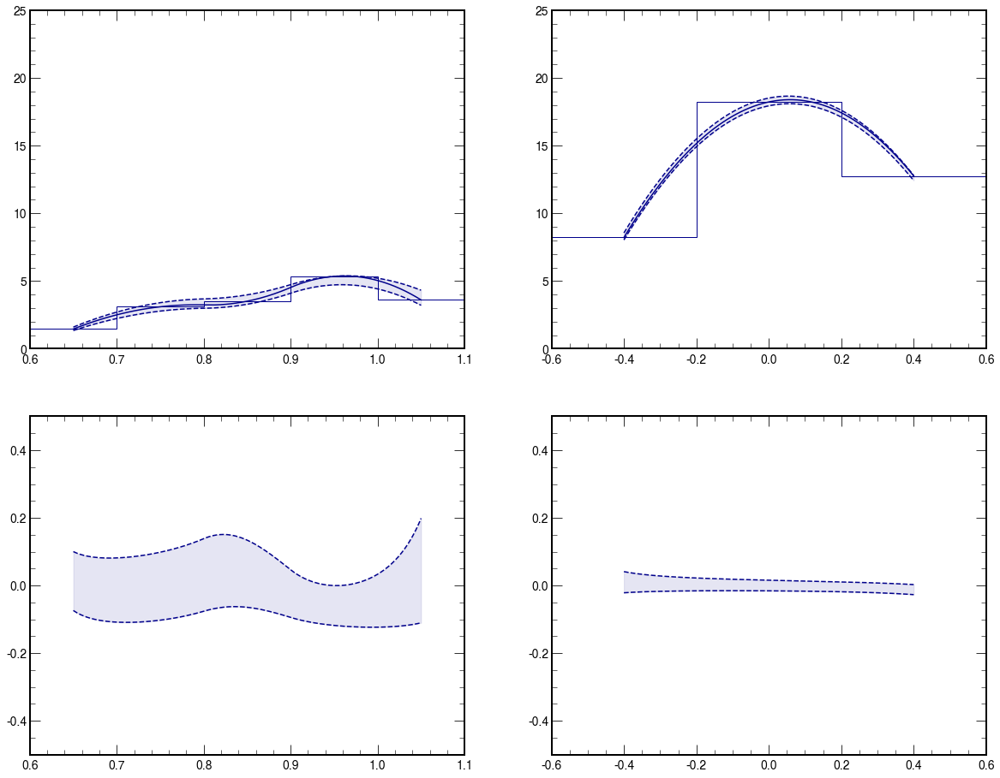

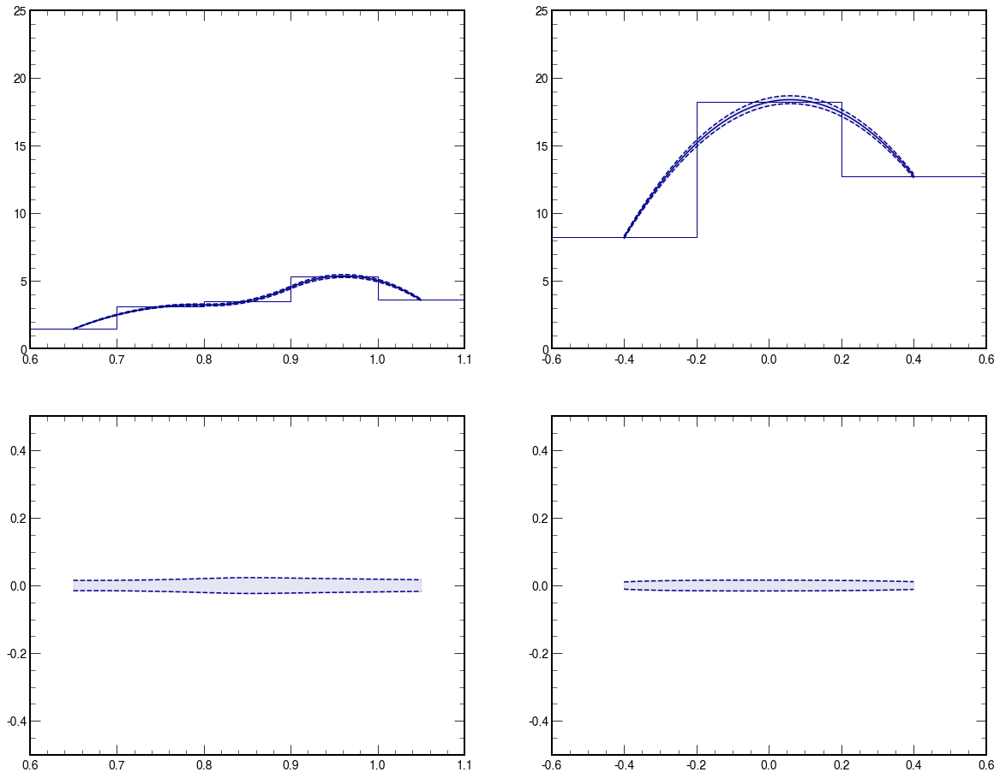

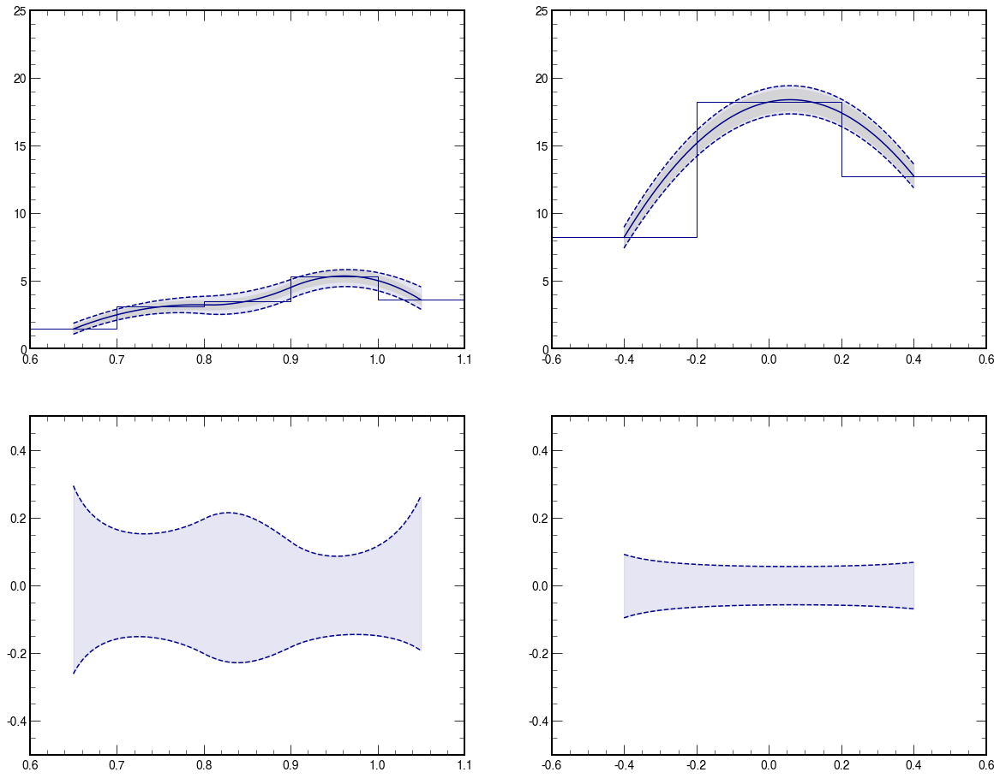

In [98]:
label_ = ""
coupling_str_ = "ACW8e-6"
# coupling_str_ = "A0W5e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W5e-6"
#         label_ = "GGToWW-AQGC-muon-A0W5e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W5e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

# ylim_ = (0.,3.)
# ylim_ = (0.,5.)
ylim_ = (0.,25.)
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )    

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW8e-6-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW8e-6-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW8e-6-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW8e-6-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW2e-5
R_MWW_MX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[ 5.70819165 10.32764872 21.72830593 30.26431431 22.85123374]
[ 5.609508   10.32390632 21.72528647 30.15698151 22.64841424]
0      0.000000
1      0.000731
2      0.001444
3      0.002137
4      0.002808
         ...   
195    0.006758
196    0.007270
197    0.007805
198    0.008366
199    0.008955
Length: 200, dtype: float64 0.0030597734559379953
0     -0.017288
1     -0.016041
2     -0.014812
3     -0.013602
4     -0.012413
         ...   
195   -0.001434
196   -0.001103
197   -0.000754
198   -0.000387
199    0.000000
Length: 200, dtype: float64 -0.0004975401476393335
Diff_YWW_YX
_jes_up
_jes_up
nom
_jes_dw
_jes_dw
nom
[ 41.55800864 110.24058287  74.11769744]
[ 39.93203407 109.2099274   72.95670368]
0      0.021566
1      0.020848
2      0.020176
3      0.019547
4      0.018955
         ...   
195    0.009814
196    0.009959
197    0.010109
198    0.010265
199    0.010426
Length: 200, dtype: float64 0.

GGToWW-AQGC-2018-electron-ACW2e-5
R_MWW_MX
[ 5.70819165 10.22735297 21.72528647 30.35980101 22.64841424]
[ 6.43503185 11.20942766 23.16118722 32.056611   24.11073592]
[ 4.98135145  9.24527829 20.28938573 28.66299101 21.18609256]
[ 6.89642657 13.24082904 27.4966084  32.2977692  28.18777437]
[ 4.66819036  8.122508   16.40014594 25.83740841 20.42680032]
0      0.208163
1      0.209724
2      0.211341
3      0.213011
4      0.214731
         ...   
195    0.203698
196    0.213139
197    0.223078
198    0.233548
199    0.244580
Length: 200, dtype: float64 0.20396380160637265
0     -0.182195
1     -0.179981
2     -0.177902
3     -0.175962
4     -0.174161
         ...   
195   -0.101866
196   -0.100936
197   -0.099998
198   -0.099050
199   -0.098091
Length: 200, dtype: float64 -0.18343043402364284
Diff_YWW_YX
[ 40.68069494 109.58423795  73.35291385]
[ 42.63837662 112.81626389  75.99274268]
[ 38.72301326 106.35221201  70.71308502]
[ 43.93629015 115.06345937  77.60852391]
[ 37.78981251 103.7083

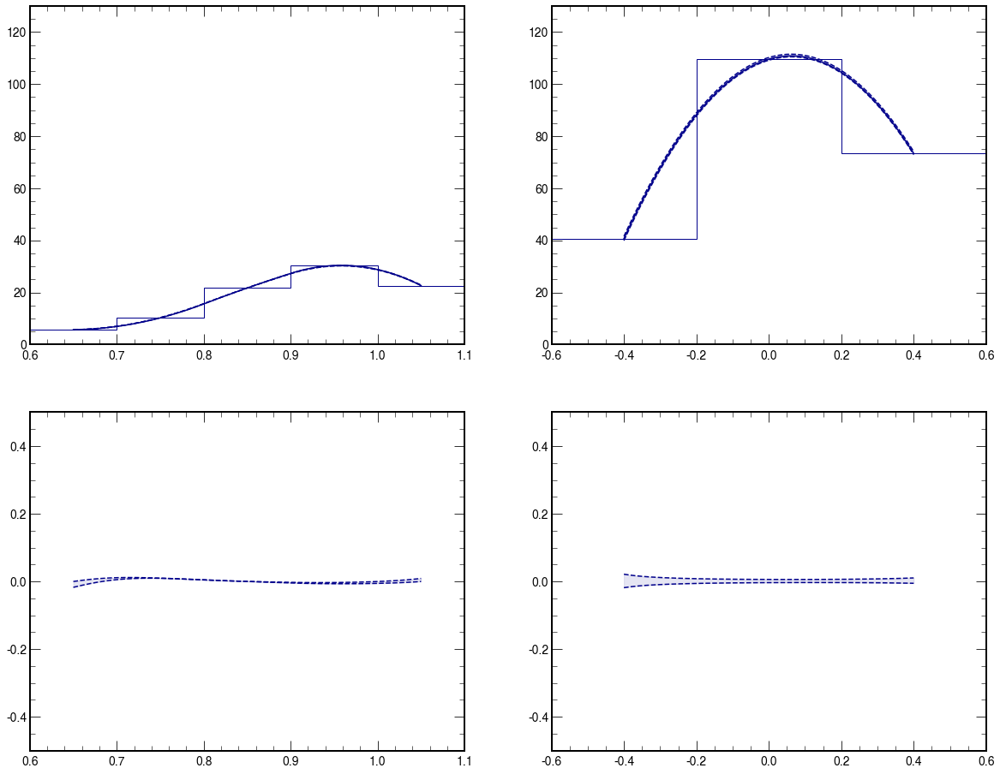

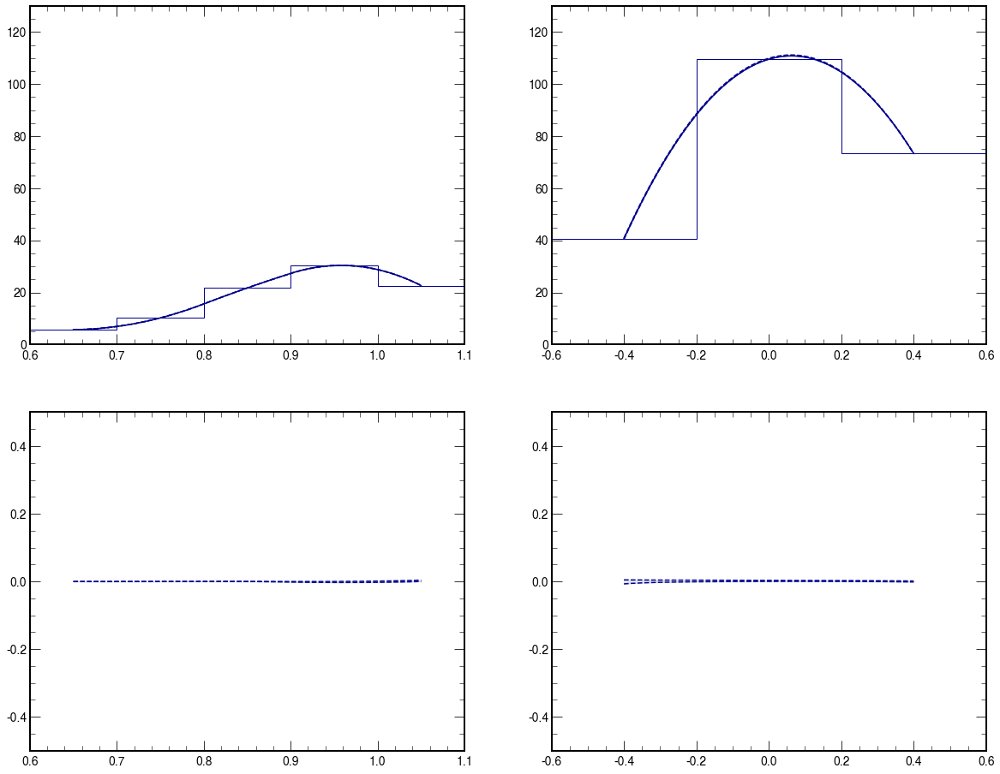

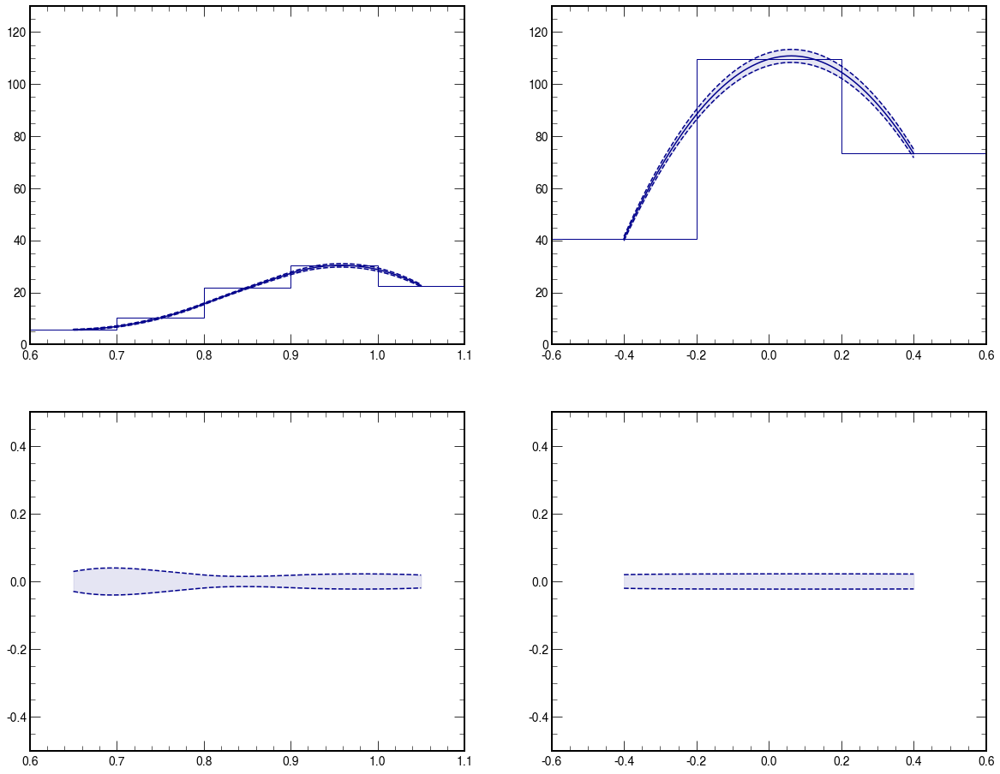

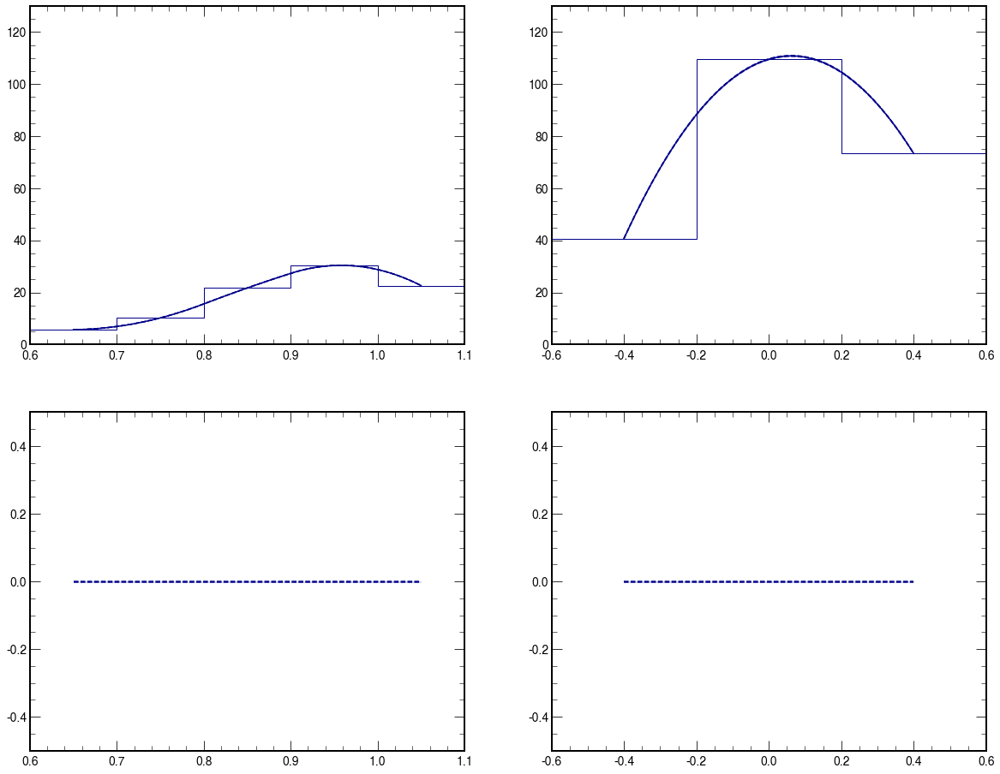

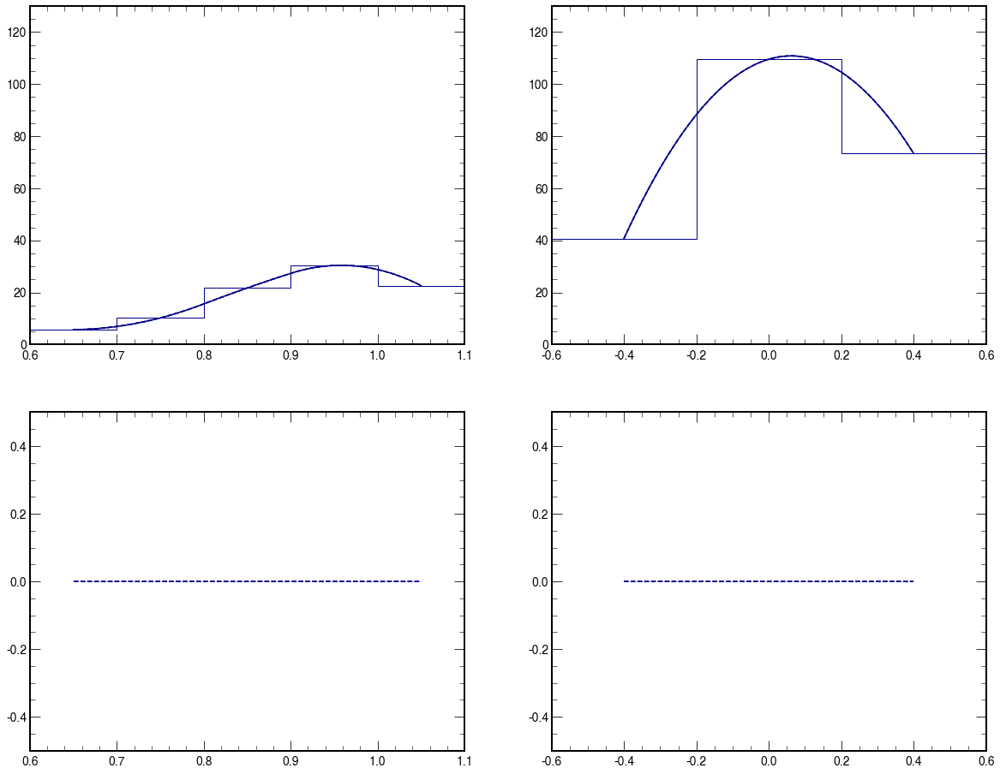

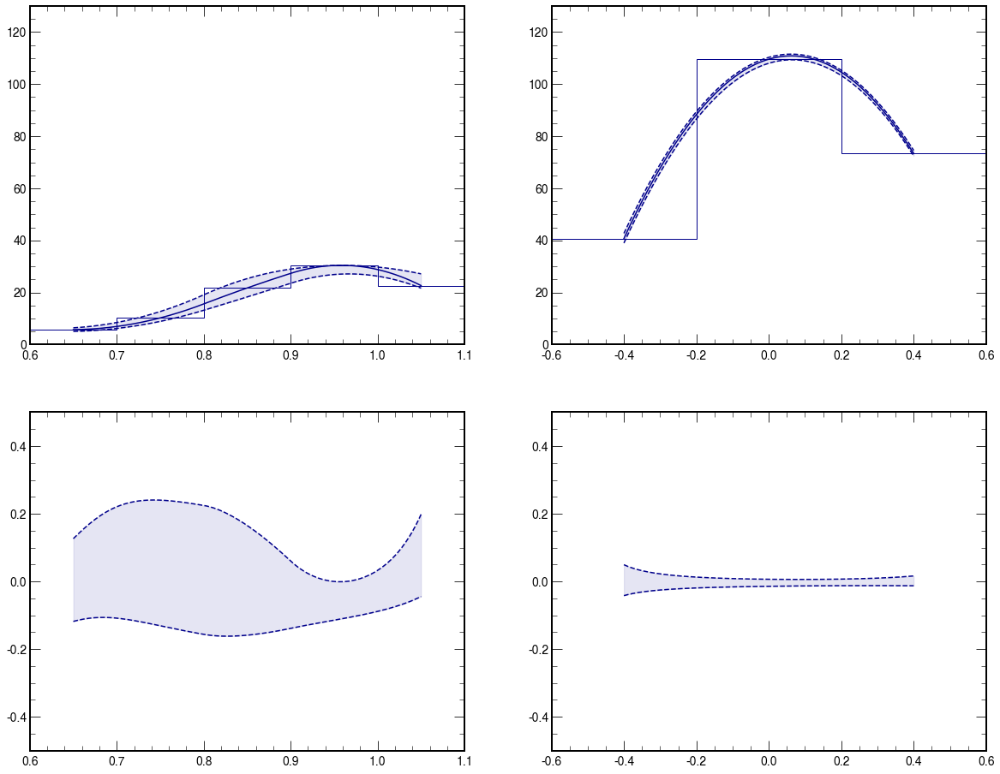

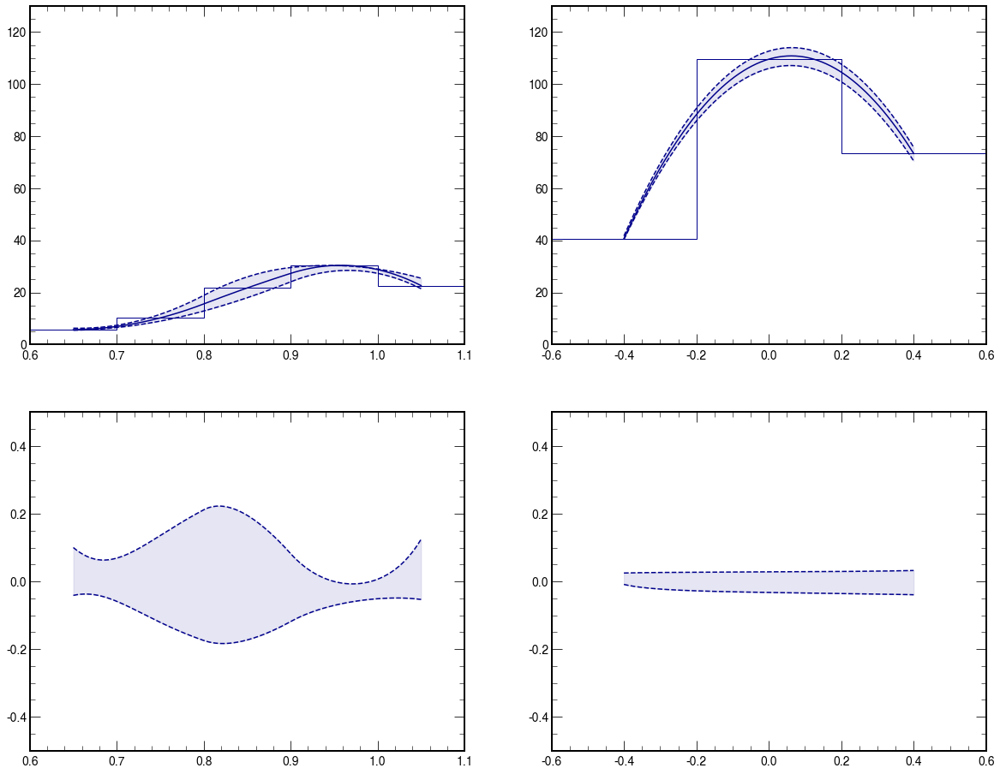

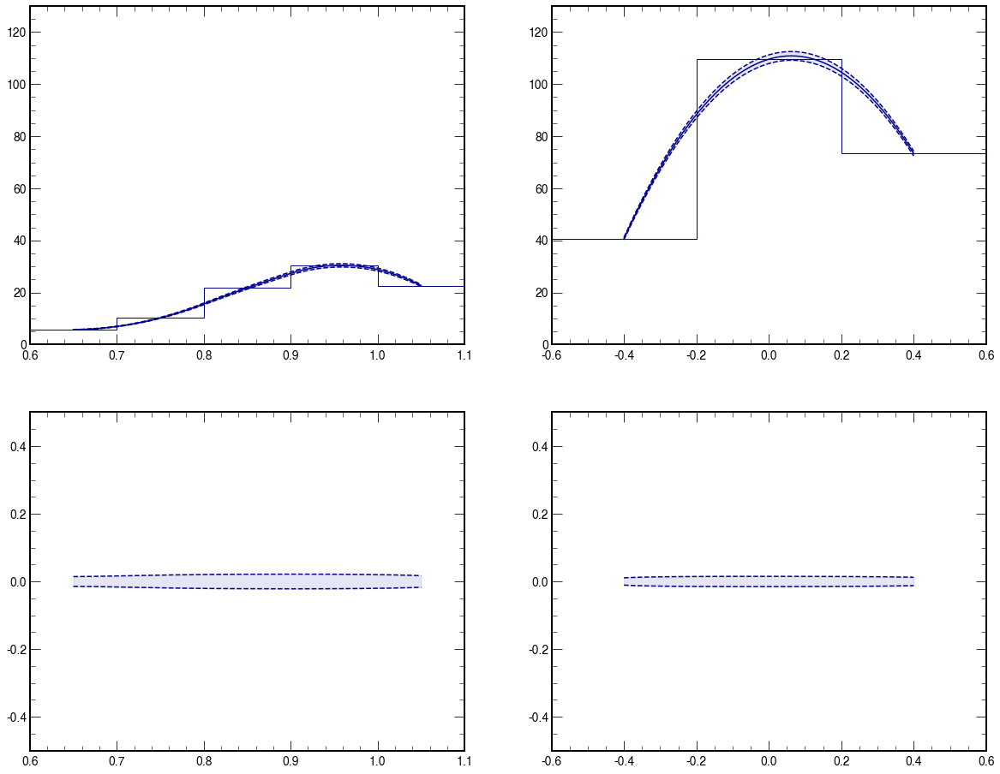

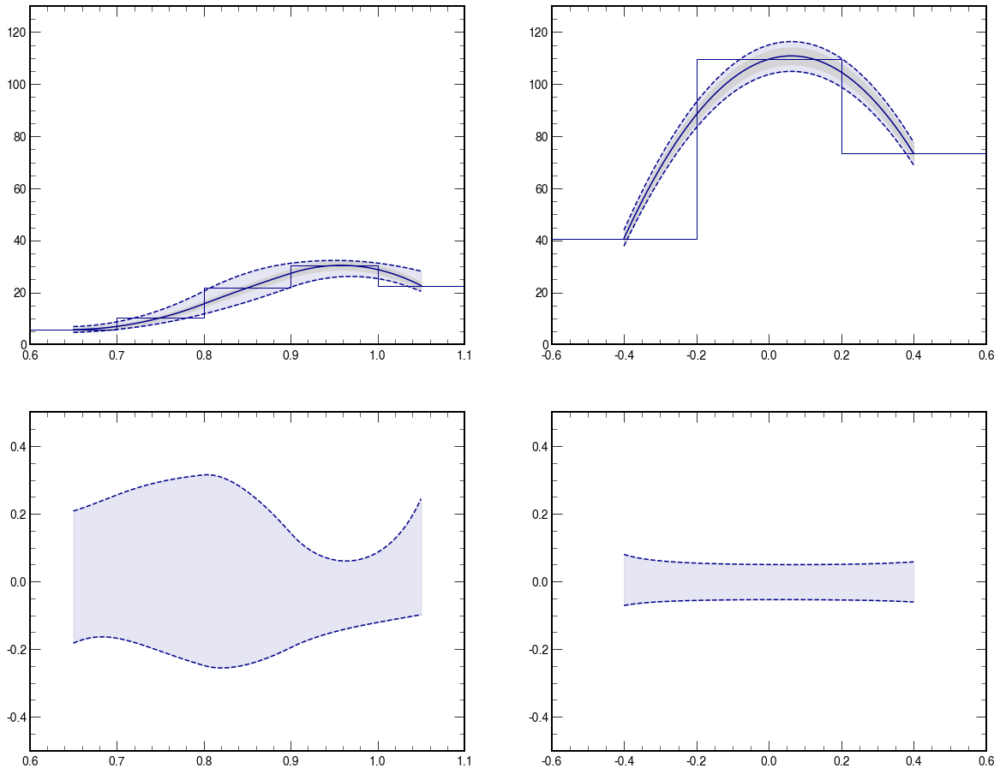

In [99]:
label_ = ""
coupling_str_ = "ACW2e-5"
# coupling_str_ = "A0W5e-6"
if data_sample == '2017':
    if lepton_type == 'muon':
#         label_ = "GGToWW-AQGC-A0W5e-6"
#         label_ = "GGToWW-AQGC-muon-A0W5e-6"
        label_ = "GGToWW-AQGC-2017-muon-" + coupling_str_
    elif lepton_type == 'electron':
#         label_ = "GGToWW-AQGC-electron-A0W5e-6"
        label_ = "GGToWW-AQGC-2017-electron-" + coupling_str_
if data_sample == '2018':
    if lepton_type == 'muon':
        label_ = "GGToWW-AQGC-2018-muon-" + coupling_str_
    elif lepton_type == 'electron':
        label_ = "GGToWW-AQGC-2018-electron-" + coupling_str_

# ylim_ = (0.,3.)
# ylim_ = (0.,5.)
ylim_ = (0.,130.)
counts[ label_ ], err[ label_ ], bins[ label_ ], max_variations_total[ label_ ], min_variations_total[ label_ ] = plot_total_systematic(
    df_dict=df_signals_protons_multiRP_sig_plus_mix_selected_events_categories_concat,
    weights_dict=weights_sig_plus_mix_categories_concat,
    lepton_type=lepton_type,
    label=label_,
    ylim=ylim_,
    ylim_ratio=ylim_ratio_,
    color=color_
    )    

if save_figures:
    if lepton_type == 'muon':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW2e-5-Muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW2e-5-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW2e-5-Electron_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/Cut-Based-Signal-Variations-ACW2e-5-Electron_2018.png", bbox_inches='tight' )

In [100]:
print ( counts )
print ( err )
print ( bins )
print ( max_variations_total )
print ( min_variations_total )

{'GGToWW-AQGC-2018-electron-A0W1e-6': {'R_MWW_MX': array([0.53242321, 0.77083667, 1.35288817, 1.17417712, 0.7819594 ]), 'Diff_YWW_YX': array([1.73808232, 5.09138374, 3.75849103])}, 'GGToWW-AQGC-2018-electron-A0W1e-7': {'R_MWW_MX': array([0.23853042, 0.3382311 , 0.33417451, 0.1912661 , 0.05781655]), 'Diff_YWW_YX': array([0.37505962, 0.84048412, 0.43218394])}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'R_MWW_MX': array([0.38375352, 0.35041215, 0.32934462, 0.20661251, 0.05176264]), 'Diff_YWW_YX': array([0.3839509 , 0.89641352, 0.65846279])}, 'GGToWW-AQGC-2018-electron-A0W2e-6': {'R_MWW_MX': array([1.29192302, 1.87992969, 3.17175329, 4.35947496, 2.96385622]), 'Diff_YWW_YX': array([ 6.25378319, 15.86995086,  9.52210444])}, 'GGToWW-AQGC-2018-electron-A0W5e-6': {'R_MWW_MX': array([ 5.35679001,  9.24562117, 18.12648373, 24.91752939, 19.28271176]), 'Diff_YWW_YX': array([37.58901504, 87.45184367, 62.83155443])}, 'GGToWW-AQGC-2018-electron-ACW5e-7': {'R_MWW_MX': array([0.2942096 , 0.35437325, 0.32960

### Background

### Load and select events

In [101]:
##criar flag para usar bkg assim ou da MC+mix_protons

# ['crossingAngle', 'betaStar', 'instLumi', 'jet0_pt', 'jet0_eta',
#        'jet0_phi', 'jet0_energy', 'jet0_mass', 'jet0_corrmass',
#        'jet0_tau1', 'jet0_tau2', 'jet0_vertexz', 'jet0_px', 'jet0_py',
#        'jet0_pz', 'calo_met', 'met', 'met_x', 'met_y', 'met_phi',
#        'nVertices', 'num_bjets_ak8', 'num_bjets_ak4', 'num_jets_ak4',
#        'pfcand_nextracks', 'pfcand_nextracks_noDRl', 'recoMWhad',
#        'recoMWlep', 'recoMWW', 'recoRapidityWW', 'dphiWW', 'WLeptonicPt',
#        'WLeptonicEta', 'WLeptonicPhi', 'muon0_pt', 'muon0_eta',
#        'muon0_phi', 'muon0_energy', 'muon0_charge', 'muon0_iso',
#        'muon0_dxy', 'muon0_dz', 'muon0_trackerLayersWithMeasurement',
#        'run_rnd', 'lumiblock_rnd', 'event_rnd', 'crossingAngle_rnd',
#        'betaStar_rnd', 'period', 'jet0_pt_nom', 'jet0_energy_nom',
#        'jet0_mass_nom', 'jet0_corrmass_nom', 'jet0_px_nom', 'jet0_py_nom',
#        'jet0_pz_nom', 'muon0_pt_nom', 'muon0_energy_nom', 'muon0_px_nom',
#        'muon0_py_nom', 'muon0_pz_nom', 'WLeptonicPt_nom',
#        'WLeptonicPx_nom', 'WLeptonicPy_nom', 'WLeptonicPz_nom',
#        'WLeptonicE_nom', 'WLeptonicM_nom', 'WW_energy_nom', 'WW_pz_nom',
#        'MWW_nom', 'YWW_nom', 'xiCMS_45_nom', 'xiCMS_56_nom', 'xi_nom',
#        'within_aperture', 'xlow', 'xhigh', 'ylow', 'yhigh', 'MX', 'YX',
#        'diffMWW_MX', 'ratioMWW_MX', 'shiftedRatioMWW_MX', 'diffYWW_YX',
#        'MX_nom', 'YX_nom', 'R_MWW_MX_nom', 'Diff_YWW_YX_nom']

In [102]:
# resample_factor = 20
# resample_factor = 50

# label = "data-random-resample_20"
# label = "data-random-resample_50-single-arm"

if not bkg_MC_mix_protons: 
    labels_background = []
    fileNames_bkg = {}
    resample_factor = 50
    if data_sample == '2017':
        if lepton_type == 'muon':
            labels_background = [
                "data-random-resample_50-single-arm-muon-2017B",
                "data-random-resample_50-single-arm-muon-2017C",
                "data-random-resample_50-single-arm-muon-2017D",
                "data-random-resample_50-single-arm-muon-2017E",
                "data-random-resample_50-single-arm-muon-2017F"
            ]
            fileNames_bkg = {
                "data-random-resample_50-single-arm-muon-2017B": "data-store-data-random-resample_50-single-arm-2017B.h5",
                "data-random-resample_50-single-arm-muon-2017C": "data-store-data-random-resample_50-single-arm-2017C.h5",
                "data-random-resample_50-single-arm-muon-2017D": "data-store-data-random-resample_50-single-arm-2017D.h5",
                "data-random-resample_50-single-arm-muon-2017E": "data-store-data-random-resample_50-single-arm-2017E.h5",
                "data-random-resample_50-single-arm-muon-2017F": "data-store-data-random-resample_50-single-arm-2017F.h5"
            }
        elif lepton_type == 'electron':
            labels_background = [
                "data-random-resample_50-single-arm-electron-2017B",
                "data-random-resample_50-single-arm-electron-2017C",
                "data-random-resample_50-single-arm-electron-2017D",
                "data-random-resample_50-single-arm-electron-2017E",
                "data-random-resample_50-single-arm-electron-2017F"
            ]
            fileNames_bkg = {
                "data-random-resample_50-single-arm-electron-2017B": "data-store-data-random-resample_50-single-arm-electron-2017B.h5",
                "data-random-resample_50-single-arm-electron-2017C": "data-store-data-random-resample_50-single-arm-electron-2017C.h5",
                "data-random-resample_50-single-arm-electron-2017D": "data-store-data-random-resample_50-single-arm-electron-2017D.h5",
                "data-random-resample_50-single-arm-electron-2017E": "data-store-data-random-resample_50-single-arm-electron-2017E.h5",
                "data-random-resample_50-single-arm-electron-2017F": "data-store-data-random-resample_50-single-arm-electron-2017F.h5"
            }
    elif data_sample == '2018':
        if lepton_type == 'muon':
            labels_background = [
                "data-random-resample_50-2018-muon-2018A",
                "data-random-resample_50-2018-muon-2018B",
                "data-random-resample_50-2018-muon-2018C",
                #"data-random-resample_50-2018-muon-2018D",
                "data-random-resample_50-2018-muon-2018D-1",
                "data-random-resample_50-2018-muon-2018D-2",
                "data-random-resample_50-2018-muon-2018D-3",
                "data-random-resample_50-2018-muon-2018D-4",
                "data-random-resample_50-2018-muon-2018D-5",
                "data-random-resample_50-2018-muon-2018D-6"
            ]
            fileNames_bkg = {
                "data-random-resample_50-2018-muon-2018A": "data-store-data-random-resample_50-2018-muon-2018A.h5",
                "data-random-resample_50-2018-muon-2018B": "data-store-data-random-resample_50-2018-muon-2018B.h5",
                "data-random-resample_50-2018-muon-2018C": "data-store-data-random-resample_50-2018-muon-2018C.h5",
                #"data-random-resample_50-2018-muon-2018D": "data-store-data-random-resample_50-2018-muon-2018D.h5",
                "data-random-resample_50-2018-muon-2018D-1": "data-store-data-random-resample_50-2018-muon-2018D-1.h5",
                "data-random-resample_50-2018-muon-2018D-2": "data-store-data-random-resample_50-2018-muon-2018D-2.h5",
                "data-random-resample_50-2018-muon-2018D-3": "data-store-data-random-resample_50-2018-muon-2018D-3.h5",
                "data-random-resample_50-2018-muon-2018D-4": "data-store-data-random-resample_50-2018-muon-2018D-4.h5",
                "data-random-resample_50-2018-muon-2018D-5": "data-store-data-random-resample_50-2018-muon-2018D-5.h5",
                "data-random-resample_50-2018-muon-2018D-6": "data-store-data-random-resample_50-2018-muon-2018D-6.h5"
            }             
        elif lepton_type == 'electron':
            labels_background = [
                "data-random-resample_50-2018-electron-2018A",
                "data-random-resample_50-2018-electron-2018B",
                "data-random-resample_50-2018-electron-2018C",
                #"data-random-resample_50-2018-electron-2018D",
                "data-random-resample_50-2018-electron-2018D-1",
                "data-random-resample_50-2018-electron-2018D-2",
                "data-random-resample_50-2018-electron-2018D-3",
                "data-random-resample_50-2018-electron-2018D-4",
                "data-random-resample_50-2018-electron-2018D-5",
                "data-random-resample_50-2018-electron-2018D-6"
            ]
            fileNames_bkg = {
                "data-random-resample_50-2018-electron-2018A": "data-store-data-random-resample_50-2018-electron-2018A.h5",
                "data-random-resample_50-2018-electron-2018B": "data-store-data-random-resample_50-2018-electron-2018B.h5",
                "data-random-resample_50-2018-electron-2018C": "data-store-data-random-resample_50-2018-electron-2018C.h5",
                #"data-random-resample_50-2018-electron-2018D": "data-store-data-random-resample_50-2018-electron-2018D.h5",
                "data-random-resample_50-2018-electron-2018D-1": "data-store-data-random-resample_50-2018-electron-2018D-1.h5",
                "data-random-resample_50-2018-electron-2018D-2": "data-store-data-random-resample_50-2018-electron-2018D-2.h5",
                "data-random-resample_50-2018-electron-2018D-3": "data-store-data-random-resample_50-2018-electron-2018D-3.h5",
                "data-random-resample_50-2018-electron-2018D-4": "data-store-data-random-resample_50-2018-electron-2018D-4.h5",
                "data-random-resample_50-2018-electron-2018D-5": "data-store-data-random-resample_50-2018-electron-2018D-5.h5",
                "data-random-resample_50-2018-electron-2018D-6": "data-store-data-random-resample_50-2018-electron-2018D-6.h5"
            }

    
#     base_path_ = "output"
    base_path_ = "output-final"
    #base_path_ = "output_new"
    for label_ in fileNames_bkg:
        fileNames_bkg[ label_ ] = "{}/{}".format( base_path_, fileNames_bkg[ label_ ] )
    print ( fileNames_bkg )

    # file_path_ = "{}/data-store-{}.h5".format( base_path_, label )
    # print ( file_path_ )

    df_counts_bkg = None
#     df_protons_multiRP_bkg_index = None #
    df_protons_multiRP_bkg_events = None
    df_protons_multiRP_bkg_events_nTracks40 = None

    df_counts_bkg_list_ = []
#     df_protons_multiRP_bkg_index_list_ = [] #
    df_protons_multiRP_bkg_events_list_ = []
    df_protons_multiRP_bkg_events_list_nTracks40_ = []
    for label_ in labels_background:
        print ( label_ )
        file_path_ = fileNames_bkg[ label_ ]
        print ( file_path_ )
        with pd.HDFStore( file_path_, 'r' ) as store_:
            print ( list( store_ ) )
            
            df_counts_bkg__ = store_[ "counts" ]
            df_protons_multiRP_bkg_index__  = store_[ "protons_multiRP" ] #
            df_protons_multiRP_bkg_events__ = store_[ "events_multiRP" ]
            if lepton_type == 'muon':
                df_protons_multiRP_bkg_events__ = df_protons_multiRP_bkg_events__.loc[ :, 
                    ['crossingAngle',
                     'jet0_eta', 'jet0_phi', 
                     'jet0_tau1', 'jet0_tau2',
                     'met', 'met_phi',
                     'num_bjets_ak4',
                     'pfcand_nextracks', 'pfcand_nextracks_noDRl',
                     'WLeptonicEta', 'WLeptonicPhi',
                     'muon0_eta', 'muon0_phi', 'muon0_iso',
                     'run_rnd', 'lumiblock_rnd', 'event_rnd', 'crossingAngle_rnd', 'period',
                     'nprotons_arm0', 'nprotons_arm1',
                     'jet0_pt_nom', 'jet0_energy_nom', 'jet0_corrmass_nom',
                     'muon0_pt_nom', 
                     'WLeptonicPt_nom', 
                     'MWW_nom', 'YWW_nom', 'xiCMS_45_nom', 'xiCMS_56_nom', 'xi_nom', 'xi_max_arm0', 'xi_max_arm1',
                     'MX_nom', 'YX_nom', 'R_MWW_MX_nom', 'Diff_YWW_YX_nom']
                ]
#                 df_protons_multiRP_bkg_index__ = df_protons_multiRP_bkg_index__.loc[ :, 
#                     ['crossingAngle',
#                      'jet0_eta', 'jet0_phi', 
#                      'jet0_tau1', 'jet0_tau2',
#                      'met', 'met_phi',
#                      'num_bjets_ak4',
#                      'pfcand_nextracks', 'pfcand_nextracks_noDRl',
#                      'WLeptonicEta', 'WLeptonicPhi',
#                      'muon0_eta', 'muon0_phi', 'muon0_iso',
#                      'run_rnd', 'lumiblock_rnd', 'event_rnd', 'crossingAngle_rnd', 'period',
#                      'nprotons_arm0', 'nprotons_arm1',
#                      'jet0_pt_nom', 'jet0_energy_nom', 'jet0_corrmass_nom',
#                      'muon0_pt_nom', 
#                      'WLeptonicPt_nom', 
#                      'MWW_nom', 'YWW_nom', 'xiCMS_45_nom', 'xiCMS_56_nom', 'xi_nom']
#                 ]
            if lepton_type == 'electron':
                df_protons_multiRP_bkg_events__ = df_protons_multiRP_bkg_events__.loc[ :, 
                    ['crossingAngle',
                     'jet0_eta', 'jet0_phi', 
                     'jet0_tau1', 'jet0_tau2',
                     'met', 'met_phi',
                     'num_bjets_ak4',
                     'pfcand_nextracks', 'pfcand_nextracks_noDRl',
                     'WLeptonicEta', 'WLeptonicPhi',
                     'electron0_eta', 'electron0_phi', 
                     'run_rnd', 'lumiblock_rnd', 'event_rnd', 'crossingAngle_rnd', 'period',
                     'nprotons_arm0', 'nprotons_arm1',
                     'jet0_pt_nom', 'jet0_energy_nom', 'jet0_corrmass_nom',
                     'electron0_pt_nom', 
                     'WLeptonicPt_nom', 
                     'MWW_nom', 'YWW_nom', 'xiCMS_45_nom', 'xiCMS_56_nom', 'xi_nom', 'xi_max_arm0', 'xi_max_arm1',
                     'MX_nom', 'YX_nom', 'R_MWW_MX_nom', 'Diff_YWW_YX_nom']
                ]
#                 df_protons_multiRP_bkg_index__ = df_protons_multiRP_bkg_index__.loc[ :, 
#                     ['crossingAngle',
#                      'jet0_eta', 'jet0_phi', 
#                      'jet0_tau1', 'jet0_tau2',
#                      'met', 'met_phi',
#                      'num_bjets_ak4',
#                      'pfcand_nextracks', 'pfcand_nextracks_noDRl',
#                      'WLeptonicEta', 'WLeptonicPhi',
#                      'muon0_eta', 'muon0_phi', 'muon0_iso',
#                      'run_rnd', 'lumiblock_rnd', 'event_rnd', 'crossingAngle_rnd', 'period',
#                      'nprotons_arm0', 'nprotons_arm1',
#                      'jet0_pt_nom', 'jet0_energy_nom', 'jet0_corrmass_nom',
#                      'muon0_pt_nom', 
#                      'WLeptonicPt_nom', 
#                      'MWW_nom', 'YWW_nom', 'xiCMS_45_nom', 'xiCMS_56_nom', 'xi_nom']
#                 ]

            print ( df_protons_multiRP_bkg_events__.shape[0] )
            df_protons_multiRP_bkg_events_nTracks40__, selection_keys__, selections__ = select_events( df_protons_multiRP_bkg_events__, lepton_type, max_num_tracks=40 )
            print ( df_protons_multiRP_bkg_events_nTracks40__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ )
            df_protons_multiRP_bkg_events_def__, selection_keys__, selections__ = select_events( df_protons_multiRP_bkg_events__, lepton_type )
            print ( df_protons_multiRP_bkg_events_def__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ ) 
            df_protons_multiRP_bkg_index__, selection_keys__, selections__ = select_events( df_protons_multiRP_bkg_index__, lepton_type )
            print ( df_protons_multiRP_bkg_index__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ )
    
            df_counts_bkg_list_.append( df_counts_bkg__ )
#             df_protons_multiRP_bkg_index_list_.append( df_protons_multiRP_bkg_index__ ) #
    #         df_protons_multiRP_bkg_events_list_.append( df_protons_multiRP_bkg_events__ )
            df_protons_multiRP_bkg_events_list_.append( df_protons_multiRP_bkg_events_def__ )
            df_protons_multiRP_bkg_events_list_nTracks40_.append( df_protons_multiRP_bkg_events_nTracks40__ )

    df_counts_bkg = df_counts_bkg_list_[0]
    for idx_ in range( 1, len( df_counts_bkg_list_ ) ):
        df_counts_bkg = df_counts_bkg.add( df_counts_bkg_list_[ idx_ ] )

#     df_protons_multiRP_bkg_index = pd.concat( df_protons_multiRP_bkg_index_list_ ) #
    df_protons_multiRP_bkg_events = pd.concat( df_protons_multiRP_bkg_events_list_ )
    df_protons_multiRP_bkg_events_nTracks40 = pd.concat( df_protons_multiRP_bkg_events_list_nTracks40_ )

{'data-random-resample_50-2018-electron-2018A': 'output-final/data-store-data-random-resample_50-2018-electron-2018A.h5', 'data-random-resample_50-2018-electron-2018B': 'output-final/data-store-data-random-resample_50-2018-electron-2018B.h5', 'data-random-resample_50-2018-electron-2018C': 'output-final/data-store-data-random-resample_50-2018-electron-2018C.h5', 'data-random-resample_50-2018-electron-2018D-1': 'output-final/data-store-data-random-resample_50-2018-electron-2018D-1.h5', 'data-random-resample_50-2018-electron-2018D-2': 'output-final/data-store-data-random-resample_50-2018-electron-2018D-2.h5', 'data-random-resample_50-2018-electron-2018D-3': 'output-final/data-store-data-random-resample_50-2018-electron-2018D-3.h5', 'data-random-resample_50-2018-electron-2018D-4': 'output-final/data-store-data-random-resample_50-2018-electron-2018D-4.h5', 'data-random-resample_50-2018-electron-2018D-5': 'output-final/data-store-data-random-resample_50-2018-electron-2018D-5.h5', 'data-rando

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


32827
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 4053154, 'Electron': 4050987, 'Jet': 2891773, 'Jet_Electron': 2855617, 'MET': 935932, 'Jet_MET': 909205, 'PrunedMass': 254516, 'Tau21': 129109, 'BJet_Veto': 100236, 'Xi_CMS': 86396, 'WLeptonic': 72607, 'Jet_WLeptonic': 70833, 'MWW': 67722, 'ExtraTracks': 33705, 'NProtons': 32827}
313
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 4053154, 'Electron': 4050987, 'Jet': 2891773, 'Jet_Electron': 2855617, 'MET': 935932, 'Jet_MET': 909205, 'PrunedMass': 254516, 'Tau21': 129109, 'BJet_Veto': 100236, 'Xi_CMS': 86396, 'WLeptonic': 72607, 'Jet_WLeptonic': 70833, 'MWW': 67722, 'ExtraTracks': 323, 'NProtons': 313}
626
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMa

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


21564
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2483713, 'Electron': 2482461, 'Jet': 1769136, 'Jet_Electron': 1747675, 'MET': 573339, 'Jet_MET': 556564, 'PrunedMass': 155186, 'Tau21': 79450, 'BJet_Veto': 62485, 'Xi_CMS': 53911, 'WLeptonic': 45743, 'Jet_WLeptonic': 44933, 'MWW': 43203, 'ExtraTracks': 22020, 'NProtons': 21564}
182
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2483713, 'Electron': 2482461, 'Jet': 1769136, 'Jet_Electron': 1747675, 'MET': 573339, 'Jet_MET': 556564, 'PrunedMass': 155186, 'Tau21': 79450, 'BJet_Veto': 62485, 'Xi_CMS': 53911, 'WLeptonic': 45743, 'Jet_WLeptonic': 44933, 'MWW': 43203, 'ExtraTracks': 189, 'NProtons': 182}
364
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


23777
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2787449, 'Electron': 2786093, 'Jet': 1997775, 'Jet_Electron': 1975292, 'MET': 678052, 'Jet_MET': 659152, 'PrunedMass': 181549, 'Tau21': 88903, 'BJet_Veto': 71521, 'Xi_CMS': 59249, 'WLeptonic': 50464, 'Jet_WLeptonic': 49326, 'MWW': 47293, 'ExtraTracks': 24353, 'NProtons': 23777}
174
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 2787449, 'Electron': 2786093, 'Jet': 1997775, 'Jet_Electron': 1975292, 'MET': 678052, 'Jet_MET': 659152, 'PrunedMass': 181549, 'Tau21': 88903, 'BJet_Veto': 71521, 'Xi_CMS': 59249, 'WLeptonic': 50464, 'Jet_WLeptonic': 49326, 'MWW': 47293, 'ExtraTracks': 180, 'NProtons': 174}
348
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


16639
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1955250, 'Electron': 1954440, 'Jet': 1399675, 'Jet_Electron': 1383506, 'MET': 471779, 'Jet_MET': 458564, 'PrunedMass': 125483, 'Tau21': 61687, 'BJet_Veto': 50067, 'Xi_CMS': 41781, 'WLeptonic': 35280, 'Jet_WLeptonic': 34281, 'MWW': 32922, 'ExtraTracks': 16951, 'NProtons': 16639}
112
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1955250, 'Electron': 1954440, 'Jet': 1399675, 'Jet_Electron': 1383506, 'MET': 471779, 'Jet_MET': 458564, 'PrunedMass': 125483, 'Tau21': 61687, 'BJet_Veto': 50067, 'Xi_CMS': 41781, 'WLeptonic': 35280, 'Jet_WLeptonic': 34281, 'MWW': 32922, 'ExtraTracks': 114, 'NProtons': 112}
224
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


17658
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1984338, 'Electron': 1983524, 'Jet': 1422179, 'Jet_Electron': 1405946, 'MET': 478986, 'Jet_MET': 466103, 'PrunedMass': 129228, 'Tau21': 65004, 'BJet_Veto': 52448, 'Xi_CMS': 43896, 'WLeptonic': 36725, 'Jet_WLeptonic': 35938, 'MWW': 34473, 'ExtraTracks': 17988, 'NProtons': 17658}
100
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1984338, 'Electron': 1983524, 'Jet': 1422179, 'Jet_Electron': 1405946, 'MET': 478986, 'Jet_MET': 466103, 'PrunedMass': 129228, 'Tau21': 65004, 'BJet_Veto': 52448, 'Xi_CMS': 43896, 'WLeptonic': 36725, 'Jet_WLeptonic': 35938, 'MWW': 34473, 'ExtraTracks': 100, 'NProtons': 100}
200
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


16727
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1899035, 'Electron': 1898060, 'Jet': 1364934, 'Jet_Electron': 1350015, 'MET': 461931, 'Jet_MET': 449217, 'PrunedMass': 124086, 'Tau21': 63180, 'BJet_Veto': 50958, 'Xi_CMS': 42375, 'WLeptonic': 36178, 'Jet_WLeptonic': 35465, 'MWW': 34135, 'ExtraTracks': 17035, 'NProtons': 16727}
146
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1899035, 'Electron': 1898060, 'Jet': 1364934, 'Jet_Electron': 1350015, 'MET': 461931, 'Jet_MET': 449217, 'PrunedMass': 124086, 'Tau21': 63180, 'BJet_Veto': 50958, 'Xi_CMS': 42375, 'WLeptonic': 36178, 'Jet_WLeptonic': 35465, 'MWW': 34135, 'ExtraTracks': 152, 'NProtons': 146}
292
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass',

/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


18013
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1985539, 'Electron': 1984750, 'Jet': 1426229, 'Jet_Electron': 1410248, 'MET': 486744, 'Jet_MET': 472678, 'PrunedMass': 132129, 'Tau21': 64631, 'BJet_Veto': 52984, 'Xi_CMS': 43866, 'WLeptonic': 37244, 'Jet_WLeptonic': 36383, 'MWW': 34927, 'ExtraTracks': 18386, 'NProtons': 18013}
91
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 1985539, 'Electron': 1984750, 'Jet': 1426229, 'Jet_Electron': 1410248, 'MET': 486744, 'Jet_MET': 472678, 'PrunedMass': 132129, 'Tau21': 64631, 'BJet_Veto': 52984, 'Xi_CMS': 43866, 'WLeptonic': 37244, 'Jet_WLeptonic': 36383, 'MWW': 34927, 'ExtraTracks': 93, 'NProtons': 91}
182
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'T

In [103]:
if bkg_MC_mix_protons:
    labels_background = []
    fileNames_bkg = {}
    resample_factor = 1
    if data_sample == '2017':
        if lepton_type == 'muon':
            labels_background = [ "GGToWW-AQGC-mix_protons-2017-muon-A0W1e-6", "GGToWW-AQGC-mix_protons-2017-muon-A0W2e-6", "GGToWW-AQGC-mix_protons-2017-muon-A0W5e-6" ]
            fileNames_bkg = {
                "GGToWW-AQGC-mix_protons-2017-muon-A0W1e-6": "data-store-GGToWW-AQGC-mix_protons-2018-muon-A0W1e-6.h5",
                "GGToWW-AQGC-mix_protons-2017-muon-A0W2e-6": "data-store-GGToWW-AQGC-mix_protons-2018-muon-A0W2e-6.h5",
                "GGToWW-AQGC-mix_protons-2017-muon-A0W5e-6": "data-store-GGToWW-AQGC-mix_protons-2018-muon-A0W5e-6.h5"
            }
        elif lepton_type == 'electron':
            labels_background = [ "GGToWW-AQGC-mix_protons-2017-electron-A0W1e-6", "GGToWW-AQGC-mix_protons-2017-electron-A0W2e-6", "GGToWW-AQGC-mix_protons-2017-electron-A0W5e-6" ] 
            fileNames_bkg = {
                "GGToWW-AQGC-mix_protons-2017-electron-A0W1e-6": "data-store-GGToWW-AQGC-mix_protons-2018-electron-A0W1e-6.h5",
                "GGToWW-AQGC-mix_protons-2017-electron-A0W2e-6": "data-store-GGToWW-AQGC-mix_protons-2018-electron-A0W2e-6.h5",
                "GGToWW-AQGC-mix_protons-2017-electron-A0W5e-6": "data-store-GGToWW-AQGC-mix_protons-2018-electron-A0W5e-6.h5"
            }
    elif data_sample == '2018':
        if lepton_type == 'muon':
            labels_background = [ "Bkg-mix_protons-2018-muon-TTJets", "Bkg-mix_protons-2018-muon-WJetsToLNu_0J", "Bkg-mix_protons-2018-muon-WJetsToLNu_1J", "Bkg-mix_protons-2018-muon-WJetsToLNu_2J", "Bkg-mix_protons-2018-muon-DYJetsToLL_0J", "Bkg-mix_protons-2018-muon-DYJetsToLL_1J", "Bkg-mix_protons-2018-muon-DYJetsToLL_2J", "Bkg-mix_protons-2018-muon-QCD_Pt_170to300", "Bkg-mix_protons-2018-muon-QCD_Pt_300to470", "Bkg-mix_protons-2018-muon-QCD_Pt_470to600", "Bkg-mix_protons-2018-muon-QCD_Pt_600to800", "Bkg-mix_protons-2018-muon-QCD_Pt_800to1000", "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400", "Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800", "Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400", "Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200", "Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf", "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays", "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays", "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays", "Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays", "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays", "Bkg-mix_protons-2018-muon-WW", "Bkg-mix_protons-2018-muon-WZ", "Bkg-mix_protons-2018-muon-ZZ"]
            #labels_background = [ "Bkg-mix_protons-2018-muon-WJetsToLNu_2J", "Bkg-mix_protons-2018-muon-QCD_Pt_300to470", "Bkg-mix_protons-2018-muon-QCD_Pt_470to600", "Bkg-mix_protons-2018-muon-QCD_Pt_600to800", "Bkg-mix_protons-2018-muon-QCD_Pt_800to1000", "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400", "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays", "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays", "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays", "Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays", "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays" ] 
            fileNames_bkg = {
                "Bkg-mix_protons-2018-muon-TTJets": "data-store-Bkg-mix_protons-2018-muon-TTJets.h5",
                "Bkg-mix_protons-2018-muon-WJetsToLNu_0J": "data-store-Bkg-mix_protons-2018-muon-WJetsToLNu_0J.h5",
                "Bkg-mix_protons-2018-muon-WJetsToLNu_1J": "data-store-Bkg-mix_protons-2018-muon-WJetsToLNu_1J.h5",
                "Bkg-mix_protons-2018-muon-WJetsToLNu_2J": "data-store-Bkg-mix_protons-2018-muon-WJetsToLNu_2J.h5",
                "Bkg-mix_protons-2018-muon-DYJetsToLL_0J": "data-store-Bkg-mix_protons-2018-muon-DYJetsToLL_0J.h5",
                "Bkg-mix_protons-2018-muon-DYJetsToLL_1J": "data-store-Bkg-mix_protons-2018-muon-DYJetsToLL_1J.h5",
                "Bkg-mix_protons-2018-muon-DYJetsToLL_2J": "data-store-Bkg-mix_protons-2018-muon-DYJetsToLL_2J.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_170to300": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_170to300.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_300to470": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_300to470.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_470to600": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_470to600.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_600to800": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_600to800.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_800to1000": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_800to1000.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200.h5",
                "Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf": "data-store-Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf.h5",
                "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays": "data-store-Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays.h5",
                "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays": "data-store-Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays.h5",
                "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays": "data-store-Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays.h5",
                "Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays": "data-store-Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays.h5",
                "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays": "data-store-Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays.h5",
                "Bkg-mix_protons-2018-muon-WW": "data-store-Bkg-mix_protons-2018-muon-WW.h5",
                "Bkg-mix_protons-2018-muon-WZ": "data-store-Bkg-mix_protons-2018-muon-WZ.h5",
                "Bkg-mix_protons-2018-muon-ZZ": "data-store-Bkg-mix_protons-2018-muon-ZZ.h5"
            }
  
        elif lepton_type == 'electron':
            labels_background = [ "Bkg-mix_protons-2018-electron-TTJets", "Bkg-mix_protons-2018-electron-WJetsToLNu_0J", "Bkg-mix_protons-2018-electron-WJetsToLNu_1J", "Bkg-mix_protons-2018-electron-WJetsToLNu_2J", "Bkg-mix_protons-2018-electron-DYJetsToLL_0J", "Bkg-mix_protons-2018-electron-DYJetsToLL_1J", "Bkg-mix_protons-2018-electron-DYJetsToLL_2J", "Bkg-mix_protons-2018-electron-QCD_Pt_170to300", "Bkg-mix_protons-2018-electron-QCD_Pt_300to470", "Bkg-mix_protons-2018-electron-QCD_Pt_470to600", "Bkg-mix_protons-2018-electron-QCD_Pt_600to800", "Bkg-mix_protons-2018-electron-QCD_Pt_800to1000", "Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400", "Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800", "Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400", "Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200", "Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf", "Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays", "Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays", "Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays", "Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays", "Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays", "Bkg-mix_protons-2018-electron-WW", "Bkg-mix_protons-2018-electron-WZ", "Bkg-mix_protons-2018-electron-ZZ" ]
            fileNames_bkg = {
                "Bkg-mix_protons-2018-electron-TTJets": "data-store-Bkg-mix_protons-2018-electron-TTJets.h5",
                "Bkg-mix_protons-2018-electron-WJetsToLNu_0J": "data-store-Bkg-mix_protons-2018-electron-WJetsToLNu_0J.h5",
                "Bkg-mix_protons-2018-electron-WJetsToLNu_1J": "data-store-Bkg-mix_protons-2018-electron-WJetsToLNu_1J.h5",
                "Bkg-mix_protons-2018-electron-WJetsToLNu_2J": "data-store-Bkg-mix_protons-2018-electron-WJetsToLNu_2J.h5",
                "Bkg-mix_protons-2018-electron-DYJetsToLL_0J": "data-store-Bkg-mix_protons-2018-electron-DYJetsToLL_0J.h5",
                "Bkg-mix_protons-2018-electron-DYJetsToLL_1J": "data-store-Bkg-mix_protons-2018-electron-DYJetsToLL_1J.h5",
                "Bkg-mix_protons-2018-electron-DYJetsToLL_2J": "data-store-Bkg-mix_protons-2018-electron-DYJetsToLL_2J.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_170to300": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_170to300.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_300to470": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_300to470.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_470to600": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_470to600.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_600to800": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_600to800.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_800to1000": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_800to1000.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200.h5",
                "Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf": "data-store-Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf.h5",
                "Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays": "data-store-Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays.h5",
                "Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays": "data-store-Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays.h5",
                "Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays": "data-store-Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays.h5",
                "Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays": "data-store-Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays.h5",
                "Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays": "data-store-Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays.h5",
                "Bkg-mix_protons-2018-electron-WW": "data-store-Bkg-mix_protons-2018-electron-WW.h5",
                "Bkg-mix_protons-2018-electron-WZ": "data-store-Bkg-mix_protons-2018-electron-WZ.h5",
                "Bkg-mix_protons-2018-electron-ZZ": "data-store-Bkg-mix_protons-2018-electron-ZZ.h5"
    
            } 
            
    df_counts_bkg = {}
    df_protons_multiRP_bkg_index = {}
    df_protons_multiRP_bkg_pre_sel_events = {}
    df_protons_multiRP_bkg_events = {}
    df_protons_multiRP_bkg_events_nTracks40 = {}
#    df_counts_bkg_list_ = []
#    df_protons_multiRP_bkg_index_list_ = []
#    df_protons_multiRP_bkg_events_list_ = []
#    df_protons_multiRP_bkg_events_list_nTracks40_ = []
    
#     base_path_ = "output"
    base_path_ = "output_05-07"
    #base_path_ = "output_new"
    for label_ in labels_background:
        print ( label_ )
        file_path_ = "{}/data-store-{}.h5".format( base_path_, label_ )
        with pd.HDFStore( file_path_, 'r' ) as store_:
            print ( list( store_ ) )
            df_counts_bkg[ label_ ] = store_[ "counts" ]
            df_protons_multiRP_bkg_index[ label_ ] = store_[ "protons_multiRP" ]
            df_protons_multiRP_bkg_pre_sel_events[ label_ ] = store_[ "events_multiRP" ]
            
            df_bkg__ = df_protons_multiRP_bkg_pre_sel_events[ label_ ]
            jet0_tau21_, rhoprime1_, jet0_tau21_ddt_ = tau21_ddt_calculation( df_bkg__, lepton_type )
            df_bkg__["jet0_tau21"] = jet0_tau21_
            df_bkg__["jet0_tau21_ddt"] = jet0_tau21_ddt_
            print ( df_bkg__.shape[0] )
            
            df_protons_multiRP_bkg_events__, selection_keys__, selections__ = select_events( df_bkg__, lepton_type )
            print ( df_protons_multiRP_bkg_events__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ )
            df_protons_multiRP_bkg_events[ label_ ] = {}
            df_protons_multiRP_bkg_events[ label_ ][ "_nom" ] = df_protons_multiRP_bkg_events__
            
            df_protons_multiRP_bkg_events_nTracks40__, selection_keys__, selections__ = select_events( df_bkg__, lepton_type, max_num_tracks=40 )
            print ( df_protons_multiRP_bkg_events_nTracks40__.shape[0] )
            print ( selection_keys__ )
            print ( selections__ )
            df_protons_multiRP_bkg_events_nTracks40[ label_ ] = {}
            df_protons_multiRP_bkg_events_nTracks40[ label_ ][ "_nom" ] = df_protons_multiRP_bkg_events_nTracks40__

#            df_counts_bkg_list_.append( df_counts_bkg__ )
#            df_protons_multiRP_bkg_index_list_.append( df_protons_multiRP_bkg_index__ )
#            df_protons_multiRP_bkg_events_list_.append( df_protons_multiRP_bkg_events__ )
#            df_protons_multiRP_bkg_events_list_.append( df_protons_multiRP_bkg_events_def__ )
#            df_protons_multiRP_bkg_events_list_nTracks40_.append( df_protons_multiRP_bkg_events_nTracks40__ )

#    df_counts_bkg = df_counts_bkg_list_[0]
#    for idx_ in range( 1, len( df_counts_bkg_list_ ) ):
#        df_counts_bkg = df_counts_bkg.add( df_counts_bkg_list_[ idx_ ] )

#    # df_protons_multiRP_bkg_index = pd.concat( df_protons_multiRP_bkg_index_list_ )
#    df_protons_multiRP_bkg_events = pd.concat( df_protons_multiRP_bkg_events_list_ )
#    df_protons_multiRP_bkg_events_nTracks40 = pd.concat( df_protons_multiRP_bkg_events_list_nTracks40_ )

In [104]:
if not bkg_MC_mix_protons:
    print(df_protons_multiRP_bkg_events)
if bkg_MC_mix_protons:
    print(df_protons_multiRP_bkg_events[ label_ ][ "_nom" ])

                                   crossingAngle  jet0_eta  jet0_phi  jet0_tau1  jet0_tau2         met   met_phi  num_bjets_ak4  pfcand_nextracks  pfcand_nextracks_noDRl  WLeptonicEta  WLeptonicPhi  electron0_eta  electron0_phi  run_rnd  lumiblock_rnd   event_rnd  crossingAngle_rnd  period  nprotons_arm0  nprotons_arm1  jet0_pt_nom  jet0_energy_nom  jet0_corrmass_nom  electron0_pt_nom  WLeptonicPt_nom     MWW_nom   YWW_nom  xiCMS_45_nom  xiCMS_56_nom    xi_nom  xi_max_arm0  xi_max_arm1       MX_nom    YX_nom  R_MWW_MX_nom  Diff_YWW_YX_nom
run    lumiblock event      slice                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [105]:
df_counts_bkg

All                     104348550
Jet                     104348550
Electron                101700850
ProtonRnd_check_none    101700850
ProtonRnd                73687250
dtype: int64

In [106]:
if not bkg_MC_mix_protons:
    print(df_protons_multiRP_bkg_events.columns.values)

['crossingAngle' 'jet0_eta' 'jet0_phi' 'jet0_tau1' 'jet0_tau2' 'met'
 'met_phi' 'num_bjets_ak4' 'pfcand_nextracks' 'pfcand_nextracks_noDRl'
 'WLeptonicEta' 'WLeptonicPhi' 'electron0_eta' 'electron0_phi' 'run_rnd'
 'lumiblock_rnd' 'event_rnd' 'crossingAngle_rnd' 'period' 'nprotons_arm0'
 'nprotons_arm1' 'jet0_pt_nom' 'jet0_energy_nom' 'jet0_corrmass_nom'
 'electron0_pt_nom' 'WLeptonicPt_nom' 'MWW_nom' 'YWW_nom' 'xiCMS_45_nom'
 'xiCMS_56_nom' 'xi_nom' 'xi_max_arm0' 'xi_max_arm1' 'MX_nom' 'YX_nom'
 'R_MWW_MX_nom' 'Diff_YWW_YX_nom']


In [107]:
if not bkg_MC_mix_protons:
    print(df_protons_multiRP_bkg_events_nTracks40)
if bkg_MC_mix_protons:
    print(df_protons_multiRP_bkg_events_nTracks40[ label_ ][ "_nom" ])

                                  crossingAngle  jet0_eta  jet0_phi  jet0_tau1  jet0_tau2         met   met_phi  num_bjets_ak4  pfcand_nextracks  pfcand_nextracks_noDRl  WLeptonicEta  WLeptonicPhi  electron0_eta  electron0_phi  run_rnd  lumiblock_rnd  event_rnd  crossingAngle_rnd  period  nprotons_arm0  nprotons_arm1  jet0_pt_nom  jet0_energy_nom  jet0_corrmass_nom  electron0_pt_nom  WLeptonicPt_nom     MWW_nom   YWW_nom  xiCMS_45_nom  xiCMS_56_nom    xi_nom  xi_max_arm0  xi_max_arm1       MX_nom    YX_nom  R_MWW_MX_nom  Diff_YWW_YX_nom
run    lumiblock event     slice                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [108]:
if not bkg_MC_mix_protons:
    norm_factors = {}
    norm_factors['Bkg'] = np.array( [ ( 1. / resample_factor ) ] )
    df_protons_multiRP_bkg_events_nTracks40[ "norm" ] = np.product( norm_factors['Bkg'] )
    df_protons_multiRP_bkg_events[ "norm" ] = np.product( norm_factors['Bkg'] )
#     df_protons_multiRP_bkg_index[ "norm" ] = np.product( norm_factors['Bkg'] )

In [109]:
if bkg_MC_mix_protons:
    labels_samples_bkg = {
        "Bkg-mix_protons-2018-muon-TTJets": r"$t \bar{t} + \rm{jets}$",
        "Bkg-mix_protons-2018-electron-TTJets": r"$t \bar{t} + \rm{jets}$",
        "Bkg-mix_protons-2018-muon-WJetsToLNu_0J": r"$W + 0\rm{jet}$",
        "Bkg-mix_protons-2018-electron-WJetsToLNu_0J": r"$W + 0\rm{jet}$",
        "Bkg-mix_protons-2018-muon-WJetsToLNu_1J": r"$W + 1\rm{jet}$",
        "Bkg-mix_protons-2018-electron-WJetsToLNu_1J": r"$W + 1\rm{jet}$",
        "Bkg-mix_protons-2018-muon-WJetsToLNu_2J": r"$W + 2\rm{jets}$",
        "Bkg-mix_protons-2018-electron-WJetsToLNu_2J": r"$W + 2\rm{jets}$",
        "Bkg-mix_protons-2018-muon-WJetsToLNu": r"$W + \rm{jets}$",
        "Bkg-mix_protons-2018-electron-WJetsToLNu": r"$W + \rm{jets}$",
        "Bkg-mix_protons-2018-muon-DYJetsToLL_0J": r"$\rm{DY} + 0\rm{jet}$",
        "Bkg-mix_protons-2018-electron-DYJetsToLL_0J": r"$\rm{DY} + 0\rm{jet}$",
        "Bkg-mix_protons-2018-muon-DYJetsToLL_1J": r"$\rm{DY} + 1\rm{jet}$",
        "Bkg-mix_protons-2018-electron-DYJetsToLL_1J": r"$\rm{DY} + 1\rm{jet}$",
        "Bkg-mix_protons-2018-muon-DYJetsToLL_2J": r"$\rm{DY} + 2\rm{jet}$",
        "Bkg-mix_protons-2018-electron-DYJetsToLL_2J": r"$\rm{DY} + 2\rm{jet}$",
        "Bkg-mix_protons-2018-muon-DYJetsToLL": r"$\rm{DY} + \rm{jets}$",
        "Bkg-mix_protons-2018-electron-DYJetsToLL": r"$\rm{DY} + \rm{jets}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_170to300": r"QCD $170$--$300\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_170to300": r"QCD $170$--$300\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_300to470": r"QCD $300$--$470\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_300to470": r"QCD $300$--$470\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_470to600": r"QCD $470$--$600\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_470to600": r"QCD $470$--$600\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_600to800": r"QCD $600$--$800\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_600to800": r"QCD $600$--$800\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_800to1000": r"QCD $800$--$1000\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_800to1000": r"QCD $800$--$1000\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400": r"QCD $1000$--$1400\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400": r"QCD $1000$--$1400\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800": r"QCD $1400$--$1800\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800": r"QCD $1400$--$1800\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400": r"QCD $1800$--$2400\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400": r"QCD $1800$--$2400\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200": r"QCD $2400$--$3200\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200": r"QCD $2400$--$3200\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf": r"QCD $3200$--$\,\rm{GeV}$",
        "Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf": r"QCD $3200$--$\,\rm{GeV}$",
        "Bkg-mix_protons-2018-muon-QCD": r"QCD",
        "Bkg-mix_protons-2018-electron-QCD": r"QCD",
        "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays": r"single top $s$-channel $4f$",
        "Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays": r"single top $s$-channel $4f$",
        "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays": r"single top $t$-channel $\bar{t}$ $4f$",
        "Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays": r"single top $t$-channel $\bar{t}$ $4f$",
        "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays": r"single top $t$-channel $t$ $4f$",
        "Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays": r"single top $t$-channel $t$ $4f$",
        "Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays": r"single top $tW$ $\bar{t}$ $5f$",
        "Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays": r"single top $tW$ $\bar{t}$ $5f$",
        "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays": r"single top $tW$ $t$ $5f$",
        "Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays": r"single top $tW$ $t$ $5f$",
        "Bkg-mix_protons-2018-muon-ST": r"single top",
        "Bkg-mix_protons-2018-electron-ST": r"single top",
        "Bkg-mix_protons-2018-muon-WW": r"$WW$",
        "Bkg-mix_protons-2018-electron-WW": r"$WW$",
        "Bkg-mix_protons-2018-muon-WZ": r"$WZ$",
        "Bkg-mix_protons-2018-electron-WZ": r"$WZ$",
        "Bkg-mix_protons-2018-muon-ZZ": r"$ZZ$",
        "Bkg-mix_protons-2018-electron-ZZ": r"$ZZ$",
        "Bkg-mix_protons-2018-muon-VV": r"$VV$",
        "Bkg-mix_protons-2018-electron-VV": r"$VV$"
}

In [110]:
if bkg_MC_mix_protons:
    sample_names_bkg = {}
    if data_sample == '2017':
        pass
    elif data_sample == '2018':
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-TTJets" ] = 'TTJets_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-WJetsToLNu_0J" ] = 'WJetsToLNu_0J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-WJetsToLNu_1J" ] = 'WJetsToLNu_1J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-WJetsToLNu_2J" ] = 'WJetsToLNu_2J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-DYJetsToLL_0J" ] = 'DYJetsToLL_0J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-DYJetsToLL_1J" ] = 'DYJetsToLL_1J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-DYJetsToLL_2J" ] = 'DYJetsToLL_2J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_300to470" ] = 'QCD_Pt_300to470_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_470to600" ] = 'QCD_Pt_470to600_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_600to800" ] = 'QCD_Pt_600to800_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_800to1000" ] = 'QCD_Pt_800to1000_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400" ] = 'QCD_Pt_1000to1400_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_170to300" ] = 'QCD_Pt_170to300_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800" ] = 'QCD_Pt_1400to1800_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400" ] = 'QCD_Pt_1800to2400_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200" ] = 'QCD_Pt_2400to3200_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf" ] = 'QCD_Pt_3200toInf_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays" ] = 'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays" ] = 'ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays" ] = 'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays" ] = 'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays" ] = 'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-WW" ] = 'WW_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-WZ" ] = 'WZ_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-muon-ZZ" ] = 'ZZ_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-TTJets" ] = 'TTJets_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-WJetsToLNu_0J" ] = 'WJetsToLNu_0J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-WJetsToLNu_1J" ] = 'WJetsToLNu_1J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-WJetsToLNu_2J" ] = 'WJetsToLNu_2J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-DYJetsToLL_0J" ] = 'DYJetsToLL_0J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-DYJetsToLL_1J" ] = 'DYJetsToLL_1J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-DYJetsToLL_2J" ] = 'DYJetsToLL_2J_TuneCP5_13TeV-amcatnloFXFX-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_170to300" ] = 'QCD_Pt_170to300_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_300to470" ] = 'QCD_Pt_300to470_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_470to600" ] = 'QCD_Pt_470to600_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_600to800" ] = 'QCD_Pt_600to800_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_800to1000" ] = 'QCD_Pt_800to1000_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400" ] = 'QCD_Pt_1000to1400_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800" ] = 'QCD_Pt_1400to1800_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400" ] = 'QCD_Pt_1800to2400_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200" ] = 'QCD_Pt_2400to3200_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf" ] = 'QCD_Pt_3200toInf_TuneCP5_13TeV-pythia8'      
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays" ] = 'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays" ] = 'ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays" ] = 'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays" ] = 'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays" ] = 'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-WW" ] = 'WW_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-WZ" ] = 'WZ_TuneCP5_13TeV-pythia8'
        sample_names_bkg[ "Bkg-mix_protons-2018-electron-ZZ" ] = 'ZZ_TuneCP5_13TeV-pythia8'
        

In [111]:
if bkg_MC_mix_protons:
    lumi_periods = None
    if data_sample == '2017':
        if lepton_type == 'muon':
            lumi_periods = lumi_periods_2017[ 'muon' ]
        elif lepton_type == 'electron':
            lumi_periods = lumi_periods_2017[ 'electron' ]
    elif data_sample == '2018':
        if lepton_type == 'muon':
            lumi_periods = lumi_periods_2018[ 'muon' ]
        elif lepton_type == 'electron':
            lumi_periods = lumi_periods_2018[ 'electron' ]
    
    lumi = np.sum( list( lumi_periods.values() ) )
    print ( lumi )
    
    norm_factors = {}
    for label__ in labels_background:
        print ( label__ )
        print ( samples_info[ sample_names_bkg[ label__ ] ] )
        sample_nevents_, sample_cross_section_, sel_eff_, _ = samples_info[ sample_names_bkg[ label__ ] ]
        sample_cross_section_ = sample_cross_section_ * sel_eff_
        if norm_to_1fb:
            sample_cross_section_ = 1.e-03
        print ( sample_cross_section_ )
        norm_factors[ label__ ] = np.array( [ lumi / ( sample_nevents_ ), sample_cross_section_*1000, 1.0 ] )
        print ( norm_factors[ label__ ] )
        norm_factors_product_ = np.product( norm_factors[ label__ ] )
        print ( norm_factors_product_ )
        if df_protons_multiRP_bkg_events[ label__ ][ "_nom" ].shape[0] > 0:
            df_protons_multiRP_bkg_events[ label__ ][ "_nom" ].loc[ :, "norm" ] = norm_factors_product_

        if df_protons_multiRP_bkg_events_nTracks40[ label__ ][ "_nom" ].shape[0] > 0:
            df_protons_multiRP_bkg_events_nTracks40[ label__ ][ "_nom" ].loc[ :, "norm" ] = norm_factors_product_

In [112]:
df_protons_multiRP_bkg_events

crossingAngle  jet0_eta  jet0_phi  jet0_tau1  jet0_tau2         met   met_phi  num_bjets_ak4  pfcand_nextracks  pfcand_nextracks_noDRl  WLeptonicEta  WLeptonicPhi  electron0_eta  electron0_phi  run_rnd  lumiblock_rnd   event_rnd  crossingAngle_rnd  period  nprotons_arm0  nprotons_arm1  jet0_pt_nom  jet0_energy_nom  jet0_corrmass_nom  electron0_pt_nom  WLeptonicPt_nom     MWW_nom   YWW_nom  xiCMS_45_nom  xiCMS_56_nom    xi_nom  xi_max_arm0  xi_max_arm1       MX_nom    YX_nom  R_MWW_MX_nom  Diff_YWW_YX_nom  norm
run    lumiblock event      slice                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     
316199 804       1101164416 0              142.0  1.488227 -2.264454   0.268861   0.105591  264.709747  0.816745              0                 4                       4      0.425457      0.784353       0.880586       0.632348   315512            217   196454416              146.0   2018A              1              2   443.588226      1038.925537          74.161026         62.329834       326.308350  894.591858  1.010172      0.189546      0.024106  0.130677     0.130677     0.084430  1365.498871  0.218406      0.655139         0.791766  0.02
                            3              142.0  1.488227 -2.264454   0.268861   0.105591  264.709747  0.816745              0                 4                       4      0.425457      0.784353       0.880586       0.632348   315689           1003  1010763392              137.0   2018A              1              1   443.588226      1038.925537          74.161026         62.329834       326.308350  894.591858  1.010172      0.189546      0.024106  0.088498     0.088498     0.104528  1250.334568 -0.083238      0.715482         1.093410  0.02
                            5              142.0  1.488227 -2.264454   0.268861   0.105591  264.709747  0.816745              0                 4                       4      0.425457      0.784353       0.880586       0.632348   316060            898   926957952              130.0   2018A              1              2   443.588226      1038.925537          74.161026         62.329834       326.308350  894.591858  1.010172      0.189546      0.024106  0.082762     0.082762     0.144111  1419.739388 -0.277307      0.630110         1.287479  0.02
                            7              142.0  1.488227 -2.264454   0.268861   0.105591  264.709747  0.816745              0                 4                       4      0.425457      0.784353       0.880586       0.632348   315713            569   725928576              146.0   2018A              1              1   443.588226      1038.925537          74.161026         62.329834       326.308350  894.591858  1.010172      0.189546      0.024106  0.094756     0.094756     0.058393   966.996990  0.242056      0.925124         0.768116  0.02
                            8              142.0  1.488227 -2.264454   0.268861   0.105591  264.709747  0.816745              0                 4                       4      0.425457      0.784353       0.880586       0.632348   315705            483   324135744              130.0   2018A              1              1   443.588226      1038.925537          74.161026         62.329834       326.308350  894.591858  1.010172      0.189546      0.024106  0.055128     0.055128     0.040773   616.330534  0.150820      1.451481         0.859352  0.02
...                                          ...       ...       ...        ...        ...         ...       ...            ...               ...                     ...         

In [113]:
if bkg_MC_mix_protons:
    label_WJetsToLNu = ''
    samples_WJetsToLNu = []
    label_DYJetsToLL = ''
    samples_DYJetsToLL = []
    label_QCD = ''
    samples_QCD = []
    label_ST = ''
    samples_ST = []
    label_VV = ''
    samples_VV = []
    if data_sample == '2017':
        if lepton_type == 'muon':
            label_WJetsToLNu = ''
            samples_WJetsToLNu = [ ]
            label_DYJetsToLL = ''
            samples_DYJetsToLL = []
            label_QCD = ''
            samples_QCD = []
            label_ST = ''
            samples_ST = []
            label_VV = ''
            samples_VV = []
        elif lepton_type == 'electron':
            label_WJetsToLNu = ''
            samples_WJetsToLNu = [ ]
            label_DYJetsToLL = ''
            samples_DYJetsToLL = []
            label_QCD = ''
            samples_QCD = []
            label_ST = ''
            samples_ST = []
            label_VV = ''
            samples_VV = []
    elif data_sample == '2018':
        if lepton_type == 'muon':
            label_WJetsToLNu = "Bkg-mix_protons-2018-muon-WJetsToLNu"
            samples_WJetsToLNu = [ "Bkg-mix_protons-2018-muon-WJetsToLNu_0J", "Bkg-mix_protons-2018-muon-WJetsToLNu_1J", "Bkg-mix_protons-2018-muon-WJetsToLNu_2J" ]
            label_DYJetsToLL = "Bkg-mix_protons-2018-muon-DYJetsToLL"
            samples_DYJetsToLL = [ "Bkg-mix_protons-2018-muon-DYJetsToLL_0J", "Bkg-mix_protons-2018-muon-DYJetsToLL_1J", "Bkg-mix_protons-2018-muon-DYJetsToLL_2J" ]
            label_QCD = "Bkg-mix_protons-2018-muon-QCD"
            samples_QCD = [ "Bkg-mix_protons-2018-muon-QCD_Pt_170to300", "Bkg-mix_protons-2018-muon-QCD_Pt_300to470", "Bkg-mix_protons-2018-muon-QCD_Pt_470to600",
                            "Bkg-mix_protons-2018-muon-QCD_Pt_600to800","Bkg-mix_protons-2018-muon-QCD_Pt_800to1000", "Bkg-mix_protons-2018-muon-QCD_Pt_1000to1400",
                            "Bkg-mix_protons-2018-muon-QCD_Pt_1400to1800", "Bkg-mix_protons-2018-muon-QCD_Pt_1800to2400", "Bkg-mix_protons-2018-muon-QCD_Pt_2400to3200", "Bkg-mix_protons-2018-muon-QCD_Pt_3200toInf" ]
            label_ST = "Bkg-mix_protons-2018-muon-ST"
            samples_ST = [ "Bkg-mix_protons-2018-muon-ST_s-channel_4f_leptonDecays", "Bkg-mix_protons-2018-muon-ST_t-channel_antitop_4f_InclusiveDecays",
                           "Bkg-mix_protons-2018-muon-ST_t-channel_top_4f_InclusiveDecays","Bkg-mix_protons-2018-muon-ST_tW_antitop_5f_inclusiveDecays", "Bkg-mix_protons-2018-muon-ST_tW_top_5f_inclusiveDecays" ]
            label_VV = "Bkg-mix_protons-2018-muon-VV"
            samples_VV = [ "Bkg-mix_protons-2018-muon-WW",
                           "Bkg-mix_protons-2018-muon-WZ",
                           "Bkg-mix_protons-2018-muon-ZZ" ]
        elif lepton_type == 'electron':
            label_WJetsToLNu = "Bkg-mix_protons-2018-electron-WJetsToLNu"
            samples_WJetsToLNu = [ "Bkg-mix_protons-2018-electron-WJetsToLNu_0J", "Bkg-mix_protons-2018-electron-WJetsToLNu_1J", "Bkg-mix_protons-2018-electron-WJetsToLNu_2J" ]
            label_DYJetsToLL = "Bkg-mix_protons-2018-electron-DYJetsToLL"
            samples_DYJetsToLL = [ "Bkg-mix_protons-2018-electron-DYJetsToLL_0J", "Bkg-mix_protons-2018-electron-DYJetsToLL_1J", "Bkg-mix_protons-2018-electron-DYJetsToLL_2J" ]
            label_QCD = "Bkg-mix_protons-2018-electron-QCD"
            samples_QCD = [ "Bkg-mix_protons-2018-electron-QCD_Pt_170to300", "Bkg-mix_protons-2018-electron-QCD_Pt_300to470", "Bkg-mix_protons-2018-electron-QCD_Pt_470to600",
                            "Bkg-mix_protons-2018-electron-QCD_Pt_600to800","Bkg-mix_protons-2018-electron-QCD_Pt_800to1000", "Bkg-mix_protons-2018-electron-QCD_Pt_1000to1400",
                            "Bkg-mix_protons-2018-electron-QCD_Pt_1400to1800", "Bkg-mix_protons-2018-electron-QCD_Pt_1800to2400", "Bkg-mix_protons-2018-electron-QCD_Pt_2400to3200", "Bkg-mix_protons-2018-electron-QCD_Pt_3200toInf" ]
            label_ST = "Bkg-mix_protons-2018-electron-ST"
            samples_ST = [ "Bkg-mix_protons-2018-electron-ST_s-channel_4f_leptonDecays", "Bkg-mix_protons-2018-electron-ST_t-channel_antitop_4f_InclusiveDecays",
                           "Bkg-mix_protons-2018-electron-ST_t-channel_top_4f_InclusiveDecays","Bkg-mix_protons-2018-electron-ST_tW_antitop_5f_inclusiveDecays", "Bkg-mix_protons-2018-electron-ST_tW_top_5f_inclusiveDecays" ]
            label_VV = "Bkg-mix_protons-2018-electron-VV"
            samples_VV = [ "Bkg-mix_protons-2018-electron-WW",
                           "Bkg-mix_protons-2018-electron-WZ",
                           "Bkg-mix_protons-2018-electron-ZZ" ]

    df_protons_multiRP_bkg_events[ label_WJetsToLNu ] = {}
    df_protons_multiRP_bkg_events[ label_DYJetsToLL ] = {}
    df_protons_multiRP_bkg_events[ label_QCD ] = {}
    df_protons_multiRP_bkg_events[ label_ST ] = {}
    df_protons_multiRP_bkg_events[ label_VV ] = {}
    df_protons_multiRP_bkg_events_nTracks40[ label_WJetsToLNu ] = {}
    df_protons_multiRP_bkg_events_nTracks40[ label_DYJetsToLL ] = {}
    df_protons_multiRP_bkg_events_nTracks40[ label_QCD ] = {}
    df_protons_multiRP_bkg_events_nTracks40[ label_ST ] = {}
    df_protons_multiRP_bkg_events_nTracks40[ label_VV ] = {}


    for variation__ in df_protons_multiRP_bkg_events[ samples_WJetsToLNu[ 1 ] ]:
        print ( variation__ )
        df_events_list__ = []
        for label__ in samples_WJetsToLNu:
            df_events_list__.append( df_protons_multiRP_bkg_events[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events[ label_WJetsToLNu ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_DYJetsToLL:
            df_events_list__.append( df_protons_multiRP_bkg_events[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events[ label_DYJetsToLL ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_QCD:
            df_events_list__.append( df_protons_multiRP_bkg_events[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events[ label_QCD ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_ST:
            df_events_list__.append( df_protons_multiRP_bkg_events[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events[ label_ST ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_VV:
            df_events_list__.append( df_protons_multiRP_bkg_events[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events[ label_VV ][ variation__ ] = pd.concat( df_events_list__ )

    labels_background.append( label_WJetsToLNu )
    labels_background.append( label_DYJetsToLL )
    labels_background.append( label_QCD )
    labels_background.append( label_ST )
    labels_background.append( label_VV )
    # print ( df_selected_events_MC[ label_WJetsToLNu ] )

    for variation__ in df_protons_multiRP_bkg_events_nTracks40[ samples_WJetsToLNu[ 1 ] ]:
        print ( variation__ )
        df_events_list__ = []
        for label__ in samples_WJetsToLNu:
            df_events_list__.append( df_protons_multiRP_bkg_events_nTracks40[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events_nTracks40[ label_WJetsToLNu ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_DYJetsToLL:
            df_events_list__.append( df_protons_multiRP_bkg_events_nTracks40[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events_nTracks40[ label_DYJetsToLL ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_QCD:
            df_events_list__.append( df_protons_multiRP_bkg_events_nTracks40[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events_nTracks40[ label_QCD ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_ST:
            df_events_list__.append( df_protons_multiRP_bkg_events_nTracks40[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events_nTracks40[ label_ST ][ variation__ ] = pd.concat( df_events_list__ )

        df_events_list__ = []
        for label__ in samples_VV:
            df_events_list__.append( df_protons_multiRP_bkg_events_nTracks40[ label__ ][ variation__ ] )
        df_protons_multiRP_bkg_events_nTracks40[ label_VV ][ variation__ ] = pd.concat( df_events_list__ )

    labels_background.append( label_WJetsToLNu )
    labels_background.append( label_DYJetsToLL )
    labels_background.append( label_QCD )
    labels_background.append( label_ST )
    labels_background.append( label_VV )
    # print ( df_selected_events_MC[ label_WJetsToLNu ] )

In [114]:
if bkg_MC_mix_protons:
    df_protons_multiRP_bkg_events[ label_DYJetsToLL ]

In [115]:
if bkg_MC_mix_protons:
    labels_bkg_plot = []
    if data_sample == '2017':
        if lepton_type == 'muon':
            labels_bkg_plot = [ ]
        elif lepton_type == 'electron':
            labels_bkg_plot = [ ]
    elif data_sample == '2018':
        if lepton_type == 'muon':
            labels_bkg_plot = [ "Bkg-mix_protons-2018-muon-WJetsToLNu", "Bkg-mix_protons-2018-muon-DYJetsToLL", "Bkg-mix_protons-2018-muon-TTJets", "Bkg-mix_protons-2018-muon-QCD", "Bkg-mix_protons-2018-muon-ST", "Bkg-mix_protons-2018-muon-VV" ]
            #labels_bkg_plot = [ "Bkg-mix_protons-2018-muon-TTJets", "Bkg-mix_protons-2018-muon-WJetsToLNu", "Bkg-mix_protons-2018-muon-QCD", "Bkg-mix_protons-2018-muon-ST" ]
    #         labels_bkg_plot = [ "Bkg-mix_protons-2018-muon-TTJets", "Bkg-mix_protons-2018-muon-WJetsToLNu", "Bkg-mix_protons-2018-muon-DYJetsToLL", "Bkg-mix_protons-2018-muon-VV" ]
        elif lepton_type == 'electron':
            #labels_bkg_plot = [ "Bkg-mix_protons-2018-electron-WJetsToLNu", "Bkg-mix_protons-2018-electron-DYJetsToLL", "Bkg-mix_protons-2018-electron-TTJets", "Bkg-mix_protons-2018-electron-QCD", "Bkg-mix_protons-2018-electron-ST", "Bkg-mix_protons-2018-electron-VV" ]
            labels_bkg_plot = [ "Bkg-mix_protons-2018-electron-WJetsToLNu", "Bkg-mix_protons-2018-electron-DYJetsToLL", "Bkg-mix_protons-2018-electron-TTJets", "Bkg-mix_protons-2018-electron-QCD", "Bkg-mix_protons-2018-electron-ST", "Bkg-mix_protons-2018-electron-VV" ]        #labels_bkg_plot = [ "Bkg-mix_protons-2018-electron-TTJets", "Bkg-mix_protons-2018-electron-WJetsToLNu", "Bkg-mix_protons-2018-electron-DYJetsToLL", "Bkg-mix_protons-2018-electron-QCD", "Bkg-mix_protons-2018-electron-ST", "Bkg-mix_protons-2018-electron-VV" ]

In [116]:
def plot_regions_background( df_bkg_events ):
    if bkg_MC_mix_protons:
        for label_ in labels_bkg_plot:
            df__ = df_bkg_events[ label_ ][ "_nom" ]
    
    if not bkg_MC_mix_protons:
        df__ = df_bkg_events
        
    weights__ = ( df__[ "norm" ] )
    var1__ = ( "R_MWW_MX" + "_nom" )
    var2__ = ( "Diff_YWW_YX" + "_nom" )

    msk_bkg_cut1 = ( df__[ var1__ ] >= 0.80  )
    msk_bkg_cut2 = ( np.abs( df__[ var2__ ] ) <= 0.60 )
    msk_bkg_A =  msk_bkg_cut1 &  msk_bkg_cut2
    msk_bkg_B = ~msk_bkg_cut1 &  msk_bkg_cut2
    msk_bkg_C =  msk_bkg_cut1 & ~msk_bkg_cut2
    msk_bkg_D = ~msk_bkg_cut1 & ~msk_bkg_cut2

    n_events_bkg   = np.sum( weights__ )
    err_n_events_bkg = np.sqrt( np.sum( weights__ ** 2 ) )
    n_events_bkg_A = np.sum( weights__[ msk_bkg_A ] )
    err_n_events_bkg_A = np.sqrt( np.sum( weights__[ msk_bkg_A ] ** 2 ) )
    n_events_bkg_B = np.sum( weights__[ msk_bkg_B ] )
    err_n_events_bkg_B = np.sqrt( np.sum( weights__[ msk_bkg_B ] ** 2 ) )
    n_events_bkg_C = np.sum( weights__[ msk_bkg_C ] )
    err_n_events_bkg_C = np.sqrt( np.sum( weights__[ msk_bkg_C ] ** 2 ) )
    n_events_bkg_D = np.sum( weights__[ msk_bkg_D ] )
    err_n_events_bkg_D = np.sqrt( np.sum( weights__[ msk_bkg_D ] ** 2 ) )

    print ( "Number of events: {} +/- {}".format( n_events_bkg, err_n_events_bkg ) )
    print ( "Number of events (A): {} +/- {}".format( n_events_bkg_A, err_n_events_bkg_A ) )
    print ( "Number of events (B): {} +/- {}".format( n_events_bkg_B, err_n_events_bkg_B ) )
    print ( "Number of events (C): {} +/- {}".format( n_events_bkg_C, err_n_events_bkg_C ) )
    print ( "Number of events (D): {} +/- {}".format( n_events_bkg_D, err_n_events_bkg_D ) )

    x_min =  0.
    x_max =  3.0
    y_min = -2.0
    y_max =  2.0
    x_cut = 0.80
    y_cut = 0.60

    fig = plt.figure( figsize=(12,10) )
    plt.plot( (x_min,x_max), (-y_cut,-y_cut), color='gray' )
    plt.plot( (x_min,x_max), (y_cut,y_cut), color='gray' )
    plt.plot( (x_cut,x_cut), (y_min,y_max), color='gray' )
    ax = plt.gca()
    label_str_ = r"A ($M_{WW} / M_{X} > 0.80$  $|Y_{WW} - Y_{pp}| < 0.60$)"
    df__[ msk_bkg_A ].plot( var1__, var2__, 'scatter', ax=ax, color='lightblue', label=label_str_ )
    label_str_ = r"B ($M_{WW} / M_{X} < 0.80$  $|Y_{WW} - Y_{pp}| < 0.60$)"
    df__[ msk_bkg_B ].plot( var1__, var2__, 'scatter', ax=ax, color='darkblue', label=label_str_ )
    label_str_ = r"C ($M_{WW} / M_{X} > 0.80$  $|Y_{WW} - Y_{pp}| > 0.60$)"
    df__[ msk_bkg_C ].plot( var1__, var2__, 'scatter', ax=ax, color='darkblue', label=label_str_ )
    label_str_ = r"D ($M_{WW} / M_{X} < 0.80$  $|Y_{WW} - Y_{pp}| > 0.60$)"
    df__[ msk_bkg_D ].plot( var1__, var2__, 'scatter', ax=ax, color='lightcoral', label=label_str_ )
    plt.legend( loc='best', fontsize=12 )
    ax.text( 0.80, 0.75, "Background", horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontsize=18 )
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.xlabel( r"$M_{WW} / M_{pp}$", fontsize=22 )
    plt.ylabel( r"$Y_{WW} - Y_{pp}$", fontsize=22 )

    if save_figures:
        if lepton_type == 'muon':
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Background-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Background-Muon_2018.png", bbox_inches='tight' )
        if lepton_type == 'electron':
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Background-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-2D-Background-Electron_2018.png", bbox_inches='tight' )
        
    return ( ( n_events_bkg_A, err_n_events_bkg_A ),
             ( n_events_bkg_B, err_n_events_bkg_B ),
             ( n_events_bkg_C, err_n_events_bkg_C ),
             ( n_events_bkg_D, err_n_events_bkg_D ) )

Number of events: 3529.2600000000007 +/- 8.40149986609534
Number of events (A): 595.52 +/- 3.451144737619679
Number of events (B): 1237.7600000000002 +/- 4.9754597777491885
Number of events (C): 441.12 +/- 2.9702525145179157
Number of events (D): 1254.8600000000001 +/- 5.009710570482092


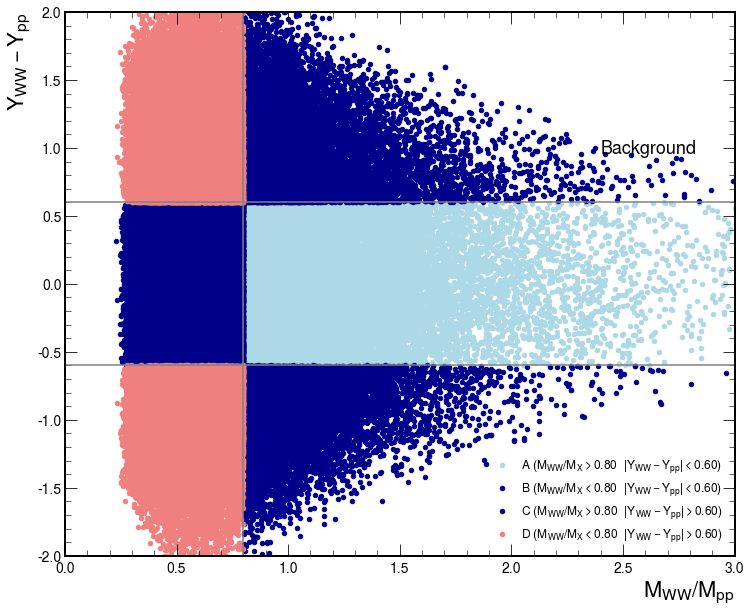

In [117]:
res_ = plot_regions_background( df_protons_multiRP_bkg_events_nTracks40 )
n_events_bkg_A_nTracks40, err_n_events_bkg_A_nTracks40 = res_[ 0 ]
n_events_bkg_B_nTracks40, err_n_events_bkg_B_nTracks40 = res_[ 1 ]
n_events_bkg_C_nTracks40, err_n_events_bkg_C_nTracks40 = res_[ 2 ]
n_events_bkg_D_nTracks40, err_n_events_bkg_D_nTracks40 = res_[ 3 ]

Number of events: 26.659999999999997 +/- 0.7302054505411475
Number of events (A): 5.6 +/- 0.33466401061363027
Number of events (B): 7.699999999999999 +/- 0.3924283374069717
Number of events (C): 3.6399999999999997 +/- 0.26981475126464083
Number of events (D): 9.719999999999999 +/- 0.4409081537009721


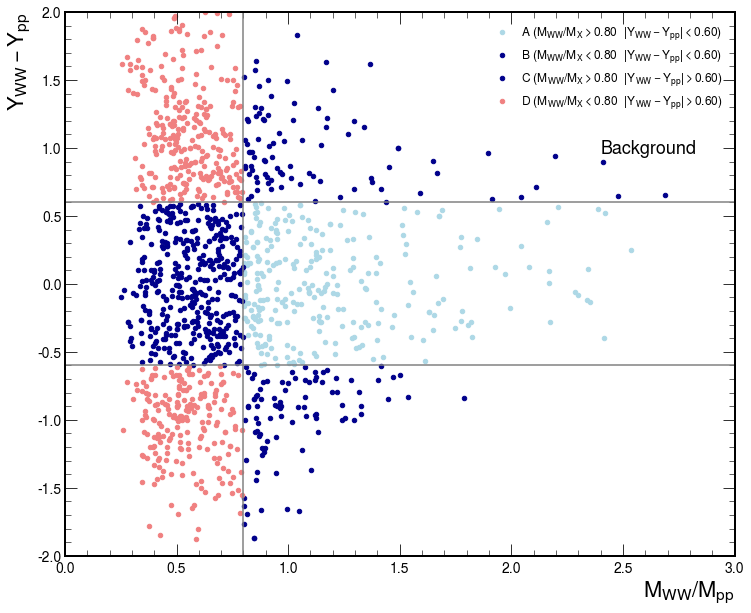

In [118]:
res_ = plot_regions_background( df_protons_multiRP_bkg_events )
n_events_bkg_A, err_n_events_bkg_A = res_[ 0 ]
n_events_bkg_B, err_n_events_bkg_B = res_[ 1 ]
n_events_bkg_C, err_n_events_bkg_C = res_[ 2 ]
n_events_bkg_D, err_n_events_bkg_D = res_[ 3 ]

### Data

In [119]:
# label_data = ""
# if lepton_type == 'muon':
#     label_data = "data-single-arm"
# elif lepton_type == 'electron':
#     label_data = "data-single-arm-electron"

labels_data = []
fileNames_data = {}
if data_sample == '2017':
    if lepton_type == 'muon':
        labels_data = [ "data-single-arm" ]
        fileNames_data = {
            "data-single-arm": "data-store-data-single-arm.h5"
        }
    elif lepton_type == 'electron':
        labels_data = [ "data-single-arm-electron" ]
        fileNames_data = {
            "data-single-arm-electron": "data-store-data-single-arm-electron.h5"
        }
elif data_sample == '2018':
    if lepton_type == 'muon':
        labels_data = [
            "data-2018-muon-2018A",
            "data-2018-muon-2018B",
            "data-2018-muon-2018C",
            "data-2018-muon-2018D"
        ]
        fileNames_data = {
            "data-2018-muon-2018A": "data-store-data-2018-muon-2018A.h5",
            "data-2018-muon-2018B": "data-store-data-2018-muon-2018B.h5",
            "data-2018-muon-2018C": "data-store-data-2018-muon-2018C.h5",
            "data-2018-muon-2018D": "data-store-data-2018-muon-2018D.h5"
        }
    elif lepton_type == 'electron':
        labels_data = [
            "data-2018-electron-2018A",
            "data-2018-electron-2018B",
            "data-2018-electron-2018C",
            "data-2018-electron-2018D"
        ]
        fileNames_data = {
            "data-2018-electron-2018A": "data-store-data-2018-electron-2018A.h5",
            "data-2018-electron-2018B": "data-store-data-2018-electron-2018B.h5",
            "data-2018-electron-2018C": "data-store-data-2018-electron-2018C.h5",
            "data-2018-electron-2018D": "data-store-data-2018-electron-2018D.h5"
        }

# base_path_ = 'output'
base_path_ = 'output-final'
#base_path_ = 'output_new'
# file_path_ = "{}/data-store-{}.h5".format( base_path_, label_data )
for label_ in fileNames_data:
    fileNames_data[ label_ ] = "{}/{}".format( base_path_, fileNames_data[ label_ ] )
print ( fileNames_data )

# df_counts_data = None
# # df_protons_multiRP_data_index = None
# df_protons_multiRP_data_events = None
# with pd.HDFStore( file_path_, 'r' ) as store_:
#     print ( list( store_ ) )
#     df_counts_data = store_[ "counts" ]
# #     df_protons_multiRP_data_index = store_[ "protons_multiRP" ]
#     df_protons_multiRP_data_events = store_[ "events_multiRP" ]

df_counts_data = None
df_protons_multiRP_data_index = None
df_protons_multiRP_data_events = None

df_counts_data_list_ = []
df_protons_multiRP_data_index_list_ = []
df_protons_multiRP_data_events_list_ = []
for label_ in labels_data:
    print ( label_ )
    file_path_ = fileNames_data[ label_ ]
    print ( file_path_ )
    with pd.HDFStore( file_path_, 'r' ) as store_:
        print ( list( store_ ) )
        
        df_counts_data__ = store_[ "counts" ]
        df_protons_multiRP_data_index__  = store_[ "protons_multiRP" ]
        df_protons_multiRP_data_events__ = store_[ "events_multiRP" ]
        jet0_tau21_, rhoprime1_, jet0_tau21_ddt_ = tau21_ddt_calculation( df_protons_multiRP_data_events__, lepton_type )
        df_protons_multiRP_data_events__["jet0_tau21"] = jet0_tau21_
        df_protons_multiRP_data_events__["jet0_tau21_ddt"] = jet0_tau21_ddt_
#         M_ = -0.055114753311384504
#         df_protons_multiRP_data_events__["jet0_tau21_ddt"] = ( df_protons_multiRP_data_events__.loc[ :, "jet0_tau2"] / df_protons_multiRP_data_events__.loc[ :, "jet0_tau1"] ) - (M_*(np.log((((df_protons_multiRP_data_events__.loc[ :, "jet0_corrmass" + "_nom"])**2)/(df_protons_multiRP_data_events__.loc[ :, "jet0_pt" + "_nom"])))))          
        df_counts_data_list_.append( df_counts_data__ )
        df_protons_multiRP_data_index_list_.append( df_protons_multiRP_data_index__ )
        df_protons_multiRP_data_events_list_.append( df_protons_multiRP_data_events__ )

df_counts_data = df_counts_data_list_[0]
for idx_ in range( 1, len( df_counts_data_list_ ) ):
    df_counts_data = df_counts_data.add( df_counts_data_list_[ idx_ ] )

df_protons_multiRP_data_index = pd.concat( df_protons_multiRP_data_index_list_ )
df_protons_multiRP_data_events = pd.concat( df_protons_multiRP_data_events_list_ )

{'data-2018-electron-2018A': 'output-final/data-store-data-2018-electron-2018A.h5', 'data-2018-electron-2018B': 'output-final/data-store-data-2018-electron-2018B.h5', 'data-2018-electron-2018C': 'output-final/data-store-data-2018-electron-2018C.h5', 'data-2018-electron-2018D': 'output-final/data-store-data-2018-electron-2018D.h5'}
data-2018-electron-2018A
output-final/data-store-data-2018-electron-2018A.h5
['/counts', '/events_multiRP', '/protons_multiRP']
data-2018-electron-2018B
output-final/data-store-data-2018-electron-2018B.h5
['/counts', '/events_multiRP', '/protons_multiRP']
data-2018-electron-2018C
output-final/data-store-data-2018-electron-2018C.h5
['/counts', '/events_multiRP', '/protons_multiRP']
data-2018-electron-2018D
output-final/data-store-data-2018-electron-2018D.h5
['/counts', '/events_multiRP', '/protons_multiRP']


/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [120]:
list(df_protons_multiRP_data_events.columns)

['crossingAngle',
 'betaStar',
 'instLumi',
 'jet0_pt',
 'jet0_eta',
 'jet0_phi',
 'jet0_energy',
 'jet0_mass',
 'jet0_corrmass',
 'jet0_tau1',
 'jet0_tau2',
 'jet0_vertexz',
 'jet0_px',
 'jet0_py',
 'jet0_pz',
 'calo_met',
 'met',
 'met_x',
 'met_y',
 'met_phi',
 'nVertices',
 'num_bjets_ak8',
 'num_bjets_ak4',
 'num_jets_ak4',
 'pfcand_nextracks',
 'pfcand_nextracks_noDRl',
 'recoMWhad',
 'recoMWlep',
 'recoMWlep_metJER_Up',
 'recoMWlep_metJER_Down',
 'recoMWlep_metJES_Up',
 'recoMWlep_metJES_Down',
 'recoMWW',
 'recoMWW_metJER_Up',
 'recoMWW_metJER_Down',
 'recoMWW_metJES_Up',
 'recoMWW_metJES_Down',
 'recoRapidityWW',
 'dphiWW',
 'WLeptonicPt',
 'WLeptonicPt_metJER_Up',
 'WLeptonicPt_metJER_Down',
 'WLeptonicPt_metJES_Up',
 'WLeptonicPt_metJES_Down',
 'WLeptonicEta',
 'WLeptonicPhi',
 'electron0_pt',
 'electron0_eta',
 'electron0_phi',
 'electron0_energy',
 'electron0_charge',
 'electron0_dxy',
 'electron0_dz',
 'electron0_corr',
 'electron0_ecalTrkEnPostCorr',
 'electron0_ecalTrkE

In [121]:
df_counts_data

All                  2086971
Jet                  2086971
Electron             2034017
Proton_check_none    2034017
Proton               1473745
dtype: int64

In [122]:
df_protons_multiRP_data_events

crossingAngle  betaStar   instLumi     jet0_pt  jet0_eta  jet0_phi  jet0_energy  jet0_mass  jet0_corrmass  jet0_tau1  jet0_tau2  jet0_vertexz     jet0_px     jet0_py     jet0_pz    calo_met         met      met_x      met_y   met_phi  nVertices  num_bjets_ak8  num_bjets_ak4  num_jets_ak4  pfcand_nextracks  pfcand_nextracks_noDRl  recoMWhad   recoMWlep  recoMWlep_metJER_Up  recoMWlep_metJER_Down  recoMWlep_metJES_Up  recoMWlep_metJES_Down     recoMWW  recoMWW_metJER_Up  recoMWW_metJER_Down  recoMWW_metJES_Up  recoMWW_metJES_Down  recoRapidityWW    dphiWW  WLeptonicPt  WLeptonicPt_metJER_Up  WLeptonicPt_metJER_Down  WLeptonicPt_metJES_Up  WLeptonicPt_metJES_Down  WLeptonicEta  WLeptonicPhi  electron0_pt  electron0_eta  electron0_phi  electron0_energy  electron0_charge  electron0_dxy  electron0_dz  electron0_corr  electron0_ecalTrkEnPostCorr  electron0_ecalTrkEnErrPostCorr  electron0_ecalTrkEnPreCorr  electron0_energyScaleValue  electron0_energyScaleUp  \
run    lumiblock event     slice                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
315361 546       454245536 0              150.0       0.3   7.586127  224.082245 -1.913470  2.076695   779.045166  51.458626      58.253654   0.203878   0.166427           0.0 -108.588936  196.013504 -742.719849   53.962772   53.962780  45.931141 -28.325109 -0.552598         34              0              0             0                34                      34  71.173401   80.379944            80.379959              80.379959            82.878502              77.687706  442.104004         442.104034           442.104034         447.401489           436.717682       -1.546139  3.089020   164.789551             164.789551               164.789551             167.938141               161.751709     -1.138246     -1.117469    122.659431      -1.334511      -1.362556        246.640121                 1       0.001585      0.000942        1.008742                   246.640121                        3.086234                  244.502563                    1.008742               246.763443   
                 454284384 0              150.0       0.3   7.586127  236.852982  1.349874  1.890733   494.408386  40.106876      46.073044   0.262300   0.235553           0.0  -74.491882  224.833923  426.058807   19.532099   19.698719   6.815194  18.482225  1.214383         52              0              1             3                51                      52  82.548225  131.782486           131.804382             131.804382           129.430588             135.436981  932.434387         932.417603           932.417603         932.949219           932.414124        0.065208 -3.119180   208.053024             208.053024               208.053024             208.329330               207.505157     -1.185192     -1.228446    223.531586      -1.238390      -1.289596        416.327332                 1       0.000357      0.001863        0.998491                   416.327332                        3.749274                  416.956573                    0.998491               418.408966   
315689 934       958763264 0  

### Select events

In [123]:
print ( df_protons_multiRP_data_events.shape[0] )
df_protons_multiRP_data_events_nTracks40, selection_keys_, selections_ = select_events( df_protons_multiRP_data_events, lepton_type, max_num_tracks=40 )
print ( df_protons_multiRP_data_events_nTracks40.shape[0] )
print ( selection_keys_ )
print ( selections_ )
df_protons_multiRP_data_events__, selection_keys_, selections_ = select_events( df_protons_multiRP_data_events, lepton_type )
df_protons_multiRP_data_events = df_protons_multiRP_data_events__
print ( df_protons_multiRP_data_events.shape[0] )
print ( selection_keys_ )
print ( selections_ )
df_protons_multiRP_data_index__, selection_keys_, selections_ = select_events( df_protons_multiRP_data_index, lepton_type )
df_protons_multiRP_data_index = df_protons_multiRP_data_index__
print ( df_protons_multiRP_data_index.shape[0] )
print ( selection_keys_ )
print ( selections_ )

409787


/cvmfs/sft.cern.ch/lcg/views/LCG_104a_swan/x86_64-centos7-gcc11-opt/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


3515
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 409787, 'Electron': 409578, 'Jet': 293597, 'Jet_Electron': 290154, 'MET': 98068, 'Jet_MET': 95220, 'PrunedMass': 26590, 'Tau21': 12919, 'BJet_Veto': 10431, 'Xi_CMS': 8852, 'WLeptonic': 7449, 'Jet_WLeptonic': 7289, 'MWW': 6978, 'ExtraTracks': 3575, 'NProtons': 3515}
28
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CMS', 'WLeptonic', 'Jet_WLeptonic', 'MWW', 'ExtraTracks', 'NProtons']
{'All': 409787, 'Electron': 409578, 'Jet': 293597, 'Jet_Electron': 290154, 'MET': 98068, 'Jet_MET': 95220, 'PrunedMass': 26590, 'Tau21': 12919, 'BJet_Veto': 10431, 'Xi_CMS': 8852, 'WLeptonic': 7449, 'Jet_WLeptonic': 7289, 'MWW': 6978, 'ExtraTracks': 30, 'NProtons': 28}
56
['All', 'Electron', 'Jet', 'Jet_Electron', 'MET', 'Jet_MET', 'PrunedMass', 'Tau21', 'BJet_Veto', 'Xi_CM

In [124]:
def plot_data_bkg( plot_var, df_data, df_bkg, bins, range, xlabel ):

    plot_var__ = plot_var
    df_data__ = df_data
    df_bkg__ = df_bkg
    bins__ = bins
    range__ = range
    xlabel__ = xlabel
    
    fig = plt.figure( figsize=(12,10) )
    
    plt.hist( df_data__[ plot_var__ ], histtype='step', range=range__, bins=bins__, label=r"Data" )
    plt.hist( df_bkg__[ plot_var__ ], weights=df_bkg__["norm"], histtype='step', range=range__, bins=bins__, label=r"Bkg" )
    
#     counts_bins_data_, bin_edges_data_ = np.histogram( df_protons_multiRP_data_events[ plot_var__ ], range=range__, bins=bins__ )
#     counts_bins_bkg_, bin_edges_bkg_ = np.histogram( df_protons_multiRP_bkg_events[ plot_var__ ], weights=df_protons_multiRP_bkg_events["norm"], range=range__, bins=bins__ )

#     errors_bins_data_ = np.sqrt( counts_bins_data_ )
#     errors_bins_bkg_ = np.sqrt( counts_bins_bkg_ )

#     bin_centres_data_ = ( bin_edges_data_[:-1] + bin_edges_data_[1:] ) / 2.
#     bin_centres_bkg_ = ( bin_edges_bkg_[:-1] + bin_edges_bkg_[1:] ) / 2.

#     plt.errorbar( bin_centres_data_, counts_bins_data_, yerr=errors_bins_data_, fmt='o', color='black', label=r"Data" )
#     plt.errorbar( bin_centres_bkg_, counts_bins_bkg_, yerr=errors_bins_bkg_, fmt='o', color='red', label=r"Bkg" )
        
    plt.xlabel( xlabel__, fontsize=18 )
    plt.ylabel( "Events", fontsize=18 )
    plt.legend( loc='best', fontsize=14 )

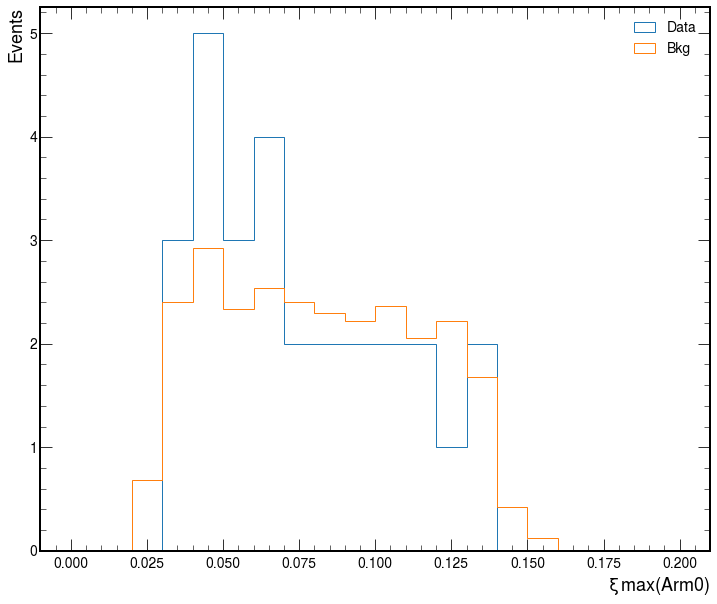

In [125]:
plot_var__ = 'xi_max_arm0'
df_data__ = df_protons_multiRP_data_events
df_bkg__ = df_protons_multiRP_bkg_events
range_ = (0., 0.2) 
bins_ = 20
xlabel_ = r"$ \xi \,\rm{max (Arm 0)} $"
plot_data_bkg( plot_var=plot_var__, df_data=df_data__, df_bkg=df_bkg__, bins=bins_, range=range_, xlabel=xlabel_ )

if save_figures:
    if lepton_type == "muon":
        plt.savefig( "plots/xi_max_arm0_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/xi_max_arm0_muon_2018.png", bbox_inches='tight' )
    if lepton_type == "electron":
        plt.savefig( "plots/xi_max_arm0_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/xi_max_arm0_muon_2018.png", bbox_inches='tight' )

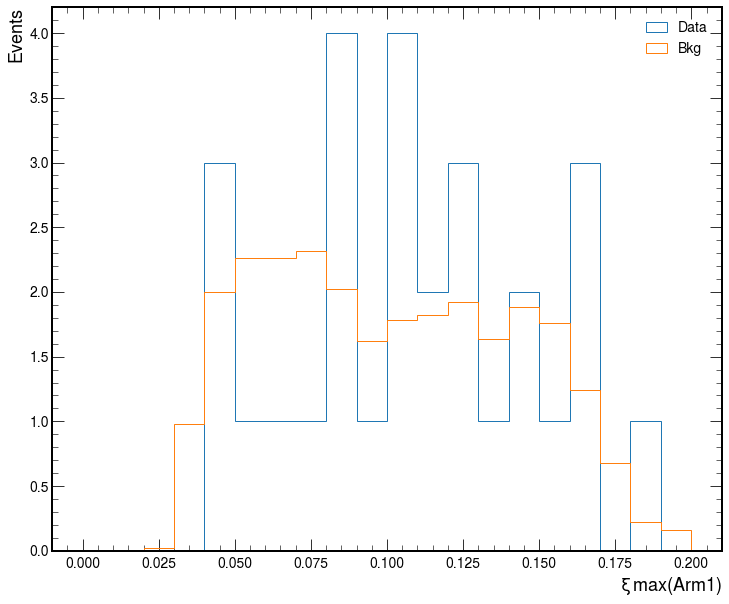

In [126]:
plot_var__ = 'xi_max_arm1'
df_data__ = df_protons_multiRP_data_events
df_bkg__ = df_protons_multiRP_bkg_events
range_ = (0., 0.2) 
bins_ = 20
xlabel_ = r"$ \xi \,\rm{max (Arm 1)} $"
plot_data_bkg( plot_var=plot_var__, df_data=df_data__, df_bkg=df_bkg__, bins=bins_, range=range_, xlabel=xlabel_ )

if save_figures:
    if lepton_type == "muon":
        plt.savefig( "plots/xi_max_arm1_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/xi_max_arm1_muon_2018.png", bbox_inches='tight' )
    if lepton_type == "electron":
        plt.savefig( "plots/xi_max_arm1_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/xi_max_arm1_muon_2018.png", bbox_inches='tight' )

In [127]:
msk_xi_max = ((df_protons_multiRP_data_events['xi_max_arm1'] >= 0.11) & (df_protons_multiRP_data_events['xi_max_arm1'] <= 0.15))
df_protons_multiRP_data_events['xi_max_arm1'][msk_xi_max]

run     lumiblock  event      slice
317641  408        604959680  0        0.141491
317661  527        765155584  0        0.122004
317696  578        856859904  0        0.110792
319991  499        750084928  0        0.138292
321149  368        530345952  0        0.146278
321933  75         69075184   0        0.124808
325170  373        691877568  0        0.126940
324791  425        782168768  0        0.110551
Name: xi_max_arm1, dtype: float32

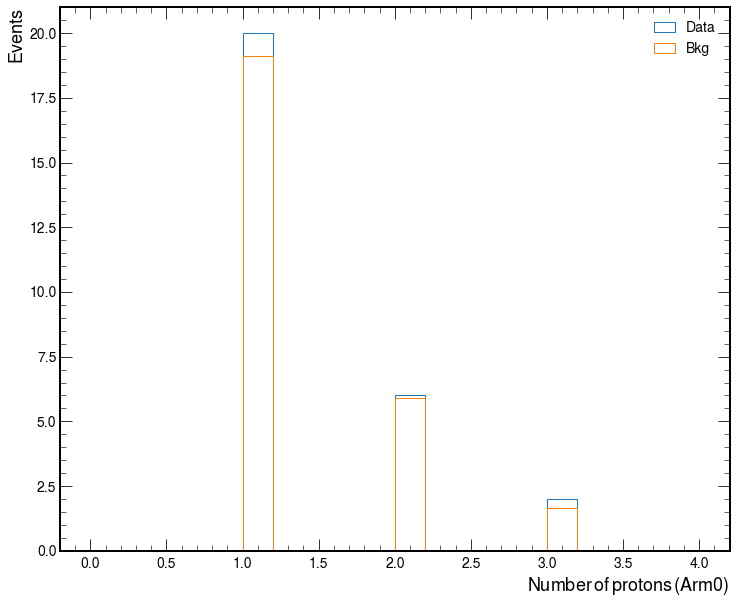

In [128]:
plot_var__ = 'nprotons_arm0'
df_data__ = df_protons_multiRP_data_events
df_bkg__ = df_protons_multiRP_bkg_events
range_ = (0., 4.) 
bins_ = 20
xlabel_ = r"$ \rm{Number \, of \, protons \, (Arm0)} $"
plot_data_bkg( plot_var=plot_var__, df_data=df_data__, df_bkg=df_bkg__, bins=bins_, range=range_, xlabel=xlabel_ )

if save_figures:
    if lepton_type == "muon":
        plt.savefig( "plots/nprotons_arm0_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/nprotons_arm0_muon_2018.png", bbox_inches='tight' )
    if lepton_type == "electron":
        plt.savefig( "plots/nprotons_arm0_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/nprotons_arm0_muon_2018.png", bbox_inches='tight' )

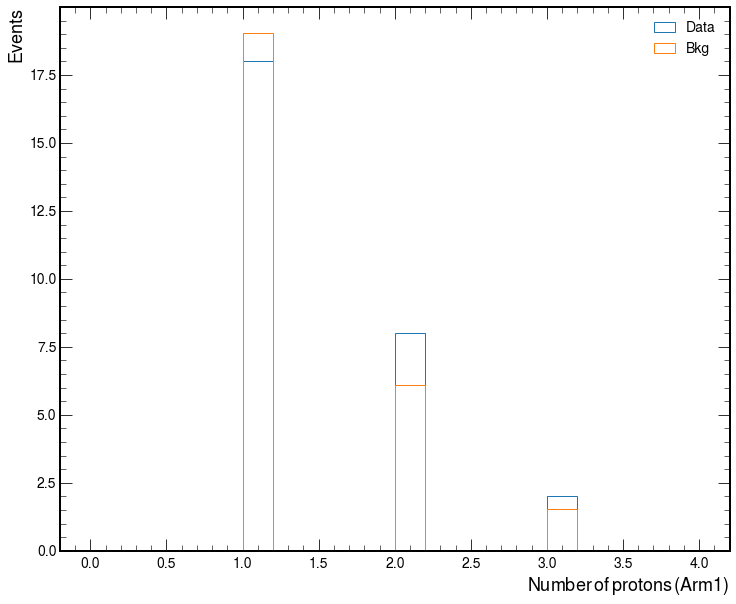

In [129]:
plot_var__ = 'nprotons_arm1'
df_data__ = df_protons_multiRP_data_events
df_bkg__ = df_protons_multiRP_bkg_events
range_ = (0., 4.) 
bins_ = 20
xlabel_ = r"$ \rm{Number \, of \, protons \, (Arm1)} $"
plot_data_bkg( plot_var=plot_var__, df_data=df_data__, df_bkg=df_bkg__, bins=bins_, range=range_, xlabel=xlabel_ )

if save_figures:
    if lepton_type == "muon":
        plt.savefig( "plots/nprotons_arm1_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/nprotons_arm1_muon_2018.png", bbox_inches='tight' )
    if lepton_type == "electron":
        plt.savefig( "plots/nprotons_arm1_muon_2018.pdf", bbox_inches='tight' )
        plt.savefig( "plots/nprotons_arm1_muon_2018.png", bbox_inches='tight' )

In [130]:
# plot_var__ = 'xi_nom'
# df_data__ = df_protons_multiRP_data_index
# df_bkg__ = df_protons_multiRP_bkg_index
# range_ = (0., 0.2) 
# bins_ = 20
# xlabel_ = r"$ \xi $"
# plot_data_bkg( plot_var=plot_var__, df_data=df_data__, df_bkg=df_bkg__, bins=bins_, range=range_, xlabel=xlabel_ )

# if save_figures:
#     if lepton_type == "muon":
#         plt.savefig( "plots/xi_nom_muon_2018.pdf", bbox_inches='tight' )
#         plt.savefig( "plots/xi_nom_muon_2018.png", bbox_inches='tight' )
#     if lepton_type == "electron":
#         plt.savefig( "plots/xi_nom_muon_2018.pdf", bbox_inches='tight' )
#         plt.savefig( "plots/xi_nom_muon_2018.png", bbox_inches='tight' )

In [131]:
def plot_regions_data( df_protons_multiRP_data_events ):
    df__ = df_protons_multiRP_data_events
    var1__ = ( "R_MWW_MX" + "_nom" )
    var2__ = ( "Diff_YWW_YX" + "_nom" )

    msk_data_cut1 = ( df__[ var1__ ] >= 0.80  )
    msk_data_cut2 = ( np.abs( df__[ var2__ ] ) <= 0.60 )
    # msk_data_A =  msk_data_cut1 &  msk_data_cut2
    msk_data_B = ~msk_data_cut1 &  msk_data_cut2
    msk_data_C =  msk_data_cut1 & ~msk_data_cut2
    msk_data_D = ~msk_data_cut1 & ~msk_data_cut2

    # n_events_data = df__.shape[0]
    # n_events_data_A = df__[ msk_data_A ].shape[0]
    n_events_data_B = df__[ msk_data_B ].shape[0]
    n_events_data_C = df__[ msk_data_C ].shape[0]
    n_events_data_D = df__[ msk_data_D ].shape[0]

    # print ( "Number of events: {} - Ratio: {}".format( n_events_data, ( n_events_data / ( n_events_bkg ) ) ) )
    # print ( "Number of events (A): {} - Ratio: {}".format( n_events_data_A, ( n_events_data_A / ( n_events_bkg_A ) ) ) )
    # print ( "Number of events (B): {} - Ratio: {}".format( n_events_data_B, ( n_events_data_B / ( n_events_bkg_B ) ) ) )
    # print ( "Number of events (C): {} - Ratio: {}".format( n_events_data_C, ( n_events_data_C / ( n_events_bkg_C ) ) ) )
    # print ( "Number of events (D): {} - Ratio: {}".format( n_events_data_D, ( n_events_data_D / ( n_events_bkg_D ) ) ) )
    print ( "Number of events (B): {}".format( n_events_data_B ) )
    print ( "Number of events (C): {}".format( n_events_data_C ) )
    print ( "Number of events (D): {}".format( n_events_data_D ) )

    x_min =  0.
    x_max =  3.0
    y_min = -2.0
    y_max =  2.0
    x_cut = 0.80
    y_cut = 0.60

    fig = plt.figure( figsize=(12,10) )
    plt.plot( (x_min,x_max), (-y_cut,-y_cut), color='gray' )
    plt.plot( (x_min,x_max), (y_cut,y_cut), color='gray' )
    plt.plot( (x_cut,x_cut), (y_min,y_max), color='gray' )
    ax = plt.gca()
    # label_str_ = "A (Data/Background: {:.2f})".format( ( n_events_data_A / ( n_events_bkg_A ) ) )
    # label_str_ = r"{}".format( label_str_ )
    # df__[ msk_data_A ].plot( var1__, var2__, 'scatter', ax=ax, color='lightblue', label=label_str_ )
    # label_str_ = "B (Data/Background: {:.2f})".format( ( n_events_data_B / ( n_events_bkg_B ) ) )
    label_str_ = "B (Data)"
    label_str_ = r"{}".format( label_str_ )
    df__[ msk_data_B ].plot( var1__, var2__, 'scatter', ax=ax, color='darkblue', label=label_str_ )
    # label_str_ = "C (Data/Background: {:.2f})".format( ( n_events_data_C / ( n_events_bkg_C ) ) )
    label_str_ = "C (Data)"
    label_str_ = r"{}".format( label_str_ )
    df__[ msk_data_C ].plot( var1__, var2__, 'scatter', ax=ax, color='darkblue', label=label_str_ )
    # label_str_ = "D (Data/Background: {:.2f})".format( ( n_events_data_D / ( n_events_bkg_D ) ) )
    label_str_ = "D (Data)"
    label_str_ = r"{}".format( label_str_ )
    df__[ msk_data_D ].plot( var1__, var2__, 'scatter', ax=ax, color='lightcoral', label=label_str_ )
    plt.legend( loc='best', fontsize=16 )
    # leg_ = plt.legend( loc='best', fontsize=16 )
    # leg_.set_title( title_str_, prop={'size': 16} )
    # leg_._legend_box.align = "right"
    ax.text( 0.85, 0.75, "Data", horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontsize=18 )
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.xlabel( r"$M_{WW} / M_{pp}$", fontsize=22 )
    plt.ylabel( r"$Y_{WW} - Y_{pp}$", fontsize=22 )
    
    return ( n_events_data_B, n_events_data_C, n_events_data_D )

Number of events (B): 1226
Number of events (C): 421
Number of events (D): 1273


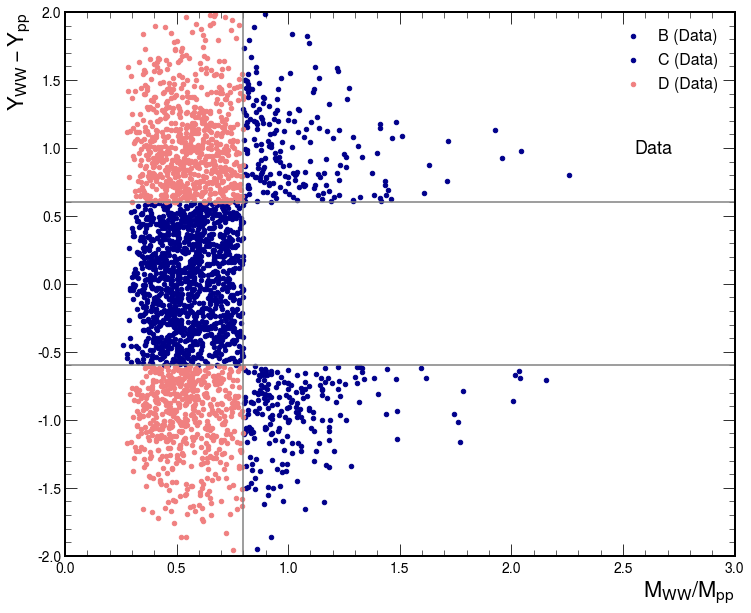

In [132]:
res_ = plot_regions_data( df_protons_multiRP_data_events_nTracks40 )
n_events_data_B_nTracks40 = res_[ 0 ]
n_events_data_C_nTracks40 = res_[ 1 ]
n_events_data_D_nTracks40 = res_[ 2 ]

Number of events (B): 12
Number of events (C): 6
Number of events (D): 7


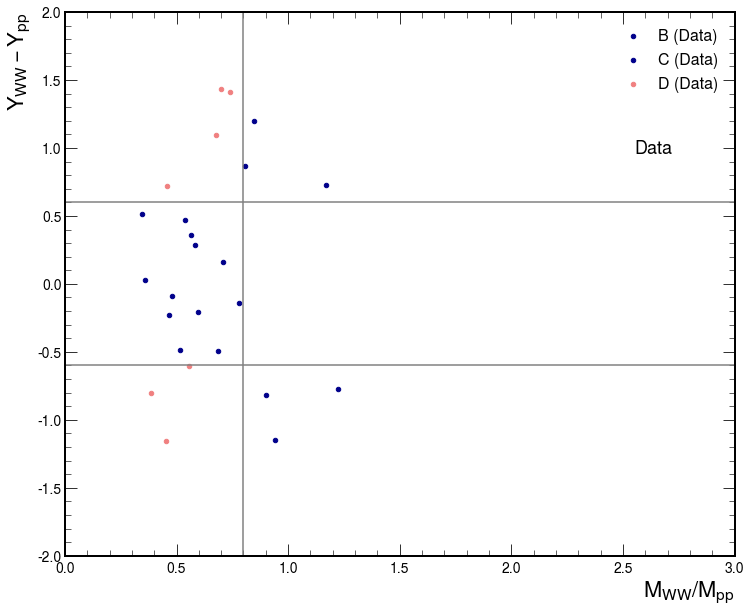

In [133]:
res_ = plot_regions_data( df_protons_multiRP_data_events )
n_events_data_B = res_[ 0 ]
n_events_data_C = res_[ 1 ]
n_events_data_D = res_[ 2 ]

In [134]:
ratio_ = ( n_events_data_B_nTracks40 / n_events_bkg_B_nTracks40 )
err_ratio_ = ratio_ * np.sqrt( ( 1. / n_events_data_B_nTracks40 ) + ( err_n_events_bkg_B_nTracks40 / n_events_bkg_B_nTracks40 ) ** 2 )
print ( ratio_, err_ratio_ )
ratio_ = ( n_events_data_C_nTracks40 / n_events_bkg_C_nTracks40 )
err_ratio_ = ratio_ * np.sqrt( ( 1. / n_events_data_C_nTracks40 ) + ( err_n_events_bkg_C_nTracks40 / n_events_bkg_C_nTracks40 ) ** 2 )
print ( ratio_, err_ratio_ )
ratio_ = ( n_events_data_D_nTracks40 / n_events_bkg_D_nTracks40 )
err_ratio_ = ratio_ * np.sqrt( ( 1. / n_events_data_D_nTracks40 ) + ( err_n_events_bkg_D_nTracks40 / n_events_bkg_D_nTracks40 ) ** 2 )
print ( ratio_, err_ratio_ )

0.9904989658738365 0.028567248989445758
0.9543888284367066 0.04695589203664267
1.0144557958656741 0.028719743232216356


In [135]:
n_events_data_B_D_nTracks40 = ( n_events_data_B_nTracks40 + n_events_data_D_nTracks40 )
# err_n_events_data_B_D_nTracks40 = np.sqrt( n_events_data_B_D_nTracks40 )
n_events_bkg_B_D_nTracks40 = ( n_events_bkg_B_nTracks40 + n_events_bkg_D_nTracks40 )
err_n_events_bkg_B_D_nTracks40 = np.sqrt( err_n_events_bkg_B_nTracks40 ** 2 + err_n_events_bkg_D_nTracks40 ** 2 )
ratio_ = ( n_events_data_B_D_nTracks40 / n_events_bkg_B_D_nTracks40 )
err_ratio_ = ratio_ * np.sqrt( ( 1. / n_events_data_B_D_nTracks40 ) + ( err_n_events_bkg_B_D_nTracks40 / n_events_bkg_B_D_nTracks40 ) ** 2 )
print ( ratio_, err_ratio_ )

1.0025595558087472 0.020255269987528194


In [136]:
# labels_signals[4:1:-1]

GGToWW-AQGC-2018-electron-A0W5e-6
R_MWW_MX
0      0.168839
1      0.171611
2      0.174403
3      0.177210
4      0.180028
         ...   
195    0.167440
196    0.174442
197    0.181800
198    0.189536
199    0.197669
Length: 200, dtype: float64 0.1917614327540518
0     -0.246196
1     -0.236532
2     -0.227215
3     -0.218252
4     -0.209652
         ...   
195   -0.144549
196   -0.147394
197   -0.150411
198   -0.153609
199   -0.156997
Length: 200, dtype: float64 -0.17563960622481725
Diff_YWW_YX
0      0.075107
1      0.074245
2      0.073427
3      0.072650
4      0.071911
         ...   
195    0.051651
196    0.051709
197    0.051770
198    0.051833
199    0.051899
Length: 200, dtype: float64 0.0548426561762305
0     -0.069714
1     -0.069114
2     -0.068545
3     -0.068005
4     -0.067492
         ...   
195   -0.055086
196   -0.055159
197   -0.055235
198   -0.055314
199   -0.055396
Length: 200, dtype: float64 -0.05611234859940795
GGToWW-AQGC-2018-electron-A0W2e-6
R_MWW_MX
0     

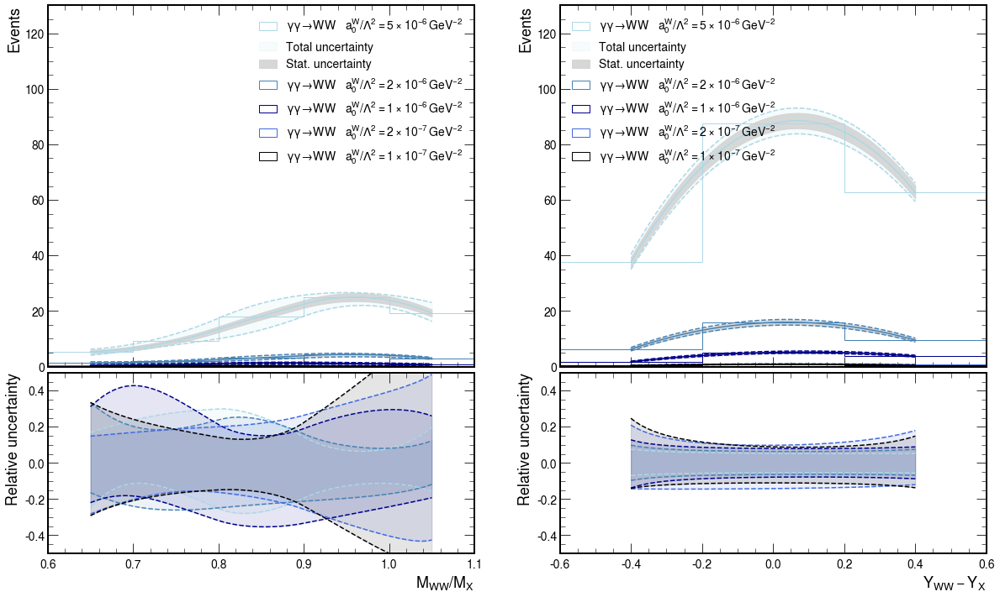

In [137]:
relative_uncertainty_ = True

# ylim_ = (0.,5.)
# ylim_ = (0.,3.)
# ylim_ = (0.,0.60)
ylim_ = (0.,130.)
ylim_ratio_ = (-0.50,0.50)

yscale_=None
# yscale_='log'

colors = [ "lightblue", "steelblue", "darkblue", "royalblue", "black" ]

# fig, axes = plt.subplots( 2, 2, figsize=(2*10,2*8) )
fig, axes_ = plt.subplots( 1, 2, figsize=( 2*10,( 1.5*8 ) ) )

class Obj2D:
    def __init__( self ):
        self.obj_ = [ [], [] ]
    def __getitem__( self, idx ):
        if isinstance( idx, tuple ): return self.obj_[ idx[0] ][ idx[1] ]
        else : return self.obj_[ idx ]

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider0_ = make_axes_locatable( axes_[ 0 ] )
divider1_ = make_axes_locatable( axes_[ 1 ] )
axes = Obj2D()
axes.obj_[0].append( axes_[ 0 ] )
axes.obj_[0].append( axes_[ 1 ] )
axes.obj_[1].append( divider0_.append_axes( "bottom", size="50%", pad=0.10 ) )
axes.obj_[1].append( divider1_.append_axes( "bottom", size="50%", pad=0.10 ) )

def plot_signal_a0w( axes ):
    for idx_label_, label_ in enumerate( labels_signals[4::-1] ):
#     for idx_label_, label_ in enumerate( labels_signals[4:1:-1] ):
        print ( label_ )
        color_ = colors[ idx_label_ ]

        spline_nom_ = {}
        spline_max_ = {}
        spline_min_ = {}
        spline_max_err_ = {}
        spline_min_err_ = {}
        spline_nom_arr_ = {}
        spline_max_arr_ = {}
        spline_min_arr_ = {}
        spline_max_err_arr_ = {}
        spline_min_err_arr_ = {}

        idx_row_ = 0
        idx_col_ = 0
        for var__ in vars_:
            print ( var__ )
            idx_row_ = 0
            counts_ = counts[ label_ ][ var__ ]
            err_ = err[ label_ ][ var__ ]
            bins_ = bins[ label_ ][ var__ ]
            __max_err__ = ( counts_ + err_ )
            __min_err__ = ( counts_ - err_ )
            __max__ = max_variations_total[ label_ ][ var__ ]
            __min__ = min_variations_total[ label_ ][ var__ ]

            bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

            axes[idx_row_,idx_col_].hist( bin_centers_, weights=counts_,
                                          histtype='step', color=color_, linestyle="-", label=labels_samples[ label_ ],
                                          bins=bins_ )

            spline_nom_[ var__ ] = make_interp_spline( bin_centers_, counts_, k=2 )
            spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
            spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
            spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
            spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
            x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
            spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
            spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
            spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
            spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
            spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

            axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
            axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
            __label_0 = None
            __label_1 = None
            if idx_label_ == 0:
                __label_0 = "Total uncertainty"
                __label_1 = "Stat. uncertainty"
            axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10, label=__label_0 )
            axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90, label=__label_1 )
            axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
            axes[idx_row_,idx_col_].set_ylim( ylim_ )
    #         axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
            axes[idx_row_,idx_col_].get_xaxis().set_ticklabels( [] )
            axes[idx_row_,idx_col_].set_ylabel( "Events", fontsize=18 )
            if yscale_:
                axes[idx_row_,idx_col_].set_ylim( bottom=0.01 )
                axes[idx_row_,idx_col_].set_yscale( yscale_ )
            axes[idx_row_,idx_col_].legend( loc='best', fontsize=14 )

            idx_row_ = 1
            if relative_uncertainty_:
                ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
                ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
                ratio_max_sel_ = pd.Series( ratio_max_ )
                ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
                ratio_min_sel_ = pd.Series( ratio_min_ )
                ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
                print ( ratio_max_sel_, ratio_max_sel_.mean() )
                print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
                axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
                axes[idx_row_,idx_col_].set_ylabel( "Relative uncertainty", fontsize=18 )
            else:
                diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
                diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
                axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
                axes[idx_row_,idx_col_].set_ylabel( "Uncertainty", fontsize=18 )
        #     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
            axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
            axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
            axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
            idx_col_ += 1

plot_signal_a0w( axes=axes )

if save_figures:
    if lepton_type == 'muon':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Muon_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electroElectron':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Electron_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-A0W5e-6
R_MWW_MX
0      0.168839
1      0.171611
2      0.174403
3      0.177210
4      0.180028
         ...   
195    0.167440
196    0.174442
197    0.181800
198    0.189536
199    0.197669
Length: 200, dtype: float64 0.1917614327540518
0     -0.246196
1     -0.236532
2     -0.227215
3     -0.218252
4     -0.209652
         ...   
195   -0.144549
196   -0.147394
197   -0.150411
198   -0.153609
199   -0.156997
Length: 200, dtype: float64 -0.17563960622481725
Diff_YWW_YX
0      0.075107
1      0.074245
2      0.073427
3      0.072650
4      0.071911
         ...   
195    0.051651
196    0.051709
197    0.051770
198    0.051833
199    0.051899
Length: 200, dtype: float64 0.0548426561762305
0     -0.069714
1     -0.069114
2     -0.068545
3     -0.068005
4     -0.067492
         ...   
195   -0.055086
196   -0.055159
197   -0.055235
198   -0.055314
199   -0.055396
Length: 200, dtype: float64 -0.05611234859940795
GGToWW-AQGC-2018-electron-A0W2e-6
R_MWW_MX
0     

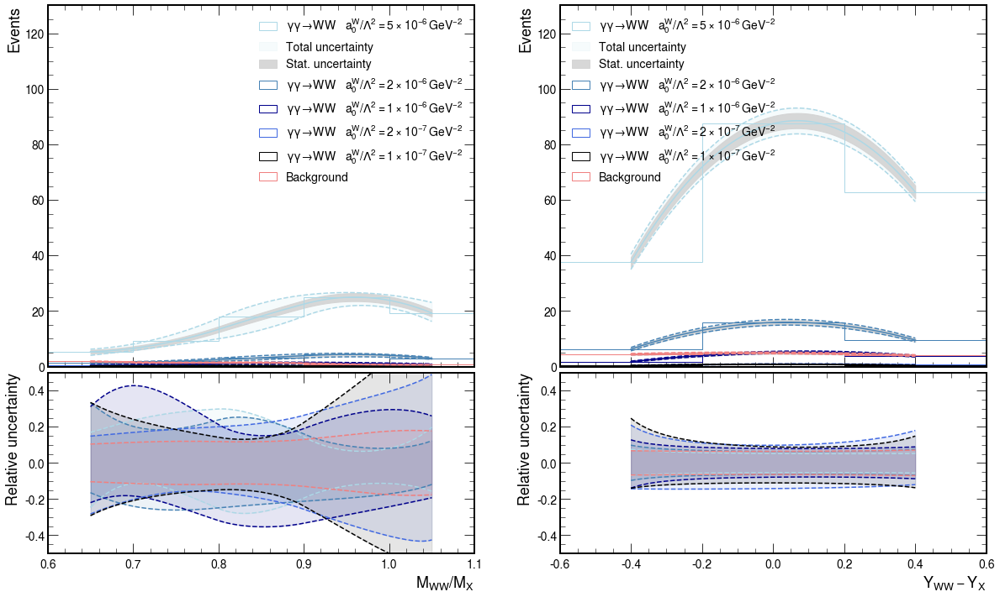

In [138]:
fig, axes_ = plt.subplots( 1, 2, figsize=( 2*10,( 1.5*8 ) ) )

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider0_ = make_axes_locatable( axes_[ 0 ] )
divider1_ = make_axes_locatable( axes_[ 1 ] )
axes = Obj2D()
axes.obj_[0].append( axes_[ 0 ] )
axes.obj_[0].append( axes_[ 1 ] )
axes.obj_[1].append( divider0_.append_axes( "bottom", size="50%", pad=0.10 ) )
axes.obj_[1].append( divider1_.append_axes( "bottom", size="50%", pad=0.10 ) )

plot_signal_a0w( axes=axes )

color_ = 'lightcoral'

# counts__ = None
# err__ = None
# bins__ = None
# max_variations_total__ = None
# min_variations_total__ = None
spline_nom_ = {}
spline_max_ = {}
spline_min_ = {}
spline_max_err_ = {}
spline_min_err_ = {}
spline_nom_arr_ = {}
spline_max_arr_ = {}
spline_min_arr_ = {}
spline_max_err_arr_ = {}
spline_min_err_arr_ = {}
idx_row_ = 0
idx_col_ = 0
for var__ in vars_:
    print ( var__ )
    idx_row_ = 0
    if bkg_MC_mix_protons:
        arr_list__ = []
        weights_list__ = []
        for label_ in labels_bkg_plot:
            df__ = df_protons_multiRP_bkg_events[ label_ ][ "_nom" ]
        weights__ = ( df__[ "norm" ] )
        arr__ = df__[ var__ + "_nom" ]  
        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        arr_list__.append(arr__)
        weights_list__.append(weights__)
        arr__ = pd.concat(arr_list__)
        weights__ = pd.concat(weights_list__)

    if not bkg_MC_mix_protons:
        df__ = df_protons_multiRP_bkg_events
        weights__ = ( df__[ "norm" ] )
        arr__ = df__[ var__ + "_nom" ]  
        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        
#     df__ = df_protons_multiRP_bkg_events
#     weights__ = ( df__[ "norm" ] )
#     arr__ = df__[ var__ + "_nom" ]  
#     arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
#     msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
#     arr__ = arr__.loc[ msk__ ]
#     weights__ = weights__.loc[ msk__ ]

    sum_w_, bins_ = np.histogram( arr__, weights=weights__,
                                  bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
    sum_w2_, __ = np.histogram( arr__, weights=( weights__ ** 2 ),
                                bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )

    __max_err__ = ( sum_w_ + np.sqrt( sum_w2_ ) )
    __min_err__ = ( sum_w_ - np.sqrt( sum_w2_ ) )

    __max__ = ( sum_w_ + np.sqrt( sum_w2_ ) ) 
    __min__ = ( sum_w_ - np.sqrt( sum_w2_ ) )
    
    print ( sum_w_ )
    print ( __max_err__ )
    print ( __min_err__ )
    print ( __max__ )
    print ( __min__ )
#     counts__[ var__ ] = sum_w_
#     err__[ var__ ] = np.sqrt( sum_w2_ )
#     bins__[ var__ ] = bins_
#     max_variations_total__[ var__ ] = __max__
#     min_variations_total__[ var__ ] = __min__

    bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

    axes[idx_row_,idx_col_].hist( bin_centers_, weights=sum_w_,
                                  histtype='step', color=color_, linestyle="-",
                                  bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ], label="Background" )

    spline_nom_[ var__ ] = make_interp_spline( bin_centers_, sum_w_, k=2 )
    spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
    spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
    spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
    spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
    x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
    spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
    spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
    spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
    spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
    spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

    axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
    axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
    axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
#     axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10, label="Background" )
    axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
    axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90 )
#     axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
#     axes[idx_row_,idx_col_].set_ylim( ylim_ )
#     axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
#     axes[idx_row_,idx_col_].set_ylabel( "Events", fontsize=18 )
    axes[idx_row_,idx_col_].legend( loc='best', fontsize=14 )
    
    idx_row_ = 1
    if relative_uncertainty_:
        ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
        ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
        ratio_max_sel_ = pd.Series( ratio_max_ )
        ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
        ratio_min_sel_ = pd.Series( ratio_min_ )
        ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
        print ( ratio_max_sel_, ratio_max_sel_.mean() )
        print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
        axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
#         axes[idx_row_,idx_col_].set_ylabel( "Relative uncertainty", fontsize=18 )
    else:
        diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
        diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
        axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
#         axes[idx_row_,idx_col_].set_ylabel( "Uncertainty", fontsize=18 )
#     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
#     axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
#     axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
#     axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
    idx_col_ += 1
    
if save_figures:
    if lepton_type == 'muon':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Muon_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Electron_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW2e-5
R_MWW_MX
0      0.208163
1      0.209724
2      0.211341
3      0.213011
4      0.214731
         ...   
195    0.203698
196    0.213139
197    0.223078
198    0.233548
199    0.244580
Length: 200, dtype: float64 0.20396380160637265
0     -0.182195
1     -0.179981
2     -0.177902
3     -0.175962
4     -0.174161
         ...   
195   -0.101866
196   -0.100936
197   -0.099998
198   -0.099050
199   -0.098091
Length: 200, dtype: float64 -0.18343043402364284
Diff_YWW_YX
0      0.080028
1      0.078649
2      0.077359
3      0.076149
4      0.075012
         ...   
195    0.056890
196    0.057157
197    0.057433
198    0.057719
199    0.058016
Length: 200, dtype: float64 0.054536283428637325
0     -0.071063
1     -0.070242
2     -0.069474
3     -0.068754
4     -0.068078
         ...   
195   -0.059683
196   -0.059894
197   -0.060112
198   -0.060337
199   -0.060571
Length: 200, dtype: float64 -0.05655802256512582
GGToWW-AQGC-2018-electron-ACW8e-6
R_MWW_MX
0  

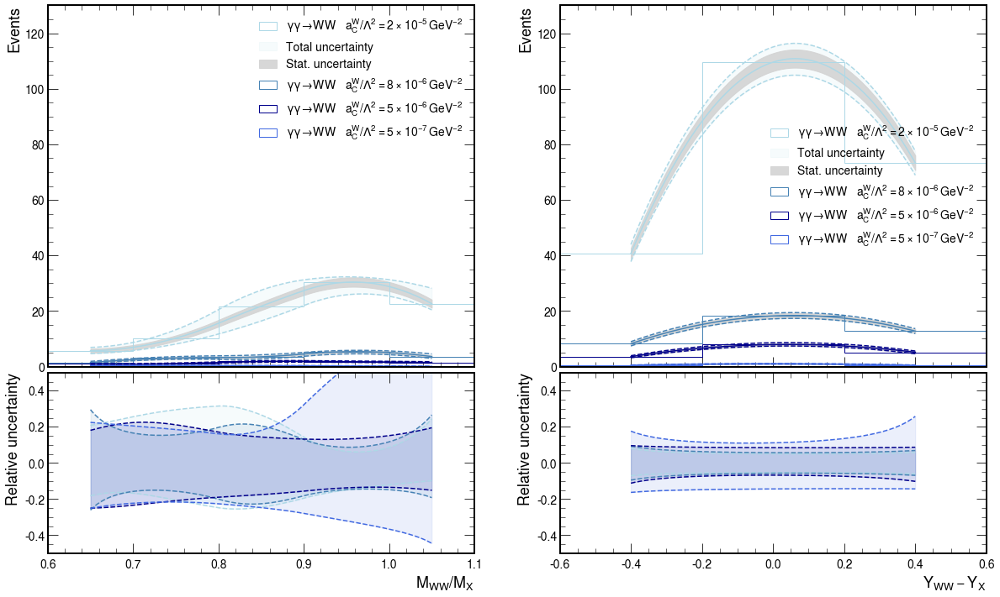

In [139]:
relative_uncertainty_ = True

# ylim_ = (0.,5.)
# ylim_ = (0.,3.)
# ylim_ = (0.,0.60)
ylim_ = (0.,130.)
ylim_ratio_ = (-0.50,0.50)

yscale_=None
# yscale_='log'

colors = [ "lightblue", "steelblue", "darkblue", "royalblue", "black" ]

# fig, axes = plt.subplots( 2, 2, figsize=(2*10,2*8) )
fig, axes_ = plt.subplots( 1, 2, figsize=( 2*10,( 1.5*8 ) ) )

class Obj2D:
    def __init__( self ):
        self.obj_ = [ [], [] ]
    def __getitem__( self, idx ):
        if isinstance( idx, tuple ): return self.obj_[ idx[0] ][ idx[1] ]
        else : return self.obj_[ idx ]

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider0_ = make_axes_locatable( axes_[ 0 ] )
divider1_ = make_axes_locatable( axes_[ 1 ] )
axes = Obj2D()
axes.obj_[0].append( axes_[ 0 ] )
axes.obj_[0].append( axes_[ 1 ] )
axes.obj_[1].append( divider0_.append_axes( "bottom", size="50%", pad=0.10 ) )
axes.obj_[1].append( divider1_.append_axes( "bottom", size="50%", pad=0.10 ) )

def plot_signal_aCw( axes ):
    for idx_label_, label_ in enumerate( labels_signals[:4:-1] ):
        print ( label_ )
        color_ = colors[ idx_label_ ]

        spline_nom_ = {}
        spline_max_ = {}
        spline_min_ = {}
        spline_max_err_ = {}
        spline_min_err_ = {}
        spline_nom_arr_ = {}
        spline_max_arr_ = {}
        spline_min_arr_ = {}
        spline_max_err_arr_ = {}
        spline_min_err_arr_ = {}

        idx_row_ = 0
        idx_col_ = 0
        for var__ in vars_:
            print ( var__ )
            idx_row_ = 0
            counts_ = counts[ label_ ][ var__ ]
            err_ = err[ label_ ][ var__ ]
            bins_ = bins[ label_ ][ var__ ]
            __max_err__ = ( counts_ + err_ )
            __min_err__ = ( counts_ - err_ )
            __max__ = max_variations_total[ label_ ][ var__ ]
            __min__ = min_variations_total[ label_ ][ var__ ]

            bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

            axes[idx_row_,idx_col_].hist( bin_centers_, weights=counts_,
                                          histtype='step', color=color_, linestyle="-", label=labels_samples[ label_ ],
                                          bins=bins_ )

            spline_nom_[ var__ ] = make_interp_spline( bin_centers_, counts_, k=2 )
            spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
            spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
            spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
            spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
            x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
            spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
            spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
            spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
            spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
            spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

            axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
            axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
            axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
            __label_0 = None
            __label_1 = None
            if idx_label_ == 0:
                __label_0 = "Total uncertainty"
                __label_1 = "Stat. uncertainty"
            axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10, label=__label_0 )
            axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90, label=__label_1 )
            axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
            axes[idx_row_,idx_col_].set_ylim( ylim_ )
    #         axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
            axes[idx_row_,idx_col_].get_xaxis().set_ticklabels( [] )
            axes[idx_row_,idx_col_].set_ylabel( "Events", fontsize=18 )
            if yscale_:
                axes[idx_row_,idx_col_].set_ylim( bottom=0.01 )
                axes[idx_row_,idx_col_].set_yscale( yscale_ )
            axes[idx_row_,idx_col_].legend( loc='best', fontsize=14 )

            idx_row_ = 1
            if relative_uncertainty_:
                ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
                ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
                ratio_max_sel_ = pd.Series( ratio_max_ )
                ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
                ratio_min_sel_ = pd.Series( ratio_min_ )
                ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
                print ( ratio_max_sel_, ratio_max_sel_.mean() )
                print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
                axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
                axes[idx_row_,idx_col_].set_ylabel( "Relative uncertainty", fontsize=18 )
            else:
                diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
                diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
                axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
                axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
                axes[idx_row_,idx_col_].set_ylabel( "Uncertainty", fontsize=18 )
        #     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
            axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
            axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
            axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
            idx_col_ += 1

plot_signal_aCw( axes=axes )

if save_figures:
    if lepton_type == 'muon':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Muon_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electroElectron':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-log-Electron_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Systematics-Electron_2018.png", bbox_inches='tight' )

GGToWW-AQGC-2018-electron-ACW2e-5
R_MWW_MX
0      0.208163
1      0.209724
2      0.211341
3      0.213011
4      0.214731
         ...   
195    0.203698
196    0.213139
197    0.223078
198    0.233548
199    0.244580
Length: 200, dtype: float64 0.20396380160637265
0     -0.182195
1     -0.179981
2     -0.177902
3     -0.175962
4     -0.174161
         ...   
195   -0.101866
196   -0.100936
197   -0.099998
198   -0.099050
199   -0.098091
Length: 200, dtype: float64 -0.18343043402364284
Diff_YWW_YX
0      0.080028
1      0.078649
2      0.077359
3      0.076149
4      0.075012
         ...   
195    0.056890
196    0.057157
197    0.057433
198    0.057719
199    0.058016
Length: 200, dtype: float64 0.054536283428637325
0     -0.071063
1     -0.070242
2     -0.069474
3     -0.068754
4     -0.068078
         ...   
195   -0.059683
196   -0.059894
197   -0.060112
198   -0.060337
199   -0.060571
Length: 200, dtype: float64 -0.05655802256512582
GGToWW-AQGC-2018-electron-ACW8e-6
R_MWW_MX
0  

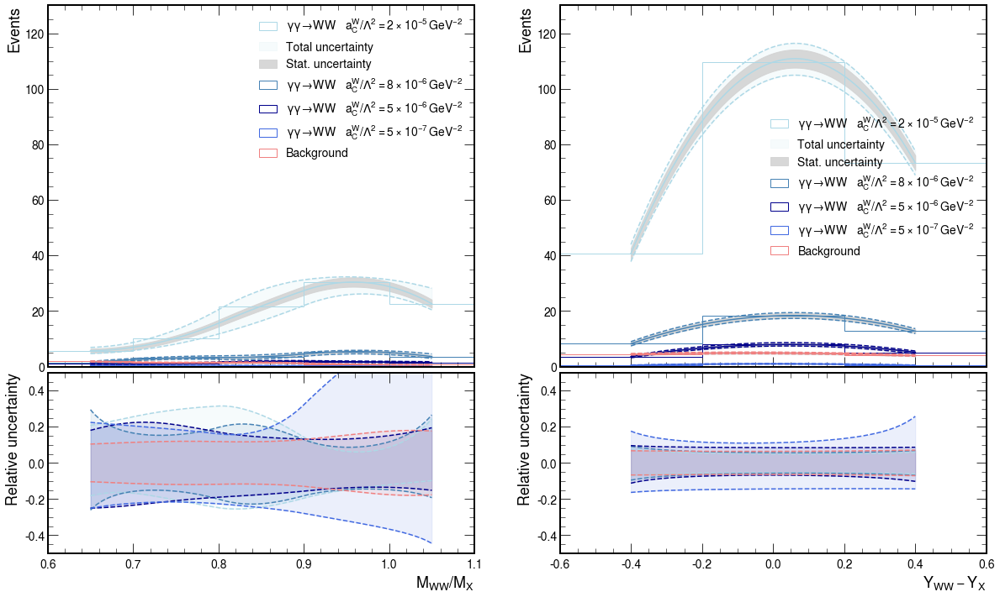

In [140]:
fig, axes_ = plt.subplots( 1, 2, figsize=( 2*10,( 1.5*8 ) ) )

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider0_ = make_axes_locatable( axes_[ 0 ] )
divider1_ = make_axes_locatable( axes_[ 1 ] )
axes = Obj2D()
axes.obj_[0].append( axes_[ 0 ] )
axes.obj_[0].append( axes_[ 1 ] )
axes.obj_[1].append( divider0_.append_axes( "bottom", size="50%", pad=0.10 ) )
axes.obj_[1].append( divider1_.append_axes( "bottom", size="50%", pad=0.10 ) )

plot_signal_aCw( axes=axes )

color_ = 'lightcoral'

# counts__ = None
# err__ = None
# bins__ = None
# max_variations_total__ = None
# min_variations_total__ = None
spline_nom_ = {}
spline_max_ = {}
spline_min_ = {}
spline_max_err_ = {}
spline_min_err_ = {}
spline_nom_arr_ = {}
spline_max_arr_ = {}
spline_min_arr_ = {}
spline_max_err_arr_ = {}
spline_min_err_arr_ = {}
idx_row_ = 0
idx_col_ = 0
for var__ in vars_:
    print ( var__ )
    idx_row_ = 0
    if bkg_MC_mix_protons:
        arr_list__ = []
        weights_list__ = []
        for label_ in labels_bkg_plot:
            df__ = df_protons_multiRP_bkg_events[ label_ ][ "_nom" ]
        weights__ = ( df__[ "norm" ] )
        arr__ = df__[ var__ + "_nom" ]  
        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        arr_list__.append(arr__)
        weights_list__.append(weights__)
        arr__ = pd.concat(arr_list__)
        weights__ = pd.concat(weights_list__)

    if not bkg_MC_mix_protons:
        df__ = df_protons_multiRP_bkg_events
        weights__ = ( df__[ "norm" ] )
        arr__ = df__[ var__ + "_nom" ]  
        arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
        msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
        arr__ = arr__.loc[ msk__ ]
        weights__ = weights__.loc[ msk__ ]
        
#     df__ = df_protons_multiRP_bkg_events
#     weights__ = ( df__[ "norm" ] )
#     arr__ = df__[ var__ + "_nom" ]  
#     arr_Diff_YWW_YX__ = df__[ "Diff_YWW_YX" + "_nom" ]
#     msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) )
#     arr__ = arr__.loc[ msk__ ]
#     weights__ = weights__.loc[ msk__ ]

    sum_w_, bins_ = np.histogram( arr__, weights=weights__,
                                  bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )
    sum_w2_, __ = np.histogram( arr__, weights=( weights__ ** 2 ),
                                bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ] )

    __max_err__ = ( sum_w_ + np.sqrt( sum_w2_ ) )
    __min_err__ = ( sum_w_ - np.sqrt( sum_w2_ ) )

    __max__ = ( sum_w_ + np.sqrt( sum_w2_ ) ) 
    __min__ = ( sum_w_ - np.sqrt( sum_w2_ ) )
    
    print ( sum_w_ )
    print ( __max_err__ )
    print ( __min_err__ )
    print ( __max__ )
    print ( __min__ )
#     counts__[ var__ ] = sum_w_
#     err__[ var__ ] = np.sqrt( sum_w2_ )
#     bins__[ var__ ] = bins_
#     max_variations_total__[ var__ ] = __max__
#     min_variations_total__[ var__ ] = __min__

    bin_centers_ = ( bins_[:-1] + bins_[1:] ) / 2

    axes[idx_row_,idx_col_].hist( bin_centers_, weights=sum_w_,
                                  histtype='step', color=color_, linestyle="-",
                                  bins=vars_[ var__ ][ "bins" ], range=vars_[ var__ ][ "range" ], label="Background" )

    spline_nom_[ var__ ] = make_interp_spline( bin_centers_, sum_w_, k=2 )
    spline_max_[ var__ ] = make_interp_spline( bin_centers_, __max__, k=2 )
    spline_min_[ var__ ] = make_interp_spline( bin_centers_, __min__, k=2 )
    spline_max_err_[ var__ ] = make_interp_spline( bin_centers_, __max_err__, k=2 )
    spline_min_err_[ var__ ] = make_interp_spline( bin_centers_, __min_err__, k=2 )
    x_plot__ = np.linspace( bin_centers_[0], bin_centers_[-1], 200 )
    spline_nom_arr_[ var__ ] = spline_nom_[ var__ ]( x_plot__ )
    spline_max_arr_[ var__ ] = spline_max_[ var__ ]( x_plot__ )
    spline_min_arr_[ var__ ] = spline_min_[ var__ ]( x_plot__ )
    spline_max_err_arr_[ var__ ] = spline_max_err_[ var__ ]( x_plot__ )
    spline_min_err_arr_[ var__ ] = spline_min_err_[ var__ ]( x_plot__ )

    axes[idx_row_,idx_col_].plot( x_plot__, spline_nom_arr_[ var__ ], color=color_, linestyle="-" )
    axes[idx_row_,idx_col_].plot( x_plot__, spline_max_arr_[ var__ ], color=color_, linestyle="--" )
    axes[idx_row_,idx_col_].plot( x_plot__, spline_min_arr_[ var__ ], color=color_, linestyle="--" )
#     axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10, label="Background" )
    axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_arr_[ var__ ], spline_max_arr_[ var__ ], color=color_, alpha=0.10 )
    axes[idx_row_,idx_col_].fill_between( x_plot__, spline_min_err_arr_[ var__ ], spline_max_err_arr_[ var__ ], color='lightgrey', alpha=0.90 )
#     axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
#     axes[idx_row_,idx_col_].set_ylim( ylim_ )
#     axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
#     axes[idx_row_,idx_col_].set_ylabel( "Events", fontsize=18 )
    axes[idx_row_,idx_col_].legend( loc='best', fontsize=14 )
    
    idx_row_ = 1
    if relative_uncertainty_:
        ratio_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
        ratio_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] ) / spline_nom_arr_[ var__ ]
        ratio_max_sel_ = pd.Series( ratio_max_ )
        ratio_max_sel_ = ratio_max_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
        ratio_min_sel_ = pd.Series( ratio_min_ )
        ratio_min_sel_ = ratio_min_sel_[ ( x_plot__ >= vars_[ var__ ][ "xlim" ][0] ) & ( x_plot__ <= vars_[ var__ ][ "xlim" ][1] ) ]
        print ( ratio_max_sel_, ratio_max_sel_.mean() )
        print ( ratio_min_sel_, ratio_min_sel_.dropna().mean() )
        axes[idx_row_,idx_col_].plot( x_plot__, ratio_max_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, ratio_min_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, ratio_min_, ratio_max_, color=color_, alpha=0.10 )
#         axes[idx_row_,idx_col_].set_ylabel( "Relative uncertainty", fontsize=18 )
    else:
        diff_max_ = ( spline_max_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
        diff_min_ = ( spline_min_arr_[ var__ ] - spline_nom_arr_[ var__ ] )
        axes[idx_row_,idx_col_].plot( x_plot__, diff_max_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].plot( x_plot__, diff_min_, color=color_, linestyle="--" )
        axes[idx_row_,idx_col_].fill_between( x_plot__, diff_min_, diff_max_, color=color_, alpha=0.10 )
#         axes[idx_row_,idx_col_].set_ylabel( "Uncertainty", fontsize=18 )
#     axes[idx_row_,idx_col_].set_xlim( 0.5, 2. )
#     axes[idx_row_,idx_col_].set_xlim( vars_[ var__ ][ "xlim" ] )
#     axes[idx_row_,idx_col_].set_ylim( ylim_ratio_ )
#     axes[idx_row_,idx_col_].set_xlabel( vars_[ var__ ][ "xtitle" ], fontsize=18 )
    idx_col_ += 1
    
if save_figures:
    if lepton_type == 'muon':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Muon_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Muon_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Muon_2018.png", bbox_inches='tight' )
    if lepton_type == 'electron':
        if yscale_:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-log-Electron_2018.png", bbox_inches='tight' )
        else:
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Electron_2018.pdf", bbox_inches='tight' )
            plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics-Electron_2018.png", bbox_inches='tight' )

In [141]:
# axes[0,0].set_xlim( 0.6, 2.0 )
# axes[1,0].set_xlim( 0.6, 2.0 )
# axes[0,1].set_xlim( -1., 1. )
# axes[1,1].set_xlim( -1., 1. )
# axes[0,1].set_xlim( -0.60, 0.60 )
# axes[1,1].set_xlim( -0.60, 0.60 )
# axes[0,0].set_ylim( 0., 5. )
# axes[0,0].set_ylim( 0., 9. )
# axes[0,1].set_ylim( 0., 5. )
# axes[0,1].set_ylim( 0., 8. )
# axes[0,1].set_ylim( 0., 9. )
# axes[0,0].set_ylim( 0., 1. )
# axes[0,1].set_ylim( 0., 1. )
# axes[0,0].set_yscale( 'log' )
# axes[0,1].set_yscale( 'log' )
# axes[0,0].set_ylim( 0.01, 5. )
# # axes[0,1].set_ylim( 0.01, 5. )
# axes[0,1].set_ylim( 0.01, 8. )
# fig

In [142]:
# if save_figures:
#     plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics.pdf", bbox_inches='tight' )
#     plt.savefig( "plots/Cut-Based-Mass-Rapidity-Signal-Background-Systematics.png", bbox_inches='tight' )

In [143]:
labels_signals[5:]

['GGToWW-AQGC-2018-electron-ACW5e-7',
 'GGToWW-AQGC-2018-electron-ACW5e-6',
 'GGToWW-AQGC-2018-electron-ACW8e-6',
 'GGToWW-AQGC-2018-electron-ACW2e-5']

In [144]:
# var_name_lepton_id_up_ = ""
# var_name_lepton_id_dw_ = ""
# if lepton_type == 'muon':
#     var_name_lepton_id_up_ = "syst_up_sf_muon_id"
#     var_name_lepton_id_dw_ = "syst_dw_sf_muon_id"
# elif lepton_type == 'electron':
#     var_name_lepton_id_up_ = "syst_up_sf_electron_id"
#     var_name_lepton_id_dw_ = "syst_dw_sf_electron_id"
var_name_lepton_id_ = ""
if lepton_type == 'muon':
    var_name_lepton_id_ = "sf_muon_id"
elif lepton_type == 'electron':
    var_name_lepton_id_ = "sf_electron_id"
var_name_trigger_ = ""
if lepton_type == 'muon':
    var_name_trigger_ = "sf_muon_trigger"
elif lepton_type == 'electron':
    var_name_trigger_ = "sf_electron_trigger"

uncertainties_ = [ 'jes', 'jer', var_name_lepton_id_, var_name_trigger_, 'sf_prefiring', 'proton_scale', 'proton_eff' ]

for label__ in labels_signals:
    for unc__ in uncertainties_:
        label_unc__ = "syst_up_{}".format( unc__ )
        if sum_weights[ label__ ][ label_unc__ ] < 0.: sum_weights[ label__ ][ label_unc__ ] = np.float64( 0. )
        label_unc__ = "syst_dw_{}".format( unc__ )
        if sum_weights[ label__ ][ label_unc__ ] > 0.: sum_weights[ label__ ][ label_unc__ ] = np.float64( 0. )

    var_name_lepton_id_up__ = "syst_up_{}".format( var_name_lepton_id_ )
    var_name_trigger_up__ = "syst_up_{}".format( var_name_trigger_ )
    sum_weights[ label__ ][ "syst_up_total" ]    =  np.sqrt( sum_weights[ label__ ][ "syst_up_jes" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_up_jer" ] ** 2 +
                                                             sum_weights[ label__ ][ var_name_lepton_id_up__ ] ** 2 +
                                                             sum_weights[ label__ ][ var_name_trigger_up__ ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_up_sf_prefiring" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_up_proton_scale" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_up_proton_eff" ] ** 2
                                                          )
    var_name_lepton_id_dw__ = "syst_dw_{}".format( var_name_lepton_id_ )
    var_name_trigger_dw__ = "syst_dw_{}".format( var_name_trigger_ )
    sum_weights[ label__ ][ "syst_dw_total" ]    = -np.sqrt( sum_weights[ label__ ][ "syst_dw_jes" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_dw_jer" ] ** 2 +
                                                             sum_weights[ label__ ][ var_name_lepton_id_dw__ ] ** 2 +
                                                             sum_weights[ label__ ][ var_name_trigger_dw__ ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_dw_sf_prefiring" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_dw_proton_scale" ] ** 2 +
                                                             sum_weights[ label__ ][ "syst_dw_proton_eff" ] ** 2
                                                          )
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': 0.0, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': 0.0, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': 0.0, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': 0.0, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': 0.0, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678, 'syst_up_proton_scale_arm1': 0.2216551538219076, 'syst_dw_proton_scale_arm1': 0.0725013567603413, 'syst_up_proton_scale': 0.3309154410041523, 'syst_dw_proton_scale': -0.11751350142240241, 'syst_up_proton_eff': 0.17753453359455806, 'syst_dw_proton_eff': 0.0, 'syst_up_total': 0.5304353238154607, 'syst_dw_total': -0.11751350142240241}, 'GGToWW-AQGC-2018-electron-A0W2e-7': {'central': 0.5877197647288073, 'stat': 0.06173869279051326, 'syst_up_jes': 0.23

In [145]:
df_sum_weights__ = pd.DataFrame( sum_weights )
if lepton_type == "muon":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-ACW5e-7', 'GGToWW-AQGC-2018-muon-ACW5e-6', 'GGToWW-AQGC-2018-muon-ACW8e-6', 'GGToWW-AQGC-2018-muon-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-A0W1e-7', 'GGToWW-AQGC-2018-muon-A0W2e-7', 'GGToWW-AQGC-2018-muon-A0W1e-6', 'GGToWW-AQGC-2018-muon-A0W2e-6', 'GGToWW-AQGC-2018-muon-A0W5e-6'] )
if lepton_type == "electron":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-ACW5e-7', 'GGToWW-AQGC-2018-electron-ACW5e-6', 'GGToWW-AQGC-2018-electron-ACW8e-6', 'GGToWW-AQGC-2018-electron-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-A0W1e-7', 'GGToWW-AQGC-2018-electron-A0W2e-7', 'GGToWW-AQGC-2018-electron-A0W1e-6', 'GGToWW-AQGC-2018-electron-A0W2e-6', 'GGToWW-AQGC-2018-electron-A0W5e-6'] )
    
df_sum_weights__a0w

,GGToWW-AQGC-2018-electron-A0W1e-7,GGToWW-AQGC-2018-electron-A0W2e-7,GGToWW-AQGC-2018-electron-A0W1e-6,GGToWW-AQGC-2018-electron-A0W2e-6,GGToWW-AQGC-2018-electron-A0W5e-6
central,0.583257,0.587720,3.309025,10.495084,62.326725
stat,0.058699,0.061739,0.290952,0.589927,2.292294
syst_up_jes,0.161392,0.237927,5.405562,17.060165,108.776823
syst_dw_jes,0.000000,0.000000,0.000000,0.000000,0.000000
syst_up_jer,0.161392,0.238904,5.379104,16.960684,107.733995
syst_dw_jer,0.000000,0.000000,0.000000,0.000000,0.000000
syst_up_sf_electron_id,0.189228,0.268495,5.579387,17.598649,112.239974
syst_dw_sf_electron_id,0.000000,0.000000,0.000000,0.000000,0.000000
syst_up_sf_electron_trigger,0.162445,0.232407,5.387300,16.999512,107.993546
syst_dw_sf_electron_trigger,0.000000,0.000000,0.000000,0.000000,0.000000


In [146]:
df_sum_weights__aCw

,GGToWW-AQGC-2018-electron-ACW5e-7,GGToWW-AQGC-2018-electron-ACW5e-6,GGToWW-AQGC-2018-electron-ACW8e-6,GGToWW-AQGC-2018-electron-ACW2e-5
central,0.613520,5.094573,12.455239,74.733502
stat,0.072518,0.378631,0.660811,2.660707
syst_up_jes,0.275999,8.948999,21.363547,129.503795
syst_dw_jes,0.000000,0.000000,0.000000,0.000000
syst_up_jer,0.284551,8.948781,21.358918,128.054938
syst_dw_jer,0.000000,0.000000,0.000000,0.000000
syst_up_sf_electron_id,0.314629,9.279308,22.248851,131.740927
syst_dw_sf_electron_id,0.000000,0.000000,0.000000,0.000000
syst_up_sf_electron_trigger,0.277257,8.968641,21.406739,127.681571
syst_dw_sf_electron_trigger,0.000000,0.000000,0.000000,0.000000


In [147]:
# df_sum_weights__.iloc[ 1:, : ].divide( df_sum_weights__.iloc[ 0 ] ) * 100.

In [148]:
symmetrize_uncertainties = True
if symmetrize_uncertainties:
#     var_name_lepton_id_ = ""
#     if lepton_type == 'muon':
#         var_name_lepton_id_ = "sf_muon_id"
#     elif lepton_type == 'electron':
#         var_name_lepton_id_ = "sf_electron_id"

    uncertainties_ = [ 'jes', 'jer', var_name_lepton_id_, var_name_trigger_, 'sf_prefiring', 'proton_scale', 'proton_eff' ]
    
    for label__ in labels_signals:
        for unc__ in uncertainties_:
            label_unc_up__ = "syst_up_{}".format( unc__ )
            label_unc_dw__ = "syst_dw_{}".format( unc__ )
            unc_max__ = np.max( [ np.abs( sum_weights[ label__ ][ label_unc_up__ ] ) , np.abs( sum_weights[ label__ ][ label_unc_dw__ ] ) ] )
            sum_weights[ label__ ][ label_unc_up__ ] =  unc_max__
            sum_weights[ label__ ][ label_unc_dw__ ] = -unc_max__

        var_name_lepton_id_up__ = "syst_up_{}".format( var_name_lepton_id_ )
        sum_weights[ label__ ][ "syst_up_total" ]    =  np.sqrt( sum_weights[ label__ ][ "syst_up_jes" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_up_jer" ] ** 2 +
                                                                 sum_weights[ label__ ][ var_name_lepton_id_up__ ] ** 2 +
                                                                 sum_weights[ label__ ][ var_name_trigger_up__ ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_up_sf_prefiring" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_up_proton_scale" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_up_proton_eff" ] ** 2
                                                              )
        var_name_lepton_id_dw__ = "syst_dw_{}".format( var_name_lepton_id_ )
        sum_weights[ label__ ][ "syst_dw_total" ]    = -np.sqrt( sum_weights[ label__ ][ "syst_dw_jes" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_dw_jer" ] ** 2 +
                                                                 sum_weights[ label__ ][ var_name_lepton_id_dw__ ] ** 2 +
                                                                 sum_weights[ label__ ][ var_name_trigger_dw__ ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_dw_sf_prefiring" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_dw_proton_scale" ] ** 2 +
                                                                 sum_weights[ label__ ][ "syst_dw_proton_eff" ] ** 2
                                                              )
        sum_weights[ label__ ][ "syst_bkg" ] = -1.
        
print ( sum_weights )

{'GGToWW-AQGC-2018-electron-A0W1e-7': {'central': 0.5832571553818872, 'stat': 0.05869896003781442, 'syst_up_jes': 0.1613922851839915, 'syst_dw_jes': -0.1613922851839915, 'syst_up_jer': 0.1613922851839915, 'syst_dw_jer': -0.1613922851839915, 'syst_up_sf_electron_id': 0.18922785256068975, 'syst_dw_sf_electron_id': -0.18922785256068975, 'syst_up_sf_electron_trigger': 0.16244538682935872, 'syst_dw_sf_electron_trigger': -0.16244538682935872, 'syst_up_sf_prefiring': 0.1613922851839915, 'syst_dw_sf_prefiring': -0.1613922851839915, 'syst_up_proton_scale_arm0': 0.24571125712746478, 'syst_dw_proton_scale_arm0': 0.09248230254736678, 'syst_up_proton_scale_arm1': 0.2216551538219076, 'syst_dw_proton_scale_arm1': 0.0725013567603413, 'syst_up_proton_scale': 0.3309154410041523, 'syst_dw_proton_scale': -0.3309154410041523, 'syst_up_proton_eff': 0.17753453359455806, 'syst_dw_proton_eff': -0.17753453359455806, 'syst_up_total': 0.5304353238154607, 'syst_dw_total': -0.5304353238154607, 'syst_bkg': -1.0}, 'G

In [149]:
df_sum_weights__ = pd.DataFrame( sum_weights )
if lepton_type == "muon":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-ACW5e-7', 'GGToWW-AQGC-2018-muon-ACW5e-6', 'GGToWW-AQGC-2018-muon-ACW8e-6', 'GGToWW-AQGC-2018-muon-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-A0W1e-7', 'GGToWW-AQGC-2018-muon-A0W2e-7', 'GGToWW-AQGC-2018-muon-A0W1e-6', 'GGToWW-AQGC-2018-muon-A0W2e-6', 'GGToWW-AQGC-2018-muon-A0W5e-6'] )
if lepton_type == "electron":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-ACW5e-7', 'GGToWW-AQGC-2018-electron-ACW5e-6', 'GGToWW-AQGC-2018-electron-ACW8e-6', 'GGToWW-AQGC-2018-electron-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-A0W1e-7', 'GGToWW-AQGC-2018-electron-A0W2e-7', 'GGToWW-AQGC-2018-electron-A0W1e-6', 'GGToWW-AQGC-2018-electron-A0W2e-6', 'GGToWW-AQGC-2018-electron-A0W5e-6'] )
df_sum_weights__a0w

,GGToWW-AQGC-2018-electron-A0W1e-7,GGToWW-AQGC-2018-electron-A0W2e-7,GGToWW-AQGC-2018-electron-A0W1e-6,GGToWW-AQGC-2018-electron-A0W2e-6,GGToWW-AQGC-2018-electron-A0W5e-6
central,0.583257,0.587720,3.309025,10.495084,62.326725
stat,0.058699,0.061739,0.290952,0.589927,2.292294
syst_up_jes,0.161392,0.237927,5.405562,17.060165,108.776823
syst_dw_jes,-0.161392,-0.237927,-5.405562,-17.060165,-108.776823
syst_up_jer,0.161392,0.238904,5.379104,16.960684,107.733995
syst_dw_jer,-0.161392,-0.238904,-5.379104,-16.960684,-107.733995
syst_up_sf_electron_id,0.189228,0.268495,5.579387,17.598649,112.239974
syst_dw_sf_electron_id,-0.189228,-0.268495,-5.579387,-17.598649,-112.239974
syst_up_sf_electron_trigger,0.162445,0.232407,5.387300,16.999512,107.993546
syst_dw_sf_electron_trigger,-0.162445,-0.232407,-5.387300,-16.999512,-107.993546


In [150]:
df_sum_weights__aCw

,GGToWW-AQGC-2018-electron-ACW5e-7,GGToWW-AQGC-2018-electron-ACW5e-6,GGToWW-AQGC-2018-electron-ACW8e-6,GGToWW-AQGC-2018-electron-ACW2e-5
central,0.613520,5.094573,12.455239,74.733502
stat,0.072518,0.378631,0.660811,2.660707
syst_up_jes,0.275999,8.948999,21.363547,129.503795
syst_dw_jes,-0.275999,-8.948999,-21.363547,-129.503795
syst_up_jer,0.284551,8.948781,21.358918,128.054938
syst_dw_jer,-0.284551,-8.948781,-21.358918,-128.054938
syst_up_sf_electron_id,0.314629,9.279308,22.248851,131.740927
syst_dw_sf_electron_id,-0.314629,-9.279308,-22.248851,-131.740927
syst_up_sf_electron_trigger,0.277257,8.968641,21.406739,127.681571
syst_dw_sf_electron_trigger,-0.277257,-8.968641,-21.406739,-127.681571


In [165]:
if bkg_MC_mix_protons:
    weights_list__ = []
    for label_ in labels_bkg_plot:
        df__ = df_protons_multiRP_bkg_events[ label_ ][ "_nom" ]
    weights__ = ( df__[ "norm" ] )
    weights_list__.append(weights__)
    weights__ = pd.concat(weights_list__)
    
if not bkg_MC_mix_protons:
    df__ = df_protons_multiRP_bkg_events
    weights__ = ( df__[ "norm" ] )
        
# df__ = df_protons_multiRP_bkg_events
# weights__ = ( df__[ "norm" ] )
weights_squared__ = ( weights__ ** 2 )
arr_R_MWW_MX__ = df__.loc[ :, "R_MWW_MX" + "_nom" ]
arr_Diff_YWW_YX__ = df__.loc[ :, "Diff_YWW_YX" + "_nom" ]
if not upper_mass_ratio_cut:
    msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) & ( arr_R_MWW_MX__ >= 0.80 ) )
if upper_mass_ratio_cut:
    msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 0.60 ) & ( arr_R_MWW_MX__ >= 0.80 ) & ( arr_R_MWW_MX__ <= 1.1 ) )
# msk__ = ( ( np.abs( arr_Diff_YWW_YX__ ) <= 1.00 ) & ( arr_R_MWW_MX__ >= 0.40 ) )
sum_weights_cut__ = np.sum( weights__.loc[ msk__ ] )
sum_weights_squared_cut__ = np.sum( weights_squared__.loc[ msk__ ] )
print ( "{} ± {}".format( sum_weights_cut__, np.sqrt( sum_weights_squared_cut__ ) ) )

5.6 ± 0.33466401061363027


In [152]:
df_sum_weights__[ "Background" ] = -1.
df_sum_weights__[ "Background" ][ "central" ] = sum_weights_cut__
df_sum_weights__[ "Background" ][ "stat" ] = np.sqrt( sum_weights_squared_cut__ )
if lepton_type == "muon":
    df_sum_weights__[ "Background" ][ "syst_bkg" ] = sum_weights_cut__ - 4.337433864600599
if lepton_type == "electron":
    df_sum_weights__[ "Background" ][ "syst_bkg" ] = sum_weights_cut__ - 4.36257665421131
df_sum_weights__

,GGToWW-AQGC-2018-electron-A0W1e-7,GGToWW-AQGC-2018-electron-A0W2e-7,GGToWW-AQGC-2018-electron-A0W1e-6,GGToWW-AQGC-2018-electron-A0W2e-6,GGToWW-AQGC-2018-electron-A0W5e-6,GGToWW-AQGC-2018-electron-ACW5e-7,GGToWW-AQGC-2018-electron-ACW5e-6,GGToWW-AQGC-2018-electron-ACW8e-6,GGToWW-AQGC-2018-electron-ACW2e-5,Background
central,0.583257,0.587720,3.309025,10.495084,62.326725,0.613520,5.094573,12.455239,74.733502,2.920000
stat,0.058699,0.061739,0.290952,0.589927,2.292294,0.072518,0.378631,0.660811,2.660707,0.241661
syst_up_jes,0.161392,0.237927,5.405562,17.060165,108.776823,0.275999,8.948999,21.363547,129.503795,-1.000000
syst_dw_jes,-0.161392,-0.237927,-5.405562,-17.060165,-108.776823,-0.275999,-8.948999,-21.363547,-129.503795,-1.000000
syst_up_jer,0.161392,0.238904,5.379104,16.960684,107.733995,0.284551,8.948781,21.358918,128.054938,-1.000000
syst_dw_jer,-0.161392,-0.238904,-5.379104,-16.960684,-107.733995,-0.284551,-8.948781,-21.358918,-128.054938,-1.000000
syst_up_sf_electron_id,0.189228,0.268495,5.579387,17.598649,112.239974,0.314629,9.279308,22.248851,131.740927,-1.000000
syst_dw_sf_electron_id,-0.189228,-0.268495,-5.579387,-17.598649,-112.239974,-0.314629,-9.279308,-22.248851,-131.740927,-1.000000
syst_up_sf_electron_trigger,0.162445,0.232407,5.387300,16.999512,107.993546,0.277257,8.968641,21.406739,127.681571,-1.000000
syst_dw_sf_electron_trigger,-0.162445,-0.232407,-5.387300,-16.999512,-107.993546,-0.277257,-8.968641,-21.406739,-127.681571,-1.000000


In [153]:
if lepton_type == "muon":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-ACW5e-7', 'GGToWW-AQGC-2018-muon-ACW5e-6', 'GGToWW-AQGC-2018-muon-ACW8e-6', 'GGToWW-AQGC-2018-muon-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-muon-A0W1e-7', 'GGToWW-AQGC-2018-muon-A0W2e-7', 'GGToWW-AQGC-2018-muon-A0W1e-6', 'GGToWW-AQGC-2018-muon-A0W2e-6', 'GGToWW-AQGC-2018-muon-A0W5e-6'] )
if lepton_type == "electron":
    df_sum_weights__a0w = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-ACW5e-7', 'GGToWW-AQGC-2018-electron-ACW5e-6', 'GGToWW-AQGC-2018-electron-ACW8e-6', 'GGToWW-AQGC-2018-electron-ACW2e-5'] )
    df_sum_weights__aCw = df_sum_weights__.drop( columns=['GGToWW-AQGC-2018-electron-A0W1e-7', 'GGToWW-AQGC-2018-electron-A0W2e-7', 'GGToWW-AQGC-2018-electron-A0W1e-6', 'GGToWW-AQGC-2018-electron-A0W2e-6', 'GGToWW-AQGC-2018-electron-A0W5e-6'] )
df_sum_weights__a0w

,GGToWW-AQGC-2018-electron-A0W1e-7,GGToWW-AQGC-2018-electron-A0W2e-7,GGToWW-AQGC-2018-electron-A0W1e-6,GGToWW-AQGC-2018-electron-A0W2e-6,GGToWW-AQGC-2018-electron-A0W5e-6,Background
central,0.583257,0.587720,3.309025,10.495084,62.326725,2.920000
stat,0.058699,0.061739,0.290952,0.589927,2.292294,0.241661
syst_up_jes,0.161392,0.237927,5.405562,17.060165,108.776823,-1.000000
syst_dw_jes,-0.161392,-0.237927,-5.405562,-17.060165,-108.776823,-1.000000
syst_up_jer,0.161392,0.238904,5.379104,16.960684,107.733995,-1.000000
syst_dw_jer,-0.161392,-0.238904,-5.379104,-16.960684,-107.733995,-1.000000
syst_up_sf_electron_id,0.189228,0.268495,5.579387,17.598649,112.239974,-1.000000
syst_dw_sf_electron_id,-0.189228,-0.268495,-5.579387,-17.598649,-112.239974,-1.000000
syst_up_sf_electron_trigger,0.162445,0.232407,5.387300,16.999512,107.993546,-1.000000
syst_dw_sf_electron_trigger,-0.162445,-0.232407,-5.387300,-16.999512,-107.993546,-1.000000


In [154]:
df_sum_weights__aCw

,GGToWW-AQGC-2018-electron-ACW5e-7,GGToWW-AQGC-2018-electron-ACW5e-6,GGToWW-AQGC-2018-electron-ACW8e-6,GGToWW-AQGC-2018-electron-ACW2e-5,Background
central,0.613520,5.094573,12.455239,74.733502,2.920000
stat,0.072518,0.378631,0.660811,2.660707,0.241661
syst_up_jes,0.275999,8.948999,21.363547,129.503795,-1.000000
syst_dw_jes,-0.275999,-8.948999,-21.363547,-129.503795,-1.000000
syst_up_jer,0.284551,8.948781,21.358918,128.054938,-1.000000
syst_dw_jer,-0.284551,-8.948781,-21.358918,-128.054938,-1.000000
syst_up_sf_electron_id,0.314629,9.279308,22.248851,131.740927,-1.000000
syst_dw_sf_electron_id,-0.314629,-9.279308,-22.248851,-131.740927,-1.000000
syst_up_sf_electron_trigger,0.277257,8.968641,21.406739,127.681571,-1.000000
syst_dw_sf_electron_trigger,-0.277257,-8.968641,-21.406739,-127.681571,-1.000000


In [155]:
df_sum_weights__a0w.iloc[ 1:, : ].where( ~( df_sum_weights__a0w.iloc[ 1:, : ] != -1. ) , df_sum_weights__a0w.iloc[ 1:, : ].divide( df_sum_weights__a0w.iloc[ 0 ] ) * 100. )

,GGToWW-AQGC-2018-electron-A0W1e-7,GGToWW-AQGC-2018-electron-A0W2e-7,GGToWW-AQGC-2018-electron-A0W1e-6,GGToWW-AQGC-2018-electron-A0W2e-6,GGToWW-AQGC-2018-electron-A0W5e-6,Background
stat,10.063993,10.504784,8.792694,5.620988,3.677867,8.276059
syst_up_jes,27.670862,40.483090,163.358175,162.553860,174.526776,-1.000000
syst_dw_jes,-27.670862,-40.483090,-163.358175,-162.553860,-174.526776,-1.000000
syst_up_jer,27.670862,40.649311,162.558583,161.605977,172.853612,-1.000000
syst_dw_jer,-27.670862,-40.649311,-162.558583,-161.605977,-172.853612,-1.000000
syst_up_sf_electron_id,32.443297,45.684205,168.611209,167.684679,180.083222,-1.000000
syst_dw_sf_electron_id,-32.443297,-45.684205,-168.611209,-167.684679,-180.083222,-1.000000
syst_up_sf_electron_trigger,27.851418,39.543871,162.806291,161.975946,173.270048,-1.000000
syst_dw_sf_electron_trigger,-27.851418,-39.543871,-162.806291,-161.975946,-173.270048,-1.000000
syst_up_sf_prefiring,27.670862,39.346804,162.435149,161.605977,172.884130,-1.000000


In [156]:
df_sum_weights__aCw.iloc[ 1:, : ].where( ~( df_sum_weights__aCw.iloc[ 1:, : ] != -1. ) , df_sum_weights__aCw.iloc[ 1:, : ].divide( df_sum_weights__aCw.iloc[ 0 ] ) * 100. )

,GGToWW-AQGC-2018-electron-ACW5e-7,GGToWW-AQGC-2018-electron-ACW5e-6,GGToWW-AQGC-2018-electron-ACW8e-6,GGToWW-AQGC-2018-electron-ACW2e-5,Background
stat,11.820034,7.432046,5.305485,3.560260,8.276059
syst_up_jes,44.986090,175.657514,171.522581,173.287470,-1.000000
syst_dw_jes,-44.986090,-175.657514,-171.522581,-173.287470,-1.000000
syst_up_jer,46.380023,175.653228,171.485418,171.348772,-1.000000
syst_dw_jer,-46.380023,-175.653228,-171.485418,-171.348772,-1.000000
syst_up_sf_electron_id,51.282620,182.141059,178.630464,176.280950,-1.000000
syst_dw_sf_electron_id,-51.282620,-182.141059,-178.630464,-176.280950,-1.000000
syst_up_sf_electron_trigger,45.191135,176.043061,171.869357,170.849175,-1.000000
syst_dw_sf_electron_trigger,-45.191135,-176.043061,-171.869357,-170.849175,-1.000000
syst_up_sf_prefiring,44.986090,175.653228,171.485418,170.466677,-1.000000


In [157]:
save_table_systematics = True

if save_table_systematics:
    file_path_a0w_ = ""
    file_path_aCw_ = ""
    file_str_ = "table_systematics"
    if norm_to_1fb:
        file_str_ += "-norm_to_1fb"
    if data_sample == '2017':
        if lepton_type == 'muon':
            file_path_a0w_ = file_str_ + "-a0w-2017-muon" + ".h5"
            file_path_aCw_ = file_str_ + "-aCw-2017-muon" + ".h5"
        elif lepton_type == 'electron':
            file_path_a0w_ = file_str_ + "-a0w-2017-electron" + ".h5"
            file_path_aCw_ = file_str_ + "-aCw-2017-electron" + ".h5"
    elif data_sample == '2018':
        if lepton_type == 'muon':
            file_path_a0w_ = file_str_ + "-a0w-2018-muon" + ".h5"
            file_path_aCw_ = file_str_ + "-aCw-2018-muon" + ".h5"
        elif lepton_type == 'electron':
            file_path_a0w_ = file_str_ + "-a0w-2018-electron" + ".h5"
            file_path_aCw_ = file_str_ + "-aCw-2018-electron" + ".h5"

    with pd.HDFStore( file_path_a0w_, 'w' ) as store_:
        store_[ "table_systematics" ] = df_sum_weights__a0w
        
    with pd.HDFStore( file_path_aCw_, 'w' ) as store_:
        store_[ "table_systematics" ] = df_sum_weights__aCw

In [158]:
if save_table_systematics:
    with pd.HDFStore( file_path_a0w_, 'r' ) as store_:
        print ( list( store_ ) )
    with pd.HDFStore( file_path_aCw_, 'r' ) as store_:
        print ( list( store_ ) )

['/table_systematics']
['/table_systematics']


In [159]:
# arrays = [
#     ["bar","bar","foo","foo","baz","baz"],
#     ["one","one","two","two","one","one"]
# ]
# index = pd.MultiIndex.from_arrays(arrays, names=["first", "second"])
# df = pd.DataFrame( np.arange( 6*2 ).reshape( 6, 2 ), index=index, columns=['A','B'] )
# df_groupby = df.groupby( ["first","second"] )
# for name, group in df_groupby:
#     print ( name )
#     print ( group )
# df_groupby_apply_ = df_groupby.apply( lambda df__: ( df__['A'].iloc[0] * df__['B'].iloc[1] ) )
# print ( df_groupby_apply_ )
# df_nonduplicated = df[ ~df.index.duplicated(keep='first') ]
# df_nonduplicated.loc[ :, 'C' ] = df_groupby_apply_
# df_nonduplicated

In [160]:
# arrays = [
#     [ "bar", "bar", "bar", "foo", "foo", "foo", "baz" ],
#     [ "one", "two", "two", "one", "one", "two", "one" ]
# ]
# index = pd.MultiIndex.from_arrays(arrays, names=["first", "second"])
# df = pd.DataFrame( np.arange( 7*2 ).reshape( 7, 2 ), index=index, columns=['A','B'] )
# df = df.reset_index().set_index( ["first"] )
# print ( df )
# df_groupby = df.groupby( [ "first", "second" ] )
# # df_groupby = df.groupby( [ "first" ] )
# for name, group in df_groupby:
#     print ( name )
#     print ( group )
# # df_groupby_A_min = df_groupby[ "A" ].min()
# # print ( df_groupby_A_min )
# # df_groupby_A_max = df_groupby[ "A" ].max()
# # print ( df_groupby_A_max )
# # df_groupby_A_min.loc[ ("foo", "two") ]
# msk__ = df_groupby[ 'A' ].transform( lambda s__: ( s__ == s__.min() ) )
# print ( msk__ )
# df[ msk__ ]

In [161]:
# help( df_groupby.transform )

In [162]:
# from scipy.interpolate import make_interp_spline
# np.info( make_interp_spline )

In [163]:
# import mpl_toolkits.axes_grid1
# dir( mpl_toolkits.axes_grid1 )
# fig_ = plt.figure()
# divider_ = mpl_toolkits.axes_grid1.make_axes_locatable( plt.gca() )
# divider_
# help( mpl_toolkits.axes_grid1.axes_divider.AxesDivider )